# Influence of the genetic background on murine gut microbiome composition and diversity over five generations

The main goal of this study is to study the gut and skin microbiome of C75BL/6J and BALB/c mice, which have been naturally colonised with the same microbiome simultaneously.To achieve this the mice were born and weaned by B6CF1 foster mothers. The aim is to determine whether the genotype of the mice will have an impact on their microbiome. Therefore, the mice have been bred over 5 generations and kept in identical housing with identical breeding procedures, to minimise external effects on the microbiome. Additionally, sex and cage environment have been recorded during the experiment, to evaluate if they play a role in the composition of the microbiome as well.

This analysis aims to explore the differences and similarities of the mice microbiomes. It focuses on the calculation of alpha and beta diversities (Shannon, Faith's PD, observed OTUs, unweighted UniFrac) to carve out whether the genotype of a mouse has an impact on its gut microbiome. The alpha and beta diversities are visualised and used for statistical tests. Additionally, taxa that are significantly different between both genotypes and their respective generations are determined too by using ANCOM. Furthermore, we investigate whether the the parental microbiomes impacted their children's microbiomes by analyzing them with SourceTracker.

## bcl2fastq and Trimming step

First, the raw sequencing data was transferred into FASTQ files using bcl2fastq (v2.19.0.316), with the parameter of `--barcode-mismatches 0` to ensure no false barcodes get assigned to the wrong sequence.

`bcl2fastq` <br>
  `--runfolder-dir 210902_M04304_0266_000000000-JNGPR ` <br>
  `--output-dir /vol/jlab/MicrobiomeAnalyses/Projects/Benga_ThreeGen/Demux/ThirdBatch/`  <br>
  `--ignore-missing-bcls`  <br>
  `--sample-sheet /vol/jlab/MicrobiomeAnalyses/Projects/Benga_ThreeGen/Incoming/210902_M04304_0266_000000000-JNGPR.csv`  <br>
  `--loading-threads 6`  <br>
  `--processing-threads 6`  <br>
  `--writing-threads 6`  <br>
  `--barcode-mismatches 0` <br>

Then, the adapters were trimmed using cutadapt version 2.10. Through the parameter `--minimum-length 1:1` no empty sequences will remain if only the adapter was included in the sequence.

`for forward in *R1_001.fastq.gz:` <br>
`do reverse=$(echo $forward | sed `s/R1/R2`);` <br>
`cutadapt` <br>
`-g CCTACGGGNGGCWGCAG` <br>
`-G GACTACHVGGGTATCTAATCC` <br>
`-n 2` <br>
`–minimum-length 1:1` <br>
`-o /vol/jlab/MicrobiomeAnalyses/Projects/Benga_ThreeGen/Trimming/CorrectedIDs/$forward` <br>
`-p /vol/jlab/MicrobiomeAnalyses/Projects/Benga_ThreeGen/Trimming/CorrectedIDs/$reverse $forward $reverse;` <br>
`done`

## Adding additional columns to the metadata

In [69]:
q_path='export PATH=/homes/arehm/miniconda3/envs/qiime2-2023.2/bin:$PATH'
work_dir='/homes/arehm/Benga_ThreeGen/Anna/Notebook'
meta_file='/homes/arehm/Benga_ThreeGen/Anna/Notebook/meta_updated.txt'
meta_file_stefan='/vol/jlab/MicrobiomeAnalyses/Projects/Benga_ThreeGen/FromQiita/13422_20230704-030402.txt'

In [9]:
import pandas as pd
import numpy as np
from skbio.stats.distance import DistanceMatrix
from skbio.stats.distance import permanova
from skbio.tree import TreeNode
#from qiime2 import Artifact
import itertools
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [10]:
%load_ext autoreload
%autoreload 2
%reload_ext autoreload
from ggmap.snippets import *
from ggmap.analyses import *
from ggmap.correlations import *
from ggmap.workflow import *

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [204]:
meta[meta["cage_group"].isin(["CF1-1"])]["parental_cage"]

sample_name
13422.28        P1-10
13422.28skin    P1-10
13422.29        P1-10
13422.29skin    P1-10
13422.30        P1-10
13422.30skin    P1-10
13422.31        P1-10
13422.31skin    P1-10
13422.32        P1-10
13422.32skin    P1-10
Name: parental_cage, dtype: object

In [185]:
meta = pd.read_csv("meta_full.txt", sep="\t", dtype=str).set_index('sample_name')

conditions = [
    meta["cage_group"] == "CF1-1",
    meta["cage_group"] == "CF1-2",
    meta["cage_group"] == "CF1-3",
    meta["cage_group"] == "CF2-1",
    meta["cage_group"] == "CF2-2",
    meta["cage_group"] == "CF2-3",
    meta["cage_group"] == "CF3-1",
    meta["cage_group"] == "CF3-2",
    meta["cage_group"] == "CF3-3",
    meta["cage_group"] == "CF4-1",
    meta["cage_group"] == "CF4-2",
    meta["cage_group"] == "CF4-3",
    meta["cage_group"] == "CF5-1",
    meta["cage_group"] == "CF5-2",
    meta["cage_group"] == "BF1-1",
    meta["cage_group"] == "BF1-2",
    meta["cage_group"] == "BF2-1",
    meta["cage_group"] == "BF2-2",
    meta["cage_group"] == "BF3-1",
    meta["cage_group"] == "BF3-2",
    meta["cage_group"] == "BF3-3",
    meta["cage_group"] == "BF4-1",
    meta["cage_group"] == "BF4-2",
    meta["cage_group"] == "BF4-3",
    meta["cage_group"] == "BF5-1",
    meta["cage_group"] == "BF5-2",
    meta["cage_group"] == "BF5-3"    
]

values = [
    "BF1-1",
    "BF1-2",
    "BF1-3",
    "BF2-1",
    "BF2-2",
    "BF2-3",
    "BF3-1",
    "BF3-2",
    "BF3-3",
    "BF4-1",
    "BF4-2",
    "BF4-3",
    "BF5-1",
    "BF5-2",
    "CF1-1",
    "CF1-2",
    "CF2-1",
    "CF2-2",
    "CF3-1",
    "CF3-2",
    "CF3-3",
    "CF4-1",
    "CF4-2",
    "CF4-3",
    "CF5-1",
    "CF5-2",
    "CF5-3"
]

meta["cage_group_new"] = np.select(conditions, values, "other")

new_meta = meta.drop(['cage_group'], axis=1)
#list(new_meta)
new_meta = new_meta.rename(columns={"cage_group_new": "cage_group"})
list(new_meta)


['batch',
 'birth_timestamp',
 'cage_id',
 'collection_device',
 'collection_method',
 'collection_timestamp',
 'description',
 'dna_extracted',
 'elevation',
 'elevation_units',
 'empo_1',
 'empo_2',
 'empo_3',
 'env_biome',
 'env_feature',
 'env_material',
 'env_package',
 'facility',
 'father_subject_id',
 'generation',
 'genotype',
 'geo_loc_name',
 'host_age',
 'host_age_units',
 'host_body_habitat',
 'host_body_product',
 'host_body_site',
 'host_common_name',
 'host_height',
 'host_height_units',
 'host_scientific_name',
 'host_subject_id',
 'host_taxid',
 'host_weight',
 'host_weight_units',
 'iacuc_institute',
 'iacuc_protocol_id',
 'latitude',
 'latitude_units',
 'life_stage',
 'longitude',
 'longitude_units',
 'mother_subject_id',
 'parental_cage',
 'physical_specimen_location',
 'physical_specimen_remaining',
 'qiita_study_id',
 'sample_type',
 'scientific_name',
 'sex',
 'taxon_id',
 'title',
 'tube_id',
 'tube_id_plate_bmfz',
 'gen_number',
 'cage_lineage',
 'i_generation

In [11]:
meta = pd.read_csv(meta_file, sep="\t", dtype=str).set_index('sample_name')

meta.loc[meta.cage_id == "P1-10", 'cage_group'] = "PC-1"
meta.loc[meta.cage_id == "P1-11", 'cage_group'] = "PC-2"
meta.loc[meta.cage_id == "P1-1", 'cage_group'] = "PB-1"
meta.loc[meta.cage_id == "P1-3", 'cage_group'] = "PB-2"
meta.loc[meta.cage_id == "P1-5", 'cage_group'] = "PB-3"


indeces = []
for i in range (64,88):
    index = "13422.colon3" + str(i)
    indeces.append(index)
    index = "13422.skin3" + str(i)
    indeces.append(index)
    index = "13422.3" + str(i) + "skin"
    indeces.append(index)

conditions = [
    (meta["generation"] == "RM"),
    (meta["generation"] == "P1"),
    (meta["generation"] == "F1"),
    (meta["generation"] == "F2"),
    (meta["generation"] == "F3"),
    (meta["generation"] == "F4"),
    (meta["generation"] == "F5")
]

values = [-1, 0, 1, 2, 3, 4, 5]

meta["gen_number"] = np.select(conditions, values, -2)

conditions = [
    (meta["cage_group"] == "PB-1") | (meta["cage_group"] == "BF1-1") | (meta["cage_group"] == "BF2-1") | (meta["cage_group"] == "BF3-1") | (meta["cage_group"] == "BF4-1"),
    (meta["cage_group"] == "PB-2") | (meta["cage_group"] == "BF1-2") | (meta["cage_group"] == "BF2-2") | (meta["cage_group"] == "BF3-2") | (meta["cage_group"] == "BF4-2") | (meta["cage_group"] == "BF5-1"),
    (meta["cage_group"] == "PB-3") | (meta["cage_group"] == "BF1-3") | (meta["cage_group"] == "BF2-3") | (meta["cage_group"] == "BF3-3") | (meta["cage_group"] == "BF4-3") | (meta["cage_group"] == "BF5-2"),
    (meta["cage_group"] == "PC-1") | (meta["cage_group"] == "CF1-1") | (meta["cage_group"] == "CF2-1") | (meta["cage_group"] == "CF3-1") | (meta["cage_group"] == "CF4-1") | (meta["cage_group"] == "CF5-1"),
    (meta["cage_group"] == "PC-2") | (meta["cage_group"] == "CF1-2") | (meta["cage_group"] == "CF2-2") | (meta["cage_group"] == "CF3-2") | (meta["cage_group"] == "CF4-2") | (meta["cage_group"] == "CF5-2"),
    (meta["cage_group"] == "PC-2") | (meta["cage_group"] == "CF1-2") | (meta["cage_group"] == "CF2-2") | (meta["cage_group"] == "CF3-3") | (meta["cage_group"] == "CF4-3") | (meta["cage_group"] == "CF5-3")
]

values = ["B1", "B2", "B3", "C1", "C2", "C3"]

meta["cage_lineage"] = np.select(conditions, values, "other")

#meta_noRM = meta.loc[(meta['genotype'] != "B6CF1") & (meta["host_common_name"] == "mouse")]
meta_noRM = meta.loc[(meta["host_common_name"] == "mouse")]

meta['i_generation'] = meta['generation'].apply(lambda x: {'RM': '-1: RM',
                                    'P1': '0: P1',
                                    'F1': '1: F1',
                                    'F2': '2: F2',
                                    'F3': '3: F3',
                                    'F4': '4: F4',
                                    'F5': '5: F5',
                                   }.get(x, x))

meta['comparison'] = np.where(
    meta.index.isin(indeces), 1, 0) 

meta.to_csv("meta_updated.txt", header=True, sep="\t")

In [6]:
duplicates = []
for i in range (64,88):
    index = "13422.skin3" + str(i)
    duplicates.append(index)
duplicate_indeces = str(duplicates)[1:-1]

In [19]:
#filtering out duplicate skin samples from batch 2
! $q_path; qiime feature-table filter-samples \
--i-table /homes/arehm/Benga_ThreeGen/FromQiita/128106_feature-table.qza \
--m-metadata-file $meta_file \
--p-where "[sample_name] IN ($duplicate_indeces)" \
--p-exclude-ids \
--o-filtered-table $work_dir/no_duplicates_table.qza

Saved FeatureTable[Frequency] to: /homes/arehm/Benga_ThreeGen/Anna/Notebook_Final/no_duplicates_table.qza


In [20]:
%time ! $q_path; qiime feature-table filter-features \
  --i-table $work_dir/no_duplicates_table.qza \
  --p-min-frequency 10 \
  --o-filtered-table $work_dir/filtered-10-feature-table.qza

Saved FeatureTable[Frequency] to: /homes/arehm/Benga_ThreeGen/Anna/Notebook_Final/filtered-10-feature-table.qza
CPU times: user 430 ms, sys: 79.2 ms, total: 509 ms
Wall time: 26 s


In [21]:
%time ! $q_path; qiime feature-table summarize \
  --i-table $work_dir/filtered-10-feature-table.qza\
  --o-visualization $work_dir/summary_filtered-10-table.qzv \
  --m-sample-metadata-file $meta_file

Saved Visualization to: /homes/arehm/Benga_ThreeGen/Anna/Notebook_Final/summary_filtered-10-table.qzv
CPU times: user 503 ms, sys: 108 ms, total: 611 ms
Wall time: 32 s


Then, the sequence data from qiita after deblur was performed is imported into a QIIME2 artifact. This file is needed for the subsequent step of assigning taxonomy to the features using the Greengenes classifier provided on the QIIME2 docs page https://docs.qiime2.org/2022.2/data-resources/ . The Greengenes 13_8 99% OTUs full-length sequences (MD5: 6bbc9b3f2f9b51d663063a7979dd95f1)file was used.

In [22]:
%time ! $q_path; qiime tools import \
  --input-path /homes/arehm/Benga_ThreeGen/FromQiita/128106_reference-hit.seqs.fa \
  --type 'FeatureData[Sequence]' \
  --output-path $work_dir/rep-seqs.qza

Imported /homes/arehm/Benga_ThreeGen/FromQiita/128106_reference-hit.seqs.fa as DNASequencesDirectoryFormat to /homes/arehm/Benga_ThreeGen/Anna/Notebook_Final/rep-seqs.qza
CPU times: user 386 ms, sys: 93.5 ms, total: 479 ms
Wall time: 25 s


In [21]:
%time ! $q_path ; qiime feature-classifier classify-sklearn \
  --i-reads $work_dir/rep-seqs.qza \
  --i-classifier $work_dir/2022.10.backbone.full-length.nb.qza \
  --o-classification $work_dir/taxonomy_full.qza

Saved FeatureData[Taxonomy] to: /homes/arehm/Benga_ThreeGen/Anna/Notebook_Final/taxonomy_full.qza
CPU times: user 1min 29s, sys: 10.5 s, total: 1min 40s
Wall time: 1h 21min 21s


In order to avoid features belonging to *Cyanobacteria* in the analysis, the need to be filtered out. Using the taxonomy from the previous step as a metadata file in `--m-metadata-file`.

In [22]:
%time ! $q_path; qiime taxa filter-table \
  --i-table $work_dir/filtered-10-feature-table.qza \
  --i-taxonomy $work_dir/taxonomy_full.qza \
  --p-exclude mitochondria,chloroplast \
  --o-filtered-table $work_dir/filtered-noCyanobacteria-feature-table.qza

Saved FeatureTable[Frequency] to: /homes/arehm/Benga_ThreeGen/Anna/Notebook_Final/filtered-noCyanobacteria-feature-table.qza
CPU times: user 764 ms, sys: 114 ms, total: 878 ms
Wall time: 37.8 s


In [26]:
%time ! $q_path; qiime tools import \
  --input-path /homes/arehm/Benga_ThreeGen/FromQiita/128106_insertion_tree.relabelled.tre \
  --type 'Phylogeny[Rooted]' \
  --output-path $work_dir/insertion-tree.qza

%time ! $q_path; qiime fragment-insertion filter-features \
--i-table $work_dir/filtered-noCyanobacteria-feature-table.qza \
--i-tree $work_dir/insertion-tree.qza \
--o-filtered-table $work_dir/full-filtered‐feature-table.qza \
--o-removed-table $work_dir/removed‐feature-table.qza

Imported /homes/arehm/Benga_ThreeGen/FromQiita/128106_insertion_tree.relabelled.tre as NewickDirectoryFormat to /homes/arehm/Benga_ThreeGen/Anna/Notebook_Final/insertion-tree.qza
CPU times: user 461 ms, sys: 80.1 ms, total: 541 ms
Wall time: 24.8 s
Saved FeatureTable[Frequency] to: /homes/arehm/Benga_ThreeGen/Anna/Notebook_Final/full-filtered‐feature-table.qza
Saved FeatureTable[Frequency] to: /homes/arehm/Benga_ThreeGen/Anna/Notebook_Final/removed‐feature-table.qza
CPU times: user 10.3 s, sys: 1.41 s, total: 11.7 s
Wall time: 12min 41s


In [27]:
%time ! $q_path; qiime feature-table summarize \
  --i-table $work_dir/full-filtered‐feature-table.qza\
  --o-visualization $work_dir/summary-full-filtered‐feature-table.qzv \
  --m-sample-metadata-file $meta_file

Saved Visualization to: /homes/arehm/Benga_ThreeGen/Anna/Notebook_Final/summary-full-filtered‐feature-table.qzv
CPU times: user 902 ms, sys: 133 ms, total: 1.03 s
Wall time: 46 s


In [25]:
%time ! $q_path; qiime tools export \
  --input-path $work_dir/full-filtered‐feature-table.qza\
  --output-path $work_dir/exported-full-filtered-feature-table

UnboundLocalError: local variable 'child' referenced before assignment

## Rarefaction

Rarefaction is important to avoid inflation of diversity. Rarefaction curves were created for all samples, as well as only gut and sebum samples.

### Gut
Beofre following the previous steps for imloring a suitable sequencing depth, the table was filtered to only include gut samples.

In [28]:
%time ! $q_path; qiime feature-table filter-samples \
  --i-table $work_dir/full-filtered‐feature-table.qza \
  --m-metadata-file $meta_file \
  --p-where "[host_body_product] IN ('UBERON:lumen of gut')" \
  --o-filtered-table $work_dir/full-filtered-gut-table.qza

Saved FeatureTable[Frequency] to: /homes/arehm/Benga_ThreeGen/Anna/Notebook_Final/full-filtered-gut-table.qza
CPU times: user 519 ms, sys: 91.7 ms, total: 610 ms
Wall time: 26.7 s


In [32]:
%time ! $q_path; qiime tools export \
  --input-path $work_dir/full-filtered-gut-table.qza \
  --output-path $work_dir/exported-full-filtered-gut-table

Exported /homes/arehm/Benga_ThreeGen/Anna/Notebook_Final/full-filtered-gut-table.qza as BIOMV210DirFmt to directory /homes/arehm/Benga_ThreeGen/Anna/Notebook_Final/exported-full-filtered-gut-table
CPU times: user 406 ms, sys: 101 ms, total: 507 ms
Wall time: 22.5 s


In [ ]:
%time ! $q_path; qiime feature-table summarize \
  --i-table $work_dir/full-filtered-gut-table.qza \
  --o-visualization $work_dir/summary-full-filtered-gut-table.qzv \
  --m-sample-metadata-file $meta_file

Saved Visualization to: /homes/arehm/Benga_ThreeGen/Anna/Notebook_Final/summary-full-filtered-gut-table.qzv
CPU times: user 683 ms, sys: 151 ms, total: 834 ms
Wall time: 43.8 s


In [ ]:
%time ! $q_path; qiime diversity alpha-rarefaction \
  --i-table $work_dir/full-filtered-gut-table.qza \
  --i-phylogeny $work_dir/insertion-tree.qza \
  --p-max-depth 20000 \
  --p-min-depth 500 \
  --p-iterations 10 \
  --p-steps 50 \
  --m-metadata-file $meta_file \
  --o-visualization $work_dir/rarefaction_curves_gut.qzv

^C
CPU times: user 6.31 s, sys: 896 ms, total: 7.21 s
Wall time: 7min 17s


After consulting the rarefaction plots, a sampling depth of 6000 was chosen.

In [29]:
%time ! $q_path; qiime feature-table rarefy \
  --i-table $work_dir/full-filtered-gut-table.qza \
  --p-sampling-depth 6000 \
  --o-rarefied-table $work_dir/rarefied6000-filtered-gut-table.qza
%time ! $q_path; qiime feature-table summarize \
  --i-table $work_dir/rarefied6000-filtered-gut-table.qza \
  --o-visualization $work_dir/summary-rarefied6000-filtered-gut-table.qzv \
  --m-sample-metadata-file $meta_file

Saved FeatureTable[Frequency] to: /homes/arehm/Benga_ThreeGen/Anna/Notebook_Final/rarefied6000-filtered-gut-table.qza
CPU times: user 525 ms, sys: 66.7 ms, total: 592 ms
Wall time: 26.1 s
Saved Visualization to: /homes/arehm/Benga_ThreeGen/Anna/Notebook_Final/summary-rarefied6000-filtered-gut-table.qzv
CPU times: user 623 ms, sys: 111 ms, total: 734 ms
Wall time: 32.5 s


In [6]:
%time ! $q_path; qiime tools export \
  --input-path $work_dir/rarefied6000-filtered-gut-table.qza \
  --output-path $work_dir/exported-rarefied6000-filtered-gut-table

Exported /homes/arehm/Benga_ThreeGen/Anna/Notebook_Final/rarefied6000-filtered-gut-table.qza as BIOMV210DirFmt to directory /homes/arehm/Benga_ThreeGen/Anna/Notebook_Final/exported-rarefied6000-filtered-gut-table
CPU times: user 620 ms, sys: 161 ms, total: 780 ms
Wall time: 34.5 s


### Sebum
Analogous to the gut samples.

In [30]:
%time ! $q_path; qiime feature-table filter-samples \
  --i-table $work_dir/full-filtered‐feature-table.qza \
  --m-metadata-file $meta_file \
  --p-where "[host_body_product] IN ('UBERON:sebum')" \
  --o-filtered-table $work_dir/full-filtered-sebum-table.qza

Saved FeatureTable[Frequency] to: /homes/arehm/Benga_ThreeGen/Anna/Notebook_Final/full-filtered-sebum-table.qza
CPU times: user 483 ms, sys: 103 ms, total: 586 ms
Wall time: 25.6 s


In [31]:
%time ! $q_path; qiime tools export \
  --input-path $work_dir/full-filtered-sebum-table.qza \
  --output-path $work_dir/exported-full-filtered-sebum-table

Exported /homes/arehm/Benga_ThreeGen/Anna/Notebook_Final/full-filtered-sebum-table.qza as BIOMV210DirFmt to directory /homes/arehm/Benga_ThreeGen/Anna/Notebook_Final/exported-full-filtered-sebum-table
CPU times: user 447 ms, sys: 91 ms, total: 538 ms
Wall time: 23.8 s


In [ ]:
%time ! $q_path; qiime feature-table summarize \
  --i-table $work_dir/full-filtered-sebum-table.qza \
  --o-visualization $work_dir/summary-full-filtered-sebum-table.qzv \
  --m-sample-metadata-file $meta_file

In [ ]:
%time ! $q_path; qiime diversity alpha-rarefaction \
  --i-table $work_dir/full-filtered-sebum-table.qza \
  --i-phylogeny $work_dir/insertion-tree.qza \
  --p-max-depth 4000 \
  --p-min-depth 500 \
  --p-iterations 10 \
  --p-steps 50 \
  --m-metadata-file $meta_file \
  --o-visualization $work_dir/rarefaction_curves_sebum.qzv

In [33]:
%time ! $q_path; qiime feature-table rarefy \
  --i-table $work_dir/full-filtered-sebum-table.qza \
  --p-sampling-depth 1000 \
  --o-rarefied-table $work_dir/rarefied-filtered-sebum-table.qza

Saved FeatureTable[Frequency] to: /homes/arehm/Benga_ThreeGen/Anna/Notebook_Final/rarefied-filtered-sebum-table.qza
CPU times: user 444 ms, sys: 109 ms, total: 553 ms
Wall time: 24.3 s


In [4]:
%time ! $q_path; qiime feature-table summarize \
  --i-table $work_dir/rarefied-filtered-sebum-table.qza \
  --o-visualization $work_dir/summary-rarefied-filtered-sebum-table.qzv \
  --m-sample-metadata-file $meta_file

^C

Aborted!
CPU times: user 6.89 s, sys: 1.05 s, total: 7.94 s
Wall time: 4min 28s


In [50]:
%time ! $q_path; qiime tools export \
  --input-path $work_dir/rarefied-filtered-sebum-table.qza \
  --output-path $work_dir/exported-rarified-filtered-sebum-table

Exported /homes/arehm/Benga_ThreeGen/Anna/Notebook_Final/rarefied-filtered-sebum-table.qza as BIOMV210DirFmt to directory /homes/arehm/Benga_ThreeGen/Anna/Notebook_Final/exported-rarified-filtered-sebum-table
CPU times: user 777 ms, sys: 114 ms, total: 891 ms
Wall time: 38.1 s


## Taxonomy

### Taxonomy Barplots

In [34]:
%time ! $q_path; qiime taxa barplot \
  --i-table $work_dir/full-filtered‐feature-table.qza \
  --i-taxonomy $work_dir/taxonomy_full.qza \
  --m-metadata-file $meta_file \
  --o-visualization $work_dir/taxa_barplot_full.qzv

Saved Visualization to: /homes/arehm/Benga_ThreeGen/Anna/Notebook_Final/taxa_barplot_full.qzv
CPU times: user 861 ms, sys: 140 ms, total: 1 s
Wall time: 48.8 s


In [35]:
%time ! $q_path; qiime tools export \
  --input-path $work_dir/taxonomy_full.qza \
  --output-path $work_dir/exported-taxonomy-full

Exported /homes/arehm/Benga_ThreeGen/Anna/Notebook_Final/taxonomy_full.qza as TSVTaxonomyDirectoryFormat to directory /homes/arehm/Benga_ThreeGen/Anna/Notebook_Final/exported-taxonomy-full
CPU times: user 720 ms, sys: 125 ms, total: 845 ms
Wall time: 36.2 s


In [36]:
exported_taxonomy = pd.read_csv("exported-taxonomy-full/taxonomy.tsv", sep="\t").set_index("Feature ID")

In [37]:
exported_taxonomy[['Taxon1', 'Taxon2']] = exported_taxonomy["Taxon"].apply(lambda x: pd.Series(str(x).split(" c__")))
phylum_taxa= exported_taxonomy.drop(columns=["Taxon2", "Taxon"])
phylum_taxa.rename(columns={'Taxon1':'Taxon'}, inplace=True)
phylum_taxa = phylum_taxa[["Taxon", "Confidence"]]
phylum_taxa = phylum_taxa.drop(phylum_taxa[phylum_taxa.Taxon == "k__Bacteria"].index)
phylum_taxa.to_csv("exported-taxonomy-full/phylum.tsv", sep="\t")

/homes/arehm/Documents/Thesis/ggmap/ggmap/snippets.py:451: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  counts_taxonomy = counts_taxonomy.reset_index().groupby(rank).sum()
/homes/arehm/Documents/Thesis/ggmap/ggmap/snippets.py:712: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  rank_counts = rank_counts.append(lowReadTaxa)


38 taxa left after collapsing to Phylum.
656 samples left with metadata and counts.
26 taxa left after filtering low abundant.
raw counts: 767
raw meta: 668
meta with counts: 4 samples x 4 fields
counts with meta: 4


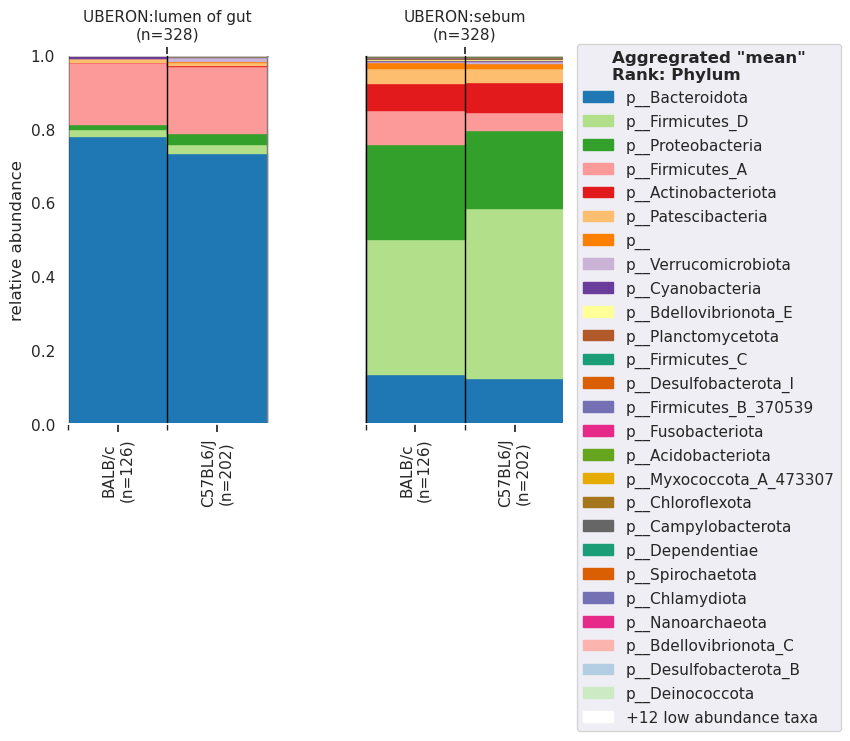

In [38]:
%matplotlib inline
fig = plotTaxonomy("exported-fragment-filtered-feature-table/feature-table.biom", meta[meta['host_body_product'].isin(['UBERON:lumen of gut', 'UBERON:sebum']) & meta['host_scientific_name'].isin(['Mus musculus']) & meta['genotype'].isin(['BALB/c', 'C57BL6/J'])],  file_taxonomy="exported-taxonomy-full/phylum.tsv", fct_aggregate=np.mean, group_l0="host_body_product",group_l1="genotype", rank="Phylum", minreadnr=100)
plt.show()

In [39]:
exported_taxonomy[['Taxon1', 'Taxon2']] = exported_taxonomy["Taxon"].apply(lambda x: pd.Series(str(x).split(" g__")))
family_taxa= exported_taxonomy.drop(columns=["Taxon2", "Taxon"])
family_taxa.rename(columns={'Taxon1':'Taxon'}, inplace=True)
family_taxa = family_taxa[["Taxon", "Confidence"]]
family_taxa = family_taxa[family_taxa["Taxon"].str.contains("f__")]
family_taxa.to_csv("exported-taxonomy-full/family.tsv", sep="\t")

/homes/arehm/Documents/Thesis/ggmap/ggmap/snippets.py:451: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  counts_taxonomy = counts_taxonomy.reset_index().groupby(rank).sum()
/homes/arehm/Documents/Thesis/ggmap/ggmap/snippets.py:712: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  rank_counts = rank_counts.append(lowReadTaxa)


332 taxa left after collapsing to Family.
656 samples left with metadata and counts.
48 taxa left after filtering low abundant.
raw counts: 767
raw meta: 668
meta with counts: 4 samples x 4 fields
counts with meta: 4


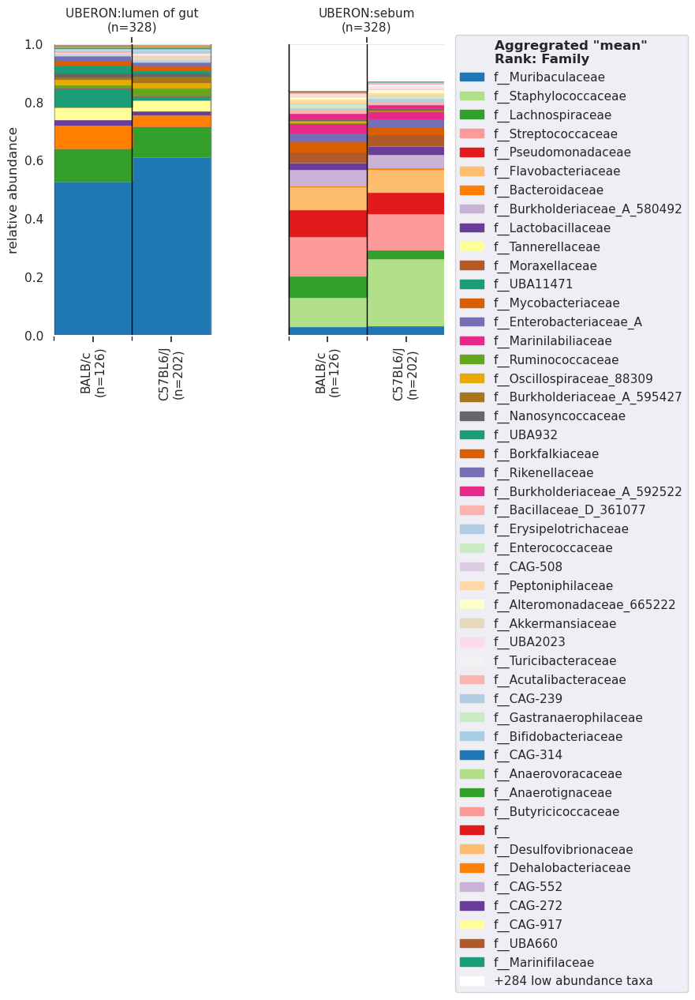

In [40]:
%matplotlib inline
fig, rank_counts, graphinfo, vals, colors = plotTaxonomy("exported-fragment-filtered-feature-table/feature-table.biom", meta[meta['host_body_product'].isin(['UBERON:lumen of gut', 'UBERON:sebum']) & meta['host_scientific_name'].isin(['Mus musculus']) & meta['genotype'].isin(['BALB/c', 'C57BL6/J'])],  file_taxonomy="exported-taxonomy-full/family.tsv", fct_aggregate=np.mean, group_l0="host_body_product",group_l1="genotype", rank="Family", minreadnr=5000)

### Scatterplots

In [3]:
taxa_all_l6 = pd.read_csv("/homes/arehm/Benga_ThreeGen/Anna/Notebook_Final/exported-taxonomy-full/level-6.csv", sep=",").set_index('index')

In [10]:
taxa_all_l6['d__Bacteria;p__Verrucomicrobiota;c__Verrucomicrobiae;o__Verrucomicrobiales;f__Akkermansiaceae;g__Akkermansia']

index
13422.181              2.0
13422.1              475.0
13422.118              3.0
13422.127              3.0
13422.172             28.0
13422.136              7.0
13422.154              3.0
13422.145              0.0
13422.109            320.0
13422.163             22.0
13422.10               0.0
13422.181skin          0.0
13422.172skin          0.0
13422.118skin          0.0
13422.145skin          0.0
13422.154skin          0.0
13422.127skin          0.0
13422.163skin          0.0
13422.136skin          0.0
13422.173              0.0
13422.109skin         39.0
13422.100           1239.0
13422.146              0.0
13422.119              0.0
13422.182              3.0
13422.155              0.0
13422.128             67.0
13422.164            472.0
13422.137              0.0
13422.100skin          0.0
13422.173skin          0.0
13422.10skin           0.0
13422.146skin          0.0
13422.164skin          0.0
13422.128skin          0.0
13422.101skin          0.0
13422.137skin         

In [11]:
#use level6 table as Akkermansia is a genus
taxa_gut = taxa_all_l6[taxa_all_l6['host_body_product'].isin(['UBERON:lumen of gut']) & taxa_all_l6['host_scientific_name'].isin(['Mus musculus']) & ~taxa_all_l6['generation'].isin(['not applicable'])]
taxa_gut['d__Bacteria;p__Verrucomicrobiota;c__Verrucomicrobiae;o__Verrucomicrobiales;f__Akkermansiaceae;g__Akkermansia'].astype(float)
total_abundance_akkermansia = taxa_gut['d__Bacteria;p__Verrucomicrobiota;c__Verrucomicrobiae;o__Verrucomicrobiales;f__Akkermansiaceae;g__Akkermansia'].sum()
taxa_gut['relative_abundance'] = taxa_gut['d__Bacteria;p__Verrucomicrobiota;c__Verrucomicrobiae;o__Verrucomicrobiales;f__Akkermansiaceae;g__Akkermansia'] / total_abundance_akkermansia

/tmp/ipykernel_2505253/4214885697.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  taxa_gut['relative_abundance'] = taxa_gut['d__Bacteria;p__Verrucomicrobiota;c__Verrucomicrobiae;o__Verrucomicrobiales;f__Akkermansiaceae;g__Akkermansia'] / total_abundance_akkermansia


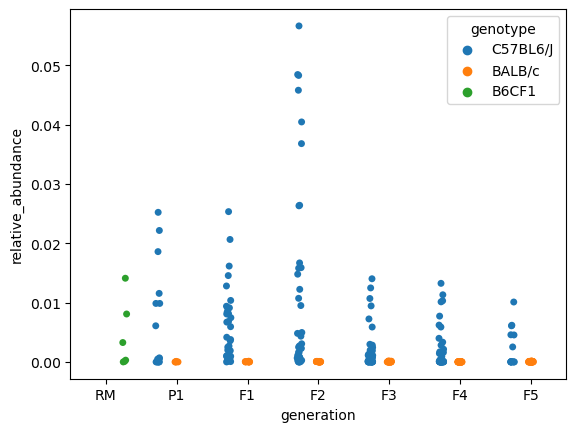

In [12]:
#goal: scatterplot with genotype on x axis and relative abundance of akkermansia on the y axis
%matplotlib inline
ax = sns.stripplot(x= 'generation', y='relative_abundance', data= taxa_gut, hue='genotype', order=['RM','P1', 'F1', 'F2', 'F3', 'F4', 'F5'], hue_order=['C57BL6/J', 'BALB/c', 'B6CF1'],dodge=True)
plt.savefig(work_dir + "/scatter_akkermansia.png", transparent=False, bbox_inches='tight')
plt.show()

### ANCOM

In [33]:
%time !$q_path; qiime feature-table filter-samples \
  --i-table $work_dir/rarefied6000-filtered-gut-table.qza \
  --m-metadata-file $meta_file \
  --p-where "[host_common_name] IN ('mouse') AND [genotype] NOT IN ('B6CF1') AND [comparison] IN ('0')" \
  --o-filtered-table $work_dir/rarified-gut-nocompRM.qza

Saved FeatureTable[Frequency] to: /homes/arehm/Benga_ThreeGen/Anna/Notebook_Final/rarified-gut-nocompRM.qza
CPU times: user 773 ms, sys: 112 ms, total: 885 ms
Wall time: 38 s


In [50]:
%time !$q_path; qiime taxa collapse \
  --i-table $work_dir/rarified-gut-nocompRM.qza \
  --i-taxonomy $work_dir/taxonomy_full.qza \
  --p-level 7 \
  --o-collapsed-table $work_dir/collapsed-level7-mouse-gut-table-nocompRM.qza

Saved FeatureTable[Frequency] to: /homes/arehm/Benga_ThreeGen/Anna/Notebook_Final/collapsed-level7-mouse-gut-table-nocompRM.qza
CPU times: user 766 ms, sys: 110 ms, total: 876 ms
Wall time: 37.7 s


In [51]:
%time !$q_path; qiime composition add-pseudocount \
  --i-table $work_dir/collapsed-level7-mouse-gut-table-nocompRM.qza \
  --o-composition-table $work_dir/composition-table-mouse-gut-l7-nocompRM.qza

Saved FeatureTable[Composition] to: /homes/arehm/Benga_ThreeGen/Anna/Notebook_Final/composition-table-mouse-gut-l7-nocompRM.qza
CPU times: user 699 ms, sys: 108 ms, total: 807 ms
Wall time: 35.2 s


In [52]:
%time !$q_path; qiime composition ancom \
  --i-table $work_dir/composition-table-mouse-gut-l7-nocompRM.qza \
  --m-metadata-file $meta_file \
  --m-metadata-column genotype \
  --o-visualization $work_dir/ancom-genotype-mouse-gut-l7-nocompRM.qzv

Saved Visualization to: /homes/arehm/Benga_ThreeGen/Anna/Notebook_Final/ancom-genotype-mouse-gut-l7-nocompRM.qzv
CPU times: user 752 ms, sys: 132 ms, total: 884 ms
Wall time: 40.2 s


In [53]:
!unzip $work_dir/composition-table-mouse-gut-l7-nocompRM.qza

Archive:  /homes/arehm/Benga_ThreeGen/Anna/Notebook_Final/composition-table-mouse-gut-l7-nocompRM.qza
  inflating: f3a6a978-a527-4588-a92d-2445cf953a0b/VERSION  
  inflating: f3a6a978-a527-4588-a92d-2445cf953a0b/checksums.md5  
  inflating: f3a6a978-a527-4588-a92d-2445cf953a0b/metadata.yaml  
  inflating: f3a6a978-a527-4588-a92d-2445cf953a0b/data/feature-table.biom  
  inflating: f3a6a978-a527-4588-a92d-2445cf953a0b/provenance/citations.bib  
  inflating: f3a6a978-a527-4588-a92d-2445cf953a0b/provenance/VERSION  
  inflating: f3a6a978-a527-4588-a92d-2445cf953a0b/provenance/metadata.yaml  
  inflating: f3a6a978-a527-4588-a92d-2445cf953a0b/provenance/action/action.yaml  
  inflating: f3a6a978-a527-4588-a92d-2445cf953a0b/provenance/artifacts/ddfcc916-a289-4b26-98ec-cd4fa073cc51/citations.bib  
  inflating: f3a6a978-a527-4588-a92d-2445cf953a0b/provenance/artifacts/ddfcc916-a289-4b26-98ec-cd4fa073cc51/VERSION  
  inflating: f3a6a978-a527-4588-a92d-2445cf953a0b/provenance/artifacts/ddfcc916-a

In [56]:
! $q_path; biom convert \
  --input-fp f3a6a978-a527-4588-a92d-2445cf953a0b/data/feature-table.biom       \
  --to-tsv \
  --output-fp $work_dir/ancom-biom-table-gut-l7

In [57]:
!$q_path; biom summarize-table -i f3a6a978-a527-4588-a92d-2445cf953a0b/data/feature-table.biom

Num samples: 303
Num observations: 207
Total count: 1,880,721
Table density (fraction of non-zero values): 1.000

Counts/sample summary:
 Min: 6,207.000
 Max: 6,207.000
 Median: 6,207.000
 Mean: 6,207.000
 Std. dev.: 0.000
 Sample Metadata Categories: None provided
 Observation Metadata Categories: None provided

Counts/sample detail:
13422.181: 6,207.000
13422.118: 6,207.000
13422.127: 6,207.000
13422.172: 6,207.000
13422.136: 6,207.000
13422.154: 6,207.000
13422.145: 6,207.000
13422.109: 6,207.000
13422.163: 6,207.000
13422.10: 6,207.000
13422.173: 6,207.000
13422.100: 6,207.000
13422.146: 6,207.000
13422.119: 6,207.000
13422.182: 6,207.000
13422.155: 6,207.000
13422.128: 6,207.000
13422.164: 6,207.000
13422.137: 6,207.000
13422.11: 6,207.000
13422.147: 6,207.000
13422.174: 6,207.000
13422.129: 6,207.000
13422.165: 6,207.000
13422.101: 6,207.000
13422.138: 6,207.000
13422.156: 6,207.000
13422.110: 6,207.000
13422.183: 6,207.000
13422.102: 6,207.000
13422.148: 6,207.000
13422.12: 6,20

In [58]:
ancom_biom_table_gut_l7 = pd.read_csv(work_dir+"/ancom-biom-table-gut-l7", 
            sep="\t",skiprows=1, index_col=0)

In [59]:
%matplotlib inline

relative_abundance_gut= ancom_biom_table_gut_l7.div(6207)
list_C57B = meta[meta['genotype'].isin(['C57BL6/J'])].index
list_BALB = meta[meta['genotype'].isin(['BALB/c'])].index

ancom_C57B_gut = relative_abundance_gut[[col for col in relative_abundance_gut.columns if col in list_C57B]]
ancom_C57B_gut["average"]=ancom_C57B_gut.mean(axis=1)

ancom_BALB_gut = relative_abundance_gut[[col for col in relative_abundance_gut.columns if col in list_BALB]]
ancom_BALB_gut["average"] = ancom_BALB_gut.mean(axis=1)


with open('ancom_l6.txt', 'r') as f:
    ancom_taxa_gut_l6 = [line.rstrip() for line in f]
with open('ancom_l7.txt', 'r') as f:
    ancom_taxa_gut_l7 = [line.rstrip() for line in f]
    
taxa_C57B_gut = ancom_C57B_gut[ancom_C57B_gut.index.isin(ancom_taxa_gut_l7)]
taxa_BALB_gut = ancom_BALB_gut[ancom_BALB_gut.index.isin(ancom_taxa_gut_l7)]

ancom_plot = pd.DataFrame({'C57BL6/J': taxa_C57B_gut['average'],
                           'BALB/c': taxa_BALB_gut['average']},
                         index=taxa_C57B_gut.index)

/tmp/ipykernel_2505253/3546790620.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ancom_C57B_gut["average"]=ancom_C57B_gut.mean(axis=1)
/tmp/ipykernel_2505253/3546790620.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ancom_BALB_gut["average"] = ancom_BALB_gut.mean(axis=1)


prepare lists wit indeces 

/tmp/ipykernel_2505253/1943097952.py:5: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "set_facecolor" which is no longer supported as of 3.3 and will become an error in 3.6
  ancom_taxa_plot.figure.savefig(work_dir + '/ancom_plot_gut_species.svg', set_facecolor='white', bbox_inches='tight')


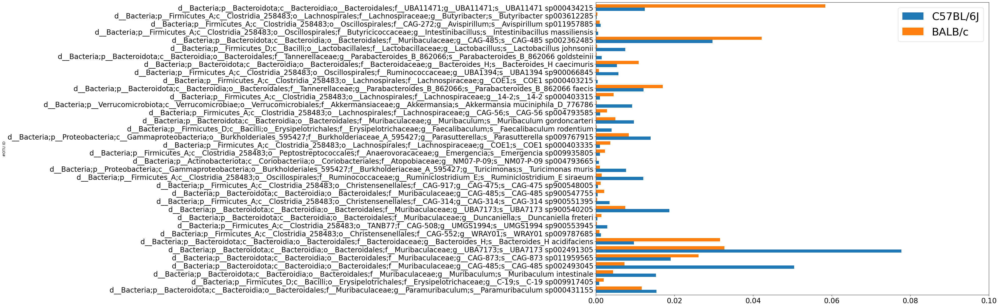

In [60]:
import matplotlib.pyplot as plt
ancom_taxa_plot = ancom_plot.plot.barh(figsize=(20,15), width =0.8, fontsize=20).legend(loc=1, prop={'size':30})
plt.legend(labels=["C57BL/6J","BALB/c"], fontsize=30)
plt.xlim(right=0.1)
ancom_taxa_plot.figure.savefig(work_dir + '/ancom_plot_gut_species.svg', set_facecolor='white', bbox_inches='tight')

## Alpha Diversity

### Gut

In [280]:
filtered_gut_table = biom2pandas(work_dir + "/exported-full-filtered-gut-table/feature-table.biom").fillna(0)
alpha_div_gut = alpha_diversity(filtered_gut_table, 6000, metrics=["shannon", "observed_features", "PD_whole_tree"], num_iterations=10, reference_tree="/homes/arehm/Benga_ThreeGen/FromQiita/128106_insertion_tree.relabelled.tre", use_grid=True, dry=False)
alpha_results_merged_gut = alpha_div_gut['results'].merge(meta, left_index=True, right_index=True)
alpha_results_merged_gut[alpha_results_merged_gut['genotype'].isin(['C57BL6/J', 'BALB/c'])]

Using existing results from '.anacache/5498bf81aa186bfc9cc1fe2d3e9b9e78.adiv'. 


,observed_features,shannon,PD_whole_tree,batch,birth_timestamp,cage_id,collection_device,collection_method,collection_timestamp,description,dna_extracted,elevation,elevation_units,empo_1,empo_2,empo_3,env_biome,env_feature,env_material,env_package,facility,father_subject_id,generation,genotype,geo_loc_name,host_age,host_age_units,host_body_habitat,host_body_product,host_body_site,host_common_name,host_height,host_height_units,host_scientific_name,host_subject_id,host_taxid,host_weight,host_weight_units,iacuc_institute,iacuc_protocol_id,latitude,latitude_units,life_stage,longitude,longitude_units,mother_subject_id,parental_cage,physical_specimen_location,physical_specimen_remaining,qiita_study_id,sample_type,scientific_name,sex,taxon_id,title,tube_id,tube_id_plate_bmfz,gen_number,cage_lineage,i_generation,comparison,cage_group,source_sink_CF1-CF2-1,source_sink_CF1-CF2-2,source_sink_CF2-CF3-1,source_sink_CF2-CF3-2,source_sink_CF2-CF3-3,source_sink_CF3-CF4-1,source_sink_CF3-CF4-2,source_sink_CF3-CF4-3,source_sink_PC-CF2-1,source_sink_PC-CF2-2,source_sink_PC-CF1-1,source_sink_PC-CF1-2,source_sink_PC-CF3-1,source_sink_PC-CF3-2,source_sink_PC-CF3-3,source_sink_PC-CF4-1,source_sink_PC-CF4-2,source_sink_PC-CF4-3,source_sink_PC-CF5-1,source_sink_PC-CF5-2,source_sink_PC-CF5-3,source_sink_PB-BF1-1,source_sink_PB-BF1-2,source_sink_PB-BF1-3,source_sink_PB-BF2-1,source_sink_PB-BF2-2,source_sink_PB-BF2-3,source_sink_PB-BF3-1,source_sink_PB-BF3-2,source_sink_PB-BF3-3,source_sink_PB-BF4-1,source_sink_PB-BF4-2,source_sink_PB-BF4-3,source_sink_PB-BF5-1,source_sink_PB-BF5-2,source_sink_BF1-BF2-1,source_sink_BF1-BF2-2,source_sink_BF1-BF2-3,source_sink_BF2-BF3-1,source_sink_BF2-BF3-2,source_sink_BF2-BF3-3,source_sink_BF3-BF4-1,source_sink_BF3-BF4-2,source_sink_BF3-BF4-3,source_sink_BF4-BF5-1,source_sink_BF4-BF5-2,source_sink_P1-RM
13422.181,140.5,5.281849,13.150929,1,2019-08-08,F3-26,eppi,necropsy,2019-11-19,not provided,TRUE,42,meters,Host-associated,Animal,Animal distal gut,urban biome,mammalia-associated habitat,intestine environment,host-associated,SPF,not provided,F3,BALB/c,Germany:Duesseldorf,15,weeks,UBERON:gastrointestinal system,UBERON:lumen of gut,UBERON:colon,mouse,not provided,cm,Mus musculus,181,10090,21.9,grams,LANUV,G383/17,51.189401,Decimal degrees,adult,6.792239,Decimal degrees,not provided,F2-21,DNA in freezer03.140,TRUE,13422,colon content,mouse gut metagenome,female,410661,Influence of the genetic background on murine ...,1-c4,NaN,3,C2,3: F3,0,CF3-2,None,None,None,Sink,None,Source,Source,Source,None,None,None,None,None,Sink,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
13422.118,149.2,4.853998,14.036759,1,2019-05-09,F2-21,eppi,necropsy,2019-09-10,motherF2,TRUE,42,meters,Host-associated,Animal,Animal distal gut,urban biome,mammalia-associated habitat,intestine environment,host-associated,SPF,not provided,F2,BALB/c,Germany:Duesseldorf,17,weeks,UBERON:gastrointestinal system,UBERON:lumen of gut,UBERON:colon,mouse,not provided,cm,Mus musculus,118,10090,27.2,grams,LANUV,G383/17,51.189401,Decimal degrees,adult,6.792239,Decimal degrees,F2,F1-21,DNA in freezer03.140,TRUE,13422,colon content,mouse gut metagenome,female,410661,Influence of the genetic background on murine ...,3-c2,NaN,2,C2,2: F2,0,CF2-2,None,Sink,Source,Source,Source,None,None,None,None,Sink,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
13422.127,173.0,5.696344,15.791471,1,2019-05-09,F2-25,eppi,necropsy,2019-08-21,fatherF2,TRUE,42,meters,Host-associated,Animal,Animal distal gut,urban biome,mammalia-associated habitat,intestine environment,host-associated,SPF,F2,F2,BALB/c,Germany:Duesseldorf,15,weeks,UBERON:gastrointestinal system,UBERON:lumen of gut,UBERON:colon,mouse,not provided,cm,Mus musculus,127,10090,30.2,grams,L

In [62]:
RM_shannon_average = np.mean(alpha_results_merged_gut[alpha_results_merged_gut['generation'].isin(['RM'])]['shannon'])
RM_shannon_std = np.std(alpha_results_merged_gut[alpha_results_merged_gut['generation'].isin(['RM'])]['shannon'])
RM_PD_average = np.mean(alpha_results_merged_gut[alpha_results_merged_gut['generation'].isin(['RM'])]['PD_whole_tree'])
RM_PD_std = np.std(alpha_results_merged_gut[alpha_results_merged_gut['generation'].isin(['RM'])]['PD_whole_tree'])
RM_observed_average = np.mean(alpha_results_merged_gut[alpha_results_merged_gut['generation'].isin(['RM'])]['observed_features'])
RM_observed_std = np.std(alpha_results_merged_gut[alpha_results_merged_gut['generation'].isin(['RM'])]['observed_features'])

In [78]:
meta[meta['genotype'].isin(['C57BL6/J','BALB/c', 'B6CF1']) & meta['host_common_name'].isin(['mouse']) & ~meta['generation'].isin(['not applicable'])].value_counts('i_generation')

i_generation
3: F3     134
4: F4     134
2: F2     110
5: F5      98
1: F1      90
0: P1      42
-1: RM     12
dtype: int64

/homes/arehm/Documents/Thesis/ggmap/ggmap/snippets.py:3245: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  meta = metadata.loc[idx_samples, :].copy()
/homes/arehm/Documents/Thesis/ggmap/ggmap/snippets.py:3271: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 95)` for the same effect.

  sns.lineplot(data=data_group,


TypeError: unsupported operand type(s) for +: 'int' and 'NoneType'

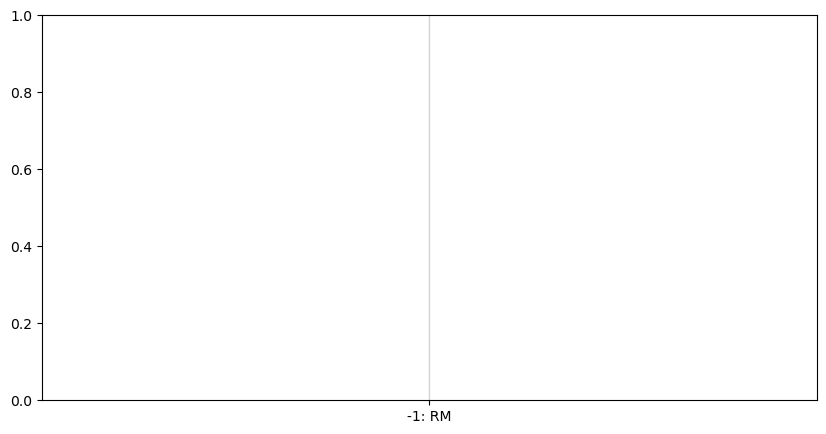

In [74]:
%matplotlib inline
import pylab
metric = 'shannon'
fig, axes = plt.subplots(1,1, figsize=(10,5))
a_data = plot_timecourse(meta[meta['genotype'].isin(['C57BL6/J','BALB/c', 'B6CF1']) & meta['host_common_name'].isin(['mouse']) & ~meta['generation'].isin(['not applicable']) & meta['comparison'].isin([0])],
                data=alpha_div_gut['results'][metric],
                col_events='i_generation', col_entities=None,
                cols_groups=['host_common_name', 'genotype'],
                #test_groups=[(('mouse', 'C57BL6/J'), ('mouse', 'BALB/c'))],
                pthreshold=0.05, print_samplesizes=True,
                ax=axes,
                colors_groups={('mouse', 'BALB/c'): "tab:orange", ('mouse', 'C57BL6/J'): "tab:blue"},
                test_groups=None
                )
#axes.legend(labels=['BALB/c', 'C57BL/6J'])
#plt.scatter("-1: RM", RM_shannon_average, color='green')
#plt.errorbar(["-1: RM"], [RM_shannon_average], yerr=RM_shannon_std, color='green')
#handles, labels = fig.get_legend_handles_labels()
labels = ['BALB/c', 'C57BL/6J', 'B6CF1']
#plt.legend(labels, loc=2)
plt.title('Darm')
plt.savefig(work_dir + "/alpha_gut_timeline_shannon.png", transparent=True, bbox_inches="tight", facecolor='white')

/homes/arehm/Documents/Thesis/ggmap/ggmap/snippets.py:3245: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  meta = metadata.loc[idx_samples, :].copy()
/homes/arehm/Documents/Thesis/ggmap/ggmap/snippets.py:3271: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 95)` for the same effect.

  sns.lineplot(data=data_group,


TypeError: unsupported operand type(s) for +: 'int' and 'NoneType'

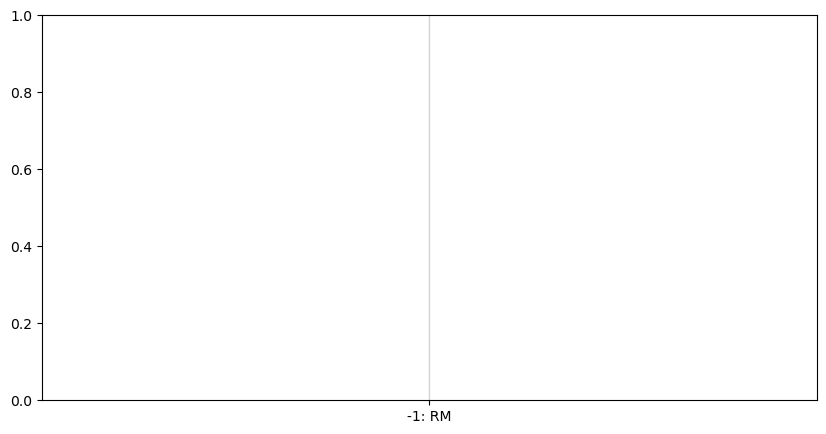

In [64]:
%matplotlib inline

metric = 'observed_features'
fig, axes = plt.subplots(1,1, figsize=(10,5))
a_data = plot_timecourse(meta[meta['genotype'].isin(['C57BL6/J','BALB/c', 'B6CF1']) & meta['host_common_name'].isin(['mouse']) & ~meta['generation'].isin(['not applicable']) ],
                data=alpha_div_gut['results'][metric],
                col_events='i_generation', col_entities=None,
                cols_groups=['host_common_name', 'genotype'],
                #test_groups=[(('mouse', 'C57BL6/J'), ('mouse', 'BALB/c'))],
                test_groups=None,
                pthreshold=0.05, print_samplesizes=True,
                ax=axes,
                colors_groups={('mouse', 'BALB/c'): "tab:orange", ('mouse', 'C57BL6/J'): "tab:blue"})
#axes.legend(labels=['BALB/c', 'C57BL/6J'])
plt.scatter("-1: RM", RM_observed_average, color='green')
plt.errorbar(["-1: RM"], [RM_observed_average], yerr=RM_observed_std, color='green')
#handles, labels = fig.get_legend_handles_labels()
labels = ['BALB/c', 'C57BL/6J', 'B6CF1']
#plt.legend(handles, labels, loc=2)
plt.title('Darm')
plt.savefig(work_dir + "/alpha_gut_timeline_observed_features.png", transparent=False, bbox_inches="tight", facecolor='white')

NameError: name 'alpha_div_gut' is not defined

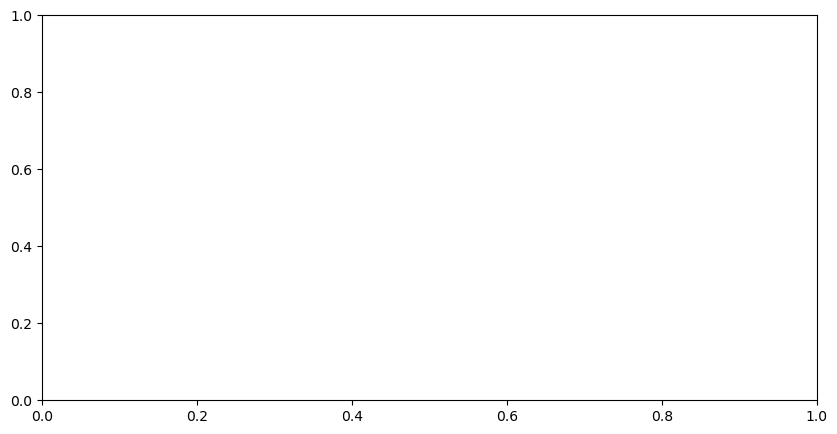

In [71]:
%matplotlib inline

metric = 'PD_whole_tree'
fig, axes = plt.subplots(1,1, figsize=(10,5))
a_data = plot_timecourse(meta[meta['genotype'].isin(['C57BL6/J','BALB/c', 'B6CF1']) & meta['host_common_name'].isin(['mouse']) & ~meta['generation'].isin(['not applicable'])],
                data=alpha_div_gut['results'][metric],
                col_events='i_generation', col_entities=None,
                cols_groups=['host_common_name', 'genotype'],
                #test_groups=[(('mouse', 'C57BL6/J'), ('mouse', 'BALB/c'))],
                test_groups=None,
                pthreshold=0.05, print_samplesizes=True,
                ax=axes,
                colors_groups={('mouse', 'BALB/c'): "tab:orange", ('mouse', 'C57BL6/J'): "tab:blue"})
#axes.legend(labels=['BALB/c', 'C57BL/6J'])
plt.scatter("-1: RM", RM_PD_average, color='green')
plt.errorbar(["-1: RM"], [RM_PD_average], yerr=RM_PD_std, color='green')
#handles, labels = fig.get_legend_handles_labels()
labels = ['BALB/c', 'C57BL/6J', 'B6CF1']
#plt.legend(handles, labels, loc=2)
plt.savefig(work_dir + "/alpha_gut_timeline_PD_whole_tree.png", transparent=False, bbox_inches="tight", facecolor='white')

#### Scatterplots
##### Birth Offset

In [72]:
meta_stefan = pd.read_csv(meta_file_stefan, sep="\t", dtype=str).set_index('sample_name')
meta_stefan.head()

,batch,birth_timestamp,cage_group,cage_id,cage_line,collection_device,collection_method,collection_timestamp,description,dna_extracted,elevation,elevation_units,empo_1,empo_2,empo_3,env_biome,env_feature,env_material,env_package,facility,father_subject_id,father_subject_id_stefan,generation,genotype,geo_loc_name,host_age,host_age_units,host_body_habitat,host_body_product,host_body_site,host_common_name,host_height,host_height_units,host_scientific_name,host_subject_id,host_subject_id_stefan,host_taxid,host_weight,host_weight_units,iacuc_institute,iacuc_protocol_id,latitude,latitude_units,life_stage,longitude,longitude_units,mother_subject_id,mothers_subject_ids_stefan,parental_cage,physical_specimen_location,physical_specimen_remaining,qiita_study_id,sample_type,scientific_name,sex,taxon_id,title,tube_id,tube_id_plate_bmfz
sample_name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
13422.1,1,2018-04-10,rm,rm1,NaN,eppi,necropsy,2019-01-03,recipient mother,TRUE,42,meters,Host-associated,Animal,Animal distal gut,urban biome,mammalia-associated habitat,intestine environment,host-associated,spf,not provided,NaN,rm,b6cf1,Germany:Duesseldorf,38,weeks,uberon:gastrointestinal system,uberon:lumen of gut,uberon:colon,mouse,not provided,cm,mus musculus,1,1,10090,not collected,grams,LANUV,G383/17,51.189401,Decimal degrees,adult,6.792239,Decimal degrees,recipient,NaN,room01.32,dna in freezer03.140,TRUE,13422,colon content,mouse gut metagenome,female,410661,Influence of the genetic background on murine ...,1-a9,1-a9
13422.10,1,2018-11-30,pb,p1-11,BALB/c_line5,eppi,necropsy,2019-03-20,motherp1,TRUE,42,meters,Host-associated,Animal,Animal distal gut,urban biome,mammalia-associated habitat,intestine environment,host-associated,spf,not provided,NaN,p1,balb/c,Germany:Duesseldorf,15,weeks,uberon:gastrointestinal system,uberon:lumen of gut,uberon:colon,mouse,not provided,cm,mus musculus,10,176386/6,10090,34.3,grams,LANUV,G383/17,51.189401,Decimal degrees,adult,6.792239,Decimal degrees,p4,NaN,rm3,dna in freezer03.140,TRUE,13422,colon content,mouse gut metagenome,female,410661,Influence of the genetic background on murine ...,3-d1,3-d1
13422.100,1,2019-05-03,cf2-3,f2-12,C57BL6/J_line3,eppi,necropsy,2019-08-16,motherf2,TRUE,42,meters,Host-associated,Animal,Animal distal gut,urban biome,mammalia-associated habitat,intestine environment,host-associated,spf,not provided,183014/6,f2,c57bl6/j,Germany:Duesseldorf,15,weeks,uberon:gastrointestinal system,uberon:lumen of gut,uberon:colon,mouse,not provided,cm,mus musculus,100,189921/1,10090,24.9,grams,LANUV,G383/17,51.189401,Decimal degrees,adult,6.792239,Decimal degrees,f2,183014/1|183014/2,f1-11,dna in freezer03.140,TRUE,13422,colon content,mouse gut metagenome,female,410661,Influence of the genetic background on murine ...,2-c12,NaN
13422.100skin,3,2019-05-03,cf2-3,f2-12,C57BL6/J_line3,eppi,necropsy,2019-08-16,motherf2,TRUE,42,meters,Host-associated,Animal,Animal distal gut,urban biome,mammalia-associated habitat,sebum,host-associated,spf,not provided,183014/6,f2,c57bl6/j,Germany:Duesseldorf,15,weeks,uberon:skin,uberon:sebum,uberon:skin of external ear,mouse,not provided,cm,mus musculus,100,189921/1,10090,24.9,grams,LANUV,G383/17,51.189401,Decimal degrees,adult,6.792239,Decimal degrees,f2,183014/1|183014/2,f1-11,dna in freezer03.140,TRUE,13422,skin of external ear,mouse skin metagenome,female,410661,Skin screening,7-c12,7-c12
13422.101,1,2019-05-03,cf2-3,f2-12,C57BL6/J_line3,eppi,necropsy,2019-08-16,motherf2,TRUE,42,meters,Host-associated,Animal,Animal distal gut,urban biome,mammalia-associated habitat,intestine environment,host-associated,spf,not provided,183014/6,f2,c57bl6/j,Germany:Duesseldorf,15,weeks,uberon:gastrointestinal system,uberon:lumen of gut,uberon:colon,mouse,not provided,cm,mus musculus,101,189921/2,10090,24.7,grams,LANUV,G383/17,51.189401,Decimal degrees,adult,6.792239,Decimal degrees,f2,183014/1|183014/2,f1-11,dna in freezer03.140,TRUE,13422,colon content,mouse gut metagenome,fe

In [295]:
gut_indeces = meta_stefan[meta_stefan['genotype'].isin(['c57bl6/j']) & meta_stefan['host_body_product'].isin(['uberon:lumen of gut']) & ~meta_stefan['generation'].isin(['not applicable']) & ~meta_stefan['tube_id'].isin(['3-a8'])].index
gut_indeces
#gut_indeces = gut_indeces.delete('13422.217')

Index(['13422.100', '13422.101', '13422.102', '13422.103', '13422.104',
       '13422.105', '13422.106', '13422.107', '13422.108', '13422.109',
       ...
       '13422.90', '13422.91', '13422.92', '13422.93', '13422.94', '13422.95',
       '13422.96', '13422.97', '13422.98', '13422.99'],
      dtype='object', name='sample_name', length=189)

In [296]:
alpha_div_gut['results']['PD_whole_tree'].loc[gut_indeces]

sample_name
13422.100    16.359586
13422.101    17.152466
13422.102    15.746798
13422.103    16.242529
13422.104    17.997135
13422.105    15.244594
13422.106    16.214844
13422.107    16.714724
13422.108    17.712036
13422.109    16.123153
13422.110    18.012010
13422.12     18.529351
13422.128    19.436546
13422.129    16.069343
13422.13     17.764198
13422.130    18.040669
13422.131    18.344962
13422.132    16.738440
13422.133    16.142496
13422.134    18.743434
13422.135    17.748611
13422.136    16.149064
13422.137    14.479188
13422.138    16.808811
13422.139    17.590638
13422.14     18.884963
13422.140    16.793393
13422.141    17.420147
13422.142    16.843608
13422.143    17.169471
13422.144    16.960405
13422.145    16.116712
13422.146    16.571259
13422.147    16.663243
13422.148    16.725542
13422.149    17.376172
13422.15     16.994293
13422.150    15.659852
13422.151    15.380554
13422.152    15.623553
13422.153    16.153094
13422.154    16.399396
13422.155    17.423411

In [328]:
alpha_results_merged_gut_stefan = alpha_div_gut['results'].merge(meta_stefan, left_index=True, right_index=True)
alpha_results_merged_gut_stefan[alpha_results_merged_gut_stefan['genotype'].isin(['c57bl6/j', 'balb/c'])]

,observed_features,shannon,PD_whole_tree,batch,birth_timestamp,cage_group,cage_id,cage_line,collection_device,collection_method,collection_timestamp,description,dna_extracted,elevation,elevation_units,empo_1,empo_2,empo_3,env_biome,env_feature,env_material,env_package,facility,father_subject_id,father_subject_id_stefan,generation,genotype,geo_loc_name,host_age,host_age_units,host_body_habitat,host_body_product,host_body_site,host_common_name,host_height,host_height_units,host_scientific_name,host_subject_id,host_subject_id_stefan,host_taxid,host_weight,host_weight_units,iacuc_institute,iacuc_protocol_id,latitude,latitude_units,life_stage,longitude,longitude_units,mother_subject_id,mothers_subject_ids_stefan,parental_cage,physical_specimen_location,physical_specimen_remaining,qiita_study_id,sample_type,scientific_name,sex,taxon_id,title,tube_id,tube_id_plate_bmfz,birth_offset_in_days,birth_offset_average_generation
13422.181,140.5,5.281849,13.150929,1,2019-08-08,bf3-2,f3-26,BALB/c_line5,eppi,necropsy,2019-11-19,not provided,TRUE,42,meters,Host-associated,Animal,Animal distal gut,urban biome,mammalia-associated habitat,intestine environment,host-associated,spf,not provided,189923/10,f3,balb/c,Germany:Duesseldorf,15,weeks,uberon:gastrointestinal system,uberon:lumen of gut,uberon:colon,mouse,not provided,cm,mus musculus,181,198339/3,10090,21.9,grams,LANUV,G383/17,51.189401,Decimal degrees,adult,6.792239,Decimal degrees,not provided,189923/1|189923/2,f2-21,dna in freezer03.140,TRUE,13422,colon content,mouse gut metagenome,female,410661,Influence of the genetic background on murine ...,1-c4,NaN,6.0,4.134328
13422.118,149.2,4.853998,14.036759,1,2019-05-09,bf2-2,f2-21,BALB/c_line5,eppi,necropsy,2019-09-10,motherf2,TRUE,42,meters,Host-associated,Animal,Animal distal gut,urban biome,mammalia-associated habitat,intestine environment,host-associated,spf,not provided,183017/3,f2,balb/c,Germany:Duesseldorf,17,weeks,uberon:gastrointestinal system,uberon:lumen of gut,uberon:colon,mouse,not provided,cm,mus musculus,118,189923/2,10090,27.2,grams,LANUV,G383/17,51.189401,Decimal degrees,adult,6.792239,Decimal degrees,f2,183017/1|183017/2,f1-21,dna in freezer03.140,TRUE,13422,colon content,mouse gut metagenome,female,410661,Influence of the genetic background on murine ...,3-c2,NaN,0.0,0.872727
13422.127,173.0,5.696344,15.791471,1,2019-05-09,bf2-2,f2-25,BALB/c_line5,eppi,necropsy,2019-08-21,fatherf2,TRUE,42,meters,Host-associated,Animal,Animal distal gut,urban biome,mammalia-associated habitat,intestine environment,host-associated,spf,f2,183017/3,f2,balb/c,Germany:Duesseldorf,15,weeks,uberon:gastrointestinal system,uberon:lumen of gut,uberon:colon,mouse,not provided,cm,mus musculus,127,189923/11,10090,30.2,grams,LANUV,G383/17,51.189401,Decimal degrees,adult,6.792239,Decimal degrees,not provided,183017/1|183017/2,f1-21,dna in freezer03.140,TRUE,13422,colon content,mouse gut metagenome,male,410661,Influence of the genetic background on murine ...,1-c6,NaN,0.0,0.872727
13422.172,178.6,6.002551,16.712558,1,2019-07-13,cf3-3,f3-20,C57BL6/J_line3,eppi,necropsy,2019-10-28,not provided,TRUE,42,meters,Host-associated,Animal,Animal distal gut,urban biome,mammalia-associated habitat,intestine environment,host-associated,spf,not provided,189921/6,f3,c57bl6/j,Germany:Duesseldorf,15,weeks,uberon:gastrointestinal system,uberon:lumen of gut,uberon:colon,mouse,not provided,cm,mus musculus,172,195998/7,10090,32.3,grams,LANUV,G383/17,51.189401,Decimal degrees,adult,6.792239,Decimal degrees,not provided,189921/1|189921/2,f2-12,dna in freezer03.140,TRUE,13422,colon content,mouse gut metagenome,male,410661,Influence of the genetic background on murine ...,1-a12,NaN,3.0,4.134328
13422.136,188.0,5.694427,16.149064,1,2019-07-10,cf3-1,f3-4,C57BL6/J_line1,eppi,necropsy,2019-10-22,not provided,TRUE,42,meters,Host-associated,Animal,Animal distal gut,urban biome,mammalia-associated habitat,intestine environment,host-associated,spf,not provided,189918/2/4,f3,c57bl6/j,Germany:Due

In [329]:
gut_indeces_C57B = meta_stefan[meta_stefan['genotype'].isin(['c57bl6/j']) & meta_stefan['host_body_product'].isin(['uberon:lumen of gut']) & ~meta_stefan['generation'].isin(['not applicable'])].index
data_gut_C57B_alpha = alpha_results_merged_gut.loc[alpha_results_merged_gut.index.intersection(gut_indeces_C57B)]
gut_indeces_BALB = meta_stefan[meta_stefan['genotype'].isin(['balb/c']) & meta_stefan['host_body_product'].isin(['uberon:lumen of gut']) & ~meta_stefan['generation'].isin(['not applicable'])].index
data_gut_BALB_alpha = alpha_results_merged_gut.loc[alpha_results_merged_gut.index.intersection(gut_indeces_BALB)]

In [320]:
list(meta_stefan.columns)

['batch',
 'birth_timestamp',
 'cage_group',
 'cage_id',
 'cage_line',
 'collection_device',
 'collection_method',
 'collection_timestamp',
 'description',
 'dna_extracted',
 'elevation',
 'elevation_units',
 'empo_1',
 'empo_2',
 'empo_3',
 'env_biome',
 'env_feature',
 'env_material',
 'env_package',
 'facility',
 'father_subject_id',
 'father_subject_id_stefan',
 'generation',
 'genotype',
 'geo_loc_name',
 'host_age',
 'host_age_units',
 'host_body_habitat',
 'host_body_product',
 'host_body_site',
 'host_common_name',
 'host_height',
 'host_height_units',
 'host_scientific_name',
 'host_subject_id',
 'host_subject_id_stefan',
 'host_taxid',
 'host_weight',
 'host_weight_units',
 'iacuc_institute',
 'iacuc_protocol_id',
 'latitude',
 'latitude_units',
 'life_stage',
 'longitude',
 'longitude_units',
 'mother_subject_id',
 'mothers_subject_ids_stefan',
 'parental_cage',
 'physical_specimen_location',
 'physical_specimen_remaining',
 'qiita_study_id',
 'sample_type',
 'scientific_nam

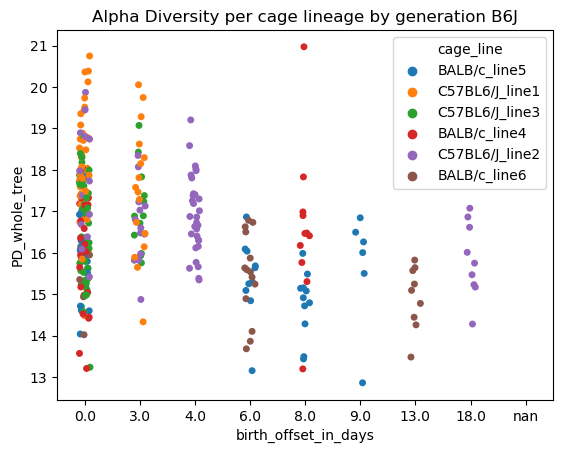

In [337]:
%matplotlib inline
import seaborn as sns
sns.stripplot(x= 'birth_offset_in_days', y='PD_whole_tree', data= alpha_results_merged_gut_stefan, hue='cage_line').set(title='Alpha Diversity per cage lineage by generation B6J')
#lt.show()
plt.savefig(work_dir + "/scatter_birth_offset.png", transparent=False, bbox_inches='tight')

In [77]:
birth_offset = meta_stefan[(meta_stefan['sample_type'] == 'colon content') & 
                                    (meta_stefan['host_scientific_name'] != 'callithrix jacchus') & 
                                    (meta_stefan['iacuc_institute'] == 'LANUV')].groupby(['genotype', 'generation', 'cage_line'])['birth_timestamp'].unique().apply(lambda x: sorted(list(map(lambda d: datetime.strptime(d, '%Y-%m-%d'), x)))).apply(lambda dates: (dates[-1] - dates[0]).days).reset_index()
birth_offset = birth_offset.rename(columns={'birth_timestamp': 'birth_offset_in_days'})
if 'birth_offset_in_days' not in meta_stefan.columns:
    meta_stefan = meta_stefan.reset_index().merge(birth_offset, left_on=['genotype','generation','cage_line'], right_on=['genotype','generation','cage_line'], how='left').set_index('sample_name')
birth_offset.head()

,genotype,generation,cage_line,birth_offset_in_days
0,balb/c,f1,BALB/c_line4,0
1,balb/c,f1,BALB/c_line5,9
2,balb/c,f2,BALB/c_line4,0
3,balb/c,f2,BALB/c_line5,0
4,balb/c,f3,BALB/c_line4,0


In [78]:
meta_stefan["birth_offset_average_generation"] = meta_stefan.groupby(['generation'])['birth_offset_in_days'].transform('mean')


<AxesSubplot:xlabel='birth_offset_in_days', ylabel='cage_line'>

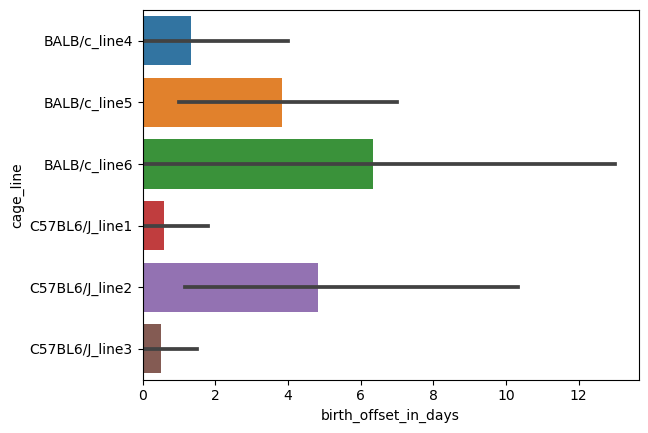

In [315]:
sns.barplot(data=birth_offset, orient='horizontal', x='birth_offset_in_days', y='cage_line')

##### Animals per Cage

In [79]:
stress = meta_stefan[(meta_stefan['sample_type'] == 'colon content') & 
                              (meta_stefan['host_scientific_name'] != 'callithrix jacchus') & 
                              (meta_stefan['iacuc_institute'] == 'LANUV')].groupby(['genotype', 'generation', 'cage_line', 'cage_id', 'sex']).size().reset_index()
stress = stress.rename(columns={0: 'animals_per_cage'})
if 'animals_per_cage' not in meta_stefan:
    meta_stefan = meta_stefan.reset_index().merge(stress, left_on=['genotype','generation','cage_line','cage_id','sex'], right_on=['genotype','generation','cage_line','cage_id','sex'], how='left').set_index('sample_name')
print(stress.shape[0])
stress.head()

141


,genotype,generation,cage_line,cage_id,sex,animals_per_cage
0,balb/c,f1,BALB/c_line4,f1-15,female,1
1,balb/c,f1,BALB/c_line4,f1-16,male,1
2,balb/c,f1,BALB/c_line4,f1-17,male,1
3,balb/c,f1,BALB/c_line4,f1-18,male,1
4,balb/c,f1,BALB/c_line4,f1-19,female,1


In [334]:
alpha_results_merged_gut_stefan = alpha_div_gut['results'].merge(meta_stefan, left_index=True, right_index=True)
alpha_results_merged_gut_stefan[alpha_results_merged_gut_stefan['genotype'].isin(['c57bl6/j', 'balb/c'])]

,observed_features,shannon,PD_whole_tree,batch,birth_timestamp,cage_group,cage_id,cage_line,collection_device,collection_method,collection_timestamp,description,dna_extracted,elevation,elevation_units,empo_1,empo_2,empo_3,env_biome,env_feature,env_material,env_package,facility,father_subject_id,father_subject_id_stefan,generation,genotype,geo_loc_name,host_age,host_age_units,host_body_habitat,host_body_product,host_body_site,host_common_name,host_height,host_height_units,host_scientific_name,host_subject_id,host_subject_id_stefan,host_taxid,host_weight,host_weight_units,iacuc_institute,iacuc_protocol_id,latitude,latitude_units,life_stage,longitude,longitude_units,mother_subject_id,mothers_subject_ids_stefan,parental_cage,physical_specimen_location,physical_specimen_remaining,qiita_study_id,sample_type,scientific_name,sex,taxon_id,title,tube_id,tube_id_plate_bmfz,birth_offset_in_days,birth_offset_average_generation,animals_per_cage
13422.181,140.5,5.281849,13.150929,1,2019-08-08,bf3-2,f3-26,BALB/c_line5,eppi,necropsy,2019-11-19,not provided,TRUE,42,meters,Host-associated,Animal,Animal distal gut,urban biome,mammalia-associated habitat,intestine environment,host-associated,spf,not provided,189923/10,f3,balb/c,Germany:Duesseldorf,15,weeks,uberon:gastrointestinal system,uberon:lumen of gut,uberon:colon,mouse,not provided,cm,mus musculus,181,198339/3,10090,21.9,grams,LANUV,G383/17,51.189401,Decimal degrees,adult,6.792239,Decimal degrees,not provided,189923/1|189923/2,f2-21,dna in freezer03.140,TRUE,13422,colon content,mouse gut metagenome,female,410661,Influence of the genetic background on murine ...,1-c4,NaN,6.0,4.134328,1.0
13422.118,149.2,4.853998,14.036759,1,2019-05-09,bf2-2,f2-21,BALB/c_line5,eppi,necropsy,2019-09-10,motherf2,TRUE,42,meters,Host-associated,Animal,Animal distal gut,urban biome,mammalia-associated habitat,intestine environment,host-associated,spf,not provided,183017/3,f2,balb/c,Germany:Duesseldorf,17,weeks,uberon:gastrointestinal system,uberon:lumen of gut,uberon:colon,mouse,not provided,cm,mus musculus,118,189923/2,10090,27.2,grams,LANUV,G383/17,51.189401,Decimal degrees,adult,6.792239,Decimal degrees,f2,183017/1|183017/2,f1-21,dna in freezer03.140,TRUE,13422,colon content,mouse gut metagenome,female,410661,Influence of the genetic background on murine ...,3-c2,NaN,0.0,0.872727,2.0
13422.127,173.0,5.696344,15.791471,1,2019-05-09,bf2-2,f2-25,BALB/c_line5,eppi,necropsy,2019-08-21,fatherf2,TRUE,42,meters,Host-associated,Animal,Animal distal gut,urban biome,mammalia-associated habitat,intestine environment,host-associated,spf,f2,183017/3,f2,balb/c,Germany:Duesseldorf,15,weeks,uberon:gastrointestinal system,uberon:lumen of gut,uberon:colon,mouse,not provided,cm,mus musculus,127,189923/11,10090,30.2,grams,LANUV,G383/17,51.189401,Decimal degrees,adult,6.792239,Decimal degrees,not provided,183017/1|183017/2,f1-21,dna in freezer03.140,TRUE,13422,colon content,mouse gut metagenome,male,410661,Influence of the genetic background on murine ...,1-c6,NaN,0.0,0.872727,1.0
13422.172,178.6,6.002551,16.712558,1,2019-07-13,cf3-3,f3-20,C57BL6/J_line3,eppi,necropsy,2019-10-28,not provided,TRUE,42,meters,Host-associated,Animal,Animal distal gut,urban biome,mammalia-associated habitat,intestine environment,host-associated,spf,not provided,189921/6,f3,c57bl6/j,Germany:Duesseldorf,15,weeks,uberon:gastrointestinal system,uberon:lumen of gut,uberon:colon,mouse,not provided,cm,mus musculus,172,195998/7,10090,32.3,grams,LANUV,G383/17,51.189401,Decimal degrees,adult,6.792239,Decimal degrees,not provided,189921/1|189921/2,f2-12,dna in freezer03.140,TRUE,13422,colon content,mouse gut metagenome,male,410661,Influence of the genetic background on murine ...,1-a12,NaN,3.0,4.134328,3.0
13422.136,188.0,5.694427,16.149064,1,2019-07-10,cf3-1,f3-4,C57BL6/J_line1,eppi,necropsy,2019-10-22,not provided,TRUE,42,meters,Host-associated,Animal,Animal distal gut,urban biome,mammalia-associated habitat,intestine environment,host-associated,spf,not provided,1

In [335]:
gut_indeces_C57B = meta_stefan[meta_stefan['genotype'].isin(['c57bl6/j']) & meta_stefan['host_body_product'].isin(['uberon:lumen of gut']) & ~meta_stefan['generation'].isin(['not applicable'])].index
data_gut_C57B_alpha = alpha_results_merged_gut.loc[alpha_results_merged_gut.index.intersection(gut_indeces_C57B)]
gut_indeces_BALB = meta_stefan[meta_stefan['genotype'].isin(['balb/c']) & meta_stefan['host_body_product'].isin(['uberon:lumen of gut']) & ~meta_stefan['generation'].isin(['not applicable'])].index
data_gut_BALB_alpha = alpha_results_merged_gut.loc[alpha_results_merged_gut.index.intersection(gut_indeces_BALB)]

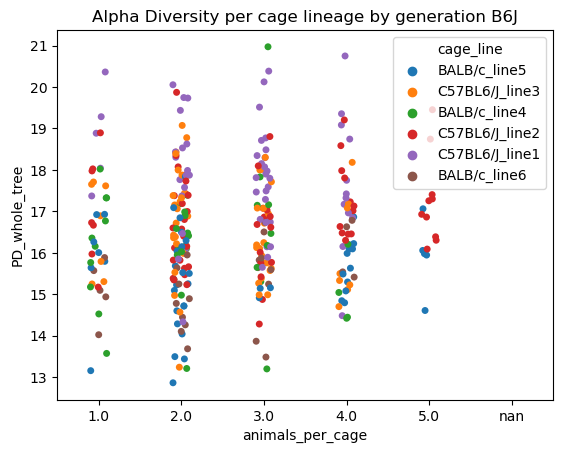

In [338]:
%matplotlib inline
import seaborn as sns
sns.stripplot(x= 'animals_per_cage', y='PD_whole_tree', data= alpha_results_merged_gut_stefan, hue='cage_line').set(title='Alpha Diversity per cage lineage by generation B6J')
#lt.show()
plt.savefig(work_dir + "/scatter_animals_per_cage.png", transparent=False, bbox_inches='tight')

### Sebum

In [85]:
filtered_sebum_table = biom2pandas(work_dir + "/exported-full-filtered-sebum-table/feature-table.biom").fillna(0)
alpha_div_sebum = alpha_diversity(filtered_sebum_table, 1000, metrics=["shannon", "observed_features", "PD_whole_tree"], num_iterations=10, reference_tree="/homes/arehm/Benga_ThreeGen/FromQiita/128106_insertion_tree.relabelled.tre", use_grid=True, dry=False)
alpha_results_merged_sebum = alpha_div_sebum['results'].merge(meta, left_index=True, right_index=True)
alpha_results_merged_sebum[alpha_results_merged_sebum['genotype'].isin(['C57BL6/J', 'BALB/c'])]

Working directory is '/homes/arehm/TMP/ana_adiv_3v8ne4rl', cachefile is '.anacache/047a3d96d0693ae413bf7dce29c34f58.adiv'. alpha_diversity: skipping check for branches without length information. Reactivate via fix_zero_len_branches=True.

Waiting for slurm-cluster job 18539129 to complete: ............................................................................................................ finished. Was removed.


,shannon,observed_features,PD_whole_tree,batch,birth_timestamp,cage_group,cage_id,collection_device,collection_method,collection_timestamp,description,dna_extracted,elevation,elevation_units,empo_1,empo_2,empo_3,env_biome,env_feature,env_material,env_package,facility,father_subject_id,generation,genotype,geo_loc_name,host_age,host_age_units,host_body_habitat,host_body_product,host_body_site,host_common_name,host_height,host_height_units,host_scientific_name,host_subject_id,host_taxid,host_weight,host_weight_units,iacuc_institute,iacuc_protocol_id,latitude,latitude_units,life_stage,longitude,longitude_units,mother_subject_id,parental_cage,physical_specimen_location,physical_specimen_remaining,qiita_study_id,sample_type,scientific_name,sex,taxon_id,title,tube_id,tube_id_plate_bmfz,gen_number,cage_lineage,i_generation,comparison
13422.181skin,4.397022,45.3,9.554526,3,2019-08-08,BF3-2,F3-26,eppi,necropsy,2019-11-19,not provided,TRUE,42,meters,Host-associated,Animal,Animal distal gut,urban biome,mammalia-associated habitat,sebum,host-associated,SPF,not provided,F3,BALB/c,Germany:Duesseldorf,15,weeks,UBERON:skin,UBERON:sebum,UBERON:skin of external ear,mouse,not provided,cm,Mus musculus,181,10090,21.9,grams,LANUV,G383/17,51.189401,Decimal degrees,adult,6.792239,Decimal degrees,not provided,F2-21,DNA in freezer03.140,TRUE,13422,skin of external ear,mouse skin metagenome,female,410661,Skin screening,6-c4,6-c4,3,C2,3: F3,0
13422.172skin,0.755893,25.8,6.055980,3,2019-07-13,CF3-3,F3-20,eppi,necropsy,2019-10-28,not provided,TRUE,42,meters,Host-associated,Animal,Animal distal gut,urban biome,mammalia-associated habitat,sebum,host-associated,SPF,not provided,F3,C57BL6/J,Germany:Duesseldorf,15,weeks,UBERON:skin,UBERON:sebum,UBERON:skin of external ear,mouse,not provided,cm,Mus musculus,172,10090,32.3,grams,LANUV,G383/17,51.189401,Decimal degrees,adult,6.792239,Decimal degrees,not provided,F2-12,DNA in freezer03.140,TRUE,13422,skin of external ear,mouse skin metagenome,male,410661,Skin screening,6-a12,6-a12,3,B3,3: F3,0
13422.118skin,2.285425,31.8,6.800866,3,2019-05-09,BF2-2,F2-21,eppi,necropsy,2019-09-10,motherF2,TRUE,42,meters,Host-associated,Animal,Animal distal gut,urban biome,mammalia-associated habitat,sebum,host-associated,SPF,not provided,F2,BALB/c,Germany:Duesseldorf,17,weeks,UBERON:skin,UBERON:sebum,UBERON:skin of external ear,mouse,not provided,cm,Mus musculus,118,10090,27.2,grams,LANUV,G383/17,51.189401,Decimal degrees,adult,6.792239,Decimal degrees,F2,F1-21,DNA in freezer03.140,TRUE,13422,skin of external ear,mouse skin metagenome,female,410661,Skin screening,8-c2,8-c2,2,C2,2: F2,0
13422.145skin,1.319375,44.1,9.465915,3,2019-07-10,CF3-2,F3-7,eppi,necropsy,2019-10-23,motherF3,TRUE,42,meters,Host-associated,Animal,Animal distal gut,urban biome,mammalia-associated habitat,sebum,host-associated,SPF,not provided,F3,C57BL6/J,Germany:Duesseldorf,15,weeks,UBERON:skin,UBERON:sebum,UBERON:skin of external ear,mouse,not provided,cm,Mus musculus,145,10090,26.5,grams,LANUV,G383/17,51.189401,Decimal degrees,adult,6.792239,Decimal degrees,F3,F2-8,DNA in freezer03.140,TRUE,13422,skin of external ear,mouse skin metagenome,female,410661,Skin screening,7-d10,7-d10,3,B2,3: F3,0
13422.154skin,5.182538,60.9,10.190710,3,2019-07-14,CF3-2,F3-12,eppi,necropsy,2019-10-29,not provided,TRUE,42,meters,Host-associated,Animal,Animal distal gut,urban biome,mammalia-associated habitat,sebum,host-associated,SPF,not provided,F3,C57BL6/J,Germany:Duesseldorf,15,weeks,UBERON:skin,UBERON:sebum,UBERON:skin of external ear,mouse,not provided,cm,Mus musculus,154,10090,31.4,grams,LANUV,G383/17,51.189401,Decimal degrees,adult,6.792239,Decimal degrees,not provided,F2-8,DNA in freezer03.140,TRUE,13422,skin of external ear,mouse skin metagenome,male,410661,Skin screening,9-c8,9-c8,3,B2,3: F3,0
13422.163skin,4.295028,33.4,6.234328,3,2019-07-10,CF3-3,F3-16,eppi,necropsy,2019-10-24,fatherF3,TRUE,42,meters,Host-associated,Animal,Animal distal gut,urban biome,mammalia-associated ha

In [85]:
RM_shannon_average = np.mean(alpha_results_merged_sebum[alpha_results_merged_sebum['generation'].isin(['RM'])]['shannon'])
RM_shannon_std = np.std(alpha_results_merged_sebum[alpha_results_merged_sebum['generation'].isin(['RM'])]['shannon'])
RM_PD_average = np.mean(alpha_results_merged_sebum[alpha_results_merged_sebum['generation'].isin(['RM'])]['PD_whole_tree'])
RM_PD_std = np.std(alpha_results_merged_sebum[alpha_results_merged_sebum['generation'].isin(['RM'])]['PD_whole_tree'])
RM_observed_average = np.mean(alpha_results_merged_sebum[alpha_results_merged_sebum['generation'].isin(['RM'])]['observed_features'])
RM_observed_std = np.std(alpha_results_merged_sebum[alpha_results_merged_sebum['generation'].isin(['RM'])]['observed_features'])

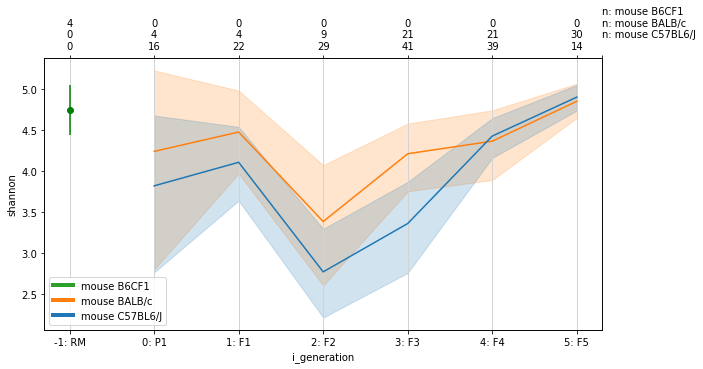

In [86]:
%matplotlib inline

metric = 'shannon'
fig, axes = plt.subplots(1,1, figsize=(10,5))
a_data = plot_timecourse(meta[meta['genotype'].isin(['C57BL6/J','BALB/c', 'B6CF1']) & meta['host_common_name'].isin(['mouse']) & ~meta['generation'].isin(['not applicable'])],
                data=alpha_div_sebum['results'][metric],
                col_events='i_generation', col_entities=None,
                cols_groups=['host_common_name', 'genotype'],
                #test_groups=[(('mouse', 'C57BL6/J'), ('mouse', 'BALB/c'))],
                test_groups=None,
                pthreshold=0.05, print_samplesizes=True,
                ax=axes,
                colors_groups={('mouse', 'BALB/c'): "tab:orange", ('mouse', 'C57BL6/J'): "tab:blue"})
plt.scatter("-1: RM", RM_shannon_average, color='green')
plt.errorbar(["-1: RM"], [RM_shannon_average], yerr=RM_shannon_std, color='green')
#handles, labels = fig.get_legend_handles_labels()
labels = ['BALB/c', 'C57BL/6J', 'B6CF1']
#plt.legend(handles, labels, loc=2)
#axes.legend(labels=['BALB/c', 'C57BL/6J', 'B6CF1'])
plt.savefig(work_dir + "/alpha_sebum_timeline_shannon.png", transparent=False, bbox_inches="tight", facecolor='white')

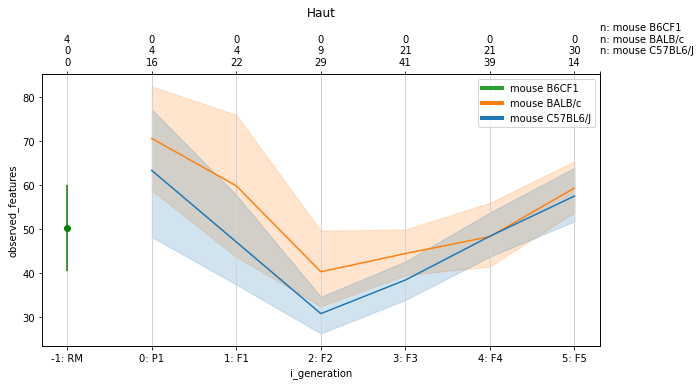

In [87]:
%matplotlib inline

metric = 'observed_features'
fig, axes = plt.subplots(1,1, figsize=(10,5))
a_data = plot_timecourse(meta[meta['genotype'].isin(['C57BL6/J','BALB/c', 'B6CF1']) & meta['host_common_name'].isin(['mouse']) & ~meta['generation'].isin(['not applicable'])],
                data=alpha_div_sebum['results'][metric],
                col_events='i_generation', col_entities=None,
                cols_groups=['host_common_name', 'genotype'],
                #test_groups=[(('mouse', 'C57BL6/J'), ('mouse', 'BALB/c'))],
                test_groups=None,
                pthreshold=0.05, print_samplesizes=True,
                ax=axes,
                colors_groups={('mouse', 'BALB/c'): "tab:orange", ('mouse', 'C57BL6/J'): "tab:blue"})
plt.scatter("-1: RM", RM_observed_average, color='green')
plt.errorbar(["-1: RM"], [RM_observed_average], yerr=RM_observed_std, color='green')
#handles, labels = fig.get_legend_handles_labels()
labels = ['BALB/c', 'C57BL/6J', 'B6CF1']
#plt.legend(handles, labels, loc=2)
plt.title('Haut')
plt.savefig(work_dir + "/alpha_sebum_timeline_observed_features.png", transparent=False, bbox_inches="tight", facecolor='white')

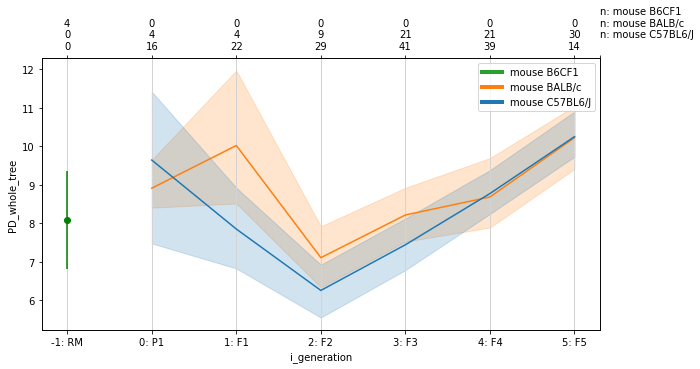

In [88]:
%matplotlib inline

metric = 'PD_whole_tree'
fig, axes = plt.subplots(1,1, figsize=(10,5))
a_data = plot_timecourse(meta[meta['genotype'].isin(['C57BL6/J','BALB/c', 'B6CF1']) & meta['host_common_name'].isin(['mouse']) & ~meta['generation'].isin(['not applicable'])],
                data=alpha_div_sebum['results'][metric],
                col_events='i_generation', col_entities=None,
                cols_groups=['host_common_name', 'genotype'],
                #test_groups=[(('mouse', 'C57BL6/J'), ('mouse', 'BALB/c'))],
                test_groups=None,
                pthreshold=0.05, print_samplesizes=True,
                ax=axes,
                colors_groups={('mouse', 'BALB/c'): "tab:orange", ('mouse', 'C57BL6/J'): "tab:blue"})
plt.scatter("-1: RM", RM_PD_average, color='green')
plt.errorbar(["-1: RM"], [RM_PD_average], yerr=RM_PD_std, color='green')
#handles, labels = fig.get_legend_handles_labels()
labels = ['BALB/c', 'C57BL/6J', 'B6CF1']
#plt.legend(handles, labels, loc=2)
#axes.legend(labels=['BALB/c', 'C57BL/6J'])
plt.savefig(work_dir + "/alpha_sebum_timeline_PD_whole_tree.png", transparent=False, bbox_inches="tight", facecolor='white')

## Beta Diversity

### Gut

#### All samples

In [12]:
rarified_gut_table = biom2pandas(work_dir + "/exported-rarefied6000-filtered-gut-table/feature-table.biom").fillna(0)

In [13]:
res_beta_gut = beta_diversity(rarified_gut_table, metrics=["unweighted_unifrac","weighted_unifrac","bray_curtis"], reference_tree="/homes/arehm/Benga_ThreeGen/FromQiita/128106_insertion_tree.relabelled.tre", use_grid=True, dry=False)

Using existing results from '.anacache/86d43a81048a7cb148c157fec8a439d1.bdiv'. 


In [14]:
emperor(meta, res_beta_gut['results'], "Beta_Diversity", other_beta_diversities=None, infix="gut", run_tsne_umap=False, ppn=1, use_grid=True, dry=False)

Working directory is '/homes/arehm/TMP/ana_emperor_lto82wq8', cachefile is '.anacache/023a29aca0286e3a5c727551cd349710.emperor'. Info: reducing number of samples for Emperor plot to 353
/homes/arehm/Documents/Thesis/ggmap/ggmap/analyses.py:2737: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  args['metadata'].loc[samples, :].to_csv(

Waiting for slurm-cluster job 18054950 to complete: .................................................. finished. Was removed.


{'results': {'unweighted_unifrac': 'Beta_Diversity/emperor-pcoagut_unweighted_unifrac.qzv',
  'weighted_unifrac': 'Beta_Diversity/emperor-pcoagut_weighted_unifrac.qzv',
  'bray_curtis': 'Beta_Diversity/emperor-pcoagut_bray_curtis.qzv'},
 'workdir': '/homes/arehm/TMP/ana_emperor_lto82wq8',
 'qid': '18054950',
 'file_cache': '.anacache/023a29aca0286e3a5c727551cd349710.emperor',
 'cached_inputs': {'metadata': 'f3fbe6f31db0008fb2ff4fc3fd6622a9',
  'beta_diversities': '76a4a5d1dc9b571fc496858bb5d7d4d1',
  'other_beta_diversities': None},
 'timing': ['Linux rs700-bcf-5 5.15.0-67-generic #74~20.04.1-Ubuntu SMP Wed Feb 22 14:52:34 UTC 2023 x86_64 x86_64 x86_64 GNU/Linux\n',
  '\tCommand being timed: "qiime tools import --input-path /homes/arehm/TMP/ana_emperor_lto82wq8/unweighted_unifrac --type DistanceMatrix --output-path /homes/arehm/TMP/ana_emperor_lto82wq8/beta_unweighted_unifrac.qza"\n',
  '\tUser time (seconds): 9.26\n',
  '\tSystem time (seconds): 7.28\n',
  '\tPercent of CPU this job g

In [25]:
meta.loc[['13422.217']]

,batch,birth_timestamp,cage_group,cage_id,collection_device,collection_method,collection_timestamp,description,dna_extracted,elevation,elevation_units,empo_1,empo_2,empo_3,env_biome,env_feature,env_material,env_package,facility,father_subject_id,generation,genotype,geo_loc_name,host_age,host_age_units,host_body_habitat,host_body_product,host_body_site,host_common_name,host_height,host_height_units,host_scientific_name,host_subject_id,host_taxid,host_weight,host_weight_units,iacuc_institute,iacuc_protocol_id,latitude,latitude_units,life_stage,longitude,longitude_units,mother_subject_id,parental_cage,physical_specimen_location,physical_specimen_remaining,qiita_study_id,sample_type,scientific_name,sex,taxon_id,title,tube_id,tube_id_plate_bmfz,gen_number,cage_lineage,i_generation,comparison
sample_name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
13422.217,1,2019-09-18,CF4-2,F4-11,eppi,necropsy,2020-01-07,not provided,TRUE,42,meters,Host-associated,Animal,Animal distal gut,urban biome,mammalia-associated habitat,intestine environment,host-associated,SPF,not provided,F4,C57BL6/J,Germany:Duesseldorf,15,weeks,UBERON:gastrointestinal system,UBERON:lumen of gut,UBERON:colon,mouse,not provided,cm,Mus musculus,217,10090,22.4,grams,LANUV,O383/17,51.189401,Decimal degrees,adult,6.792239,Decimal degrees,not provided,F3-7,DNA in freezer03.140,TRUE,13422,colon content,mouse gut metagenome,female,410661,Influence of the genetic background on murine ...,3-a8,NaN,4,B2,4: F4,0


#### Only Mice with Comparison Mice

In [14]:
meta_rarified = meta.loc[list(rarified_gut_table.columns.values)]
condition = list(meta_rarified[meta_rarified['host_common_name'].isin(['mouse']) & meta_rarified['host_body_product'].isin(['UBERON:lumen of gut'])].index.values)
mice_with_comp = rarified_gut_table[condition]

In [15]:
res_beta_gut_with_comp = beta_diversity(mice_with_comp, metrics=["unweighted_unifrac","weighted_unifrac","bray_curtis"], reference_tree="/homes/arehm/Benga_ThreeGen/FromQiita/128106_insertion_tree.relabelled.tre", use_grid=True, dry=False)

Using existing results from '.anacache/3af0253bf1939d699b8a998509089aeb.bdiv'. 


In [31]:
emperor(meta, res_beta_gut_with_comp['results'], "Beta_Diversity", other_beta_diversities=None, infix="_gut_with_comp", run_tsne_umap=False, ppn=1, use_grid=True, dry=False)

Using existing results from '.anacache/023a29aca0286e3a5c727551cd349710.emperor'. 


{'results': {'unweighted_unifrac': 'Beta_Diversity/emperor-pcoagut_unweighted_unifrac.qzv',
  'weighted_unifrac': 'Beta_Diversity/emperor-pcoagut_weighted_unifrac.qzv',
  'bray_curtis': 'Beta_Diversity/emperor-pcoagut_bray_curtis.qzv'},
 'workdir': '/homes/arehm/TMP/ana_emperor_lto82wq8',
 'qid': '18054950',
 'file_cache': '.anacache/023a29aca0286e3a5c727551cd349710.emperor',
 'cached_inputs': {'metadata': 'f3fbe6f31db0008fb2ff4fc3fd6622a9',
  'beta_diversities': '76a4a5d1dc9b571fc496858bb5d7d4d1',
  'other_beta_diversities': None},
 'timing': ['Linux rs700-bcf-5 5.15.0-67-generic #74~20.04.1-Ubuntu SMP Wed Feb 22 14:52:34 UTC 2023 x86_64 x86_64 x86_64 GNU/Linux\n',
  '\tCommand being timed: "qiime tools import --input-path /homes/arehm/TMP/ana_emperor_lto82wq8/unweighted_unifrac --type DistanceMatrix --output-path /homes/arehm/TMP/ana_emperor_lto82wq8/beta_unweighted_unifrac.qza"\n',
  '\tUser time (seconds): 9.26\n',
  '\tSystem time (seconds): 7.28\n',
  '\tPercent of CPU this job g

#### Only Mice without Comparison

In [16]:
meta_rarified = meta.loc[list(rarified_gut_table.columns.values)]
condition = list(meta_rarified[meta_rarified['host_common_name'].isin(['mouse']) & meta_rarified['host_body_product'].isin(['UBERON:lumen of gut']) & meta_rarified['comparison'].isin([0])].index.values)
mice_no_comp_gut = rarified_gut_table[condition]

In [17]:
res_beta_gut_no_comp = beta_diversity(mice_no_comp_gut, metrics=["unweighted_unifrac","weighted_unifrac","bray_curtis"], reference_tree="/homes/arehm/Benga_ThreeGen/FromQiita/128106_insertion_tree.relabelled.tre", use_grid=True, dry=False)

Using existing results from '.anacache/7d21b6434724676190c537f4b0c09518.bdiv'. 


In [ ]:
emperor(meta, res_beta_gut_no_comp['results'], "Beta_Diversity", other_beta_diversities=None, infix="_gut_no_comp", run_tsne_umap=False, ppn=1, use_grid=True, dry=False)

Working directory is '/homes/arehm/TMP/ana_emperor_xvlmh3h1', cachefile is '.anacache/ffab715b56b0b2535ee692b3e0e418f0.emperor'. Info: reducing number of samples for Emperor plot to 309
/homes/arehm/Documents/Thesis/ggmap/ggmap/analyses.py:2737: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  args['metadata'].loc[samples, :].to_csv(

Waiting for slurm-cluster job 18115495 to complete: ............................................................................................................................

### Sebum

#### All Samples

In [18]:
rarified_sebum_table = biom2pandas(work_dir + "/exported-rarified-filtered-sebum-table/feature-table.biom").fillna(0)

In [19]:
res_beta_sebum = beta_diversity(rarified_sebum_table, metrics=["unweighted_unifrac","weighted_unifrac","bray_curtis"], reference_tree="/homes/arehm/Benga_ThreeGen/FromQiita/128106_insertion_tree.relabelled.tre", use_grid=True, dry=False)

Using existing results from '.anacache/4a68cadd00088ec0bfe44b903c989dd6.bdiv'. 


In [54]:
emperor(meta, res_beta_sebum['results'], "Beta_Diversity", other_beta_diversities=None, infix="_sebum", run_tsne_umap=False, ppn=1, use_grid=True, dry=False)

Working directory is '/homes/arehm/TMP/ana_emperor_c9wgjako', cachefile is '.anacache/54516bab0851fc5409e1177bf09ac5d4.emperor'. Info: reducing number of samples for Emperor plot to 274
/homes/arehm/Documents/Thesis/ggmap/ggmap/analyses.py:2737: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  args['metadata'].loc[samples, :].to_csv(

Waiting for slurm-cluster job 18063378 to complete: ..................................................................... finished. Was removed.


{'results': {'unweighted_unifrac': 'Beta_Diversity/emperor-pcoa_sebum_unweighted_unifrac.qzv',
  'weighted_unifrac': 'Beta_Diversity/emperor-pcoa_sebum_weighted_unifrac.qzv',
  'bray_curtis': 'Beta_Diversity/emperor-pcoa_sebum_bray_curtis.qzv'},
 'workdir': '/homes/arehm/TMP/ana_emperor_c9wgjako',
 'qid': '18063378',
 'file_cache': '.anacache/54516bab0851fc5409e1177bf09ac5d4.emperor',
 'cached_inputs': {'metadata': 'f3fbe6f31db0008fb2ff4fc3fd6622a9',
  'beta_diversities': 'e03ffa81cc461c94d85c29d795e2710c',
  'other_beta_diversities': None},
 'timing': ['Linux rs700-bcf-5 5.15.0-67-generic #74~20.04.1-Ubuntu SMP Wed Feb 22 14:52:34 UTC 2023 x86_64 x86_64 x86_64 GNU/Linux\n',
  '\tCommand being timed: "qiime tools import --input-path /homes/arehm/TMP/ana_emperor_c9wgjako/weighted_unifrac --type DistanceMatrix --output-path /homes/arehm/TMP/ana_emperor_c9wgjako/beta_weighted_unifrac.qza"\n',
  '\tUser time (seconds): 9.43\n',
  '\tSystem time (seconds): 7.61\n',
  '\tPercent of CPU this 

#### Only Mice with Comparison Mice

In [20]:
meta_rarified = meta.loc[list(rarified_sebum_table.columns.values)]
condition = list(meta_rarified[meta_rarified['host_common_name'].isin(['mouse']) & meta_rarified['host_body_product'].isin(['UBERON:sebum'])].index.values)
mice_with_comp_sebum = rarified_sebum_table[condition]

In [21]:
res_beta_sebum_with_comp = beta_diversity(mice_with_comp_sebum, metrics=["unweighted_unifrac","weighted_unifrac","bray_curtis"], reference_tree="/homes/arehm/Benga_ThreeGen/FromQiita/128106_insertion_tree.relabelled.tre", use_grid=True, dry=False)

Using existing results from '.anacache/4a68cadd00088ec0bfe44b903c989dd6.bdiv'. 


In [38]:
emperor(meta, res_beta_sebum_with_comp['results'], "Beta_Diversity", other_beta_diversities=None, infix="_sebum_with_comp", run_tsne_umap=False, ppn=1, use_grid=True, dry=False)

Using existing results from '.anacache/54516bab0851fc5409e1177bf09ac5d4.emperor'. 


{'results': {'unweighted_unifrac': 'Beta_Diversity/emperor-pcoa_sebum_unweighted_unifrac.qzv',
  'weighted_unifrac': 'Beta_Diversity/emperor-pcoa_sebum_weighted_unifrac.qzv',
  'bray_curtis': 'Beta_Diversity/emperor-pcoa_sebum_bray_curtis.qzv'},
 'workdir': '/homes/arehm/TMP/ana_emperor_c9wgjako',
 'qid': '18063378',
 'file_cache': '.anacache/54516bab0851fc5409e1177bf09ac5d4.emperor',
 'cached_inputs': {'metadata': 'f3fbe6f31db0008fb2ff4fc3fd6622a9',
  'beta_diversities': 'e03ffa81cc461c94d85c29d795e2710c',
  'other_beta_diversities': None},
 'timing': ['Linux rs700-bcf-5 5.15.0-67-generic #74~20.04.1-Ubuntu SMP Wed Feb 22 14:52:34 UTC 2023 x86_64 x86_64 x86_64 GNU/Linux\n',
  '\tCommand being timed: "qiime tools import --input-path /homes/arehm/TMP/ana_emperor_c9wgjako/weighted_unifrac --type DistanceMatrix --output-path /homes/arehm/TMP/ana_emperor_c9wgjako/beta_weighted_unifrac.qza"\n',
  '\tUser time (seconds): 9.43\n',
  '\tSystem time (seconds): 7.61\n',
  '\tPercent of CPU this 

#### Only Mice without Comparison

In [22]:
meta_rarified = meta.loc[list(rarified_sebum_table.columns.values)]
condition = list(meta_rarified[meta_rarified['host_common_name'].isin(['mouse']) & meta_rarified['host_body_product'].isin(['UBERON:sebum']) & meta_rarified['comparison'].isin([0])].index.values)
mice_no_comp_sebum = rarified_sebum_table[condition]

In [23]:
res_beta_sebum_no_comp = beta_diversity(mice_no_comp_sebum, metrics=["unweighted_unifrac","weighted_unifrac","bray_curtis"], reference_tree="/homes/arehm/Benga_ThreeGen/FromQiita/128106_insertion_tree.relabelled.tre", use_grid=True, dry=False)

Using existing results from '.anacache/e94c73a3bd5335bea3d89e962b176399.bdiv'. 


In [ ]:
emperor(meta, res_beta_sebum_no_comp['results'], "Beta_Diversity", other_beta_diversities=None, infix="_sebum_no_comp", run_tsne_umap=False, ppn=1, use_grid=True, dry=False)

## Upsetplot

In [8]:
import upsetplot
from upsetplot import UpSet
from upsetplot import from_memberships
from upsetplot import plot
from matplotlib import cm
import matplotlib.pyplot as plt

In [9]:
def make_UpSet(category, upset_taxa_gut, plotname):
    position_category_column = upset_taxa_gut.columns.get_loc(category)
    up_to_gen = upset_taxa_gut.drop(upset_taxa_gut.iloc[:, (position_category_column+1):335],axis = 1)
    only_gen = up_to_gen.drop(up_to_gen.iloc[:, 277:position_category_column], axis = 1)
    taxa_sum = only_gen.groupby(category).sum()
    taxa_sum = taxa_sum.loc[:,~taxa_sum.columns.str.endswith("__")]
    taxa_sum = taxa_sum.loc[:, (taxa_sum != 0).any(axis=0)]
    taxa_sum = taxa_sum.transpose()
    over_zero = taxa_sum > 0
    over_zero = over_zero.rename(columns=lambda x: x + ' ')
    upset_combined = pd.concat([taxa_sum, over_zero],axis=1)
    upset_combined['taxa1'] = upset_combined.index
    upset_combined['taxa'] = upset_combined['taxa1'].str.split(';', expand=True)[5]
    upset_combined = upset_combined.drop(["taxa1"], axis=1)
    upset_combined = upset_combined.set_index(list(over_zero.columns))
    #upset = UpSet(upset_combined, subset_size='count', intersection_plot_elements=0, show_counts=True)
    plot(upset_combined, show_counts=True, subset_size="count", sort_categories_by="-input")
    #upset.add_stacked_bars(by="taxa")
    #upset.add_stacked_bars(by="taxa", elements=10, colors=cm.gist_stern)
    #upset.plot()
    #plt.legend(bbox_to_anchor=(1.04, 0.5), loc="center left", borderaxespad=0, title=f'Colours for taxa')
    plt.suptitle(f'UpSet plot for Genus divided by {category}')
    #plt.style.use("ggplot")
    plt.savefig(work_dir + f"/{plotname}.svg", transparent=False, bbox_inches='tight')
    plt.show()

### UpSet Plots für Genotypen

In [10]:
#prepare taxa_all_l6 table
upset_taxa_gut= taxa_all_l6[taxa_all_l6['host_body_product'].isin(['UBERON:lumen of gut']) & taxa_all_l6['host_scientific_name'].isin(['Mus musculus']) & ~taxa_all_l6['generation'].isin(['not applicable'])]

/tmp/ipykernel_2675707/3444097880.py:5: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  taxa_sum = only_gen.groupby(category).sum()


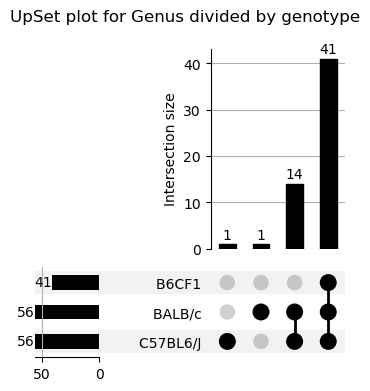

In [11]:
make_UpSet("genotype", upset_taxa_gut, "upset_gut_genotype")

#### BALB/c

In [12]:
upset_taxa_gut_BALB= taxa_all_l6[taxa_all_l6['host_body_product'].isin(['UBERON:lumen of gut']) & taxa_all_l6['genotype'].isin(['BALB/c', 'B6CF1'])& taxa_all_l6['host_scientific_name'].isin(['Mus musculus']) & ~taxa_all_l6['generation'].isin(['not applicable'])]

/tmp/ipykernel_2675707/3444097880.py:5: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  taxa_sum = only_gen.groupby(category).sum()


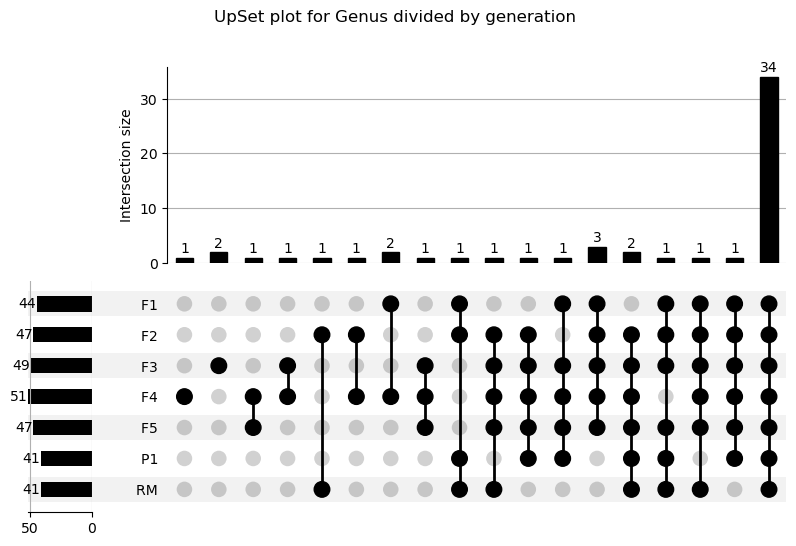

In [13]:
make_UpSet('generation', upset_taxa_gut_BALB, "upset_gut_BALB_generation")

##### Cage Lineage

/tmp/ipykernel_2675707/3444097880.py:5: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  taxa_sum = only_gen.groupby(category).sum()


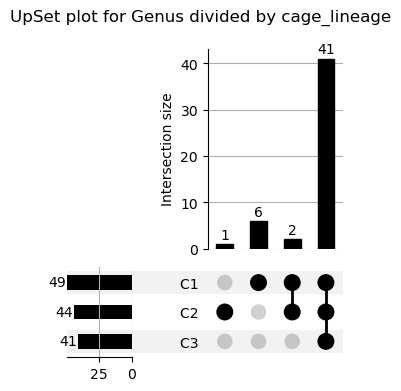

In [14]:
make_UpSet("cage_lineage", upset_taxa_gut_BALB[upset_taxa_gut_BALB['genotype'].isin(['BALB/c'])], "upset_gut_BALB_cagelineage")

#### B6J

In [15]:
upset_taxa_gut_B6J= taxa_all_l6[taxa_all_l6['host_body_product'].isin(['UBERON:lumen of gut']) & taxa_all_l6['genotype'].isin(['C57BL6/J', 'B6CF1'])& taxa_all_l6['host_scientific_name'].isin(['Mus musculus']) & ~taxa_all_l6['generation'].isin(['not applicable'])]

/tmp/ipykernel_2675707/3444097880.py:5: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  taxa_sum = only_gen.groupby(category).sum()


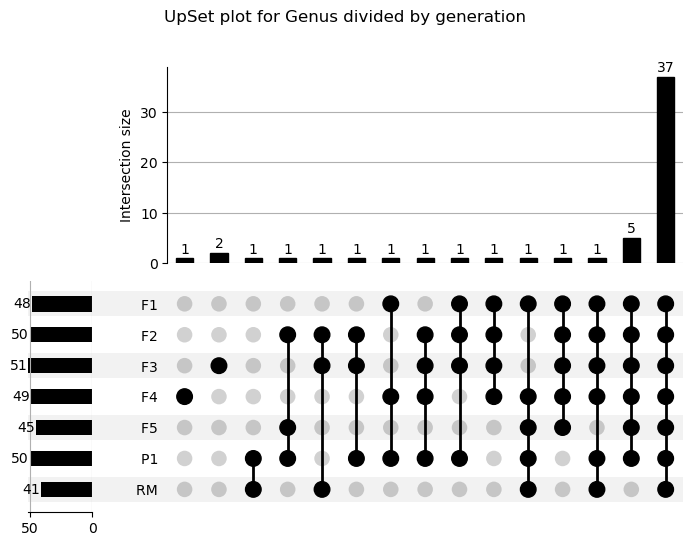

In [16]:
make_UpSet("generation", upset_taxa_gut_B6J, "upset_gut_B6J_generation")

##### Cage Lineage

/tmp/ipykernel_2675707/3444097880.py:5: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  taxa_sum = only_gen.groupby(category).sum()


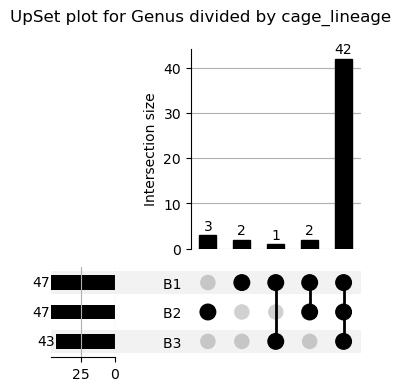

In [17]:
make_UpSet("cage_lineage", upset_taxa_gut_B6J[upset_taxa_gut_B6J['genotype'].isin(['C57BL6/J'])], "upset_gut_B6J_cagelineage")

### Sebum

In [18]:
import matplotlib.pyplot as plt

In [19]:
#prepare taxa_all_l6 table
upset_taxa_sebum= taxa_all_l6[taxa_all_l6['host_body_product'].isin(['UBERON:sebum']) & taxa_all_l6['host_scientific_name'].isin(['Mus musculus']) & ~taxa_all_l6['generation'].isin(['not applicable'])]

/tmp/ipykernel_2675707/3444097880.py:5: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  taxa_sum = only_gen.groupby(category).sum()


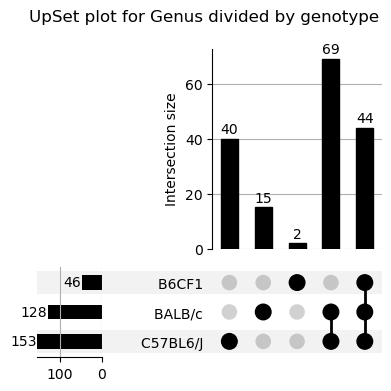

In [20]:
make_UpSet("genotype", upset_taxa_sebum, "upset_sebum_genotype")

#### BALB/c

In [21]:
upset_taxa_sebum_BALB= taxa_all_l6[taxa_all_l6['host_body_product'].isin(['UBERON:sebum']) & taxa_all_l6['genotype'].isin(['BALB/c', 'B6CF1'])& taxa_all_l6['host_scientific_name'].isin(['Mus musculus']) & ~taxa_all_l6['generation'].isin(['not applicable'])]

/tmp/ipykernel_2675707/3444097880.py:5: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  taxa_sum = only_gen.groupby(category).sum()


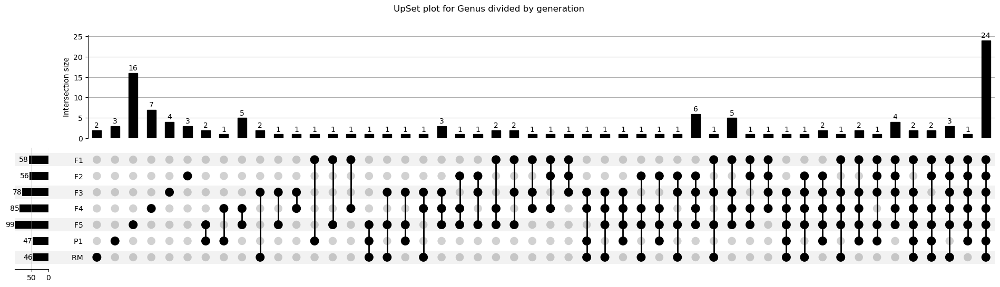

In [22]:
make_UpSet('generation', upset_taxa_sebum_BALB, "upset_sebum_BALB_generation")

##### Cage Lineage

/tmp/ipykernel_2675707/3444097880.py:5: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  taxa_sum = only_gen.groupby(category).sum()


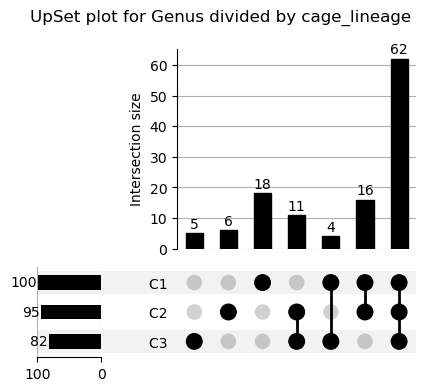

In [23]:
make_UpSet("cage_lineage", upset_taxa_sebum_BALB[upset_taxa_sebum_BALB['genotype'].isin(['BALB/c'])], "upset_sebum_BALB_cagelineage")

#### B6J

In [24]:
upset_taxa_sebum_B6J= taxa_all_l6[taxa_all_l6['host_body_product'].isin(['UBERON:sebum']) & taxa_all_l6['genotype'].isin(['C57BL6/J'])& taxa_all_l6['host_scientific_name'].isin(['Mus musculus']) & ~taxa_all_l6['generation'].isin(['not applicable'])]

/tmp/ipykernel_2675707/3444097880.py:5: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  taxa_sum = only_gen.groupby(category).sum()


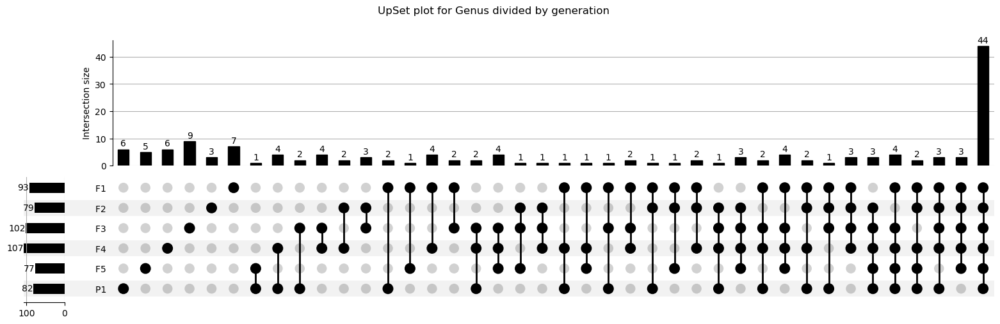

In [25]:
make_UpSet("generation", upset_taxa_sebum_B6J, "upset_sebum_B6J_generation")

##### Cage Lineage

/tmp/ipykernel_2675707/3444097880.py:5: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  taxa_sum = only_gen.groupby(category).sum()


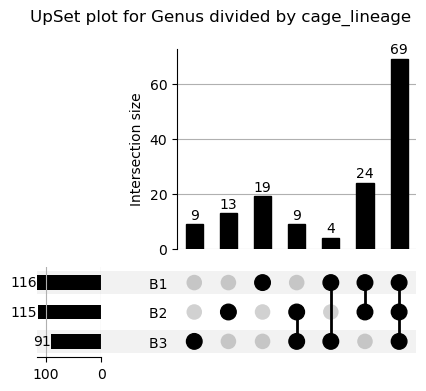

In [26]:
make_UpSet("cage_lineage", upset_taxa_sebum_B6J[upset_taxa_sebum_B6J["genotype"].isin(["C57BL6/J"])], "upset_sebum_B6J_cagelineage")

## Statistics

In [24]:
def permanova_beta (condition, dm, comp_group):
    counts = condition[comp_group].value_counts()
    idx = condition.index
    results = permanova(dm.filter(idx), meta.loc[idx, comp_group], permutations = 999)
    return counts, results

### Gut
Wir vergleichen alle Betadiversitätergebnisse von Maussamples aus dem Darm, mit und ohne Vergleichsmäuse. Dabei werden die Genotypen verglichen!
#### Gut with Comparison

In [49]:
dm_gut_comp = res_beta_gut_with_comp['results']['weighted_unifrac']

In [50]:
genotype_dm = meta.loc[dm_gut_comp.ids,:][meta['genotype'].isin(['C57BL6/J', 'BALB/c'])]

/tmp/ipykernel_2558669/218728503.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  genotype_dm = meta.loc[dm_gut_comp.ids,:][meta['genotype'].isin(['C57BL6/J', 'BALB/c'])]


In [51]:
permanova_beta(genotype_dm, dm_gut_comp, "genotype")

(C57BL6/J    201
 BALB/c      126
 Name: genotype, dtype: int64,
 method name               PERMANOVA
 test statistic name        pseudo-F
 sample size                     327
 number of groups                  2
 test statistic            54.585639
 p-value                       0.001
 number of permutations          999
 Name: PERMANOVA results, dtype: object)

#### Janvier vs. Düsseldorf

In [52]:
comparison = meta.loc[dm_gut_comp.ids,:][meta['comparison'].isin([1])]
permanova_beta(comparison, dm_gut_comp, "genotype")

/tmp/ipykernel_2558669/3558407506.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_comp.ids,:][meta['comparison'].isin([1])]


(BALB/c      12
 C57BL6/J    12
 Name: genotype, dtype: int64,
 method name               PERMANOVA
 test statistic name        pseudo-F
 sample size                      24
 number of groups                  2
 test statistic             4.745506
 p-value                       0.002
 number of permutations          999
 Name: PERMANOVA results, dtype: object)

Im Vergleich sind die Unterschiede zwischen den Genotypen aus Dússeldorf und Janvier nicht signifikant.

Vergleich zwischen den Balb und C57B Mäusen aus Janvier und aus Düsseldorf.

In [53]:
for genotype in ["C57BL6/J", "BALB/c"]:
    comparison = meta.loc[dm_gut_comp.ids,:][meta['comparison'].isin([1]) & meta['genotype'].isin([genotype])]
    result = permanova_beta(comparison, dm_gut_comp, "geo_loc_name")
    print (f"{genotype} \n {result}")

C57BL6/J 
 (Germany:Duesseldorf    6
France:Janvier         6
Name: geo_loc_name, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      12
number of groups                  2
test statistic             9.309843
p-value                       0.004
number of permutations          999
Name: PERMANOVA results, dtype: object)
BALB/c 
 (France:Janvier         6
Germany:Duesseldorf    6
Name: geo_loc_name, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      12
number of groups                  2
test statistic              5.49228
p-value                       0.003
number of permutations          999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_2558669/2081450955.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_comp.ids,:][meta['comparison'].isin([1]) & meta['genotype'].isin([genotype])]
/tmp/ipykernel_2558669/2081450955.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_comp.ids,:][meta['comparison'].isin([1]) & meta['genotype'].isin([genotype])]


In [54]:
for city in ["France:Janvier", "Germany:Duesseldorf"]:
    comparison = meta.loc[dm_gut_comp.ids,:][meta['comparison'].isin([1]) & meta['geo_loc_name'].isin([city])]
    result = permanova_beta(comparison, dm_gut_comp, "genotype")
    print (f"{city} \n {result}")

France:Janvier 
 (BALB/c      6
C57BL6/J    6
Name: genotype, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      12
number of groups                  2
test statistic             4.363321
p-value                       0.007
number of permutations          999
Name: PERMANOVA results, dtype: object)
Germany:Duesseldorf 
 (BALB/c      6
C57BL6/J    6
Name: genotype, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      12
number of groups                  2
test statistic             5.420339
p-value                       0.001
number of permutations          999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_2558669/4016367376.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_comp.ids,:][meta['comparison'].isin([1]) & meta['geo_loc_name'].isin([city])]
/tmp/ipykernel_2558669/4016367376.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_comp.ids,:][meta['comparison'].isin([1]) & meta['geo_loc_name'].isin([city])]


##### BALB/c

In [55]:
for genotype in ['BALB/c', 'C57BL6/J']:
    comparison = meta.loc[dm_gut_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c'])) | (meta['comparison'].isin([1]) & meta['genotype'].isin([genotype]))]
    result = permanova_beta(comparison, dm_gut_comp, "comparison")
    print (f"BALB/c experiment + {genotype} comparison \n {result}")
    for city in ['France:Janvier', 'Germany:Duesseldorf']:
        comparison = meta.loc[dm_gut_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c'])) | (meta['comparison'].isin([1]) & meta['geo_loc_name'].isin([city]) & meta['genotype'].isin([genotype]))]
        result = permanova_beta(comparison, dm_gut_comp, "comparison")
        print (f"BALB/c experiment + {genotype}-{city} comparison \n {result}")

/tmp/ipykernel_2558669/1697639687.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c'])) | (meta['comparison'].isin([1]) & meta['genotype'].isin([genotype]))]
/tmp/ipykernel_2558669/1697639687.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c'])) | (meta['comparison'].isin([1]) & meta['geo_loc_name'].isin([city]) & meta['genotype'].isin([genotype]))]
/tmp/ipykernel_2558669/1697639687.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c'])) | (meta['comparison'].isin([1]) & meta['geo_loc_name'].isin([city]) & meta['genotype'].isin([genotype]))]
/tmp/ipykernel_2558669/1697639687.py:2: 

BALB/c experiment + BALB/c comparison 
 (0    114
1     12
Name: comparison, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                     126
number of groups                  2
test statistic              5.09755
p-value                       0.004
number of permutations          999
Name: PERMANOVA results, dtype: object)
BALB/c experiment + BALB/c-France:Janvier comparison 
 (0    114
1      6
Name: comparison, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                     120
number of groups                  2
test statistic             6.547177
p-value                       0.003
number of permutations          999
Name: PERMANOVA results, dtype: object)
BALB/c experiment + BALB/c-Germany:Duesseldorf comparison 
 (0    114
1      6
Name: comparison, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                     120


/tmp/ipykernel_2558669/1697639687.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c'])) | (meta['comparison'].isin([1]) & meta['geo_loc_name'].isin([city]) & meta['genotype'].isin([genotype]))]
/tmp/ipykernel_2558669/1697639687.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c'])) | (meta['comparison'].isin([1]) & meta['geo_loc_name'].isin([city]) & meta['genotype'].isin([genotype]))]


In [56]:
for city in ['France:Janvier', 'Germany:Duesseldorf']:
    comparison = meta.loc[dm_gut_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c'])) | (meta['comparison'].isin([1]) & meta['geo_loc_name'].isin([city]))]
    result = permanova_beta(comparison, dm_gut_comp, "comparison")
    print (f"BALB/c experiment + whole {city} comparison \n {result}")

BALB/c experiment + whole France:Janvier comparison 
 (0    114
1     12
Name: comparison, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                     126
number of groups                  2
test statistic            16.042978
p-value                       0.001
number of permutations          999
Name: PERMANOVA results, dtype: object)
BALB/c experiment + whole Germany:Duesseldorf comparison 
 (0    114
1     12
Name: comparison, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                     126
number of groups                  2
test statistic             6.774977
p-value                       0.001
number of permutations          999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_2558669/985522163.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c'])) | (meta['comparison'].isin([1]) & meta['geo_loc_name'].isin([city]))]
/tmp/ipykernel_2558669/985522163.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c'])) | (meta['comparison'].isin([1]) & meta['geo_loc_name'].isin([city]))]


In [57]:
comparison = meta.loc[dm_gut_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c'])) | meta['comparison'].isin([1])]
result = permanova_beta(comparison, dm_gut_comp, "comparison")
print (f"BALB/c experiment + whole comparison \n {result}")

/tmp/ipykernel_2558669/3526831573.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c'])) | meta['comparison'].isin([1])]


BALB/c experiment + whole comparison 
 (0    114
1     24
Name: comparison, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                     138
number of groups                  2
test statistic            13.566278
p-value                       0.001
number of permutations          999
Name: PERMANOVA results, dtype: object)


In [58]:
comparison = meta.loc[dm_gut_comp.ids,:][meta['comparison'].isin([0])]
result = permanova_beta(comparison, dm_gut_comp, "genotype")
print (f"BALB/c experiment + C57BL6/J \n {result}")

BALB/c experiment + C57BL6/J 
 (C57BL6/J    189
BALB/c      114
B6CF1         6
Name: genotype, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                     309
number of groups                  3
test statistic            28.109874
p-value                       0.001
number of permutations          999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_2558669/2826865486.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_comp.ids,:][meta['comparison'].isin([0])]


##### C57BL6/J

In [59]:
for genotype in ['BALB/c', 'C57BL6/J']:
    comparison = meta.loc[dm_gut_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J'])) | (meta['comparison'].isin([1]) & meta['genotype'].isin([genotype]))]
    result = permanova_beta(comparison, dm_gut_comp, "comparison")
    print (f"C57BL6/J experiment + {genotype} comparison \n {result}")
    for city in ['France:Janvier', 'Germany:Duesseldorf']:
        comparison = meta.loc[dm_gut_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J'])) | (meta['comparison'].isin([1]) & meta['geo_loc_name'].isin([city]) & meta['genotype'].isin([genotype]))]
        result = permanova_beta(comparison, dm_gut_comp, "comparison")
        print (f"C57BL6/J experiment + {genotype}-{city} comparison \n {result}")

/tmp/ipykernel_2558669/4065895581.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J'])) | (meta['comparison'].isin([1]) & meta['genotype'].isin([genotype]))]
/tmp/ipykernel_2558669/4065895581.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J'])) | (meta['comparison'].isin([1]) & meta['geo_loc_name'].isin([city]) & meta['genotype'].isin([genotype]))]
/tmp/ipykernel_2558669/4065895581.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J'])) | (meta['comparison'].isin([1]) & meta['geo_loc_name'].isin([city]) & meta['genotype'].isin([genotype]))]


C57BL6/J experiment + BALB/c comparison 
 (0    189
1     12
Name: comparison, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                     201
number of groups                  2
test statistic            10.484098
p-value                       0.001
number of permutations          999
Name: PERMANOVA results, dtype: object)
C57BL6/J experiment + BALB/c-France:Janvier comparison 
 (0    189
1      6
Name: comparison, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                     195
number of groups                  2
test statistic            10.459286
p-value                       0.001
number of permutations          999
Name: PERMANOVA results, dtype: object)
C57BL6/J experiment + BALB/c-Germany:Duesseldorf comparison 
 (0    189
1      6
Name: comparison, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                   

/tmp/ipykernel_2558669/4065895581.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J'])) | (meta['comparison'].isin([1]) & meta['genotype'].isin([genotype]))]
/tmp/ipykernel_2558669/4065895581.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J'])) | (meta['comparison'].isin([1]) & meta['geo_loc_name'].isin([city]) & meta['genotype'].isin([genotype]))]
/tmp/ipykernel_2558669/4065895581.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J'])) | (meta['comparison'].isin([1]) & meta['geo_loc_name'].isin([city]) & meta['genotype'].isin([genotype]))]


C57BL6/J experiment + C57BL6/J comparison 
 (0    189
1     12
Name: comparison, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                     201
number of groups                  2
test statistic             7.259343
p-value                       0.001
number of permutations          999
Name: PERMANOVA results, dtype: object)
C57BL6/J experiment + C57BL6/J-France:Janvier comparison 
 (0    189
1      6
Name: comparison, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                     195
number of groups                  2
test statistic              10.4305
p-value                       0.001
number of permutations          999
Name: PERMANOVA results, dtype: object)
C57BL6/J experiment + C57BL6/J-Germany:Duesseldorf comparison 
 (0    189
1      6
Name: comparison, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size             

In [60]:
for city in ['France:Janvier', 'Germany:Duesseldorf']:
    comparison = meta.loc[dm_gut_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J'])) | (meta['comparison'].isin([1]) & meta['geo_loc_name'].isin([city]))]
    result = permanova_beta(comparison, dm_gut_comp, "comparison")
    print (f"C57BL6/J experiment + whole {city} comparison \n {result}")

C57BL6/J experiment + whole France:Janvier comparison 
 (0    189
1     12
Name: comparison, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                     201
number of groups                  2
test statistic            17.762043
p-value                       0.001
number of permutations          999
Name: PERMANOVA results, dtype: object)
C57BL6/J experiment + whole Germany:Duesseldorf comparison 
 (0    189
1     12
Name: comparison, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                     201
number of groups                  2
test statistic             3.188598
p-value                       0.027
number of permutations          999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_2558669/4263933256.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J'])) | (meta['comparison'].isin([1]) & meta['geo_loc_name'].isin([city]))]
/tmp/ipykernel_2558669/4263933256.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J'])) | (meta['comparison'].isin([1]) & meta['geo_loc_name'].isin([city]))]


In [61]:
comparison = meta.loc[dm_gut_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J'])) | meta['comparison'].isin([1])]
result = permanova_beta(comparison, dm_gut_comp, "comparison")
print (f"C57BL6/J experiment + whole comparison \n {result}")

C57BL6/J experiment + whole comparison 
 (0    189
1     24
Name: comparison, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                     213
number of groups                  2
test statistic            12.116252
p-value                       0.001
number of permutations          999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_2558669/3434239542.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J'])) | meta['comparison'].isin([1])]


In [62]:
comparison = meta.loc[dm_gut_comp.ids,:][meta['comparison'].isin([0])]
result = permanova_beta(comparison, dm_gut_comp, "genotype")
print (f"C57BL6/J experiment + BALB/c \n {result}")

C57BL6/J experiment + BALB/c 
 (C57BL6/J    189
BALB/c      114
B6CF1         6
Name: genotype, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                     309
number of groups                  3
test statistic            28.109874
p-value                       0.001
number of permutations          999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_2558669/913331126.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_comp.ids,:][meta['comparison'].isin([0])]


#### Gut without comparison

In [63]:
dm_gut_no_comp = res_beta_gut_no_comp['results']['weighted_unifrac']

In [64]:
meta['genotype'].value_counts()

C57BL6/J          416
BALB/c            264
not applicable     68
marmoset           20
B6CF1              12
Name: genotype, dtype: int64

In [65]:
genotype_dm_no_comp = meta.loc[dm_gut_no_comp.ids,:][meta['genotype'].isin(['C57BL6/J', 'BALB/c'])]

/tmp/ipykernel_2558669/1653512381.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  genotype_dm_no_comp = meta.loc[dm_gut_no_comp.ids,:][meta['genotype'].isin(['C57BL6/J', 'BALB/c'])]


In [66]:
permanova_beta(genotype_dm_no_comp, dm_gut_no_comp, 'genotype')

(C57BL6/J    189
 BALB/c      114
 Name: genotype, dtype: int64,
 method name               PERMANOVA
 test statistic name        pseudo-F
 sample size                     303
 number of groups                  2
 test statistic            53.907871
 p-value                       0.001
 number of permutations          999
 Name: PERMANOVA results, dtype: object)

##### cage lineage

In [67]:
#all
lineage_combination = list(itertools.combinations(['C1','C2','C3','B1','B2','B3'], 2))
count = 0
for lineage in lineage_combination:
    count += 1
    comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['cage_lineage'].isin(lineage)]
    result = permanova_beta(comparison, dm_gut_no_comp, 'cage_lineage')
    print(f"Cage lineage pair {lineage} \n {result} \n {count}")

/tmp/ipykernel_2558669/1281138848.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['cage_lineage'].isin(lineage)]
/tmp/ipykernel_2558669/1281138848.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['cage_lineage'].isin(lineage)]
/tmp/ipykernel_2558669/1281138848.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['cage_lineage'].isin(lineage)]
/tmp/ipykernel_2558669/1281138848.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['cage_lineage'].isin(lineage)]
/tmp/ipykernel_2558669/1281138848.py:6: UserWarning: Boolean Series key will be rein

Cage lineage pair ('C1', 'C2') 
 (C2    49
C1    36
Name: cage_lineage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      85
number of groups                  2
test statistic             5.321656
p-value                       0.002
number of permutations          999
Name: PERMANOVA results, dtype: object) 
 1
Cage lineage pair ('C1', 'C3') 
 (C1    36
C3    28
Name: cage_lineage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      64
number of groups                  2
test statistic             3.584898
p-value                       0.011
number of permutations          999
Name: PERMANOVA results, dtype: object) 
 2
Cage lineage pair ('C1', 'B1') 
 (B1    61
C1    36
Name: cage_lineage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      97
number of groups                  2
test s

/tmp/ipykernel_2558669/1281138848.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['cage_lineage'].isin(lineage)]
/tmp/ipykernel_2558669/1281138848.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['cage_lineage'].isin(lineage)]
/tmp/ipykernel_2558669/1281138848.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['cage_lineage'].isin(lineage)]
/tmp/ipykernel_2558669/1281138848.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['cage_lineage'].isin(lineage)]
/tmp/ipykernel_2558669/1281138848.py:6: UserWarning: Boolean Series key will be rein

Cage lineage pair ('C2', 'C3') 
 (C2    49
C3    28
Name: cage_lineage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      77
number of groups                  2
test statistic              2.74934
p-value                       0.058
number of permutations          999
Name: PERMANOVA results, dtype: object) 
 6
Cage lineage pair ('C2', 'B1') 
 (B1    61
C2    49
Name: cage_lineage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                     110
number of groups                  2
test statistic            19.538712
p-value                       0.001
number of permutations          999
Name: PERMANOVA results, dtype: object) 
 7
Cage lineage pair ('C2', 'B2') 
 (B2    66
C2    49
Name: cage_lineage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                     115
number of groups                  2
test s

/tmp/ipykernel_2558669/1281138848.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['cage_lineage'].isin(lineage)]
/tmp/ipykernel_2558669/1281138848.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['cage_lineage'].isin(lineage)]
/tmp/ipykernel_2558669/1281138848.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['cage_lineage'].isin(lineage)]
/tmp/ipykernel_2558669/1281138848.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['cage_lineage'].isin(lineage)]
/tmp/ipykernel_2558669/1281138848.py:6: UserWarning: Boolean Series key will be rein

Cage lineage pair ('C3', 'B2') 
 (B2    66
C3    28
Name: cage_lineage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      94
number of groups                  2
test statistic            18.776502
p-value                       0.001
number of permutations          999
Name: PERMANOVA results, dtype: object) 
 11
Cage lineage pair ('C3', 'B3') 
 (B3    52
C3    28
Name: cage_lineage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      80
number of groups                  2
test statistic            20.437005
p-value                       0.001
number of permutations          999
Name: PERMANOVA results, dtype: object) 
 12
Cage lineage pair ('B1', 'B2') 
 (B2    66
B1    61
Name: cage_lineage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                     127
number of groups                  2
test

In [68]:
#B6J
lineage_combination = list(itertools.combinations(['B1','B2','B3'], 2))
count = 0
for lineage in lineage_combination:
    count += 1
    comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J']) & meta['cage_lineage'].isin(lineage)]
    result = permanova_beta(comparison, dm_gut_no_comp, 'cage_lineage')
    print(f"Cage lineage pair {lineage} \n {result} \n {count}")

Cage lineage pair ('B1', 'B2') 
 (B2    66
B1    61
Name: cage_lineage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                     127
number of groups                  2
test statistic             3.901224
p-value                        0.02
number of permutations          999
Name: PERMANOVA results, dtype: object) 
 1
Cage lineage pair ('B1', 'B3') 
 (B1    61
B3    52
Name: cage_lineage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                     113
number of groups                  2
test statistic             2.504332
p-value                        0.07
number of permutations          999
Name: PERMANOVA results, dtype: object) 
 2
Cage lineage pair ('B2', 'B3') 
 (B2    66
B3    52
Name: cage_lineage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                     118
number of groups                  2
test s

/tmp/ipykernel_2558669/37201569.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J']) & meta['cage_lineage'].isin(lineage)]
/tmp/ipykernel_2558669/37201569.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J']) & meta['cage_lineage'].isin(lineage)]
/tmp/ipykernel_2558669/37201569.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J']) & meta['cage_lineage'].isin(lineage)]


In [70]:
#B6J
lineage_combination = list(itertools.combinations(['C1','C2','C3'], 2))
count = 0
for lineage in lineage_combination:
    count += 1
    comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c']) & meta['cage_lineage'].isin(lineage)]
    result = permanova_beta(comparison, dm_gut_no_comp, 'cage_lineage')
    print(f"Cage lineage pair {lineage} \n {result} \n {count}")

Cage lineage pair ('C1', 'C2') 
 (C2    49
C1    36
Name: cage_lineage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      85
number of groups                  2
test statistic             5.321656
p-value                       0.002
number of permutations          999
Name: PERMANOVA results, dtype: object) 
 1
Cage lineage pair ('C1', 'C3') 
 (C1    36
C3    28
Name: cage_lineage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      64
number of groups                  2
test statistic             3.584898
p-value                       0.015
number of permutations          999
Name: PERMANOVA results, dtype: object) 
 2
Cage lineage pair ('C2', 'C3') 
 (C2    49
C3    28
Name: cage_lineage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      77
number of groups                  2
test s

/tmp/ipykernel_2558669/3523238618.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c']) & meta['cage_lineage'].isin(lineage)]
/tmp/ipykernel_2558669/3523238618.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c']) & meta['cage_lineage'].isin(lineage)]
/tmp/ipykernel_2558669/3523238618.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c']) & meta['cage_lineage'].isin(lineage)]


##### Animals per cage

In [80]:
def permanova_beta_stefan (condition, dm, comp_group):
    counts = condition[comp_group].value_counts()
    idx = condition.index
    results = permanova(dm.filter(idx), meta_stefan.loc[idx, comp_group], permutations = 9999)
    return counts, results

In [81]:
animals_combination = list(itertools.combinations([1.0,2.0,3.0, 4.0, 5.0], 2))
count = 0
for animal_number in animals_combination:
    count += 1
    comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['genotype'].isin(['balb/c']) & meta_stefan['animals_per_cage'].isin(animal_number)]
    result = permanova_beta_stefan(comparison, dm_gut_no_comp, 'animals_per_cage')
    print(f"Animals per cage pair {animal_number} \n {result} \n {count}")

/tmp/ipykernel_2558669/1170530437.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['genotype'].isin(['balb/c']) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (1.0, 2.0) 
 (2.0    46
1.0    22
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      68
number of groups                  2
test statistic             1.028942
p-value                      0.3392
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 1


/tmp/ipykernel_2558669/1170530437.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['genotype'].isin(['balb/c']) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (1.0, 3.0) 
 (1.0    22
3.0    21
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      43
number of groups                  2
test statistic             1.453417
p-value                      0.1835
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 2


/tmp/ipykernel_2558669/1170530437.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['genotype'].isin(['balb/c']) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (1.0, 4.0) 
 (1.0    22
4.0    20
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      42
number of groups                  2
test statistic             2.156563
p-value                      0.0726
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 3
Animals per cage pair (1.0, 5.0) 
 (1.0    22
5.0     5
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      27
number of groups                  2
test statistic             6.205135
p-value                      0.0019
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 4


/tmp/ipykernel_2558669/1170530437.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['genotype'].isin(['balb/c']) & meta_stefan['animals_per_cage'].isin(animal_number)]
/tmp/ipykernel_2558669/1170530437.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['genotype'].isin(['balb/c']) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (2.0, 3.0) 
 (2.0    46
3.0    21
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      67
number of groups                  2
test statistic             1.005613
p-value                       0.357
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 5


/tmp/ipykernel_2558669/1170530437.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['genotype'].isin(['balb/c']) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (2.0, 4.0) 
 (2.0    46
4.0    20
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      66
number of groups                  2
test statistic             1.142145
p-value                      0.2813
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 6


/tmp/ipykernel_2558669/1170530437.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['genotype'].isin(['balb/c']) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (2.0, 5.0) 
 (2.0    46
5.0     5
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      51
number of groups                  2
test statistic             4.737593
p-value                      0.0065
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 7


/tmp/ipykernel_2558669/1170530437.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['genotype'].isin(['balb/c']) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (3.0, 4.0) 
 (3.0    21
4.0    20
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      41
number of groups                  2
test statistic             1.767108
p-value                      0.1269
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 8
Animals per cage pair (3.0, 5.0) 
 (3.0    21
5.0     5
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      26
number of groups                  2
test statistic             7.756273
p-value                      0.0012
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 9


/tmp/ipykernel_2558669/1170530437.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['genotype'].isin(['balb/c']) & meta_stefan['animals_per_cage'].isin(animal_number)]
/tmp/ipykernel_2558669/1170530437.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['genotype'].isin(['balb/c']) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (4.0, 5.0) 
 (4.0    20
5.0     5
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      25
number of groups                  2
test statistic             2.763352
p-value                      0.0604
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 10


In [82]:
animals_combination = list(itertools.combinations([1.0,2.0,3.0, 4.0, 5.0], 2))
count = 0
for animal_number in animals_combination:
    count += 1
    comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['genotype'].isin(['c57bl6/j']) & meta_stefan['animals_per_cage'].isin(animal_number)]
    result = permanova_beta_stefan(comparison, dm_gut_no_comp, 'animals_per_cage')
    print(f"Animals per cage pair {animal_number} \n {result} \n {count}")

/tmp/ipykernel_2558669/577211349.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['genotype'].isin(['c57bl6/j']) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (1.0, 2.0) 
 (2.0    66
1.0    19
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      85
number of groups                  2
test statistic             0.850444
p-value                      0.4163
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 1


/tmp/ipykernel_2558669/577211349.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['genotype'].isin(['c57bl6/j']) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (1.0, 3.0) 
 (3.0    62
1.0    19
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      81
number of groups                  2
test statistic             1.941083
p-value                      0.1043
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 2


/tmp/ipykernel_2558669/577211349.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['genotype'].isin(['c57bl6/j']) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (1.0, 4.0) 
 (4.0    32
1.0    19
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      51
number of groups                  2
test statistic             0.632901
p-value                      0.5636
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 3


/tmp/ipykernel_2558669/577211349.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['genotype'].isin(['c57bl6/j']) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (1.0, 5.0) 
 (1.0    19
5.0    10
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      29
number of groups                  2
test statistic             2.583434
p-value                      0.0533
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 4


/tmp/ipykernel_2558669/577211349.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['genotype'].isin(['c57bl6/j']) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (2.0, 3.0) 
 (2.0    66
3.0    62
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                     128
number of groups                  2
test statistic             1.302133
p-value                      0.2279
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 5


/tmp/ipykernel_2558669/577211349.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['genotype'].isin(['c57bl6/j']) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (2.0, 4.0) 
 (2.0    66
4.0    32
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      98
number of groups                  2
test statistic             0.563981
p-value                      0.6005
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 6


/tmp/ipykernel_2558669/577211349.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['genotype'].isin(['c57bl6/j']) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (2.0, 5.0) 
 (2.0    66
5.0    10
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      76
number of groups                  2
test statistic             1.877863
p-value                      0.1227
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 7


/tmp/ipykernel_2558669/577211349.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['genotype'].isin(['c57bl6/j']) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (3.0, 4.0) 
 (3.0    62
4.0    32
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      94
number of groups                  2
test statistic             1.937999
p-value                      0.1148
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 8


/tmp/ipykernel_2558669/577211349.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['genotype'].isin(['c57bl6/j']) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (3.0, 5.0) 
 (3.0    62
5.0    10
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      72
number of groups                  2
test statistic             2.170227
p-value                      0.0799
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 9


/tmp/ipykernel_2558669/577211349.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['genotype'].isin(['c57bl6/j']) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (4.0, 5.0) 
 (4.0    32
5.0    10
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      42
number of groups                  2
test statistic             2.248212
p-value                      0.0883
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 10


In [83]:
meta_stefan[meta_stefan['cage_line'].isin(['BALB/c_line6'])]['animals_per_cage'].value_counts()

2.0    20
3.0    18
1.0    10
4.0     8
Name: animals_per_cage, dtype: int64

In [84]:
line_animals = {
    'C57BL6/J_line1': [1.0,2.0,3.0, 4.0],
    'C57BL6/J_line2': [1.0,2.0,3.0, 4.0,5.0],
    'C57BL6/J_line3': [1.0,2.0,3.0, 4.0],
    'BALB/c_line4': [1.0,2.0,3.0, 4.0],
    'BALB/c_line5': [1.0,2.0,3.0, 4.0,5.0],
    'BALB/c_line6': [1.0,2.0,3.0, 4.0]
}

In [85]:
for cageline in line_animals.keys():
    print(cageline)
    animals_combination = list(itertools.combinations(line_animals[cageline], 2))
    count = 0
    for animal_number in animals_combination:
        count += 1
        comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]
        result = permanova_beta_stefan(comparison, dm_gut_no_comp, 'animals_per_cage')
        print(f"Animals per cage pair {animal_number} \n {result} \n {count}")

C57BL6/J_line1


/tmp/ipykernel_2558669/3265997294.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (1.0, 2.0) 
 (2.0    18
1.0     5
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      23
number of groups                  2
test statistic             0.878196
p-value                      0.3886
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 1


/tmp/ipykernel_2558669/3265997294.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (1.0, 3.0) 
 (3.0    27
1.0     5
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      32
number of groups                  2
test statistic             1.280026
p-value                      0.2463
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 2
Animals per cage pair (1.0, 4.0) 
 (4.0    12
1.0     5
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      17
number of groups                  2
test statistic             0.705148
p-value                      0.4934
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 3


/tmp/ipykernel_2558669/3265997294.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]
/tmp/ipykernel_2558669/3265997294.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (2.0, 3.0) 
 (3.0    27
2.0    18
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      45
number of groups                  2
test statistic              0.81756
p-value                      0.4159
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 4


/tmp/ipykernel_2558669/3265997294.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (2.0, 4.0) 
 (2.0    18
4.0    12
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      30
number of groups                  2
test statistic              3.05723
p-value                      0.0532
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 5


/tmp/ipykernel_2558669/3265997294.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (3.0, 4.0) 
 (3.0    27
4.0    12
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      39
number of groups                  2
test statistic             4.372352
p-value                      0.0144
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 6
C57BL6/J_line2
Animals per cage pair (1.0, 2.0) 
 (2.0    24
1.0     7
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      31
number of groups                  2
test statistic              1.33201
p-value                      0.2391
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 1


/tmp/ipykernel_2558669/3265997294.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]
/tmp/ipykernel_2558669/3265997294.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]
/tmp/ipykernel_2558669/3265997294.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (1.0, 3.0) 
 (3.0    14
1.0     7
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      21
number of groups                  2
test statistic               1.5007
p-value                      0.1888
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 2
Animals per cage pair (1.0, 4.0) 
 (4.0    12
1.0     7
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      19
number of groups                  2
test statistic             0.775068
p-value                      0.5019
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 3


/tmp/ipykernel_2558669/3265997294.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]
/tmp/ipykernel_2558669/3265997294.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (1.0, 5.0) 
 (5.0    10
1.0     7
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      17
number of groups                  2
test statistic             2.318765
p-value                      0.0565
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 4
Animals per cage pair (2.0, 3.0) 
 (2.0    24
3.0    14
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      38
number of groups                  2
test statistic             1.013721
p-value                      0.3703
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 5


/tmp/ipykernel_2558669/3265997294.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (2.0, 4.0) 
 (2.0    24
4.0    12
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      36
number of groups                  2
test statistic             0.428282
p-value                      0.7864
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 6


/tmp/ipykernel_2558669/3265997294.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (2.0, 5.0) 
 (2.0    24
5.0    10
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      34
number of groups                  2
test statistic             3.440439
p-value                       0.017
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 7
Animals per cage pair (3.0, 4.0) 
 (3.0    14
4.0    12
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      26
number of groups                  2
test statistic             0.685291
p-value                      0.5764
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 8


/tmp/ipykernel_2558669/3265997294.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]
/tmp/ipykernel_2558669/3265997294.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]
/tmp/ipykernel_2558669/3265997294.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (3.0, 5.0) 
 (3.0    14
5.0    10
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      24
number of groups                  2
test statistic             1.643662
p-value                      0.1533
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 9
Animals per cage pair (4.0, 5.0) 
 (4.0    12
5.0    10
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      22
number of groups                  2
test statistic             2.028585
p-value                      0.1133
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 10
C57BL6/J_line3


/tmp/ipykernel_2558669/3265997294.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (1.0, 2.0) 
 (2.0    24
1.0     7
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      31
number of groups                  2
test statistic             0.572292
p-value                       0.559
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 1
Animals per cage pair (1.0, 3.0) 
 (3.0    21
1.0     7
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      28
number of groups                  2
test statistic             0.534916
p-value                      0.6895
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 2


/tmp/ipykernel_2558669/3265997294.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]
/tmp/ipykernel_2558669/3265997294.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (1.0, 4.0) 
 (4.0    8
1.0    7
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      15
number of groups                  2
test statistic             0.686286
p-value                      0.4678
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 3


/tmp/ipykernel_2558669/3265997294.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (2.0, 3.0) 
 (2.0    24
3.0    21
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      45
number of groups                  2
test statistic              1.63278
p-value                      0.1727
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 4


/tmp/ipykernel_2558669/3265997294.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (2.0, 4.0) 
 (2.0    24
4.0     8
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      32
number of groups                  2
test statistic             0.884239
p-value                      0.3764
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 5


/tmp/ipykernel_2558669/3265997294.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (3.0, 4.0) 
 (3.0    21
4.0     8
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      29
number of groups                  2
test statistic             0.598494
p-value                      0.5971
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 6
BALB/c_line4
Animals per cage pair (1.0, 2.0) 
 (2.0    14
1.0    10
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      24
number of groups                  2
test statistic             1.217338
p-value                      0.2672
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 1


/tmp/ipykernel_2558669/3265997294.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]
/tmp/ipykernel_2558669/3265997294.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (1.0, 3.0) 
 (1.0    10
3.0     9
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      19
number of groups                  2
test statistic             3.338087
p-value                      0.0094
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 2
Animals per cage pair (1.0, 4.0) 
 (1.0    10
4.0     4
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      14
number of groups                  2
test statistic             2.643647
p-value                      0.0582
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 3


/tmp/ipykernel_2558669/3265997294.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]
/tmp/ipykernel_2558669/3265997294.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (2.0, 3.0) 
 (2.0    14
3.0     9
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      23
number of groups                  2
test statistic              2.32111
p-value                      0.0686
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 4
Animals per cage pair (2.0, 4.0) 
 (2.0    14
4.0     4
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      18
number of groups                  2
test statistic             3.333688
p-value                       0.042
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 5


/tmp/ipykernel_2558669/3265997294.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]
/tmp/ipykernel_2558669/3265997294.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (3.0, 4.0) 
 (3.0    9
4.0    4
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      13
number of groups                  2
test statistic              4.59486
p-value                      0.0054
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 6
BALB/c_line5
Animals per cage pair (1.0, 2.0) 
 (2.0    22
1.0     7
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      29
number of groups                  2
test statistic             0.367403
p-value                      0.8244
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 1


/tmp/ipykernel_2558669/3265997294.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]
/tmp/ipykernel_2558669/3265997294.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (1.0, 3.0) 
 (1.0    7
3.0    3
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      10
number of groups                  2
test statistic             1.675655
p-value                      0.1321
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 2


/tmp/ipykernel_2558669/3265997294.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (1.0, 4.0) 
 (4.0    12
1.0     7
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      19
number of groups                  2
test statistic             1.104827
p-value                      0.3212
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 3
Animals per cage pair (1.0, 5.0) 
 (1.0    7
5.0    5
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      12
number of groups                  2
test statistic             3.691245
p-value                      0.0135
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 4


/tmp/ipykernel_2558669/3265997294.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]
/tmp/ipykernel_2558669/3265997294.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (2.0, 3.0) 
 (2.0    22
3.0     3
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      25
number of groups                  2
test statistic             0.688227
p-value                      0.4801
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 5


/tmp/ipykernel_2558669/3265997294.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (2.0, 4.0) 
 (2.0    22
4.0    12
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      34
number of groups                  2
test statistic             1.043679
p-value                       0.315
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 6
Animals per cage pair (2.0, 5.0) 
 (2.0    22
5.0     5
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      27
number of groups                  2
test statistic             3.509117
p-value                      0.0376
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 7


/tmp/ipykernel_2558669/3265997294.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]
/tmp/ipykernel_2558669/3265997294.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (3.0, 4.0) 
 (4.0    12
3.0     3
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      15
number of groups                  2
test statistic             0.654231
p-value                      0.6029
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 8
Animals per cage pair (3.0, 5.0) 
 (5.0    5
3.0    3
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                       8
number of groups                  2
test statistic             1.076918
p-value                       0.373
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 9


/tmp/ipykernel_2558669/3265997294.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]
/tmp/ipykernel_2558669/3265997294.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (4.0, 5.0) 
 (4.0    12
5.0     5
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      17
number of groups                  2
test statistic             2.423368
p-value                      0.0825
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 10
BALB/c_line6


/tmp/ipykernel_2558669/3265997294.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (1.0, 2.0) 
 (2.0    10
1.0     5
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      15
number of groups                  2
test statistic              1.73717
p-value                      0.1451
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 1


/tmp/ipykernel_2558669/3265997294.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (1.0, 3.0) 
 (3.0    9
1.0    5
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      14
number of groups                  2
test statistic             3.996973
p-value                      0.0122
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 2
Animals per cage pair (1.0, 4.0) 
 (1.0    5
4.0    4
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                       9
number of groups                  2
test statistic             1.977849
p-value                       0.166
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 3


/tmp/ipykernel_2558669/3265997294.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]
/tmp/ipykernel_2558669/3265997294.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (2.0, 3.0) 
 (2.0    10
3.0     9
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      19
number of groups                  2
test statistic             1.434526
p-value                      0.2128
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 4
Animals per cage pair (2.0, 4.0) 
 (2.0    10
4.0     4
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      14
number of groups                  2
test statistic             4.553016
p-value                      0.0174
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 5


/tmp/ipykernel_2558669/3265997294.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]
/tmp/ipykernel_2558669/3265997294.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta_stefan.loc[dm_gut_no_comp.ids,:][meta_stefan['iacuc_institute'].isin(['LANUV']) & meta_stefan['cage_line'].isin([cageline]) & meta_stefan['animals_per_cage'].isin(animal_number)]


Animals per cage pair (3.0, 4.0) 
 (3.0    9
4.0    4
Name: animals_per_cage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      13
number of groups                  2
test statistic             5.521845
p-value                      0.0138
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 6


In [86]:
meta_stefan[meta_stefan['cage_line'].isin(['BALB/c_line6']) & meta_stefan['animals_per_cage'].isin([4.0])]['generation'].value_counts()

f5    8
Name: generation, dtype: int64

###### Swarmplot Stefan

In [36]:
list(meta[meta['generation'].isin(['F1']) & meta['cage_lineage'].isin(['C2']) & meta['host_body_product'].isin(['UBERON:lumen of gut'])].index)

['13422.33', '13422.34', '13422.35', '13422.36', '13422.37', '13422.38']

In [23]:
C1_to_C2_list = list(meta[meta['generation'].isin(['F1']) & meta['cage_lineage'].isin(['C1', 'C2']) & meta['host_body_product'].isin(['UBERON:lumen of gut'])].index)
C12_iter = list(itertools.combinations(C1_to_C2_list, 2))
B1_to_B2_list = list(meta[meta['generation'].isin(['F1']) & meta['cage_lineage'].isin(['B1', 'B2']) & meta['host_body_product'].isin(['UBERON:lumen of gut'])].index)
B12_iter = list(itertools.combinations(B1_to_B2_list, 2))
B1_to_B3_list = list(meta[meta['generation'].isin(['F1']) & meta['cage_lineage'].isin(['B1', 'B3']) & meta['host_body_product'].isin(['UBERON:lumen of gut'])].index)
B13_iter = list(itertools.combinations(B1_to_B3_list, 2))
B2_to_B3_list = list(meta[meta['generation'].isin(['F1']) & meta['cage_lineage'].isin(['B2', 'B3']) & meta['host_body_product'].isin(['UBERON:lumen of gut'])].index)
B23_iter = list(itertools.combinations(B2_to_B3_list, 2))

In [46]:
C1= list(meta[meta['generation'].isin(['F1']) & meta['cage_lineage'].isin(['C1']) & meta['host_body_product'].isin(['UBERON:lumen of gut'])].index)
C2= list(meta[meta['generation'].isin(['F1']) & meta['cage_lineage'].isin(['C2']) & meta['host_body_product'].isin(['UBERON:lumen of gut'])].index)
B1= list(meta[meta['generation'].isin(['F1']) & meta['cage_lineage'].isin(['B1']) & meta['host_body_product'].isin(['UBERON:lumen of gut'])].index)
B2= list(meta[meta['generation'].isin(['F1']) & meta['cage_lineage'].isin(['B2']) & meta['host_body_product'].isin(['UBERON:lumen of gut'])].index)
B3= list(meta[meta['generation'].isin(['F1']) & meta['cage_lineage'].isin(['B3']) & meta['host_body_product'].isin(['UBERON:lumen of gut'])].index)

In [47]:
combinations = [[C1,C2], [B1, B2], [B1,B3], [B2,B3]]
def get_combinations(pair):
    couples = []
    for i in range(len(pair[0])):
        for j in range(len(pair[1])):
            couples.append((pair[0][i], pair[1][j]))
    return couples

In [48]:
#this is very ugly right now but i dont care
C12_iter=get_combinations(combinations[0])
B12_iter=get_combinations(combinations[1])
B13_iter=get_combinations(combinations[2])
B23_iter=get_combinations(combinations[3])

In [27]:
def all_distances(iter_list, dm):
    distances = []
    for combination in iter_list:
        distance = dm[combination]
        distances.append(distance)
    return distances

In [51]:
C12_distances=all_distances(C12_iter,dm_gut_no_comp)
B12_distances=all_distances(B12_iter,dm_gut_no_comp)
B13_distances=all_distances(B13_iter,dm_gut_no_comp)
B23_distances=all_distances(B23_iter,dm_gut_no_comp)
df_distances =pd.DataFrame({'C1-C2' : pd.Series(C12_distances),
                            'B1-B2' : pd.Series(B12_distances),
                            'B2-B3' : pd.Series(B23_distances),
                            'B1-B3' : pd.Series(B13_distances)})
df_distances

,C1-C2,B1-B2,B2-B3,B1-B3
0,0.393767,0.269269,0.280987,0.326004
1,0.454904,0.292432,0.278171,0.340662
2,0.450690,0.272838,0.264893,0.320198
3,0.421449,0.268465,0.309645,0.337705
4,0.456471,0.301319,0.294019,0.279119
5,0.452027,0.304336,0.316549,0.322155
6,0.344618,0.270907,0.254828,0.298688
7,0.316832,0.301765,0.266374,0.309680
8,0.326752,0.277152,0.278268,0.285758
9,0.276205,0.272477,0.268472,0.257388


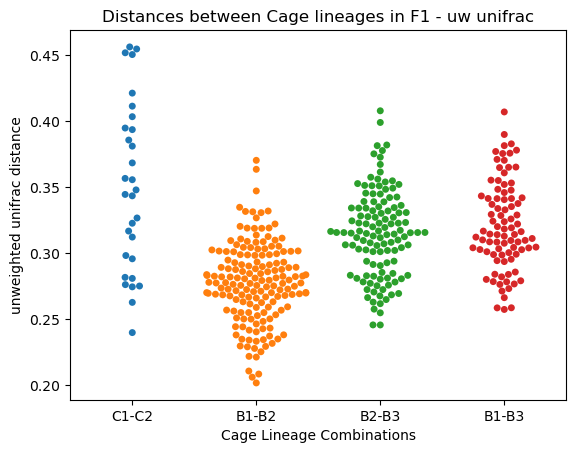

In [57]:
%matplotlib inline
ax = sns.swarmplot(df_distances)
ax.set(xlabel='Cage Lineage Combinations', ylabel='unweighted unifrac distance')
plt.title('Distances between Cage lineages in F1 - uw unifrac')
plt.savefig(work_dir + f"/swarm_F1.png", transparent=False, bbox_inches='tight')
plt.show()

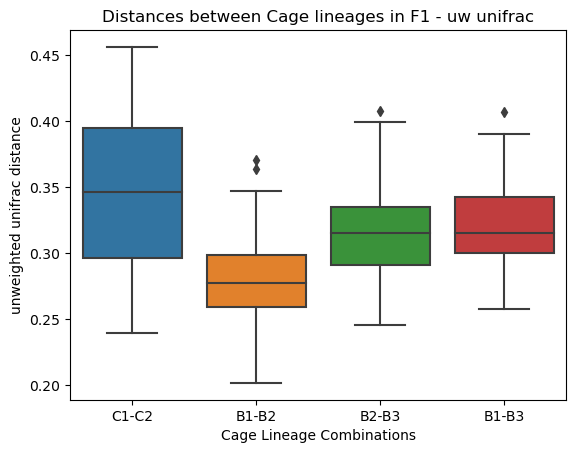

In [59]:
%matplotlib inline
ax = sns.boxplot(df_distances)
ax.set(xlabel='Cage Lineage Combinations', ylabel='unweighted unifrac distance')
plt.title('Distances between Cage lineages in F1 - uw unifrac')
plt.savefig(work_dir + f"/box_F1.png", transparent=False, bbox_inches='tight')
plt.show()

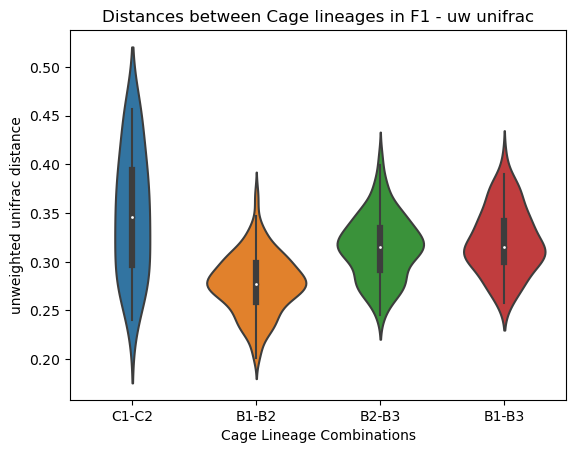

In [61]:
%matplotlib inline
ax = sns.violinplot(df_distances)
ax.set(xlabel='Cage Lineage Combinations', ylabel='unweighted unifrac distance')
plt.title('Distances between Cage lineages in F1 - uw unifrac')
plt.savefig(work_dir + f"/violin_F1.png", transparent=False, bbox_inches='tight')
plt.show()

##### Generations

In [36]:
generations_combination = list(itertools.combinations(['P1', 'F1', 'F2', 'F3', 'F4', 'F5'], 2))

In [37]:
count = 0
for generation in generations_combination:
    count += 1
    comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c']) & meta['generation'].isin(generation)]
    result = permanova_beta(comparison, dm_gut_no_comp, 'generation')
    print(f"BALB/c generation pair {generation} \n {result} \n {count}")

/tmp/ipykernel_3072230/2989188860.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c']) & meta['generation'].isin(generation)]


BALB/c generation pair ('P1', 'F1') 
 (F1    11
P1     5
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      16
number of groups                  2
test statistic             1.271154
p-value                      0.1737
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 1
BALB/c generation pair ('P1', 'F2') 
 (F2    17
P1     5
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      22
number of groups                  2
test statistic             1.903119
p-value                      0.0047
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 2


/tmp/ipykernel_3072230/2989188860.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c']) & meta['generation'].isin(generation)]
/tmp/ipykernel_3072230/2989188860.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c']) & meta['generation'].isin(generation)]


BALB/c generation pair ('P1', 'F3') 
 (F3    22
P1     5
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      27
number of groups                  2
test statistic             2.614001
p-value                      0.0009
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 3
BALB/c generation pair ('P1', 'F4') 
 (F4    25
P1     5
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      30
number of groups                  2
test statistic              3.13106
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 4


/tmp/ipykernel_3072230/2989188860.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c']) & meta['generation'].isin(generation)]
/tmp/ipykernel_3072230/2989188860.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c']) & meta['generation'].isin(generation)]


BALB/c generation pair ('P1', 'F5') 
 (F5    34
P1     5
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      39
number of groups                  2
test statistic             3.432078
p-value                      0.0004
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 5
BALB/c generation pair ('F1', 'F2') 
 (F2    17
F1    11
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      28
number of groups                  2
test statistic             1.748439
p-value                      0.0159
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 6


/tmp/ipykernel_3072230/2989188860.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c']) & meta['generation'].isin(generation)]
/tmp/ipykernel_3072230/2989188860.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c']) & meta['generation'].isin(generation)]


BALB/c generation pair ('F1', 'F3') 
 (F3    22
F1    11
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      33
number of groups                  2
test statistic             2.739857
p-value                      0.0005
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 7


/tmp/ipykernel_3072230/2989188860.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c']) & meta['generation'].isin(generation)]


BALB/c generation pair ('F1', 'F4') 
 (F4    25
F1    11
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      36
number of groups                  2
test statistic             2.798389
p-value                      0.0003
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 8


/tmp/ipykernel_3072230/2989188860.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c']) & meta['generation'].isin(generation)]


BALB/c generation pair ('F1', 'F5') 
 (F5    34
F1    11
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      45
number of groups                  2
test statistic             2.859013
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 9


/tmp/ipykernel_3072230/2989188860.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c']) & meta['generation'].isin(generation)]


BALB/c generation pair ('F2', 'F3') 
 (F3    22
F2    17
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      39
number of groups                  2
test statistic             2.329582
p-value                      0.0008
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 10


/tmp/ipykernel_3072230/2989188860.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c']) & meta['generation'].isin(generation)]


BALB/c generation pair ('F2', 'F4') 
 (F4    25
F2    17
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      42
number of groups                  2
test statistic             2.702324
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 11


/tmp/ipykernel_3072230/2989188860.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c']) & meta['generation'].isin(generation)]


BALB/c generation pair ('F2', 'F5') 
 (F5    34
F2    17
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      51
number of groups                  2
test statistic             3.576414
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 12


/tmp/ipykernel_3072230/2989188860.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c']) & meta['generation'].isin(generation)]


BALB/c generation pair ('F3', 'F4') 
 (F4    25
F3    22
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      47
number of groups                  2
test statistic             2.907469
p-value                      0.0005
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 13


/tmp/ipykernel_3072230/2989188860.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c']) & meta['generation'].isin(generation)]


BALB/c generation pair ('F3', 'F5') 
 (F5    34
F3    22
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      56
number of groups                  2
test statistic             2.938752
p-value                      0.0002
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 14


/tmp/ipykernel_3072230/2989188860.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c']) & meta['generation'].isin(generation)]


BALB/c generation pair ('F4', 'F5') 
 (F5    34
F4    25
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      59
number of groups                  2
test statistic             2.684935
p-value                      0.0004
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 15


In [38]:
count = 0
for generation in generations_combination:
    count += 1
    comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J']) & meta['generation'].isin(generation)]
    result = permanova_beta(comparison, dm_gut_no_comp, 'generation')
    print(f"C57BL6/J generation pair {generation} \n {result} \n {count}")

/tmp/ipykernel_3072230/3483370448.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J']) & meta['generation'].isin(generation)]


C57BL6/J generation pair ('P1', 'F1') 
 (F1    34
P1    16
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      50
number of groups                  2
test statistic             2.882748
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 1


/tmp/ipykernel_3072230/3483370448.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J']) & meta['generation'].isin(generation)]


C57BL6/J generation pair ('P1', 'F2') 
 (F2    38
P1    16
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      54
number of groups                  2
test statistic              4.01241
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 2


/tmp/ipykernel_3072230/3483370448.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J']) & meta['generation'].isin(generation)]


C57BL6/J generation pair ('P1', 'F3') 
 (F3    45
P1    16
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      61
number of groups                  2
test statistic             4.779581
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 3


/tmp/ipykernel_3072230/3483370448.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J']) & meta['generation'].isin(generation)]


C57BL6/J generation pair ('P1', 'F4') 
 (F4    41
P1    16
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      57
number of groups                  2
test statistic             6.775357
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 4
C57BL6/J generation pair ('P1', 'F5') 
 (P1    16
F5    15
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      31
number of groups                  2
test statistic             7.123941
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 5


/tmp/ipykernel_3072230/3483370448.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J']) & meta['generation'].isin(generation)]
/tmp/ipykernel_3072230/3483370448.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J']) & meta['generation'].isin(generation)]


C57BL6/J generation pair ('F1', 'F2') 
 (F2    38
F1    34
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      72
number of groups                  2
test statistic             2.400822
p-value                      0.0005
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 6


/tmp/ipykernel_3072230/3483370448.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J']) & meta['generation'].isin(generation)]


C57BL6/J generation pair ('F1', 'F3') 
 (F3    45
F1    34
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      79
number of groups                  2
test statistic             5.397017
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 7


/tmp/ipykernel_3072230/3483370448.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J']) & meta['generation'].isin(generation)]


C57BL6/J generation pair ('F1', 'F4') 
 (F4    41
F1    34
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      75
number of groups                  2
test statistic              8.50687
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 8


/tmp/ipykernel_3072230/3483370448.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J']) & meta['generation'].isin(generation)]


C57BL6/J generation pair ('F1', 'F5') 
 (F1    34
F5    15
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      49
number of groups                  2
test statistic             9.859719
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 9


/tmp/ipykernel_3072230/3483370448.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J']) & meta['generation'].isin(generation)]


C57BL6/J generation pair ('F2', 'F3') 
 (F3    45
F2    38
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      83
number of groups                  2
test statistic             4.091371
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 10


/tmp/ipykernel_3072230/3483370448.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J']) & meta['generation'].isin(generation)]


C57BL6/J generation pair ('F2', 'F4') 
 (F4    41
F2    38
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      79
number of groups                  2
test statistic             6.452446
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 11


/tmp/ipykernel_3072230/3483370448.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J']) & meta['generation'].isin(generation)]


C57BL6/J generation pair ('F2', 'F5') 
 (F2    38
F5    15
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      53
number of groups                  2
test statistic             7.803198
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 12


/tmp/ipykernel_3072230/3483370448.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J']) & meta['generation'].isin(generation)]


C57BL6/J generation pair ('F3', 'F4') 
 (F3    45
F4    41
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      86
number of groups                  2
test statistic             2.582415
p-value                      0.0011
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 13


/tmp/ipykernel_3072230/3483370448.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J']) & meta['generation'].isin(generation)]


C57BL6/J generation pair ('F3', 'F5') 
 (F3    45
F5    15
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      60
number of groups                  2
test statistic             4.226346
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 14


/tmp/ipykernel_3072230/3483370448.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J']) & meta['generation'].isin(generation)]


C57BL6/J generation pair ('F4', 'F5') 
 (F4    41
F5    15
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      56
number of groups                  2
test statistic             3.754058
p-value                      0.0002
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 15


##### Genotype Per Generation

In [39]:
for generation in ['P1', 'F1', 'F2', 'F3', 'F4', 'F5']:
    comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['generation'].isin([generation])]
    result = permanova_beta(comparison, dm_gut_no_comp, 'genotype')
    print(f"{generation} \n {result}")

/tmp/ipykernel_3072230/3677679578.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['generation'].isin([generation])]


P1 
 (C57BL6/J    16
BALB/c       5
Name: genotype, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      21
number of groups                  2
test statistic             3.206697
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_3072230/3677679578.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['generation'].isin([generation])]


F1 
 (C57BL6/J    34
BALB/c      11
Name: genotype, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      45
number of groups                  2
test statistic             7.875802
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_3072230/3677679578.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['generation'].isin([generation])]


F2 
 (C57BL6/J    38
BALB/c      17
Name: genotype, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      55
number of groups                  2
test statistic             8.185123
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_3072230/3677679578.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['generation'].isin([generation])]


F3 
 (C57BL6/J    45
BALB/c      22
Name: genotype, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      67
number of groups                  2
test statistic            12.296945
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_3072230/3677679578.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['generation'].isin([generation])]


F4 
 (C57BL6/J    41
BALB/c      25
Name: genotype, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      66
number of groups                  2
test statistic            15.907347
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_3072230/3677679578.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['comparison'].isin([0]) & meta['generation'].isin([generation])]


F5 
 (BALB/c      34
C57BL6/J    15
Name: genotype, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      49
number of groups                  2
test statistic            12.916062
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object)


##### Sex in each generation per genotype

In [40]:
count = 0
for generation in ['P1', 'F1', 'F2', 'F3', 'F4', 'F5']:
    comparison = meta.loc[dm_gut_no_comp.ids,:][meta['generation'].isin([generation]) & meta['genotype'].isin(['BALB/c'])]
    result = permanova_beta(comparison, dm_gut_no_comp, 'sex')
    count += 1
    print(f"{generation} \n {result}")
print(count)

/tmp/ipykernel_3072230/1686436748.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['generation'].isin([generation]) & meta['genotype'].isin(['BALB/c'])]


P1 
 (female    4
male      1
Name: sex, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                       5
number of groups                  2
test statistic              0.99373
p-value                      0.6035
number of permutations         9999
Name: PERMANOVA results, dtype: object)
F1 
 (male      7
female    4
Name: sex, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      11
number of groups                  2
test statistic             1.102937
p-value                      0.3253
number of permutations         9999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_3072230/1686436748.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['generation'].isin([generation]) & meta['genotype'].isin(['BALB/c'])]
/tmp/ipykernel_3072230/1686436748.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['generation'].isin([generation]) & meta['genotype'].isin(['BALB/c'])]


F2 
 (female    12
male       5
Name: sex, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      17
number of groups                  2
test statistic             0.810648
p-value                      0.7368
number of permutations         9999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_3072230/1686436748.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['generation'].isin([generation]) & meta['genotype'].isin(['BALB/c'])]


F3 
 (female    11
male      11
Name: sex, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      22
number of groups                  2
test statistic             1.350958
p-value                      0.1186
number of permutations         9999
Name: PERMANOVA results, dtype: object)
F4 
 (female    14
male      11
Name: sex, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      25
number of groups                  2
test statistic             1.076706
p-value                      0.3441
number of permutations         9999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_3072230/1686436748.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['generation'].isin([generation]) & meta['genotype'].isin(['BALB/c'])]
/tmp/ipykernel_3072230/1686436748.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['generation'].isin([generation]) & meta['genotype'].isin(['BALB/c'])]


F5 
 (female    20
male      14
Name: sex, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      34
number of groups                  2
test statistic             1.188082
p-value                      0.2441
number of permutations         9999
Name: PERMANOVA results, dtype: object)
6


In [41]:
count = 0
for generation in ['P1', 'F1', 'F2', 'F3', 'F4', 'F5']:
    comparison = meta.loc[dm_gut_no_comp.ids,:][meta['generation'].isin([generation]) & meta['genotype'].isin(['C57BL6/J'])]
    result = permanova_beta(comparison, dm_gut_no_comp, 'sex')
    count += 1
    print(f"{generation} \n {result}")
print(count)

/tmp/ipykernel_3072230/2750653022.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['generation'].isin([generation]) & meta['genotype'].isin(['C57BL6/J'])]


P1 
 (male      9
female    7
Name: sex, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      16
number of groups                  2
test statistic             1.897207
p-value                      0.0177
number of permutations         9999
Name: PERMANOVA results, dtype: object)
F1 
 (male      20
female    14
Name: sex, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      34
number of groups                  2
test statistic             1.926809
p-value                      0.0128
number of permutations         9999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_3072230/2750653022.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['generation'].isin([generation]) & meta['genotype'].isin(['C57BL6/J'])]
/tmp/ipykernel_3072230/2750653022.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['generation'].isin([generation]) & meta['genotype'].isin(['C57BL6/J'])]


F2 
 (female    20
male      18
Name: sex, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      38
number of groups                  2
test statistic              1.81999
p-value                      0.0149
number of permutations         9999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_3072230/2750653022.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['generation'].isin([generation]) & meta['genotype'].isin(['C57BL6/J'])]


F3 
 (male      23
female    22
Name: sex, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      45
number of groups                  2
test statistic             1.666557
p-value                      0.0368
number of permutations         9999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_3072230/2750653022.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['generation'].isin([generation]) & meta['genotype'].isin(['C57BL6/J'])]


F4 
 (female    23
male      18
Name: sex, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      41
number of groups                  2
test statistic             1.404007
p-value                      0.1536
number of permutations         9999
Name: PERMANOVA results, dtype: object)
F5 
 (male      9
female    6
Name: sex, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      15
number of groups                  2
test statistic             1.371929
p-value                      0.1919
number of permutations         9999
Name: PERMANOVA results, dtype: object)
6


/tmp/ipykernel_3072230/2750653022.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['generation'].isin([generation]) & meta['genotype'].isin(['C57BL6/J'])]


##### Genotype in each generation per sex

In [42]:
count = 0
for generation in ['P1', 'F1', 'F2', 'F3', 'F4', 'F5']:
    comparison = meta.loc[dm_gut_no_comp.ids,:][meta['generation'].isin([generation]) & meta['sex'].isin(['female'])]
    result = permanova_beta(comparison, dm_gut_no_comp, 'genotype')
    count += 1
    print(f"{generation} \n {result}")
print(count)

/tmp/ipykernel_3072230/1324626596.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['generation'].isin([generation]) & meta['sex'].isin(['female'])]


P1 
 (C57BL6/J    7
BALB/c      4
Name: genotype, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      11
number of groups                  2
test statistic             2.484724
p-value                      0.0023
number of permutations         9999
Name: PERMANOVA results, dtype: object)
F1 
 (C57BL6/J    14
BALB/c       4
Name: genotype, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      18
number of groups                  2
test statistic             4.385795
p-value                      0.0006
number of permutations         9999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_3072230/1324626596.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['generation'].isin([generation]) & meta['sex'].isin(['female'])]
/tmp/ipykernel_3072230/1324626596.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['generation'].isin([generation]) & meta['sex'].isin(['female'])]


F2 
 (C57BL6/J    20
BALB/c      12
Name: genotype, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      32
number of groups                  2
test statistic             5.484248
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object)
F3 
 (C57BL6/J    22
BALB/c      11
Name: genotype, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      33
number of groups                  2
test statistic             6.388491
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_3072230/1324626596.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['generation'].isin([generation]) & meta['sex'].isin(['female'])]
/tmp/ipykernel_3072230/1324626596.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['generation'].isin([generation]) & meta['sex'].isin(['female'])]


F4 
 (C57BL6/J    23
BALB/c      14
Name: genotype, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      37
number of groups                  2
test statistic             9.594273
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object)
F5 
 (BALB/c      20
C57BL6/J     6
Name: genotype, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      26
number of groups                  2
test statistic             6.948519
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object)
6


/tmp/ipykernel_3072230/1324626596.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['generation'].isin([generation]) & meta['sex'].isin(['female'])]


In [43]:
count = 0
for generation in ['P1', 'F1', 'F2', 'F3', 'F4', 'F5']:
    comparison = meta.loc[dm_gut_no_comp.ids,:][meta['generation'].isin([generation]) & meta['sex'].isin(['male'])]
    result = permanova_beta(comparison, dm_gut_no_comp, 'genotype')
    count += 1
    print(f"{generation} \n {result}")
print(count)

/tmp/ipykernel_3072230/4173431552.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['generation'].isin([generation]) & meta['sex'].isin(['male'])]


P1 
 (C57BL6/J    9
BALB/c      1
Name: genotype, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      10
number of groups                  2
test statistic              1.94912
p-value                       0.101
number of permutations         9999
Name: PERMANOVA results, dtype: object)
F1 
 (C57BL6/J    20
BALB/c       7
Name: genotype, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      27
number of groups                  2
test statistic              5.25007
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_3072230/4173431552.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['generation'].isin([generation]) & meta['sex'].isin(['male'])]
/tmp/ipykernel_3072230/4173431552.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['generation'].isin([generation]) & meta['sex'].isin(['male'])]


F2 
 (C57BL6/J    18
BALB/c       5
Name: genotype, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      23
number of groups                  2
test statistic             3.473162
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object)
F3 
 (C57BL6/J    23
BALB/c      11
Name: genotype, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      34
number of groups                  2
test statistic             7.669838
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_3072230/4173431552.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['generation'].isin([generation]) & meta['sex'].isin(['male'])]
/tmp/ipykernel_3072230/4173431552.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['generation'].isin([generation]) & meta['sex'].isin(['male'])]


F4 
 (C57BL6/J    18
BALB/c      11
Name: genotype, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      29
number of groups                  2
test statistic             7.779532
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object)
F5 
 (BALB/c      14
C57BL6/J     9
Name: genotype, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      23
number of groups                  2
test statistic             6.785485
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object)
6


/tmp/ipykernel_3072230/4173431552.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_gut_no_comp.ids,:][meta['generation'].isin([generation]) & meta['sex'].isin(['male'])]


### Sebum

#### Sebum with Comparison

In [47]:
dm_sebum_comp = res_beta_sebum_with_comp['results']['unweighted_unifrac']
gen_comparison_sebum = meta.loc[dm_sebum_comp.ids,:][meta['genotype'].isin(['C57BL6/J', 'BALB/c'])]
permanova_beta(gen_comparison_sebum, dm_sebum_comp, "genotype")

/tmp/ipykernel_3072230/701590023.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  gen_comparison_sebum = meta.loc[dm_sebum_comp.ids,:][meta['genotype'].isin(['C57BL6/J', 'BALB/c'])]


(C57BL6/J    173
 BALB/c       96
 Name: genotype, dtype: int64,
 method name               PERMANOVA
 test statistic name        pseudo-F
 sample size                     269
 number of groups                  2
 test statistic             3.032803
 p-value                      0.0001
 number of permutations         9999
 Name: PERMANOVA results, dtype: object)

#### Janvier vs. Düsseldorf

In [48]:
test = meta[meta['comparison'].isin([1]) & meta['host_body_product'].isin(['UBERON:sebum'])]
test['geo_loc_name'].value_counts()

Germany:Duesseldorf    24
France:Janvier         12
Name: geo_loc_name, dtype: int64

In [49]:
comparison = meta.loc[dm_sebum_comp.ids,:][meta['comparison'].isin([1])]
permanova_beta(comparison, dm_sebum_comp, "genotype")

/tmp/ipykernel_3072230/3831783052.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_comp.ids,:][meta['comparison'].isin([1])]


(C57BL6/J    9
 BALB/c      7
 Name: genotype, dtype: int64,
 method name               PERMANOVA
 test statistic name        pseudo-F
 sample size                      16
 number of groups                  2
 test statistic             1.155566
 p-value                      0.2187
 number of permutations         9999
 Name: PERMANOVA results, dtype: object)

In [50]:
for genotype in ["C57BL6/J", "BALB/c"]:
    comparison = meta.loc[dm_sebum_comp.ids,:][meta['comparison'].isin([1]) & meta['genotype'].isin([genotype])]
    result = permanova_beta(comparison, dm_sebum_comp, "geo_loc_name")
    print (f"{genotype} \n {result}")

/tmp/ipykernel_3072230/487032913.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_comp.ids,:][meta['comparison'].isin([1]) & meta['genotype'].isin([genotype])]


C57BL6/J 
 (France:Janvier         5
Germany:Duesseldorf    4
Name: geo_loc_name, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                       9
number of groups                  2
test statistic             1.372398
p-value                      0.1047
number of permutations         9999
Name: PERMANOVA results, dtype: object)
BALB/c 
 (Germany:Duesseldorf    4
France:Janvier         3
Name: geo_loc_name, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                       7
number of groups                  2
test statistic             1.798723
p-value                      0.0262
number of permutations         9999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_3072230/487032913.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_comp.ids,:][meta['comparison'].isin([1]) & meta['genotype'].isin([genotype])]


In [51]:
for city in ["France:Janvier", "Germany:Duesseldorf"]:
    comparison = meta.loc[dm_sebum_comp.ids,:][meta['comparison'].isin([1]) & meta['geo_loc_name'].isin([city])]
    result = permanova_beta(comparison, dm_sebum_comp, "genotype")
    print (f"{city} \n {result}")

/tmp/ipykernel_3072230/964904607.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_comp.ids,:][meta['comparison'].isin([1]) & meta['geo_loc_name'].isin([city])]


France:Janvier 
 (C57BL6/J    5
BALB/c      3
Name: genotype, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                       8
number of groups                  2
test statistic             1.120307
p-value                      0.2874
number of permutations         9999
Name: PERMANOVA results, dtype: object)
Germany:Duesseldorf 
 (BALB/c      4
C57BL6/J    4
Name: genotype, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                       8
number of groups                  2
test statistic              1.20322
p-value                      0.2332
number of permutations         9999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_3072230/964904607.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_comp.ids,:][meta['comparison'].isin([1]) & meta['geo_loc_name'].isin([city])]


##### BALB/c

In [52]:
for genotype in ['BALB/c', 'C57BL6/J']:
    comparison = meta.loc[dm_sebum_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c'])) | (meta['comparison'].isin([1]) & meta['genotype'].isin([genotype]))]
    result = permanova_beta(comparison, dm_sebum_comp, "comparison")
    print (f"BALB/c experiment + {genotype} comparison \n {result}")
    for city in ['France:Janvier', 'Germany:Duesseldorf']:
        comparison = meta.loc[dm_sebum_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c'])) | (meta['comparison'].isin([1]) & meta['geo_loc_name'].isin([city]) & meta['genotype'].isin([genotype]))]
        result = permanova_beta(comparison, dm_sebum_comp, "comparison")
        print (f"BALB/c experiment + {genotype}-{city} comparison \n {result}")

/tmp/ipykernel_3072230/428689594.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c'])) | (meta['comparison'].isin([1]) & meta['genotype'].isin([genotype]))]


BALB/c experiment + BALB/c comparison 
 (0    89
1     7
Name: comparison, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      96
number of groups                  2
test statistic             1.985827
p-value                      0.0003
number of permutations         9999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_3072230/428689594.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c'])) | (meta['comparison'].isin([1]) & meta['geo_loc_name'].isin([city]) & meta['genotype'].isin([genotype]))]


BALB/c experiment + BALB/c-France:Janvier comparison 
 (0    89
1     3
Name: comparison, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      92
number of groups                  2
test statistic             1.274221
p-value                      0.0573
number of permutations         9999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_3072230/428689594.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c'])) | (meta['comparison'].isin([1]) & meta['geo_loc_name'].isin([city]) & meta['genotype'].isin([genotype]))]


BALB/c experiment + BALB/c-Germany:Duesseldorf comparison 
 (0    89
1     4
Name: comparison, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      93
number of groups                  2
test statistic             2.513968
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_3072230/428689594.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c'])) | (meta['comparison'].isin([1]) & meta['genotype'].isin([genotype]))]


BALB/c experiment + C57BL6/J comparison 
 (0    89
1     9
Name: comparison, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      98
number of groups                  2
test statistic             2.651427
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_3072230/428689594.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c'])) | (meta['comparison'].isin([1]) & meta['geo_loc_name'].isin([city]) & meta['genotype'].isin([genotype]))]


BALB/c experiment + C57BL6/J-France:Janvier comparison 
 (0    89
1     5
Name: comparison, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      94
number of groups                  2
test statistic             2.070665
p-value                      0.0002
number of permutations         9999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_3072230/428689594.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c'])) | (meta['comparison'].isin([1]) & meta['geo_loc_name'].isin([city]) & meta['genotype'].isin([genotype]))]


BALB/c experiment + C57BL6/J-Germany:Duesseldorf comparison 
 (0    89
1     4
Name: comparison, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      93
number of groups                  2
test statistic             1.940888
p-value                      0.0002
number of permutations         9999
Name: PERMANOVA results, dtype: object)


In [53]:
for city in ['France:Janvier', 'Germany:Duesseldorf']:
    comparison = meta.loc[dm_sebum_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c'])) | (meta['comparison'].isin([1]) & meta['geo_loc_name'].isin([city]))]
    result = permanova_beta(comparison, dm_sebum_comp, "comparison")
    print (f"BALB/c experiment + whole {city} comparison \n {result}")

/tmp/ipykernel_3072230/952476864.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c'])) | (meta['comparison'].isin([1]) & meta['geo_loc_name'].isin([city]))]


BALB/c experiment + whole France:Janvier comparison 
 (0    89
1     8
Name: comparison, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      97
number of groups                  2
test statistic             2.096139
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_3072230/952476864.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c'])) | (meta['comparison'].isin([1]) & meta['geo_loc_name'].isin([city]))]


BALB/c experiment + whole Germany:Duesseldorf comparison 
 (0    89
1     8
Name: comparison, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      97
number of groups                  2
test statistic             3.355258
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object)


In [54]:
comparison = meta.loc[dm_sebum_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c'])) | meta['comparison'].isin([1])]
result = permanova_beta(comparison, dm_sebum_comp, "comparison")
print (f"BALB/c experiment + whole comparison \n {result}")

/tmp/ipykernel_3072230/2628515971.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c'])) | meta['comparison'].isin([1])]


BALB/c experiment + whole comparison 
 (0    89
1    16
Name: comparison, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                     105
number of groups                  2
test statistic             3.254478
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object)


In [55]:
comparison = meta.loc[dm_sebum_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J', 'BALB/c'])]
result = permanova_beta(comparison, dm_sebum_comp, "genotype")
print (f"BALB/c experiment + C57BL6/J \n {result}")

/tmp/ipykernel_3072230/3999902444.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J', 'BALB/c'])]


BALB/c experiment + C57BL6/J 
 (C57BL6/J    164
BALB/c       89
Name: genotype, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                     253
number of groups                  2
test statistic             2.925832
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object)


##### C57BL6/J

In [56]:
for genotype in ['BALB/c', 'C57BL6/J']:
    comparison = meta.loc[dm_sebum_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J'])) | (meta['comparison'].isin([1]) & meta['genotype'].isin([genotype]))]
    result = permanova_beta(comparison, dm_sebum_comp, "comparison")
    print (f"C57BL6/J experiment + {genotype} comparison \n {result}")
    for city in ['France:Janvier', 'Germany:Duesseldorf']:
        comparison = meta.loc[dm_sebum_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J'])) | (meta['comparison'].isin([1]) & meta['geo_loc_name'].isin([city]) & meta['genotype'].isin([genotype]))]
        result = permanova_beta(comparison, dm_sebum_comp, "comparison")
        print (f"C57BL6/J experiment + {genotype}-{city} comparison \n {result}")

/tmp/ipykernel_3072230/2800553577.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J'])) | (meta['comparison'].isin([1]) & meta['genotype'].isin([genotype]))]


C57BL6/J experiment + BALB/c comparison 
 (0    164
1      7
Name: comparison, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                     171
number of groups                  2
test statistic             2.187761
p-value                      0.0003
number of permutations         9999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_3072230/2800553577.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J'])) | (meta['comparison'].isin([1]) & meta['geo_loc_name'].isin([city]) & meta['genotype'].isin([genotype]))]


C57BL6/J experiment + BALB/c-France:Janvier comparison 
 (0    164
1      3
Name: comparison, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                     167
number of groups                  2
test statistic             1.378442
p-value                      0.0487
number of permutations         9999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_3072230/2800553577.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J'])) | (meta['comparison'].isin([1]) & meta['geo_loc_name'].isin([city]) & meta['genotype'].isin([genotype]))]


C57BL6/J experiment + BALB/c-Germany:Duesseldorf comparison 
 (0    164
1      4
Name: comparison, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                     168
number of groups                  2
test statistic             2.611339
p-value                      0.0005
number of permutations         9999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_3072230/2800553577.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J'])) | (meta['comparison'].isin([1]) & meta['genotype'].isin([genotype]))]


C57BL6/J experiment + C57BL6/J comparison 
 (0    164
1      9
Name: comparison, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                     173
number of groups                  2
test statistic             2.328899
p-value                      0.0002
number of permutations         9999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_3072230/2800553577.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J'])) | (meta['comparison'].isin([1]) & meta['geo_loc_name'].isin([city]) & meta['genotype'].isin([genotype]))]


C57BL6/J experiment + C57BL6/J-France:Janvier comparison 
 (0    164
1      5
Name: comparison, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                     169
number of groups                  2
test statistic             1.930901
p-value                      0.0019
number of permutations         9999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_3072230/2800553577.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J'])) | (meta['comparison'].isin([1]) & meta['geo_loc_name'].isin([city]) & meta['genotype'].isin([genotype]))]


C57BL6/J experiment + C57BL6/J-Germany:Duesseldorf comparison 
 (0    164
1      4
Name: comparison, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                     168
number of groups                  2
test statistic             1.721522
p-value                      0.0075
number of permutations         9999
Name: PERMANOVA results, dtype: object)


In [57]:
for city in ['France:Janvier', 'Germany:Duesseldorf']:
    comparison = meta.loc[dm_sebum_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J'])) | (meta['comparison'].isin([1]) & meta['geo_loc_name'].isin([city]))]
    result = permanova_beta(comparison, dm_sebum_comp, "comparison")
    print (f"C57BL6/J experiment + whole {city} comparison \n {result}")

/tmp/ipykernel_3072230/3660782641.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J'])) | (meta['comparison'].isin([1]) & meta['geo_loc_name'].isin([city]))]


C57BL6/J experiment + whole France:Janvier comparison 
 (0    164
1      8
Name: comparison, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                     172
number of groups                  2
test statistic             2.073223
p-value                      0.0004
number of permutations         9999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_3072230/3660782641.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J'])) | (meta['comparison'].isin([1]) & meta['geo_loc_name'].isin([city]))]


C57BL6/J experiment + whole Germany:Duesseldorf comparison 
 (0    164
1      8
Name: comparison, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                     172
number of groups                  2
test statistic             3.271918
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object)


In [58]:
comparison = meta.loc[dm_sebum_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J'])) | meta['comparison'].isin([1])]
result = permanova_beta(comparison, dm_sebum_comp, "comparison")
print (f"C57BL6/J experiment + whole comparison \n {result}")

/tmp/ipykernel_3072230/4095772956.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_comp.ids,:][(meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J'])) | meta['comparison'].isin([1])]


C57BL6/J experiment + whole comparison 
 (0    164
1     16
Name: comparison, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                     180
number of groups                  2
test statistic              3.20839
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object)


In [59]:
comparison = meta.loc[dm_sebum_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J', 'BALB/c'])]
result = permanova_beta(comparison, dm_sebum_comp, "genotype")
print (f"C57BL6/J experiment + BALB/c experiment \n {result}")

/tmp/ipykernel_3072230/84013002.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J', 'BALB/c'])]


C57BL6/J experiment + BALB/c experiment 
 (C57BL6/J    164
BALB/c       89
Name: genotype, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                     253
number of groups                  2
test statistic             2.925832
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object)


#### Sebum without Comparison

In [62]:
dm_sebum_no_comp = res_beta_sebum_no_comp['results']['unweighted_unifrac']
gen_comparison_sebum = meta.loc[dm_sebum_no_comp.ids,:][meta['genotype'].isin(['C57BL6/J', 'BALB/c'])]
permanova_beta(gen_comparison_sebum, dm_sebum_no_comp, "genotype")

/tmp/ipykernel_3072230/1942415326.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  gen_comparison_sebum = meta.loc[dm_sebum_no_comp.ids,:][meta['genotype'].isin(['C57BL6/J', 'BALB/c'])]


(C57BL6/J    164
 BALB/c       89
 Name: genotype, dtype: int64,
 method name               PERMANOVA
 test statistic name        pseudo-F
 sample size                     253
 number of groups                  2
 test statistic             2.925832
 p-value                      0.0001
 number of permutations         9999
 Name: PERMANOVA results, dtype: object)

##### cage lineage

In [71]:
#all
lineage_combination = list(itertools.combinations(['C1','C2','C3','B1','B2','B3'], 2))
count = 0
for lineage in lineage_combination:
    count += 1
    comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['cage_lineage'].isin(lineage)]
    result = permanova_beta(comparison, dm_sebum_no_comp, 'cage_lineage')
    print(f"Cage lineage pair {lineage} \n {result} \n {count}")

/tmp/ipykernel_3072230/1040732873.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['cage_lineage'].isin(lineage)]


Cage lineage pair ('C1', 'C2') 
 (C2    35
C1    29
Name: cage_lineage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      64
number of groups                  2
test statistic               1.2237
p-value                      0.0973
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 1


/tmp/ipykernel_3072230/1040732873.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['cage_lineage'].isin(lineage)]


Cage lineage pair ('C1', 'C3') 
 (C1    29
C3    25
Name: cage_lineage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      54
number of groups                  2
test statistic             1.414689
p-value                      0.0156
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 2


/tmp/ipykernel_3072230/1040732873.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['cage_lineage'].isin(lineage)]


Cage lineage pair ('C1', 'B1') 
 (B1    64
C1    29
Name: cage_lineage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      93
number of groups                  2
test statistic             1.563798
p-value                      0.0151
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 3


/tmp/ipykernel_3072230/1040732873.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['cage_lineage'].isin(lineage)]


Cage lineage pair ('C1', 'B2') 
 (B2    53
C1    29
Name: cage_lineage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      82
number of groups                  2
test statistic             1.692081
p-value                      0.0011
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 4


/tmp/ipykernel_3072230/1040732873.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['cage_lineage'].isin(lineage)]


Cage lineage pair ('C1', 'B3') 
 (B3    47
C1    29
Name: cage_lineage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      76
number of groups                  2
test statistic             1.910658
p-value                      0.0002
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 5


/tmp/ipykernel_3072230/1040732873.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['cage_lineage'].isin(lineage)]


Cage lineage pair ('C2', 'C3') 
 (C2    35
C3    25
Name: cage_lineage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      60
number of groups                  2
test statistic             1.055455
p-value                      0.3204
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 6


/tmp/ipykernel_3072230/1040732873.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['cage_lineage'].isin(lineage)]


Cage lineage pair ('C2', 'B1') 
 (B1    64
C2    35
Name: cage_lineage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      99
number of groups                  2
test statistic             2.032405
p-value                      0.0004
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 7


/tmp/ipykernel_3072230/1040732873.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['cage_lineage'].isin(lineage)]


Cage lineage pair ('C2', 'B2') 
 (B2    53
C2    35
Name: cage_lineage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      88
number of groups                  2
test statistic             1.577442
p-value                      0.0051
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 8


/tmp/ipykernel_3072230/1040732873.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['cage_lineage'].isin(lineage)]


Cage lineage pair ('C2', 'B3') 
 (B3    47
C2    35
Name: cage_lineage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      82
number of groups                  2
test statistic             2.035711
p-value                      0.0002
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 9


/tmp/ipykernel_3072230/1040732873.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['cage_lineage'].isin(lineage)]


Cage lineage pair ('C3', 'B1') 
 (B1    64
C3    25
Name: cage_lineage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      89
number of groups                  2
test statistic             2.083543
p-value                      0.0005
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 10


/tmp/ipykernel_3072230/1040732873.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['cage_lineage'].isin(lineage)]


Cage lineage pair ('C3', 'B2') 
 (B2    53
C3    25
Name: cage_lineage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      78
number of groups                  2
test statistic             1.702898
p-value                      0.0006
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 11


/tmp/ipykernel_3072230/1040732873.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['cage_lineage'].isin(lineage)]


Cage lineage pair ('C3', 'B3') 
 (B3    47
C3    25
Name: cage_lineage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      72
number of groups                  2
test statistic               2.0029
p-value                      0.0004
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 12


/tmp/ipykernel_3072230/1040732873.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['cage_lineage'].isin(lineage)]


Cage lineage pair ('B1', 'B2') 
 (B1    64
B2    53
Name: cage_lineage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                     117
number of groups                  2
test statistic             1.641591
p-value                      0.0055
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 13


/tmp/ipykernel_3072230/1040732873.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['cage_lineage'].isin(lineage)]


Cage lineage pair ('B1', 'B3') 
 (B1    64
B3    47
Name: cage_lineage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                     111
number of groups                  2
test statistic             1.260627
p-value                      0.0927
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 14


/tmp/ipykernel_3072230/1040732873.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['cage_lineage'].isin(lineage)]


Cage lineage pair ('B2', 'B3') 
 (B2    53
B3    47
Name: cage_lineage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                     100
number of groups                  2
test statistic             1.379179
p-value                      0.0235
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 15


In [76]:
#B6J
lineage_combination = list(itertools.combinations(['B1','B2','B3'], 2))
count = 0
for lineage in lineage_combination:
    count += 1
    comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J']) & meta['cage_lineage'].isin(lineage)]
    result = permanova_beta(comparison, dm_sebum_no_comp, 'cage_lineage')
    print(f"Cage lineage pair {lineage} \n {result} \n {count}")

/tmp/ipykernel_3072230/2663523912.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J']) & meta['cage_lineage'].isin(lineage)]


Cage lineage pair ('B1', 'B2') 
 (B1    64
B2    53
Name: cage_lineage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                     117
number of groups                  2
test statistic             1.641591
p-value                       0.005
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 1


/tmp/ipykernel_3072230/2663523912.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J']) & meta['cage_lineage'].isin(lineage)]


Cage lineage pair ('B1', 'B3') 
 (B1    64
B3    47
Name: cage_lineage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                     111
number of groups                  2
test statistic             1.260627
p-value                       0.087
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 2


/tmp/ipykernel_3072230/2663523912.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J']) & meta['cage_lineage'].isin(lineage)]


Cage lineage pair ('B2', 'B3') 
 (B2    53
B3    47
Name: cage_lineage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                     100
number of groups                  2
test statistic             1.379179
p-value                      0.0212
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 3


In [74]:
#BALB
lineage_combination = list(itertools.combinations(['C1','C2','C3'], 2))
count = 0
for lineage in lineage_combination:
    count += 1
    comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c']) & meta['cage_lineage'].isin(lineage)]
    result = permanova_beta(comparison, dm_sebum_no_comp, 'cage_lineage')
    print(f"Cage lineage pair {lineage} \n {result} \n {count}")

/tmp/ipykernel_3072230/3822414553.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c']) & meta['cage_lineage'].isin(lineage)]


Cage lineage pair ('C1', 'C2') 
 (C2    35
C1    29
Name: cage_lineage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      64
number of groups                  2
test statistic               1.2237
p-value                      0.0945
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 1


/tmp/ipykernel_3072230/3822414553.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c']) & meta['cage_lineage'].isin(lineage)]


Cage lineage pair ('C1', 'C3') 
 (C1    29
C3    25
Name: cage_lineage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      54
number of groups                  2
test statistic             1.414689
p-value                      0.0158
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 2


/tmp/ipykernel_3072230/3822414553.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c']) & meta['cage_lineage'].isin(lineage)]


Cage lineage pair ('C2', 'C3') 
 (C2    35
C3    25
Name: cage_lineage, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      60
number of groups                  2
test statistic             1.055455
p-value                      0.3155
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 3


##### Generation per Genotype

In [77]:
count = 0
for generation in generations_combination:
    count += 1
    comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c']) & meta['generation'].isin(generation)]
    result = permanova_beta(comparison, dm_sebum_no_comp, 'generation')
    print(f"BALB/c generation pair {generation} \n {result} \n {count}")

/tmp/ipykernel_3072230/3865862490.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c']) & meta['generation'].isin(generation)]
/tmp/ipykernel_3072230/3865862490.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c']) & meta['generation'].isin(generation)]


BALB/c generation pair ('P1', 'F1') 
 (P1    4
F1    4
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                       8
number of groups                  2
test statistic             1.757118
p-value                      0.0282
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 1
BALB/c generation pair ('P1', 'F2') 
 (F2    9
P1    4
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      13
number of groups                  2
test statistic             3.021054
p-value                      0.0013
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 2


/tmp/ipykernel_3072230/3865862490.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c']) & meta['generation'].isin(generation)]
/tmp/ipykernel_3072230/3865862490.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c']) & meta['generation'].isin(generation)]


BALB/c generation pair ('P1', 'F3') 
 (F3    21
P1     4
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      25
number of groups                  2
test statistic             3.720876
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 3
BALB/c generation pair ('P1', 'F4') 
 (F4    21
P1     4
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      25
number of groups                  2
test statistic             3.033431
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 4


/tmp/ipykernel_3072230/3865862490.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c']) & meta['generation'].isin(generation)]
/tmp/ipykernel_3072230/3865862490.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c']) & meta['generation'].isin(generation)]


BALB/c generation pair ('P1', 'F5') 
 (F5    30
P1     4
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      34
number of groups                  2
test statistic             3.144969
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 5
BALB/c generation pair ('F1', 'F2') 
 (F2    9
F1    4
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      13
number of groups                  2
test statistic             1.603256
p-value                      0.0079
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 6


/tmp/ipykernel_3072230/3865862490.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c']) & meta['generation'].isin(generation)]
/tmp/ipykernel_3072230/3865862490.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c']) & meta['generation'].isin(generation)]


BALB/c generation pair ('F1', 'F3') 
 (F3    21
F1     4
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      25
number of groups                  2
test statistic             1.856014
p-value                      0.0009
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 7
BALB/c generation pair ('F1', 'F4') 
 (F4    21
F1     4
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      25
number of groups                  2
test statistic             1.320403
p-value                      0.0412
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 8
BALB/c generation pair ('F1', 'F5') 
 (F5    30
F1     4
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      34
number of groups                 

/tmp/ipykernel_3072230/3865862490.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c']) & meta['generation'].isin(generation)]
/tmp/ipykernel_3072230/3865862490.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c']) & meta['generation'].isin(generation)]


BALB/c generation pair ('F2', 'F3') 
 (F3    21
F2     9
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      30
number of groups                  2
test statistic             1.306042
p-value                        0.07
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 10
BALB/c generation pair ('F2', 'F4') 
 (F4    21
F2     9
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      30
number of groups                  2
test statistic             1.176143
p-value                      0.1298
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 11


/tmp/ipykernel_3072230/3865862490.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c']) & meta['generation'].isin(generation)]
/tmp/ipykernel_3072230/3865862490.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c']) & meta['generation'].isin(generation)]


BALB/c generation pair ('F2', 'F5') 
 (F5    30
F2     9
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      39
number of groups                  2
test statistic             2.119697
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 12


/tmp/ipykernel_3072230/3865862490.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c']) & meta['generation'].isin(generation)]


BALB/c generation pair ('F3', 'F4') 
 (F3    21
F4    21
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      42
number of groups                  2
test statistic             1.258064
p-value                      0.0732
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 13


/tmp/ipykernel_3072230/3865862490.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c']) & meta['generation'].isin(generation)]


BALB/c generation pair ('F3', 'F5') 
 (F5    30
F3    21
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      51
number of groups                  2
test statistic             2.715138
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 14


/tmp/ipykernel_3072230/3865862490.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['BALB/c']) & meta['generation'].isin(generation)]


BALB/c generation pair ('F4', 'F5') 
 (F5    30
F4    21
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      51
number of groups                  2
test statistic             1.567303
p-value                      0.0017
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 15


In [78]:
count = 0
for generation in generations_combination:
    count += 1
    comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J']) & meta['generation'].isin(generation)]
    result = permanova_beta(comparison, dm_sebum_no_comp, 'generation')
    print(f"C57BL6/J generation pair {generation} \n {result} \n {count}")

/tmp/ipykernel_3072230/3731919696.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J']) & meta['generation'].isin(generation)]


C57BL6/J generation pair ('P1', 'F1') 
 (F1    22
P1    16
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      38
number of groups                  2
test statistic             1.965895
p-value                      0.0028
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 1


/tmp/ipykernel_3072230/3731919696.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J']) & meta['generation'].isin(generation)]


C57BL6/J generation pair ('P1', 'F2') 
 (F2    32
P1    16
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      48
number of groups                  2
test statistic             3.838927
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 2


/tmp/ipykernel_3072230/3731919696.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J']) & meta['generation'].isin(generation)]


C57BL6/J generation pair ('P1', 'F3') 
 (F3    41
P1    16
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      57
number of groups                  2
test statistic             2.790683
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 3


/tmp/ipykernel_3072230/3731919696.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J']) & meta['generation'].isin(generation)]


C57BL6/J generation pair ('P1', 'F4') 
 (F4    39
P1    16
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      55
number of groups                  2
test statistic             2.865813
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 4
C57BL6/J generation pair ('P1', 'F5') 
 (P1    16
F5    14
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      30
number of groups                  2
test statistic              2.02536
p-value                      0.0003
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 5


/tmp/ipykernel_3072230/3731919696.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J']) & meta['generation'].isin(generation)]
/tmp/ipykernel_3072230/3731919696.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J']) & meta['generation'].isin(generation)]


C57BL6/J generation pair ('F1', 'F2') 
 (F2    32
F1    22
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      54
number of groups                  2
test statistic             2.284656
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 6


/tmp/ipykernel_3072230/3731919696.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J']) & meta['generation'].isin(generation)]


C57BL6/J generation pair ('F1', 'F3') 
 (F3    41
F1    22
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      63
number of groups                  2
test statistic             0.989732
p-value                      0.4718
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 7


/tmp/ipykernel_3072230/3731919696.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J']) & meta['generation'].isin(generation)]


C57BL6/J generation pair ('F1', 'F4') 
 (F4    39
F1    22
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      61
number of groups                  2
test statistic             1.131399
p-value                      0.1903
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 8


/tmp/ipykernel_3072230/3731919696.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J']) & meta['generation'].isin(generation)]


C57BL6/J generation pair ('F1', 'F5') 
 (F1    22
F5    14
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      36
number of groups                  2
test statistic             1.834118
p-value                      0.0011
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 9


/tmp/ipykernel_3072230/3731919696.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J']) & meta['generation'].isin(generation)]


C57BL6/J generation pair ('F2', 'F3') 
 (F3    41
F2    32
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      73
number of groups                  2
test statistic             1.859417
p-value                      0.0015
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 10


/tmp/ipykernel_3072230/3731919696.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J']) & meta['generation'].isin(generation)]


C57BL6/J generation pair ('F2', 'F4') 
 (F4    39
F2    32
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      71
number of groups                  2
test statistic             3.069465
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 11


/tmp/ipykernel_3072230/3731919696.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J']) & meta['generation'].isin(generation)]


C57BL6/J generation pair ('F2', 'F5') 
 (F2    32
F5    14
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      46
number of groups                  2
test statistic             3.329618
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 12


/tmp/ipykernel_3072230/3731919696.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J']) & meta['generation'].isin(generation)]


C57BL6/J generation pair ('F3', 'F4') 
 (F3    41
F4    39
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      80
number of groups                  2
test statistic              1.43348
p-value                       0.011
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 13


/tmp/ipykernel_3072230/3731919696.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J']) & meta['generation'].isin(generation)]


C57BL6/J generation pair ('F3', 'F5') 
 (F3    41
F5    14
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      55
number of groups                  2
test statistic             1.890921
p-value                      0.0007
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 14


/tmp/ipykernel_3072230/3731919696.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['genotype'].isin(['C57BL6/J']) & meta['generation'].isin(generation)]


C57BL6/J generation pair ('F4', 'F5') 
 (F4    39
F5    14
Name: generation, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      53
number of groups                  2
test statistic             1.315657
p-value                      0.0287
number of permutations         9999
Name: PERMANOVA results, dtype: object) 
 15


##### Genotype per Generation

In [79]:
for generation in ['P1', 'F1', 'F2', 'F3', 'F4', 'F5']:
    comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['generation'].isin([generation])]
    result = permanova_beta(comparison, dm_sebum_no_comp, 'genotype')
    print(f"{generation} \n {result}")

/tmp/ipykernel_3072230/2874111282.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['generation'].isin([generation])]
/tmp/ipykernel_3072230/2874111282.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['generation'].isin([generation])]


P1 
 (C57BL6/J    16
BALB/c       4
Name: genotype, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      20
number of groups                  2
test statistic              1.50461
p-value                       0.036
number of permutations         9999
Name: PERMANOVA results, dtype: object)
F1 
 (C57BL6/J    22
BALB/c       4
Name: genotype, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      26
number of groups                  2
test statistic             1.482547
p-value                      0.0294
number of permutations         9999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_3072230/2874111282.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['generation'].isin([generation])]


F2 
 (C57BL6/J    32
BALB/c       9
Name: genotype, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      41
number of groups                  2
test statistic             1.268262
p-value                      0.1044
number of permutations         9999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_3072230/2874111282.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['generation'].isin([generation])]


F3 
 (C57BL6/J    41
BALB/c      21
Name: genotype, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      62
number of groups                  2
test statistic             2.086387
p-value                      0.0001
number of permutations         9999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_3072230/2874111282.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['generation'].isin([generation])]


F4 
 (C57BL6/J    39
BALB/c      21
Name: genotype, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      60
number of groups                  2
test statistic             1.189973
p-value                      0.1111
number of permutations         9999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_3072230/2874111282.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['comparison'].isin([0]) & meta['generation'].isin([generation])]


F5 
 (BALB/c      30
C57BL6/J    14
Name: genotype, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      44
number of groups                  2
test statistic             1.244174
p-value                      0.0343
number of permutations         9999
Name: PERMANOVA results, dtype: object)


##### Sex in each generation per genotype

In [80]:
count = 0
for generation in ['P1', 'F1', 'F2', 'F3', 'F4', 'F5']:
    comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['generation'].isin([generation]) & meta['genotype'].isin(['BALB/c'])]
    result = permanova_beta(comparison, dm_sebum_no_comp, 'sex')
    count += 1
    print(f"{generation} \n {result}")
print(count)

/tmp/ipykernel_3072230/3601602157.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['generation'].isin([generation]) & meta['genotype'].isin(['BALB/c'])]
/tmp/ipykernel_3072230/3601602157.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['generation'].isin([generation]) & meta['genotype'].isin(['BALB/c'])]


P1 
 (female    3
male      1
Name: sex, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                       4
number of groups                  2
test statistic             1.396192
p-value                      0.2493
number of permutations         9999
Name: PERMANOVA results, dtype: object)
F1 
 (male      3
female    1
Name: sex, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                       4
number of groups                  2
test statistic             1.073437
p-value                      0.5022
number of permutations         9999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_3072230/3601602157.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['generation'].isin([generation]) & meta['genotype'].isin(['BALB/c'])]
/tmp/ipykernel_3072230/3601602157.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['generation'].isin([generation]) & meta['genotype'].isin(['BALB/c'])]


F2 
 (female    6
male      3
Name: sex, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                       9
number of groups                  2
test statistic              1.19493
p-value                      0.1362
number of permutations         9999
Name: PERMANOVA results, dtype: object)
F3 
 (male      11
female    10
Name: sex, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      21
number of groups                  2
test statistic             0.897443
p-value                      0.6635
number of permutations         9999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_3072230/3601602157.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['generation'].isin([generation]) & meta['genotype'].isin(['BALB/c'])]


F4 
 (male      11
female    10
Name: sex, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      21
number of groups                  2
test statistic             1.283243
p-value                      0.0601
number of permutations         9999
Name: PERMANOVA results, dtype: object)
F5 
 (female    17
male      13
Name: sex, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      30
number of groups                  2
test statistic             1.612106
p-value                      0.0003
number of permutations         9999
Name: PERMANOVA results, dtype: object)
6


/tmp/ipykernel_3072230/3601602157.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['generation'].isin([generation]) & meta['genotype'].isin(['BALB/c'])]


In [81]:
count = 0
for generation in ['P1', 'F1', 'F2', 'F3', 'F4', 'F5']:
    comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['generation'].isin([generation]) & meta['genotype'].isin(['C57BL6/J'])]
    result = permanova_beta(comparison, dm_sebum_no_comp, 'sex')
    count += 1
    print(f"{generation} \n {result}")
print(count)

/tmp/ipykernel_3072230/3621991459.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['generation'].isin([generation]) & meta['genotype'].isin(['C57BL6/J'])]


P1 
 (male      9
female    7
Name: sex, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      16
number of groups                  2
test statistic             1.623766
p-value                      0.0231
number of permutations         9999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_3072230/3621991459.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['generation'].isin([generation]) & meta['genotype'].isin(['C57BL6/J'])]


F1 
 (male      13
female     9
Name: sex, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      22
number of groups                  2
test statistic             1.133533
p-value                      0.2187
number of permutations         9999
Name: PERMANOVA results, dtype: object)
F2 
 (female    17
male      15
Name: sex, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      32
number of groups                  2
test statistic             1.769244
p-value                      0.0037
number of permutations         9999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_3072230/3621991459.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['generation'].isin([generation]) & meta['genotype'].isin(['C57BL6/J'])]
/tmp/ipykernel_3072230/3621991459.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['generation'].isin([generation]) & meta['genotype'].isin(['C57BL6/J'])]


F3 
 (male      22
female    19
Name: sex, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      41
number of groups                  2
test statistic             1.410374
p-value                      0.0271
number of permutations         9999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_3072230/3621991459.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['generation'].isin([generation]) & meta['genotype'].isin(['C57BL6/J'])]


F4 
 (female    24
male      15
Name: sex, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      39
number of groups                  2
test statistic             0.969009
p-value                      0.5419
number of permutations         9999
Name: PERMANOVA results, dtype: object)
F5 
 (male      8
female    6
Name: sex, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      14
number of groups                  2
test statistic              0.96044
p-value                      0.5566
number of permutations         9999
Name: PERMANOVA results, dtype: object)
6


/tmp/ipykernel_3072230/3621991459.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['generation'].isin([generation]) & meta['genotype'].isin(['C57BL6/J'])]


##### Genotype in each generation per sex

In [82]:
count = 0
for generation in ['P1', 'F1', 'F2', 'F3', 'F4', 'F5']:
    comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['generation'].isin([generation]) & meta['sex'].isin(['female'])]
    result = permanova_beta(comparison, dm_sebum_no_comp, 'genotype')
    count += 1
    print(f"{generation} \n {result}")
print(count)

/tmp/ipykernel_3072230/1370344910.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['generation'].isin([generation]) & meta['sex'].isin(['female'])]
/tmp/ipykernel_3072230/1370344910.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['generation'].isin([generation]) & meta['sex'].isin(['female'])]


P1 
 (C57BL6/J    7
BALB/c      3
Name: genotype, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      10
number of groups                  2
test statistic              1.26814
p-value                      0.1364
number of permutations         9999
Name: PERMANOVA results, dtype: object)
F1 
 (C57BL6/J    9
BALB/c      1
Name: genotype, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      10
number of groups                  2
test statistic             1.449734
p-value                      0.1998
number of permutations         9999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_3072230/1370344910.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['generation'].isin([generation]) & meta['sex'].isin(['female'])]
/tmp/ipykernel_3072230/1370344910.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['generation'].isin([generation]) & meta['sex'].isin(['female'])]


F2 
 (C57BL6/J    17
BALB/c       6
Name: genotype, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      23
number of groups                  2
test statistic             1.484174
p-value                      0.0582
number of permutations         9999
Name: PERMANOVA results, dtype: object)
F3 
 (C57BL6/J    19
BALB/c      10
Name: genotype, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      29
number of groups                  2
test statistic             1.172942
p-value                      0.1391
number of permutations         9999
Name: PERMANOVA results, dtype: object)
F4 
 (C57BL6/J    24
BALB/c      10
Name: genotype, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      34
number of groups                  2
test statistic              1.11508
p-value                       0.207
nu

/tmp/ipykernel_3072230/1370344910.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['generation'].isin([generation]) & meta['sex'].isin(['female'])]
/tmp/ipykernel_3072230/1370344910.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['generation'].isin([generation]) & meta['sex'].isin(['female'])]


F5 
 (BALB/c      17
C57BL6/J     6
Name: genotype, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      23
number of groups                  2
test statistic               1.4659
p-value                      0.0008
number of permutations         9999
Name: PERMANOVA results, dtype: object)
6


In [83]:
count = 0
for generation in ['P1', 'F1', 'F2', 'F3', 'F4', 'F5']:
    comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['generation'].isin([generation]) & meta['sex'].isin(['male'])]
    result = permanova_beta(comparison, dm_sebum_no_comp, 'genotype')
    count += 1
    print(f"{generation} \n {result}")
print(count)

/tmp/ipykernel_3072230/1277144662.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['generation'].isin([generation]) & meta['sex'].isin(['male'])]


P1 
 (C57BL6/J    9
BALB/c      1
Name: genotype, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      10
number of groups                  2
test statistic             1.164414
p-value                      0.2107
number of permutations         9999
Name: PERMANOVA results, dtype: object)
F1 
 (C57BL6/J    13
BALB/c       3
Name: genotype, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      16
number of groups                  2
test statistic             1.040227
p-value                      0.3753
number of permutations         9999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_3072230/1277144662.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['generation'].isin([generation]) & meta['sex'].isin(['male'])]
/tmp/ipykernel_3072230/1277144662.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['generation'].isin([generation]) & meta['sex'].isin(['male'])]


F2 
 (C57BL6/J    15
BALB/c       3
Name: genotype, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      18
number of groups                  2
test statistic             1.347828
p-value                      0.0269
number of permutations         9999
Name: PERMANOVA results, dtype: object)
F3 
 (C57BL6/J    22
BALB/c      11
Name: genotype, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      33
number of groups                  2
test statistic             2.000923
p-value                      0.0019
number of permutations         9999
Name: PERMANOVA results, dtype: object)


/tmp/ipykernel_3072230/1277144662.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['generation'].isin([generation]) & meta['sex'].isin(['male'])]
/tmp/ipykernel_3072230/1277144662.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['generation'].isin([generation]) & meta['sex'].isin(['male'])]


F4 
 (C57BL6/J    15
BALB/c      11
Name: genotype, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      26
number of groups                  2
test statistic             1.303121
p-value                      0.0445
number of permutations         9999
Name: PERMANOVA results, dtype: object)
F5 
 (BALB/c      13
C57BL6/J     8
Name: genotype, dtype: int64, method name               PERMANOVA
test statistic name        pseudo-F
sample size                      21
number of groups                  2
test statistic              0.94494
p-value                      0.6458
number of permutations         9999
Name: PERMANOVA results, dtype: object)
6


/tmp/ipykernel_3072230/1277144662.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  comparison = meta.loc[dm_sebum_no_comp.ids,:][meta['generation'].isin([generation]) & meta['sex'].isin(['male'])]


## Alpha Statistics

In [411]:
def mannwhitneyu_table(pair, pairlist_str, count):
    generation_pair = (pairlist_str[count])
    print(generation_pair)
    statistic, p = mannwhitneyu(pair[0], pair[1], alternative='greater')
    statistics.append(statistic)
    p_values.append(p)
    groups.append(generation_pair)
    print(f'Statistik: {statistic} \n p-Wert: {p} \n')
    bonferroni.append("Y") if p < alpha else bonferroni.append("N")
    zerofive.append("Y") if p< 0.05 else zerofive.append("N")
    
    

### Gut

#### Differences within the comparisons

In [86]:
alpha_C57B_comp = alpha_results_merged_gut[alpha_results_merged_gut['genotype'].isin(['C57BL6/J', 'B6CF1']) & alpha_results_merged_gut['comparison'].isin([1])]
alpha_BALB_comp = alpha_results_merged_gut[alpha_results_merged_gut['genotype'].isin(['BALB/c', 'B6CF1']) & alpha_results_merged_gut['comparison'].isin([1])]

In [94]:
Janvier_faith_comp = alpha_results_merged_gut[(alpha_results_merged_gut['comparison'].isin([1])) & (alpha_results_merged_gut['geo_loc_name'].isin(['France:Janvier']))]['PD_whole_tree']
Duess_faith_comp = alpha_results_merged_gut[alpha_results_merged_gut['comparison'].isin([1]) & (alpha_results_merged_gut['geo_loc_name'].isin(['Germany:Duesseldorf']))]['PD_whole_tree']
exp_faith_comp = alpha_results_merged_gut[alpha_results_merged_gut['comparison'].isin([1])]['PD_whole_tree']

In [96]:
#all
faith_groups_comp = list(itertools.combinations([Janvier_faith_comp, Duess_faith_comp, exp_faith_comp],2))
faith_groups_comp_str = list(itertools.combinations(["Janvier_faith_comp", "Duess_faith_comp", "exp_faith_comp"],2))

alpha = 0.05/len(faith_groups_comp)
count = 0
statistics = []
p_values = []
significant = []
groups = []
bonferroni = []
zerofive = []
for pair in faith_groups_comp:
    mannwhitneyu_table(pair, faith_groups_comp_str, count)
    count +=1

alpha_results_df = pd.DataFrame({'Comparisons': groups,
                                'Statistics': statistics,
                                'p_values': p_values,
                                'Alpha': alpha,
                                'Reject H0?': bonferroni,
                                'No Bonferroni reject H0': zerofive})
alpha_results_df

('Janvier_faith_comp', 'Duess_faith_comp')
Statistik: 128.0 
 p-Wert: 0.0006769707215463154 

('Janvier_faith_comp', 'exp_faith_comp')
Statistik: 200.0 
 p-Wert: 0.031168020954102336 

('Duess_faith_comp', 'exp_faith_comp')
Statistik: 88.0 
 p-Wert: 0.9711178013966523 



,Comparisons,Statistics,p_values,Alpha,Reject H0?,No Bonferroni reject H0
0,"(Janvier_faith_comp, Duess_faith_comp)",128.0,0.000677,0.016667,Y,Y
1,"(Janvier_faith_comp, exp_faith_comp)",200.0,0.031168,0.016667,N,Y
2,"(Duess_faith_comp, exp_faith_comp)",88.0,0.971118,0.016667,N,N


In [99]:
Janvier_faith_C57B_comp = alpha_C57B_comp[(alpha_C57B_comp['comparison'].isin([1])) & (alpha_C57B_comp['geo_loc_name'].isin(['France:Janvier']))]['PD_whole_tree']
Duess_faith_C57B_comp = alpha_C57B_comp[alpha_C57B_comp['comparison'].isin([1]) & (alpha_C57B_comp['geo_loc_name'].isin(['Germany:Duesseldorf']))]['PD_whole_tree']
exp_faith_C57B_comp = alpha_C57B_comp[alpha_C57B_comp['comparison'].isin([1])]['PD_whole_tree']

faith_C57B_groups_comp = list(itertools.combinations([Janvier_faith_C57B_comp, Duess_faith_C57B_comp, exp_faith_C57B_comp],2))
faith_C57B_groups_comp_str = list(itertools.combinations(["Janvier_faith_C57B", "Duess_faith_C57B", "exp_faith_C57B"],2))

In [100]:
alpha = 0.05/len(faith_C57B_groups_comp)
count = 0
statistics = []
p_values = []
significant = []
groups = []
bonferroni = []
zerofive = []
for pair in faith_C57B_groups_comp:
    mannwhitneyu_table(pair, faith_C57B_groups_comp_str, count)
    count +=1

('Janvier_faith_C57B', 'Duess_faith_C57B')
Statistik: 31.0 
 p-Wert: 0.020562770562770564 

('Janvier_faith_C57B', 'exp_faith_C57B')
Statistik: 49.0 
 p-Wert: 0.12012267896083162 

('Duess_faith_C57B', 'exp_faith_C57B')
Statistik: 23.0 
 p-Wert: 0.8976588011512198 



In [101]:
alpha_results_df = pd.DataFrame({'Comparisons': groups,
                                'Statistics': statistics,
                                'p_values': p_values,
                                'Alpha': alpha,
                                'Reject H0?': bonferroni,
                                'No Bonferroni reject H0': zerofive})
alpha_results_df

,Comparisons,Statistics,p_values,Alpha,Reject H0?,No Bonferroni reject H0
0,"(Janvier_faith_C57B, Duess_faith_C57B)",31.0,0.020563,0.016667,N,Y
1,"(Janvier_faith_C57B, exp_faith_C57B)",49.0,0.120123,0.016667,N,N
2,"(Duess_faith_C57B, exp_faith_C57B)",23.0,0.897659,0.016667,N,N


In [39]:
#BALB/c

In [102]:
Janvier_faith_BALB = alpha_BALB_comp[(alpha_BALB_comp['comparison'].isin([1])) & (alpha_BALB_comp['geo_loc_name'].isin(['France:Janvier']))]['PD_whole_tree']
Duess_faith_BALB = alpha_BALB_comp[alpha_BALB_comp['comparison'].isin([1]) & (alpha_BALB_comp['geo_loc_name'].isin(['Germany:Duesseldorf']))]['PD_whole_tree']
exp_faith_BALB = alpha_BALB_comp[alpha_BALB_comp['comparison'].isin([1])]['PD_whole_tree']

faith_BALB_groups_comp = list(itertools.combinations([Janvier_faith_BALB, Duess_faith_BALB, exp_faith_BALB],2))
faith_BALB_groups_comp_str = list(itertools.combinations(["Janvier_faith_BALB", "Duess_faith_BALB", "exp_faith_BALB"],2))

In [103]:
alpha = 0.05/len(faith_BALB_groups_comp)
count = 0
statistics = []
p_values = []
significant = []
groups = []
bonferroni = []
zerofive = []
for pair in faith_BALB_groups_comp:
    mannwhitneyu_table(pair, faith_BALB_groups_comp_str, count)
    count +=1

('Janvier_faith_BALB', 'Duess_faith_BALB')
Statistik: 33.0 
 p-Wert: 0.007575757575757576 

('Janvier_faith_BALB', 'exp_faith_BALB')
Statistik: 51.0 
 p-Wert: 0.08655578728705338 

('Duess_faith_BALB', 'exp_faith_BALB')
Statistik: 21.0 
 p-Wert: 0.9273345691614089 



In [104]:
alpha_results_df = pd.DataFrame({'Comparisons': groups,
                                'Statistics': statistics,
                                'p_values': p_values,
                                'Alpha': alpha,
                                'Reject H0?': bonferroni,
                                'No Bonferroni reject H0': zerofive})
alpha_results_df

,Comparisons,Statistics,p_values,Alpha,Reject H0?,No Bonferroni reject H0
0,"(Janvier_faith_BALB, Duess_faith_BALB)",33.0,0.007576,0.016667,Y,Y
1,"(Janvier_faith_BALB, exp_faith_BALB)",51.0,0.086556,0.016667,N,N
2,"(Duess_faith_BALB, exp_faith_BALB)",21.0,0.927335,0.016667,N,N


In [105]:
#genotype per category
statistic, p = mannwhitneyu(Janvier_faith_C57B_comp, Janvier_faith_BALB, alternative='less')
print(f'Statistic: {statistic} \n p={p}')
statistic, p = mannwhitneyu(Duess_faith_C57B_comp, Duess_faith_BALB, alternative='less')
print(f'Statistic: {statistic} \n p={p}')
statistic, p = mannwhitneyu(exp_faith_C57B_comp, exp_faith_BALB, alternative='less')
print(f'Statistic: {statistic} \n p={p}')

Statistic: 17.0 
 p=0.46861471861471865
Statistic: 18.0 
 p=0.5313852813852814
Statistic: 69.0 
 p=0.4426169572366008


#### Differences in Alpha Diversity per Genotype between generations

In [106]:
alpha_C57B = alpha_results_merged_gut[alpha_results_merged_gut['genotype'].isin(['C57BL6/J', 'B6CF1'])]
alpha_BALB = alpha_results_merged_gut[alpha_results_merged_gut['genotype'].isin(['BALB/c', 'B6CF1'])]

In [107]:
F1_faith_C57B = alpha_C57B[alpha_C57B['generation'].isin(['F1'])]['PD_whole_tree']
F2_faith_C57B = alpha_C57B[alpha_C57B['generation'].isin(['F2'])]['PD_whole_tree']
F3_faith_C57B = alpha_C57B[alpha_C57B['generation'].isin(['F3'])]['PD_whole_tree']
F4_faith_C57B = alpha_C57B[alpha_C57B['generation'].isin(['F4'])]['PD_whole_tree']
F5_faith_C57B = alpha_C57B[alpha_C57B['generation'].isin(['F5'])]['PD_whole_tree']
P1_faith_C57B = alpha_C57B[alpha_C57B['generation'].isin(['P1'])]['PD_whole_tree']
RM_faith_C57B = alpha_C57B[alpha_C57B['generation'].isin(['RM'])]['PD_whole_tree']

faith_C57B_groups = list(itertools.combinations([RM_faith_C57B, P1_faith_C57B, F1_faith_C57B, F2_faith_C57B, F3_faith_C57B, F4_faith_C57B, F5_faith_C57B],2))
faith_C57B_groups_str = list(itertools.combinations(['RM_faith_C57B','P1_faith_C57B', 'F1_faith_C57B', 'F2_faith_C57B', 'F3_faith_C57B', 'F4_faith_C57B', 'F5_faith_C57B'],2))

In [108]:
F1_faith_BALB = alpha_BALB[alpha_BALB['generation'].isin(['F1'])]['PD_whole_tree']
F2_faith_BALB = alpha_BALB[alpha_BALB['generation'].isin(['F2'])]['PD_whole_tree']
F3_faith_BALB = alpha_BALB[alpha_BALB['generation'].isin(['F3'])]['PD_whole_tree']
F4_faith_BALB = alpha_BALB[alpha_BALB['generation'].isin(['F4'])]['PD_whole_tree']
F5_faith_BALB = alpha_BALB[alpha_BALB['generation'].isin(['F5'])]['PD_whole_tree']
P1_faith_BALB = alpha_BALB[alpha_BALB['generation'].isin(['P1'])]['PD_whole_tree']
RM_faith_BALB = alpha_BALB[alpha_BALB['generation'].isin(['RM'])]['PD_whole_tree']

faith_BALB_groups = list(itertools.combinations([RM_faith_BALB, P1_faith_BALB, F1_faith_BALB, F2_faith_BALB, F3_faith_BALB, F4_faith_BALB, F5_faith_BALB],2))
faith_BALB_groups_str = list(itertools.combinations(['RM_faith_BALB','P1_faith_BALB', 'F1_faith_BALB', 'F2_faith_BALB', 'F3_faith_BALB', 'F4_faith_BALB', 'F5_faith_BALB'],2))

In [109]:
alpha = 0.05/len(faith_C57B_groups)
count = 0
statistics = []
p_values = []
significant = []
groups = []
bonferroni = []
zerofive = []
for pair in faith_C57B_groups:
    mannwhitneyu_table(pair, faith_C57B_groups_str, count)
    count +=1

('RM_faith_C57B', 'P1_faith_C57B')
Statistik: 67.0 
 p-Wert: 0.08875128998968008 

('RM_faith_C57B', 'F1_faith_C57B')
Statistik: 146.0 
 p-Wert: 0.05019539493223705 

('RM_faith_C57B', 'F2_faith_C57B')
Statistik: 167.0 
 p-Wert: 0.03600865951972021 

('RM_faith_C57B', 'F3_faith_C57B')
Statistik: 220.0 
 p-Wert: 0.005347689492078052 

('RM_faith_C57B', 'F4_faith_C57B')
Statistik: 169.0 
 p-Wert: 0.07516456465534624 

('RM_faith_C57B', 'F5_faith_C57B')
Statistik: 88.0 
 p-Wert: 7.371369600471768e-05 

('P1_faith_C57B', 'F1_faith_C57B')
Statistik: 285.0 
 p-Wert: 0.39744510485199663 

('P1_faith_C57B', 'F2_faith_C57B')
Statistik: 322.0 
 p-Wert: 0.3701299603097927 

('P1_faith_C57B', 'F3_faith_C57B')
Statistik: 435.0 
 p-Wert: 0.1109529956446858 

('P1_faith_C57B', 'F4_faith_C57B')
Statistik: 326.0 
 p-Wert: 0.5177064753841886 

('P1_faith_C57B', 'F5_faith_C57B')
Statistik: 192.0 
 p-Wert: 0.0023545624032031945 

('F1_faith_C57B', 'F2_faith_C57B')
Statistik: 687.0 
 p-Wert: 0.323897246870

In [110]:
alpha = 0.05/len(faith_BALB_groups)
count = 0
for pair in faith_BALB_groups:
    mannwhitneyu_table(pair, faith_BALB_groups_str, count)
    count +=1

('RM_faith_BALB', 'P1_faith_BALB')
Statistik: 29.0 
 p-Wert: 0.004329004329004329 

('RM_faith_BALB', 'F1_faith_BALB')
Statistik: 63.0 
 p-Wert: 0.0005656108597285067 

('RM_faith_BALB', 'F2_faith_BALB')
Statistik: 94.0 
 p-Wert: 0.0006339960573370184 

('RM_faith_BALB', 'F3_faith_BALB')
Statistik: 131.0 
 p-Wert: 5.308700960874874e-06 

('RM_faith_BALB', 'F4_faith_BALB')
Statistik: 134.0 
 p-Wert: 0.0008610842871132082 

('RM_faith_BALB', 'F5_faith_BALB')
Statistik: 200.0 
 p-Wert: 3.1263189157926002e-06 

('P1_faith_BALB', 'F1_faith_BALB')
Statistik: 28.0 
 p-Wert: 0.5000000000000001 

('P1_faith_BALB', 'F2_faith_BALB')
Statistik: 43.0 
 p-Wert: 0.49999999999999994 

('P1_faith_BALB', 'F3_faith_BALB')
Statistik: 71.0 
 p-Wert: 0.17216648086213301 

('P1_faith_BALB', 'F4_faith_BALB')
Statistik: 55.0 
 p-Wert: 0.66710875331565 

('P1_faith_BALB', 'F5_faith_BALB')
Statistik: 116.0 
 p-Wert: 0.10352110352110354 

('F1_faith_BALB', 'F2_faith_BALB')
Statistik: 90.0 
 p-Wert: 0.574624981776

In [111]:
alpha_results_df = pd.DataFrame({'Comparisons': groups,
                                'Statistics': statistics,
                                'p_values': p_values,
                                'Alpha': alpha,
                                'Reject H0?': bonferroni,
                                'No Bonferroni reject H0': zerofive})
alpha_results_df

,Comparisons,Statistics,p_values,Alpha,Reject H0?,No Bonferroni reject H0
0,"(RM_faith_C57B, P1_faith_C57B)",67.0,0.088751,0.002381,N,N
1,"(RM_faith_C57B, F1_faith_C57B)",146.0,0.050195,0.002381,N,N
2,"(RM_faith_C57B, F2_faith_C57B)",167.0,0.036009,0.002381,N,Y
3,"(RM_faith_C57B, F3_faith_C57B)",220.0,0.005348,0.002381,N,Y
4,"(RM_faith_C57B, F4_faith_C57B)",169.0,0.075165,0.002381,N,N
5,"(RM_faith_C57B, F5_faith_C57B)",88.0,0.000074,0.002381,Y,Y
6,"(P1_faith_C57B, F1_faith_C57B)",285.0,0.397445,0.002381,N,N
7,"(P1_faith_C57B, F2_faith_C57B)",322.0,0.370130,0.002381,N,N
8,"(P1_faith_C57B, F3_faith_C57B)",435.0,0.110953,0.002381,N,N
9,"(P1_faith_C57B, F4_faith_C57B)",326.0,0.517706,0.002381,N,N


##### Differences in Alpha Diversity per Generation between genotypes

In [112]:
generation_list_alpha = [(RM_faith_C57B, RM_faith_BALB),
                        (P1_faith_C57B, P1_faith_BALB),
                        (F1_faith_C57B, F1_faith_BALB),
                        (F2_faith_C57B, F2_faith_BALB),
                        (F3_faith_C57B, F3_faith_BALB),
                        (F4_faith_C57B, F4_faith_BALB),
                        (F5_faith_C57B, F5_faith_BALB)]
generation_list_alpha_str = [('RM_faith_C57B', 'RM_faith_BALB'),
                        ('P1_faith_C57B', 'P1_faith_BALB'),
                        ('F1_faith_C57B', 'F1_faith_BALB'),
                        ('F2_faith_C57B', 'F2_faith_BALB'),
                        ('F3_faith_C57B', 'F3_faith_BALB'),
                        ('F4_faith_C57B', 'F4_faith_BALB'),
                        ('F5_faith_C57B', 'F5_faith_BALB')]
statistics = []
p_values = []
significant = []
groups = []
bonferroni = []
zerofive = []
generations=6
alpha = 0.05/generations
count = 0
for pair in generation_list_alpha:
    mannwhitneyu_table(pair, generation_list_alpha_str, count)
    count += 1

('RM_faith_C57B', 'RM_faith_BALB')
Statistik: 18.0 
 p-Wert: 0.532246162773191 

('P1_faith_C57B', 'P1_faith_BALB')
Statistik: 62.0 
 p-Wert: 0.03764312742640916 

('F1_faith_C57B', 'F1_faith_BALB')
Statistik: 309.0 
 p-Wert: 0.0006662875992554043 

('F2_faith_C57B', 'F2_faith_BALB')
Statistik: 482.0 
 p-Wert: 0.001946198690246581 

('F3_faith_C57B', 'F3_faith_BALB')
Statistik: 899.0 
 p-Wert: 3.5784338784679874e-08 

('F4_faith_C57B', 'F4_faith_BALB')
Statistik: 763.0 
 p-Wert: 0.00047540014597146306 

('F5_faith_C57B', 'F5_faith_BALB')
Statistik: 292.0 
 p-Wert: 0.21423976765583697 



In [113]:
alpha_results_gen_df = pd.DataFrame({'Comparisons': groups,
                                'Statistics': statistics,
                                'p_values': p_values,
                                'Alpha': alpha,
                                'Reject H0: x<=y?': bonferroni,
                                'No Bonferroni reject H0': zerofive})
alpha_results_gen_df

,Comparisons,Statistics,p_values,Alpha,Reject H0: x<=y?,No Bonferroni reject H0
0,"(RM_faith_C57B, RM_faith_BALB)",18.0,5.322462e-01,0.008333,N,N
1,"(P1_faith_C57B, P1_faith_BALB)",62.0,3.764313e-02,0.008333,N,Y
2,"(F1_faith_C57B, F1_faith_BALB)",309.0,6.662876e-04,0.008333,Y,Y
3,"(F2_faith_C57B, F2_faith_BALB)",482.0,1.946199e-03,0.008333,Y,Y
4,"(F3_faith_C57B, F3_faith_BALB)",899.0,3.578434e-08,0.008333,Y,Y
5,"(F4_faith_C57B, F4_faith_BALB)",763.0,4.754001e-04,0.008333,Y,Y
6,"(F5_faith_C57B, F5_faith_BALB)",292.0,2.142398e-01,0.008333,N,N


##### cage groups

In [114]:
faith_B1 = alpha_BALB[alpha_BALB['cage_lineage'].isin(['C1'])]['PD_whole_tree']
faith_B2 = alpha_BALB[alpha_BALB['cage_lineage'].isin(['C2'])]['PD_whole_tree']
faith_B3 = alpha_BALB[alpha_BALB['cage_lineage'].isin(['C3'])]['PD_whole_tree']

faith_BALB_Cage = list(itertools.combinations([faith_B1, faith_B2, faith_B3],2))
faith_BALB_Cage_str = list(itertools.combinations(['faith_B1', 'faith_B2', 'faith_B3'],2))

In [115]:
alpha = 0.05/len(faith_BALB_Cage)
count = 0
statistics = []
p_values = []
significant = []
groups = []
bonferroni = []
zerofive = []
for pair in faith_BALB_Cage:
    mannwhitneyu_table(pair, faith_BALB_Cage_str, count)
    count +=1

alpha_results_df = pd.DataFrame({'Comparisons': groups,
                                'Statistics': statistics,
                                'p_values': p_values,
                                'Alpha': alpha,
                                'Reject H0?': bonferroni,
                                'No Bonferroni reject H0': zerofive})
alpha_results_df

('faith_B1', 'faith_B2')
Statistik: 1143.0 
 p-Wert: 0.024970967043152627 

('faith_B1', 'faith_B3')
Statistik: 770.0 
 p-Wert: 0.002247179580206858 

('faith_B2', 'faith_B3')
Statistik: 806.0 
 p-Wert: 0.053084754989236364 



,Comparisons,Statistics,p_values,Alpha,Reject H0?,No Bonferroni reject H0
0,"(faith_B1, faith_B2)",1143.0,0.024971,0.016667,N,Y
1,"(faith_B1, faith_B3)",770.0,0.002247,0.016667,Y,Y
2,"(faith_B2, faith_B3)",806.0,0.053085,0.016667,N,N


In [117]:
faith_C1 = alpha_C57B[alpha_C57B['cage_lineage'].isin(['B1'])]['PD_whole_tree']
faith_C2 = alpha_C57B[alpha_C57B['cage_lineage'].isin(['B2'])]['PD_whole_tree']
faith_C3 = alpha_C57B[alpha_C57B['cage_lineage'].isin(['B3'])]['PD_whole_tree']

faith_C57B_Cage = list(itertools.combinations([faith_C1, faith_C2, faith_C3],2))
faith_C57B_Cage_str = list(itertools.combinations(['faith_C1', 'faith_C2', 'faith_C3'],2))

In [118]:
alpha = 0.05/len(faith_C57B_Cage)
count = 0
statistics = []
p_values = []
significant = []
groups = []
bonferroni = []
zerofive = []
for pair in faith_C57B_Cage:
    mannwhitneyu_table(pair, faith_C57B_Cage_str, count)
    count +=1

alpha_results_df = pd.DataFrame({'Comparisons': groups,
                                'Statistics': statistics,
                                'p_values': p_values,
                                'Alpha': alpha,
                                'Reject H0?': bonferroni,
                                'No Bonferroni reject H0': zerofive})
alpha_results_df

('faith_C1', 'faith_C2')
Statistik: 3363.0 
 p-Wert: 2.3780003883275116e-05 

('faith_C1', 'faith_C3')
Statistik: 2745.0 
 p-Wert: 5.883301342746715e-06 

('faith_C2', 'faith_C3')
Statistik: 1774.0 
 p-Wert: 0.16090265828540196 



,Comparisons,Statistics,p_values,Alpha,Reject H0?,No Bonferroni reject H0
0,"(faith_C1, faith_C2)",3363.0,0.000024,0.016667,Y,Y
1,"(faith_C1, faith_C3)",2745.0,0.000006,0.016667,Y,Y
2,"(faith_C2, faith_C3)",1774.0,0.160903,0.016667,N,N


##### cage lines, animals per cage

In [412]:
alpha_C57B_stefan = alpha_results_merged_gut_stefan[alpha_results_merged_gut_stefan['genotype'].isin(['c57bl6/j', 'b6cf1'])]
alpha_BALB_stefan = alpha_results_merged_gut_stefan[alpha_results_merged_gut_stefan['genotype'].isin(['balb/c', 'b6cf1'])]

In [414]:
#cage line BALB/c_line6
faith_l6_4 = alpha_BALB_stefan[alpha_BALB_stefan['cage_line'].isin(['BALB/c_line6']) & alpha_BALB_stefan['animals_per_cage'].isin([4.0])]['PD_whole_tree']
faith_l6_1 = alpha_BALB_stefan[alpha_BALB_stefan['cage_line'].isin(['BALB/c_line6']) & alpha_BALB_stefan['animals_per_cage'].isin([1.0])]['PD_whole_tree']
faith_l6_2 = alpha_BALB_stefan[alpha_BALB_stefan['cage_line'].isin(['BALB/c_line6']) & alpha_BALB_stefan['animals_per_cage'].isin([2.0])]['PD_whole_tree']
faith_l6_3 = alpha_BALB_stefan[alpha_BALB_stefan['cage_line'].isin(['BALB/c_line6']) & alpha_BALB_stefan['animals_per_cage'].isin([3.0])]['PD_whole_tree']

faith_l6_animal = list(itertools.combinations([faith_l6_1, faith_l6_2, faith_l6_3, faith_l6_4],2))
faith_l6_animal_str = list(itertools.combinations(['faith_l6_1', 'faith_l6_2', 'faith_l6_3', 'faith_l6_4'],2))

In [415]:
alpha = 0.05/len(faith_l6_animal)
count = 0
statistics = []
p_values = []
significant = []
groups = []
bonferroni = []
zerofive = []
for pair in faith_l6_animal:
    mannwhitneyu_table(pair, faith_l6_animal_str, count)
    count +=1

alpha_results_df = pd.DataFrame({'Comparisons': groups,
                                'Statistics': statistics,
                                'p_values': p_values,
                                'Alpha': alpha,
                                'Reject H0?': bonferroni,
                                'No Bonferroni reject H0': zerofive})
alpha_results_df

('faith_l6_1', 'faith_l6_2')
Statistik: 30.0 
 p-Wert: 0.297036297036297 

('faith_l6_1', 'faith_l6_3')
Statistik: 16.0 
 p-Wert: 0.8181818181818182 

('faith_l6_1', 'faith_l6_4')
Statistik: 4.0 
 p-Wert: 0.9444444444444445 

('faith_l6_2', 'faith_l6_3')
Statistik: 28.0 
 p-Wert: 0.9234790579205899 

('faith_l6_2', 'faith_l6_4')
Statistik: 4.0 
 p-Wert: 0.9930069930069932 

('faith_l6_3', 'faith_l6_4')
Statistik: 13.0 
 p-Wert: 0.793006993006993 



,Comparisons,Statistics,p_values,Alpha,Reject H0?,No Bonferroni reject H0
0,"(faith_l6_1, faith_l6_2)",30.0,0.297036,0.008333,N,N
1,"(faith_l6_1, faith_l6_3)",16.0,0.818182,0.008333,N,N
2,"(faith_l6_1, faith_l6_4)",4.0,0.944444,0.008333,N,N
3,"(faith_l6_2, faith_l6_3)",28.0,0.923479,0.008333,N,N
4,"(faith_l6_2, faith_l6_4)",4.0,0.993007,0.008333,N,N
5,"(faith_l6_3, faith_l6_4)",13.0,0.793007,0.008333,N,N


In [418]:
#cage line BALB/c_line5
faith_l5_4 = alpha_BALB_stefan[alpha_BALB_stefan['cage_line'].isin(['BALB/c_line5']) & alpha_BALB_stefan['animals_per_cage'].isin([4.0])]['PD_whole_tree']
faith_l5_1 = alpha_BALB_stefan[alpha_BALB_stefan['cage_line'].isin(['BALB/c_line5']) & alpha_BALB_stefan['animals_per_cage'].isin([1.0])]['PD_whole_tree']
faith_l5_2 = alpha_BALB_stefan[alpha_BALB_stefan['cage_line'].isin(['BALB/c_line5']) & alpha_BALB_stefan['animals_per_cage'].isin([2.0])]['PD_whole_tree']
faith_l5_3 = alpha_BALB_stefan[alpha_BALB_stefan['cage_line'].isin(['BALB/c_line5']) & alpha_BALB_stefan['animals_per_cage'].isin([3.0])]['PD_whole_tree']
faith_l5_5 = alpha_BALB_stefan[alpha_BALB_stefan['cage_line'].isin(['BALB/c_line5']) & alpha_BALB_stefan['animals_per_cage'].isin([5.0])]['PD_whole_tree']

faith_l5_animal = list(itertools.combinations([faith_l5_1, faith_l5_2, faith_l5_3, faith_l5_4, faith_l5_5],2))
faith_l5_animal_str = list(itertools.combinations(['faith_l5_1', 'faith_l5_2', 'faith_l5_3', 'faith_l5_4', 'faith_l5_5'],2))

In [419]:
alpha = 0.05/len(faith_l5_animal)
count = 0
statistics = []
p_values = []
significant = []
groups = []
bonferroni = []
zerofive = []
for pair in faith_l5_animal:
    mannwhitneyu_table(pair, faith_l5_animal_str, count)
    count +=1

alpha_results_df = pd.DataFrame({'Comparisons': groups,
                                'Statistics': statistics,
                                'p_values': p_values,
                                'Alpha': alpha,
                                'Reject H0?': bonferroni,
                                'No Bonferroni reject H0': zerofive})
alpha_results_df

('faith_l5_1', 'faith_l5_2')
Statistik: 98.0 
 p-Wert: 0.1518099924396776 

('faith_l5_1', 'faith_l5_3')
Statistik: 18.0 
 p-Wert: 0.058333333333333334 

('faith_l5_1', 'faith_l5_4')
Statistik: 54.0 
 p-Wert: 0.17011986981027227 

('faith_l5_1', 'faith_l5_5')
Statistik: 17.0 
 p-Wert: 0.5618686868686869 

('faith_l5_2', 'faith_l5_3')
Statistik: 40.0 
 p-Wert: 0.3030434782608696 

('faith_l5_2', 'faith_l5_4')
Statistik: 110.0 
 p-Wert: 0.7912722871281339 

('faith_l5_2', 'faith_l5_5')
Statistik: 41.0 
 p-Wert: 0.8115322680540074 

('faith_l5_3', 'faith_l5_4')
Statistik: 8.0 
 p-Wert: 0.9318681318681319 

('faith_l5_3', 'faith_l5_5')
Statistik: 3.0 
 p-Wert: 0.9285714285714285 

('faith_l5_4', 'faith_l5_5')
Statistik: 29.0 
 p-Wert: 0.5606011635423399 



,Comparisons,Statistics,p_values,Alpha,Reject H0?,No Bonferroni reject H0
0,"(faith_l5_1, faith_l5_2)",98.0,0.151810,0.005,N,N
1,"(faith_l5_1, faith_l5_3)",18.0,0.058333,0.005,N,N
2,"(faith_l5_1, faith_l5_4)",54.0,0.170120,0.005,N,N
3,"(faith_l5_1, faith_l5_5)",17.0,0.561869,0.005,N,N
4,"(faith_l5_2, faith_l5_3)",40.0,0.303043,0.005,N,N
5,"(faith_l5_2, faith_l5_4)",110.0,0.791272,0.005,N,N
6,"(faith_l5_2, faith_l5_5)",41.0,0.811532,0.005,N,N
7,"(faith_l5_3, faith_l5_4)",8.0,0.931868,0.005,N,N
8,"(faith_l5_3, faith_l5_5)",3.0,0.928571,0.005,N,N
9,"(faith_l5_4, faith_l5_5)",29.0,0.560601,0.005,N,N


In [420]:
#cage line BALB/c_line4
faith_l4_4 = alpha_BALB_stefan[alpha_BALB_stefan['cage_line'].isin(['BALB/c_line4']) & alpha_BALB_stefan['animals_per_cage'].isin([4.0])]['PD_whole_tree']
faith_l4_1 = alpha_BALB_stefan[alpha_BALB_stefan['cage_line'].isin(['BALB/c_line4']) & alpha_BALB_stefan['animals_per_cage'].isin([1.0])]['PD_whole_tree']
faith_l4_2 = alpha_BALB_stefan[alpha_BALB_stefan['cage_line'].isin(['BALB/c_line4']) & alpha_BALB_stefan['animals_per_cage'].isin([2.0])]['PD_whole_tree']
faith_l4_3 = alpha_BALB_stefan[alpha_BALB_stefan['cage_line'].isin(['BALB/c_line4']) & alpha_BALB_stefan['animals_per_cage'].isin([3.0])]['PD_whole_tree']

faith_l4_animal = list(itertools.combinations([faith_l4_1, faith_l4_2, faith_l4_3, faith_l4_4],2))
faith_l4_animal_str = list(itertools.combinations(['faith_l4_1', 'faith_l4_2', 'faith_l4_3', 'faith_l4_4'],2))

In [421]:
alpha = 0.05/len(faith_l4_animal)
count = 0
statistics = []
p_values = []
significant = []
groups = []
bonferroni = []
zerofive = []
for pair in faith_l4_animal:
    mannwhitneyu_table(pair, faith_l4_animal_str, count)
    count +=1

alpha_results_df = pd.DataFrame({'Comparisons': groups,
                                'Statistics': statistics,
                                'p_values': p_values,
                                'Alpha': alpha,
                                'Reject H0?': bonferroni,
                                'No Bonferroni reject H0': zerofive})
alpha_results_df

('faith_l4_1', 'faith_l4_2')
Statistik: 69.0 
 p-Wert: 0.5349945033431514 

('faith_l4_1', 'faith_l4_3')
Statistik: 40.0 
 p-Wert: 0.6733105446531531 

('faith_l4_1', 'faith_l4_4')
Statistik: 31.0 
 p-Wert: 0.07092907092907094 

('faith_l4_2', 'faith_l4_3')
Statistik: 55.0 
 p-Wert: 0.7038305242656944 

('faith_l4_2', 'faith_l4_4')
Statistik: 45.0 
 p-Wert: 0.03954248366013072 

('faith_l4_3', 'faith_l4_4')
Statistik: 29.0 
 p-Wert: 0.05314685314685315 



,Comparisons,Statistics,p_values,Alpha,Reject H0?,No Bonferroni reject H0
0,"(faith_l4_1, faith_l4_2)",69.0,0.534995,0.008333,N,N
1,"(faith_l4_1, faith_l4_3)",40.0,0.673311,0.008333,N,N
2,"(faith_l4_1, faith_l4_4)",31.0,0.070929,0.008333,N,N
3,"(faith_l4_2, faith_l4_3)",55.0,0.703831,0.008333,N,N
4,"(faith_l4_2, faith_l4_4)",45.0,0.039542,0.008333,N,Y
5,"(faith_l4_3, faith_l4_4)",29.0,0.053147,0.008333,N,N


In [422]:
#cage line B6_line3
faith_l3_4 = alpha_C57B_stefan[alpha_C57B_stefan['cage_line'].isin(['C57BL6/J_line3']) & alpha_C57B_stefan['animals_per_cage'].isin([4.0])]['PD_whole_tree']
faith_l3_1 = alpha_C57B_stefan[alpha_C57B_stefan['cage_line'].isin(['C57BL6/J_line3']) & alpha_C57B_stefan['animals_per_cage'].isin([1.0])]['PD_whole_tree']
faith_l3_2 = alpha_C57B_stefan[alpha_C57B_stefan['cage_line'].isin(['C57BL6/J_line3']) & alpha_C57B_stefan['animals_per_cage'].isin([2.0])]['PD_whole_tree']
faith_l3_3 = alpha_C57B_stefan[alpha_C57B_stefan['cage_line'].isin(['C57BL6/J_line3']) & alpha_C57B_stefan['animals_per_cage'].isin([3.0])]['PD_whole_tree']

faith_l3_animal = list(itertools.combinations([faith_l3_1, faith_l3_2, faith_l3_3, faith_l3_4],2))
faith_l3_animal_str = list(itertools.combinations(['faith_l3_1', 'faith_l3_2', 'faith_l3_3', 'faith_l3_4'],2))

In [423]:
alpha = 0.05/len(faith_l3_animal)
count = 0
statistics = []
p_values = []
significant = []
groups = []
bonferroni = []
zerofive = []
for pair in faith_l3_animal:
    mannwhitneyu_table(pair, faith_l3_animal_str, count)
    count +=1

alpha_results_df = pd.DataFrame({'Comparisons': groups,
                                'Statistics': statistics,
                                'p_values': p_values,
                                'Alpha': alpha,
                                'Reject H0?': bonferroni,
                                'No Bonferroni reject H0': zerofive})
alpha_results_df

('faith_l3_1', 'faith_l3_2')
Statistik: 72.0 
 p-Wert: 0.718494053221528 

('faith_l3_1', 'faith_l3_3')
Statistik: 78.0 
 p-Wert: 0.41789128745650483 

('faith_l3_1', 'faith_l3_4')
Statistik: 37.0 
 p-Wert: 0.16783216783216787 

('faith_l3_2', 'faith_l3_3')
Statistik: 330.0 
 p-Wert: 0.03893455777793577 

('faith_l3_2', 'faith_l3_4')
Statistik: 133.0 
 p-Wert: 0.05672456575682383 

('faith_l3_3', 'faith_l3_4')
Statistik: 103.0 
 p-Wert: 0.1871078446790591 



,Comparisons,Statistics,p_values,Alpha,Reject H0?,No Bonferroni reject H0
0,"(faith_l3_1, faith_l3_2)",72.0,0.718494,0.008333,N,N
1,"(faith_l3_1, faith_l3_3)",78.0,0.417891,0.008333,N,N
2,"(faith_l3_1, faith_l3_4)",37.0,0.167832,0.008333,N,N
3,"(faith_l3_2, faith_l3_3)",330.0,0.038935,0.008333,N,Y
4,"(faith_l3_2, faith_l3_4)",133.0,0.056725,0.008333,N,N
5,"(faith_l3_3, faith_l3_4)",103.0,0.187108,0.008333,N,N


In [426]:
#cage line B6_line2
faith_l2_4 = alpha_C57B_stefan[alpha_C57B_stefan['cage_line'].isin(['C57BL6/J_line2']) & alpha_C57B_stefan['animals_per_cage'].isin([4.0])]['PD_whole_tree']
faith_l2_1 = alpha_C57B_stefan[alpha_C57B_stefan['cage_line'].isin(['C57BL6/J_line2']) & alpha_C57B_stefan['animals_per_cage'].isin([1.0])]['PD_whole_tree']
faith_l2_2 = alpha_C57B_stefan[alpha_C57B_stefan['cage_line'].isin(['C57BL6/J_line2']) & alpha_C57B_stefan['animals_per_cage'].isin([2.0])]['PD_whole_tree']
faith_l2_3 = alpha_C57B_stefan[alpha_C57B_stefan['cage_line'].isin(['C57BL6/J_line2']) & alpha_C57B_stefan['animals_per_cage'].isin([3.0])]['PD_whole_tree']
faith_l2_5 = alpha_C57B_stefan[alpha_C57B_stefan['cage_line'].isin(['C57BL6/J_line2']) & alpha_C57B_stefan['animals_per_cage'].isin([5.0])]['PD_whole_tree']


faith_l2_animal = list(itertools.combinations([faith_l2_1, faith_l2_2, faith_l2_3, faith_l2_4, faith_l2_5],2))
faith_l2_animal_str = list(itertools.combinations(['faith_l2_1', 'faith_l2_2', 'faith_l2_3', 'faith_l2_4', 'faith_l2_5'],2))

In [427]:
alpha = 0.05/len(faith_l2_animal)
count = 0
statistics = []
p_values = []
significant = []
groups = []
bonferroni = []
zerofive = []
for pair in faith_l2_animal:
    mannwhitneyu_table(pair, faith_l2_animal_str, count)
    count +=1

alpha_results_df = pd.DataFrame({'Comparisons': groups,
                                'Statistics': statistics,
                                'p_values': p_values,
                                'Alpha': alpha,
                                'Reject H0?': bonferroni,
                                'No Bonferroni reject H0': zerofive})
alpha_results_df

('faith_l2_1', 'faith_l2_2')
Statistik: 99.0 
 p-Wert: 0.25094853731116246 

('faith_l2_1', 'faith_l2_3')
Statistik: 60.0 
 p-Wert: 0.22148262813897493 

('faith_l2_1', 'faith_l2_4')
Statistik: 40.0 
 p-Wert: 0.5815273477812177 

('faith_l2_1', 'faith_l2_5')
Statistik: 31.0 
 p-Wert: 0.6654668860551213 

('faith_l2_2', 'faith_l2_3')
Statistik: 184.0 
 p-Wert: 0.31951647044911013 

('faith_l2_2', 'faith_l2_4')
Statistik: 99.0 
 p-Wert: 0.9366045763394023 

('faith_l2_2', 'faith_l2_5')
Statistik: 88.0 
 p-Wert: 0.8903486751603407 

('faith_l2_3', 'faith_l2_4')
Statistik: 52.0 
 p-Wert: 0.9527003237650443 

('faith_l2_3', 'faith_l2_5')
Statistik: 41.0 
 p-Wert: 0.9579469711185866 

('faith_l2_4', 'faith_l2_5')
Statistik: 61.0 
 p-Wert: 0.4868496448684232 



,Comparisons,Statistics,p_values,Alpha,Reject H0?,No Bonferroni reject H0
0,"(faith_l2_1, faith_l2_2)",99.0,0.250949,0.005,N,N
1,"(faith_l2_1, faith_l2_3)",60.0,0.221483,0.005,N,N
2,"(faith_l2_1, faith_l2_4)",40.0,0.581527,0.005,N,N
3,"(faith_l2_1, faith_l2_5)",31.0,0.665467,0.005,N,N
4,"(faith_l2_2, faith_l2_3)",184.0,0.319516,0.005,N,N
5,"(faith_l2_2, faith_l2_4)",99.0,0.936605,0.005,N,N
6,"(faith_l2_2, faith_l2_5)",88.0,0.890349,0.005,N,N
7,"(faith_l2_3, faith_l2_4)",52.0,0.952700,0.005,N,N
8,"(faith_l2_3, faith_l2_5)",41.0,0.957947,0.005,N,N
9,"(faith_l2_4, faith_l2_5)",61.0,0.486850,0.005,N,N


In [429]:
#cage line B6_line1
faith_l1_4 = alpha_C57B_stefan[alpha_C57B_stefan['cage_line'].isin(['C57BL6/J_line1']) & alpha_C57B_stefan['animals_per_cage'].isin([4.0])]['PD_whole_tree']
faith_l1_1 = alpha_C57B_stefan[alpha_C57B_stefan['cage_line'].isin(['C57BL6/J_line1']) & alpha_C57B_stefan['animals_per_cage'].isin([1.0])]['PD_whole_tree']
faith_l1_2 = alpha_C57B_stefan[alpha_C57B_stefan['cage_line'].isin(['C57BL6/J_line1']) & alpha_C57B_stefan['animals_per_cage'].isin([2.0])]['PD_whole_tree']
faith_l1_3 = alpha_C57B_stefan[alpha_C57B_stefan['cage_line'].isin(['C57BL6/J_line1']) & alpha_C57B_stefan['animals_per_cage'].isin([3.0])]['PD_whole_tree']

faith_l1_animal = list(itertools.combinations([faith_l1_1, faith_l1_2, faith_l1_3, faith_l1_4],2))
faith_l1_animal_str = list(itertools.combinations(['faith_l1_1', 'faith_l1_2', 'faith_l1_3', 'faith_l1_4'],2))

In [430]:
alpha = 0.05/len(faith_l1_animal)
count = 0
statistics = []
p_values = []
significant = []
groups = []
bonferroni = []
zerofive = []
for pair in faith_l1_animal:
    mannwhitneyu_table(pair, faith_l1_animal_str, count)
    count +=1

alpha_results_df = pd.DataFrame({'Comparisons': groups,
                                'Statistics': statistics,
                                'p_values': p_values,
                                'Alpha': alpha,
                                'Reject H0?': bonferroni,
                                'No Bonferroni reject H0': zerofive})
alpha_results_df

('faith_l1_1', 'faith_l1_2')
Statistik: 60.0 
 p-Wert: 0.14496716098546764 

('faith_l1_1', 'faith_l1_3')
Statistik: 101.0 
 p-Wert: 0.04353051009057683 

('faith_l1_1', 'faith_l1_4')
Statistik: 44.0 
 p-Wert: 0.07999353587588882 

('faith_l1_2', 'faith_l1_3')
Statistik: 273.0 
 p-Wert: 0.24715687298024847 

('faith_l1_2', 'faith_l1_4')
Statistik: 125.0 
 p-Wert: 0.24243206059486594 

('faith_l1_3', 'faith_l1_4')
Statistik: 162.0 
 p-Wert: 0.5060694793403744 



,Comparisons,Statistics,p_values,Alpha,Reject H0?,No Bonferroni reject H0
0,"(faith_l1_1, faith_l1_2)",60.0,0.144967,0.008333,N,N
1,"(faith_l1_1, faith_l1_3)",101.0,0.043531,0.008333,N,Y
2,"(faith_l1_1, faith_l1_4)",44.0,0.079994,0.008333,N,N
3,"(faith_l1_2, faith_l1_3)",273.0,0.247157,0.008333,N,N
4,"(faith_l1_2, faith_l1_4)",125.0,0.242432,0.008333,N,N
5,"(faith_l1_3, faith_l1_4)",162.0,0.506069,0.008333,N,N


### Sebum

##### Differences within the comparisons

In [119]:
alpha_C57B_comp_sebum = alpha_results_merged_sebum[alpha_results_merged_sebum['genotype'].isin(['C57BL6/J', 'B6CF1'])]
alpha_BALB_comp_sebum = alpha_results_merged_sebum[alpha_results_merged_sebum['genotype'].isin(['BALB/c', 'B6CF1'])]

In [120]:
Janvier_faith_C57B_sebum = alpha_C57B_comp_sebum[(alpha_C57B_comp_sebum['comparison'].isin([1])) & (alpha_C57B_comp_sebum['geo_loc_name'].isin(['France:Janvier']))]['PD_whole_tree']
Duess_faith_C57B_sebum = alpha_C57B_comp_sebum[alpha_C57B_comp_sebum['comparison'].isin([1]) & (alpha_C57B_comp_sebum['geo_loc_name'].isin(['Germany:Duesseldorf']))]['PD_whole_tree']
exp_faith_C57B_sebum = alpha_C57B_comp_sebum[alpha_C57B_comp_sebum['comparison'].isin([1])]['PD_whole_tree']

faith_C57B_groups_comp_sebum = list(itertools.combinations([Janvier_faith_C57B_comp, Duess_faith_C57B_comp, exp_faith_C57B_comp],2))
faith_C57B_groups_comp_sebum_str = list(itertools.combinations(["Janvier_faith_C57B", "Duess_faith_C57B", "exp_faith_C57B"],2))

In [121]:
alpha = 0.05/len(faith_C57B_groups_comp_sebum)
count = 0
statistics = []
p_values = []
significant = []
groups = []
bonferroni = []
zerofive = []
for pair in faith_C57B_groups_comp_sebum:
    mannwhitneyu_table(pair, faith_C57B_groups_comp_sebum_str, count)
    count +=1

('Janvier_faith_C57B', 'Duess_faith_C57B')
Statistik: 31.0 
 p-Wert: 0.020562770562770564 

('Janvier_faith_C57B', 'exp_faith_C57B')
Statistik: 49.0 
 p-Wert: 0.12012267896083162 

('Duess_faith_C57B', 'exp_faith_C57B')
Statistik: 23.0 
 p-Wert: 0.8976588011512198 



In [122]:
alpha_results_df = pd.DataFrame({'Comparisons': groups,
                                'Statistics': statistics,
                                'p_values': p_values,
                                'Alpha': alpha,
                                'Reject H0?': bonferroni,
                                'No Bonferroni reject H0': zerofive})
alpha_results_df

,Comparisons,Statistics,p_values,Alpha,Reject H0?,No Bonferroni reject H0
0,"(Janvier_faith_C57B, Duess_faith_C57B)",31.0,0.020563,0.016667,N,Y
1,"(Janvier_faith_C57B, exp_faith_C57B)",49.0,0.120123,0.016667,N,N
2,"(Duess_faith_C57B, exp_faith_C57B)",23.0,0.897659,0.016667,N,N


In [47]:
#BALB/c

In [123]:
Janvier_faith_BALB_comp = alpha_BALB_comp_sebum[(alpha_BALB_comp_sebum['comparison'].isin([1])) & (alpha_BALB_comp_sebum['geo_loc_name'].isin(['France:Janvier']))]['PD_whole_tree']
Duess_faith_BALB_comp = alpha_BALB_comp_sebum[alpha_BALB_comp_sebum['comparison'].isin([1]) & (alpha_BALB_comp_sebum['geo_loc_name'].isin(['Germany:Duesseldorf']))]['PD_whole_tree']
exp_faith_BALB_comp = alpha_BALB_comp_sebum[alpha_BALB_comp_sebum['comparison'].isin([1])]['PD_whole_tree']

faith_BALB_groups_comp_sebum = list(itertools.combinations([Janvier_faith_BALB_comp, Duess_faith_BALB_comp, exp_faith_BALB_comp],2))
faith_BALB_groups_comp_sebum_str = list(itertools.combinations(["Janvier_faith_BALB", "Duess_faith_BALB", "exp_faith_BALB"],2))

In [124]:
alpha = 0.05/len(faith_BALB_groups_comp_sebum)
count = 0
statistics = []
p_values = []
significant = []
groups = []
bonferroni = []
zerofive = []
for pair in faith_BALB_groups_comp_sebum:
    mannwhitneyu_table(pair, faith_BALB_groups_comp_sebum_str, count)
    count +=1

('Janvier_faith_BALB', 'Duess_faith_BALB')
Statistik: 7.0 
 p-Wert: 0.42857142857142855 

('Janvier_faith_BALB', 'exp_faith_BALB')
Statistik: 11.5 
 p-Wert: 0.45421823068855094 

('Duess_faith_BALB', 'exp_faith_BALB')
Statistik: 13.0 
 p-Wert: 0.6125938988900248 



In [125]:
alpha_results_df = pd.DataFrame({'Comparisons': groups,
                                'Statistics': statistics,
                                'p_values': p_values,
                                'Alpha': alpha,
                                'Reject H0?': bonferroni,
                                'No Bonferroni reject H0': zerofive})
alpha_results_df

,Comparisons,Statistics,p_values,Alpha,Reject H0?,No Bonferroni reject H0
0,"(Janvier_faith_BALB, Duess_faith_BALB)",7.0,0.428571,0.016667,N,N
1,"(Janvier_faith_BALB, exp_faith_BALB)",11.5,0.454218,0.016667,N,N
2,"(Duess_faith_BALB, exp_faith_BALB)",13.0,0.612594,0.016667,N,N


##### Differences in Alpha Diversity per Genotype between generations

In [126]:
alpha_C57B = alpha_results_merged_sebum[alpha_results_merged_sebum['genotype'].isin(['C57BL6/J', 'B6CF1'])]
alpha_BALB = alpha_results_merged_sebum[alpha_results_merged_sebum['genotype'].isin(['BALB/c', 'B6CF1'])]

In [127]:
F1_faith_C57B = alpha_C57B[alpha_C57B['generation'].isin(['F1'])]['PD_whole_tree']
F2_faith_C57B = alpha_C57B[alpha_C57B['generation'].isin(['F2'])]['PD_whole_tree']
F3_faith_C57B = alpha_C57B[alpha_C57B['generation'].isin(['F3'])]['PD_whole_tree']
F4_faith_C57B = alpha_C57B[alpha_C57B['generation'].isin(['F4'])]['PD_whole_tree']
F5_faith_C57B = alpha_C57B[alpha_C57B['generation'].isin(['F5'])]['PD_whole_tree']
P1_faith_C57B = alpha_C57B[alpha_C57B['generation'].isin(['P1'])]['PD_whole_tree']
RM_faith_C57B = alpha_C57B[alpha_C57B['generation'].isin(['RM'])]['PD_whole_tree']

faith_C57B_groups = list(itertools.combinations([RM_faith_C57B, P1_faith_C57B, F1_faith_C57B, F2_faith_C57B, F3_faith_C57B, F4_faith_C57B, F5_faith_C57B],2))
faith_C57B_groups_str = list(itertools.combinations(['RM_faith_C57B','P1_faith_C57B', 'F1_faith_C57B', 'F2_faith_C57B', 'F3_faith_C57B', 'F4_faith_C57B', 'F5_faith_C57B'],2))

In [128]:
F1_faith_BALB = alpha_BALB[alpha_BALB['generation'].isin(['F1'])]['PD_whole_tree']
F2_faith_BALB = alpha_BALB[alpha_BALB['generation'].isin(['F2'])]['PD_whole_tree']
F3_faith_BALB = alpha_BALB[alpha_BALB['generation'].isin(['F3'])]['PD_whole_tree']
F4_faith_BALB = alpha_BALB[alpha_BALB['generation'].isin(['F4'])]['PD_whole_tree']
F5_faith_BALB = alpha_BALB[alpha_BALB['generation'].isin(['F5'])]['PD_whole_tree']
P1_faith_BALB = alpha_BALB[alpha_BALB['generation'].isin(['P1'])]['PD_whole_tree']
RM_faith_BALB = alpha_BALB[alpha_BALB['generation'].isin(['RM'])]['PD_whole_tree']

faith_BALB_groups = list(itertools.combinations([RM_faith_BALB, P1_faith_BALB, F1_faith_BALB, F2_faith_BALB, F3_faith_BALB, F4_faith_BALB, F5_faith_BALB],2))
faith_BALB_groups_str = list(itertools.combinations(['RM_faith_BALB','P1_faith_BALB', 'F1_faith_BALB', 'F2_faith_BALB', 'F3_faith_BALB', 'F4_faith_BALB', 'F5_faith_BALB'],2))

In [129]:
alpha = 0.05/len(faith_C57B_groups)
count = 0
statistics = []
p_values = []
significant = []
groups = []
bonferroni = []
zerofive = []
for pair in faith_C57B_groups:
    mannwhitneyu_table(pair, faith_C57B_groups_str, count)
    count +=1

('RM_faith_C57B', 'P1_faith_C57B')
Statistik: 25.0 
 p-Wert: 0.8960145461693451 

('RM_faith_C57B', 'F1_faith_C57B')
Statistik: 64.0 
 p-Wert: 0.30324538585408145 

('RM_faith_C57B', 'F2_faith_C57B')
Statistik: 120.0 
 p-Wert: 0.039525392466568936 

('RM_faith_C57B', 'F3_faith_C57B')
Statistik: 116.0 
 p-Wert: 0.327987370454509 

('RM_faith_C57B', 'F4_faith_C57B')
Statistik: 70.0 
 p-Wert: 0.8447046430597197 

('RM_faith_C57B', 'F5_faith_C57B')
Statistik: 7.0 
 p-Wert: 0.9975060199518403 

('P1_faith_C57B', 'F1_faith_C57B')
Statistik: 242.0 
 p-Wert: 0.026400303903374486 

('P1_faith_C57B', 'F2_faith_C57B')
Statistik: 401.0 
 p-Wert: 0.000788090162542462 

('P1_faith_C57B', 'F3_faith_C57B')
Statistik: 462.0 
 p-Wert: 0.008873367685280055 

('P1_faith_C57B', 'F4_faith_C57B')
Statistik: 396.0 
 p-Wert: 0.06088847770512472 

('P1_faith_C57B', 'F5_faith_C57B')
Statistik: 116.0 
 p-Wert: 0.44215927217498635 

('F1_faith_C57B', 'F2_faith_C57B')
Statistik: 439.0 
 p-Wert: 0.06390604752275907 

In [130]:
alpha = 0.05/len(faith_BALB_groups)
count = 0
for pair in faith_BALB_groups:
    mannwhitneyu_table(pair, faith_BALB_groups_str, count)
    count +=1

('RM_faith_BALB', 'P1_faith_BALB')
Statistik: 4.0 
 p-Wert: 0.9444444444444445 

('RM_faith_BALB', 'F1_faith_BALB')
Statistik: 4.0 
 p-Wert: 0.9444444444444445 

('RM_faith_BALB', 'F2_faith_BALB')
Statistik: 29.0 
 p-Wert: 0.21878121878121878 

('RM_faith_BALB', 'F3_faith_BALB')
Statistik: 48.0 
 p-Wert: 0.6236850106415324 

('RM_faith_BALB', 'F4_faith_BALB')
Statistik: 44.0 
 p-Wert: 0.7152629978716935 

('RM_faith_BALB', 'F5_faith_BALB')
Statistik: 29.0 
 p-Wert: 0.9875274156583459 

('P1_faith_BALB', 'F1_faith_BALB')
Statistik: 5.0 
 p-Wert: 0.8285714285714285 

('P1_faith_BALB', 'F2_faith_BALB')
Statistik: 29.0 
 p-Wert: 0.05314685314685315 

('P1_faith_BALB', 'F3_faith_BALB')
Statistik: 57.0 
 p-Wert: 0.1475889328063241 

('P1_faith_BALB', 'F4_faith_BALB')
Statistik: 49.0 
 p-Wert: 0.3211067193675889 

('P1_faith_BALB', 'F5_faith_BALB')
Statistik: 36.0 
 p-Wert: 0.9007892013110231 

('F1_faith_BALB', 'F2_faith_BALB')
Statistik: 33.0 
 p-Wert: 0.009790209790209791 

('F1_faith_BALB

In [131]:
alpha_results_df = pd.DataFrame({'Comparisons': groups,
                                'Statistics': statistics,
                                'p_values': p_values,
                                'Alpha': alpha,
                                'Reject H0?': bonferroni,
                                'No Bonferroni reject H0': zerofive})
alpha_results_df

,Comparisons,Statistics,p_values,Alpha,Reject H0?,No Bonferroni reject H0
0,"(RM_faith_C57B, P1_faith_C57B)",25.0,0.896015,0.002381,N,N
1,"(RM_faith_C57B, F1_faith_C57B)",64.0,0.303245,0.002381,N,N
2,"(RM_faith_C57B, F2_faith_C57B)",120.0,0.039525,0.002381,N,Y
3,"(RM_faith_C57B, F3_faith_C57B)",116.0,0.327987,0.002381,N,N
4,"(RM_faith_C57B, F4_faith_C57B)",70.0,0.844705,0.002381,N,N
5,"(RM_faith_C57B, F5_faith_C57B)",7.0,0.997506,0.002381,N,N
6,"(P1_faith_C57B, F1_faith_C57B)",242.0,0.026400,0.002381,N,Y
7,"(P1_faith_C57B, F2_faith_C57B)",401.0,0.000788,0.002381,Y,Y
8,"(P1_faith_C57B, F3_faith_C57B)",462.0,0.008873,0.002381,N,Y
9,"(P1_faith_C57B, F4_faith_C57B)",396.0,0.060888,0.002381,N,N


##### Differences in Alpha Diversity per Generation between genotypes

In [132]:
generation_list_alpha = [(RM_faith_C57B, RM_faith_BALB),
                        (P1_faith_C57B, P1_faith_BALB),
                        (F1_faith_C57B, F1_faith_BALB),
                        (F2_faith_C57B, F2_faith_BALB),
                        (F3_faith_C57B, F3_faith_BALB),
                        (F4_faith_C57B, F4_faith_BALB),
                        (F5_faith_C57B, F5_faith_BALB)]
generation_list_alpha_str = [('RM_faith_C57B', 'RM_faith_BALB'),
                        ('P1_faith_C57B', 'P1_faith_BALB'),
                        ('F1_faith_C57B', 'F1_faith_BALB'),
                        ('F2_faith_C57B', 'F2_faith_BALB'),
                        ('F3_faith_C57B', 'F3_faith_BALB'),
                        ('F4_faith_C57B', 'F4_faith_BALB'),
                        ('F5_faith_C57B', 'F5_faith_BALB')]
statistics = []
p_values = []
significant = []
groups = []
bonferroni = []
zerofive = []
generations=6
alpha = 0.05/generations
count = 0
for pair in generation_list_alpha:
    mannwhitneyu_table(pair, generation_list_alpha_str, count)
    count += 1

('RM_faith_C57B', 'RM_faith_BALB')
Statistik: 12.5 
 p-Wert: 0.5422350133116141 

('P1_faith_C57B', 'P1_faith_BALB')
Statistik: 41.0 
 p-Wert: 0.21857585139318889 

('F1_faith_C57B', 'F1_faith_BALB')
Statistik: 18.0 
 p-Wert: 0.9711705685618731 

('F2_faith_C57B', 'F2_faith_BALB')
Statistik: 117.0 
 p-Wert: 0.8068011405793892 

('F3_faith_C57B', 'F3_faith_BALB')
Statistik: 338.0 
 p-Wert: 0.9167063970739109 

('F4_faith_C57B', 'F4_faith_BALB')
Statistik: 435.0 
 p-Wert: 0.34920887319860716 

('F5_faith_C57B', 'F5_faith_BALB')
Statistik: 219.0 
 p-Wert: 0.4152033973967093 



In [32]:
alpha_results_gen_df = pd.DataFrame({'Comparisons': groups,
                                'Statistics': statistics,
                                'p_values': p_values,
                                'Alpha': alpha,
                                'Reject H0: x<=y?': bonferroni,
                                'No Bonferroni reject H0': zerofive})
alpha_results_gen_df

,Comparisons,Statistics,p_values,Alpha,Reject H0: x<=y?,No Bonferroni reject H0
0,"(RM_faith_C57B, RM_faith_BALB)",8.0,0.558790,0.008333,N,N
1,"(P1_faith_C57B, P1_faith_BALB)",40.0,0.239260,0.008333,N,N
2,"(F1_faith_C57B, F1_faith_BALB)",18.0,0.970168,0.008333,N,N
3,"(F2_faith_C57B, F2_faith_BALB)",104.0,0.823049,0.008333,N,N
4,"(F3_faith_C57B, F3_faith_BALB)",348.0,0.891495,0.008333,N,N
5,"(F4_faith_C57B, F4_faith_BALB)",443.0,0.304520,0.008333,N,N
6,"(F5_faith_C57B, F5_faith_BALB)",220.0,0.405406,0.008333,N,N


##### cage groups

In [133]:
faith_B1 = alpha_BALB[alpha_BALB['cage_lineage'].isin(['C1'])]['PD_whole_tree']
faith_B2 = alpha_BALB[alpha_BALB['cage_lineage'].isin(['C2'])]['PD_whole_tree']
faith_B3 = alpha_BALB[alpha_BALB['cage_lineage'].isin(['C3'])]['PD_whole_tree']

faith_BALB_Cage = list(itertools.combinations([faith_B1, faith_B2, faith_B3],2))
faith_BALB_Cage_str = list(itertools.combinations(['faith_B1', 'faith_B2', 'faith_B3'],2))

In [134]:
alpha = 0.05/len(faith_BALB_Cage)
count = 0
statistics = []
p_values = []
significant = []
groups = []
bonferroni = []
zerofive = []
for pair in faith_BALB_Cage:
    mannwhitneyu_table(pair, faith_BALB_Cage_str, count)
    count +=1

alpha_results_df = pd.DataFrame({'Comparisons': groups,
                                'Statistics': statistics,
                                'p_values': p_values,
                                'Alpha': alpha,
                                'Reject H0?': bonferroni,
                                'No Bonferroni reject H0': zerofive})
alpha_results_df

('faith_B1', 'faith_B2')
Statistik: 467.0 
 p-Wert: 0.7098507041124131 

('faith_B1', 'faith_B3')
Statistik: 331.0 
 p-Wert: 0.7105951850893963 

('faith_B2', 'faith_B3')
Statistik: 437.0 
 p-Wert: 0.5059815738876098 



,Comparisons,Statistics,p_values,Alpha,Reject H0?,No Bonferroni reject H0
0,"(faith_B1, faith_B2)",467.0,0.709851,0.016667,N,N
1,"(faith_B1, faith_B3)",331.0,0.710595,0.016667,N,N
2,"(faith_B2, faith_B3)",437.0,0.505982,0.016667,N,N


In [135]:
faith_C1 = alpha_C57B[alpha_C57B['cage_lineage'].isin(['B1'])]['PD_whole_tree']
faith_C2 = alpha_C57B[alpha_C57B['cage_lineage'].isin(['B2'])]['PD_whole_tree']
faith_C3 = alpha_C57B[alpha_C57B['cage_lineage'].isin(['B3'])]['PD_whole_tree']

faith_C57B_Cage = list(itertools.combinations([faith_C1, faith_C2, faith_C3],2))
faith_C57B_Cage_str = list(itertools.combinations(['faith_C1', 'faith_C2', 'faith_C3'],2))

In [136]:
alpha = 0.05/len(faith_C57B_Cage)
count = 0
statistics = []
p_values = []
significant = []
groups = []
bonferroni = []
zerofive = []
for pair in faith_C57B_Cage:
    mannwhitneyu_table(pair, faith_C57B_Cage_str, count)
    count +=1

alpha_results_df = pd.DataFrame({'Comparisons': groups,
                                'Statistics': statistics,
                                'p_values': p_values,
                                'Alpha': alpha,
                                'Reject H0?': bonferroni,
                                'No Bonferroni reject H0': zerofive})
alpha_results_df

('faith_C1', 'faith_C2')
Statistik: 1465.0 
 p-Wert: 0.8975246108379366 

('faith_C1', 'faith_C3')
Statistik: 1659.0 
 p-Wert: 0.17824199715797828 

('faith_C2', 'faith_C3')
Statistik: 1609.0 
 p-Wert: 0.0060884965907036775 



,Comparisons,Statistics,p_values,Alpha,Reject H0?,No Bonferroni reject H0
0,"(faith_C1, faith_C2)",1465.0,0.897525,0.016667,N,N
1,"(faith_C1, faith_C3)",1659.0,0.178242,0.016667,N,N
2,"(faith_C2, faith_C3)",1609.0,0.006088,0.016667,Y,Y


## Effect Sizes, Forward Step Redundancy analysis
### Gut

In [282]:
conditions = [
    (meta["cage_lineage"] == "B1"),
    (meta["cage_lineage"] == "B2"),
    (meta["cage_lineage"] == "B3"),
    (meta["cage_lineage"] == "C1"),
    (meta["cage_lineage"] == "C2"),
    (meta["cage_lineage"] == "C3"),
]

values = ["A", "B", "C", "A", "B", "C"]
 
meta['independent_cage_lineage']= np.select(conditions, values, "other")

#### BALB

found matching working dir "/homes/arehm/TMP/ana_fRDAalpha_mqxsekah"
found matching working dir "/homes/arehm/TMP/ana_fRDAalpha_jbr82c7j"
No significant findings.
found matching working dir "/homes/arehm/TMP/ana_fRDAalpha_x_7_soqv"
Working directory is '/homes/arehm/TMP/ana_fRDAbeta_kaw7dcvh', cachefile is '.anacache/327e600b9ccae4ea29905b599323c386.fRDAbeta'. Ordinal "generation" does not specify label(s) "not applicable".
/homes/arehm/miniconda3/envs/ggmap/lib/python3.10/site-packages/skbio/stats/ordination/_principal_coordinate_analysis.py:143: RuntimeWarning: The result contains negative eigenvalues. Please compare their magnitude with the magnitude of some of the largest positive eigenvalues. If the negative ones are smaller, it's probably safe to ignore them, but if they are large in magnitude, the results won't be useful. See the Notes section for more details. The smallest eigenvalue is -0.254565426362612 and the largest is 11.074840493016081.
  warn(
/homes/arehm/Documents/The

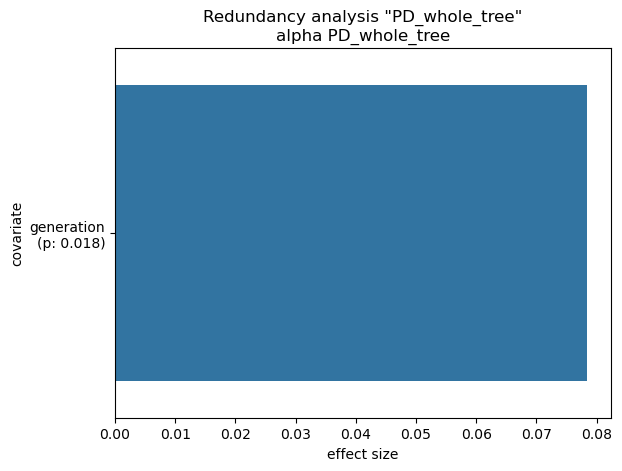

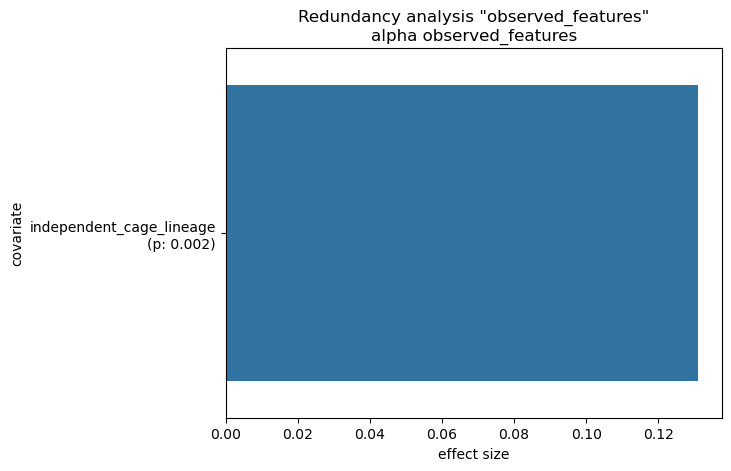

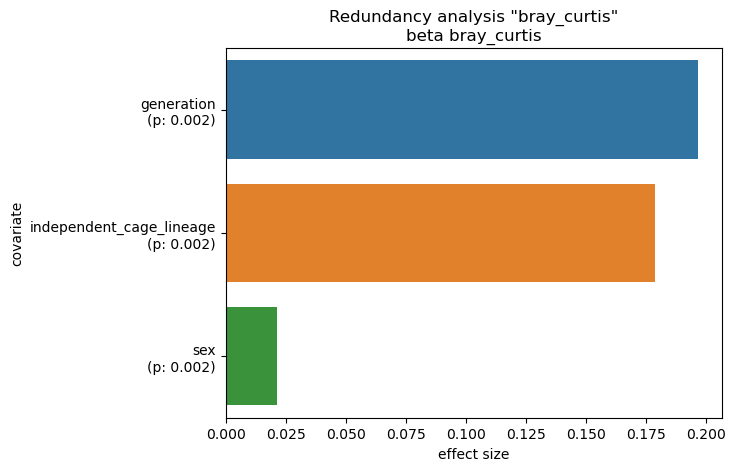

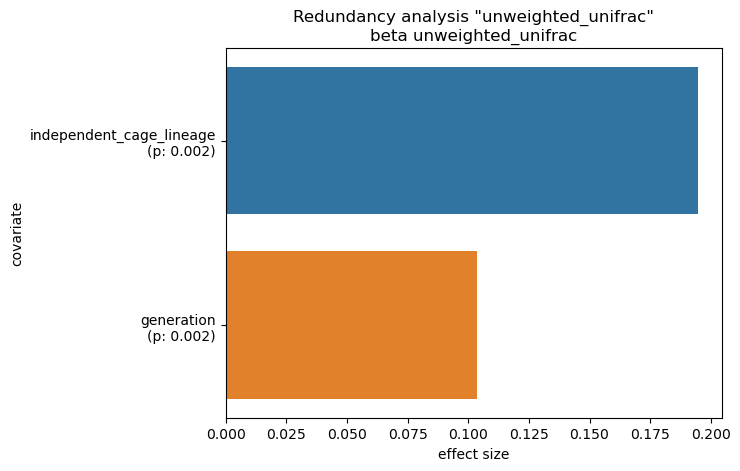

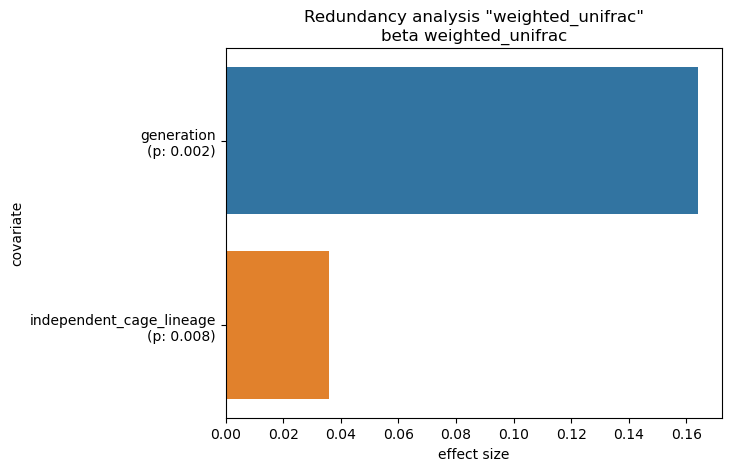

In [141]:
%matplotlib inline
#categorials
categorials = ['independent_cage_lineage', 'sex']

#ordinals
ordinals = {'generation': ['P1', 'F1', 'F2', 'F3', 'F4', 'F5']}

#intervals
intervals = []

#dates
dates = {}

#metrics
metrics_alpha = ['PD_whole_tree', 'shannon', 'observed_features']
metrics_beta = ['bray_curtis', 'unweighted_unifrac', 'weighted_unifrac']

#max_rows = max(len(alpha_div_gut['results'].keys()), len(gut_beta_div['results'].keys()))
#fig, axes = plt.subplots(max_rows, 2, figsize=(5*2, 5*max_rows))
for i, metric in enumerate(metrics_alpha):
    alpha=redundancy_analysis_alpha(meta[meta['genotype'].isin(['BALB/c']) & meta['comparison'].isin([0])],
                             alpha_div_gut['results'][metric],
                             categorials=categorials,
                             ordinals=ordinals,
                             intervals=intervals,
                             dates=dates,
                             #ax=axes[i][0],
                             title='alpha %s' % metric,
                             dry=False,
                             wait=True,
                             use_grid=True,
                             dirty=True,
                             nocache=True)
    plt.savefig(work_dir + "/gut_redundancies_seperate_%s.png" % metric, transparent=False, bbox_inches='tight')
for i, metric in enumerate(metrics_beta):
    beta=redundancy_analysis_beta(meta[meta['genotype'].isin(['BALB/c']) & meta['comparison'].isin([0])],
                             res_beta_gut_no_comp['results'][metric],
                             metric,
                             categorials=categorials,
                             ordinals=ordinals,
                             intervals=intervals,
                             dates=dates,
                             #ax=axes[i][1],
                             title='beta %s' % metric,
                             dry=False,
                             wait=True,
                             use_grid=True,
                             dirty=True,
                             nocache=True)
    plt.savefig(work_dir + "/gut_redundancies_seperate_%s.png" % metric, transparent=False, bbox_inches='tight')

Working directory is '/homes/arehm/TMP/ana_fRDAalpha__hw94oly', cachefile is '.anacache/d402ba82fa37312ad7ce46fedb16d68d.fRDAalpha'. Ordinal "generation" does not specify label(s) "not applicable".
/homes/arehm/Documents/Thesis/ggmap/ggmap/correlations.py:319: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  meta_alpha = meta.loc[:, all_columns].merge(
You provided 386 and 353 samples in metadata and alpha respectively. Merging to 189 samples for further analysis.

Waiting for slurm-cluster job 18539688 to complete: . finished.Working directory is '/homes/arehm/TMP/ana_fRDAalpha_7i8n_bbu', cachefile is '.anacache/0dfb535ddc02564baf4891722d112044.fRDAalpha'. Ordinal "generation" does not specify label(s) "not applicable".
/homes/arehm/Documents/Thesis/ggmap/ggmap/correlations.py:319: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  meta_alpha = meta.loc[:, 

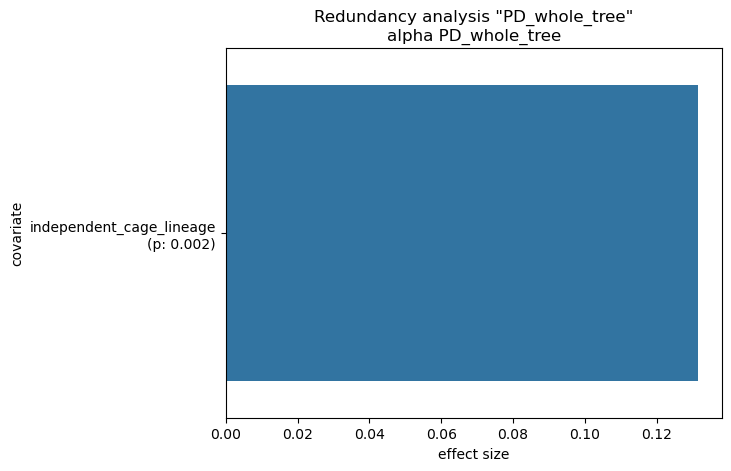

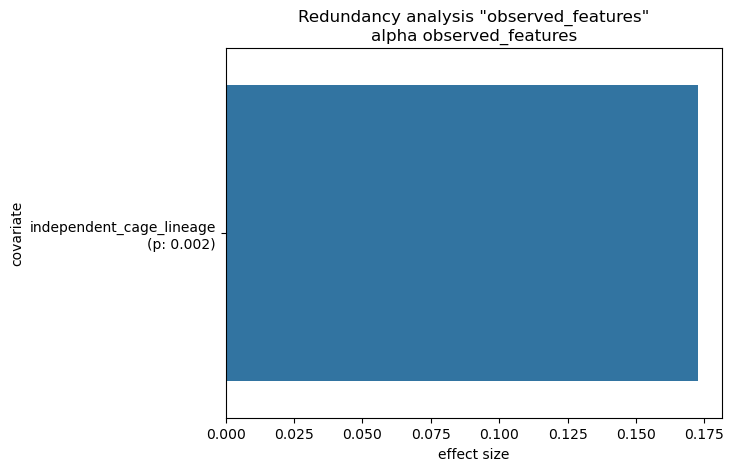

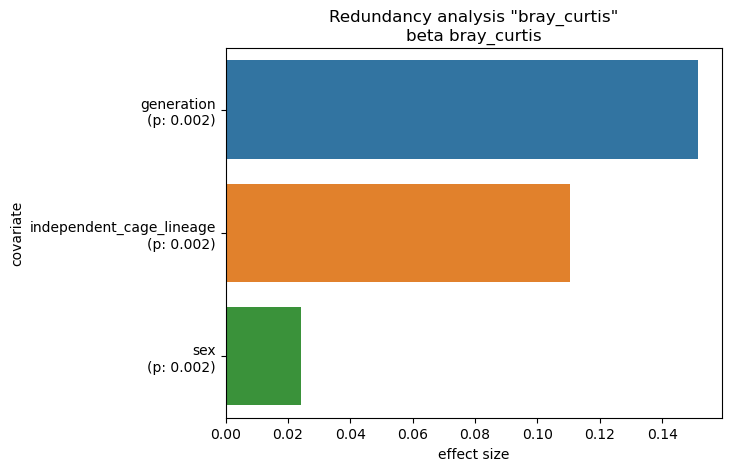

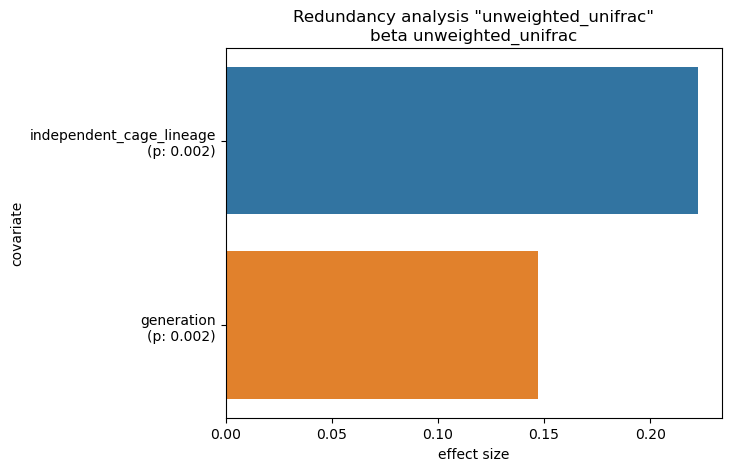

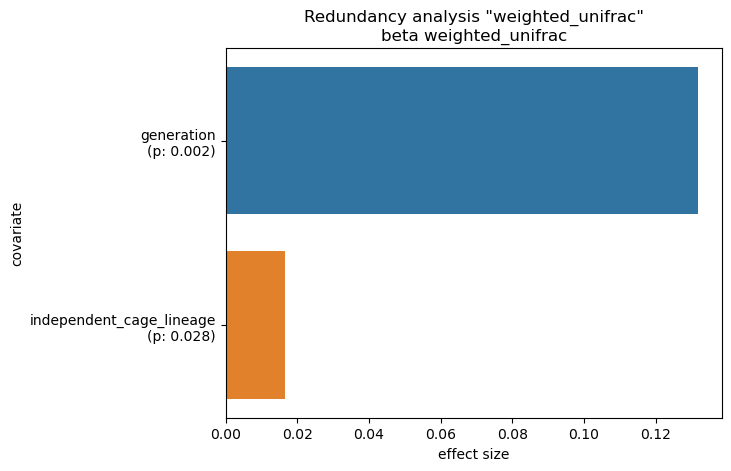

In [142]:
%matplotlib inline
#categorials
categorials = ['independent_cage_lineage', 'sex']

#ordinals
ordinals = {'generation': ['P1', 'F1', 'F2', 'F3', 'F4', 'F5']}

#intervals
intervals = []

#dates
dates = {}

#metrics
metrics_alpha = ['PD_whole_tree', 'shannon', 'observed_features']
metrics_beta = ['bray_curtis', 'unweighted_unifrac', 'weighted_unifrac']

#max_rows = max(len(alpha_div_gut['results'].keys()), len(gut_beta_div['results'].keys()))
#fig, axes = plt.subplots(max_rows, 2, figsize=(5*2, 5*max_rows))
for i, metric in enumerate(metrics_alpha):
    alpha=redundancy_analysis_alpha(meta[meta['genotype'].isin(['C57BL6/J']) & meta['comparison'].isin([0])],
                             alpha_div_gut['results'][metric],
                             categorials=categorials,
                             ordinals=ordinals,
                             intervals=intervals,
                             dates=dates,
                             #ax=axes[i][0],
                             title='alpha %s' % metric,
                             dry=False,
                             wait=True,
                             use_grid=True,
                             dirty=True,
                             nocache=True)
    plt.savefig(work_dir + "/gut_redundancies_seperate_B6_%s.png" % metric, transparent=False, bbox_inches='tight')
for i, metric in enumerate(metrics_beta):
    beta=redundancy_analysis_beta(meta[meta['genotype'].isin(['C57BL6/J']) & meta['comparison'].isin([0])],
                             res_beta_gut_no_comp['results'][metric],
                             metric,
                             categorials=categorials,
                             ordinals=ordinals,
                             intervals=intervals,
                             dates=dates,
                             #ax=axes[i][1],
                             title='beta %s' % metric,
                             dry=False,
                             wait=True,
                             use_grid=True,
                             dirty=True,
                             nocache=True)
    plt.savefig(work_dir + "/gut_redundancies_seperate_B6_%s.png" % metric, transparent=False, bbox_inches='tight')

#### All

Working directory is '/homes/arehm/TMP/ana_fRDAalpha_fcff4e3u', cachefile is '.anacache/8a697b1c1ef970e29f7f7e8b854ee215.fRDAalpha'. Ordinal "generation" does not specify label(s) "RM", "not applicable".
/homes/arehm/Documents/Thesis/ggmap/ggmap/correlations.py:319: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  meta_alpha = meta.loc[:, all_columns].merge(
You provided 720 and 353 samples in metadata and alpha respectively. Merging to 329 samples for further analysis.

Waiting for slurm-cluster job 19303511 to complete: . finished.Working directory is '/homes/arehm/TMP/ana_fRDAalpha_17xtjxes', cachefile is '.anacache/35672d0a5b1c219c4f3e7b1f1557f8d4.fRDAalpha'. Ordinal "generation" does not specify label(s) "RM", "not applicable".
/homes/arehm/Documents/Thesis/ggmap/ggmap/correlations.py:319: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  meta_alpha = 

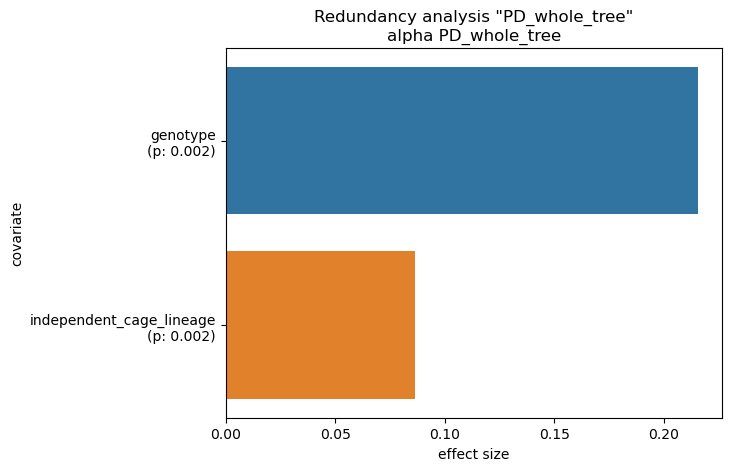

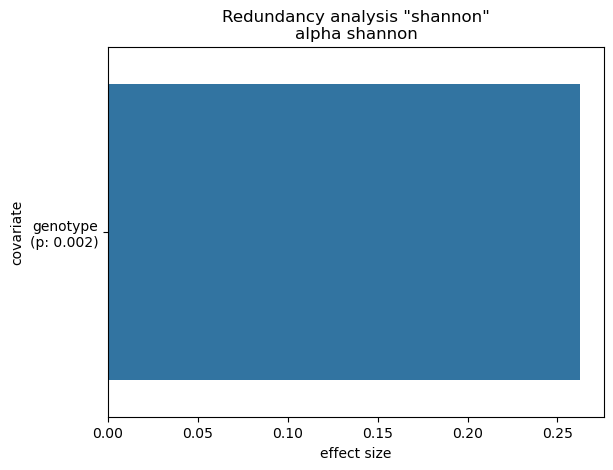

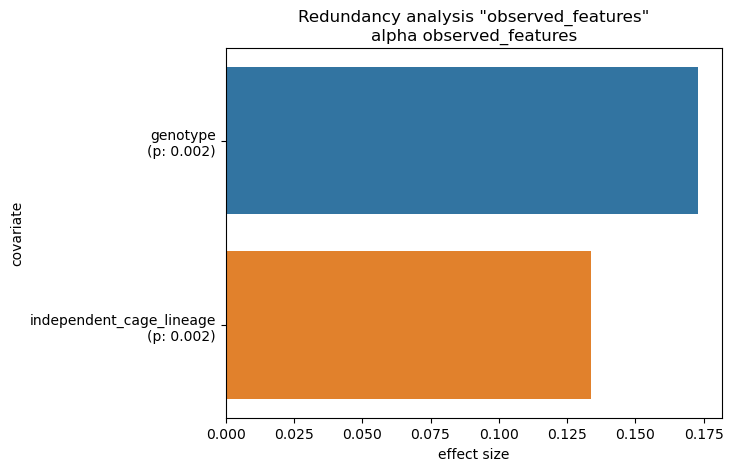

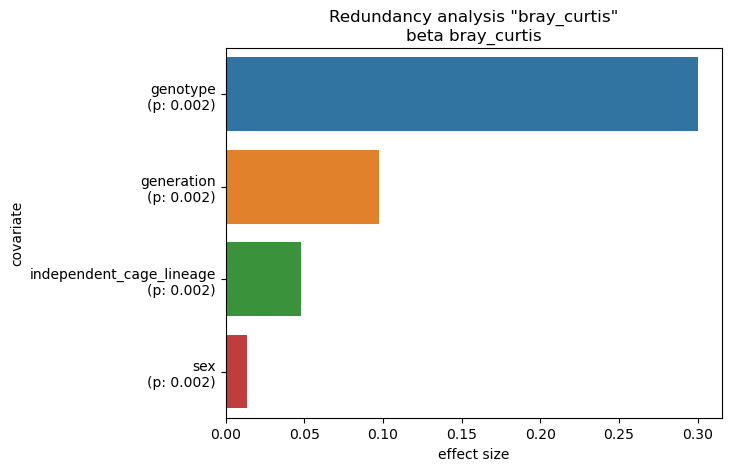

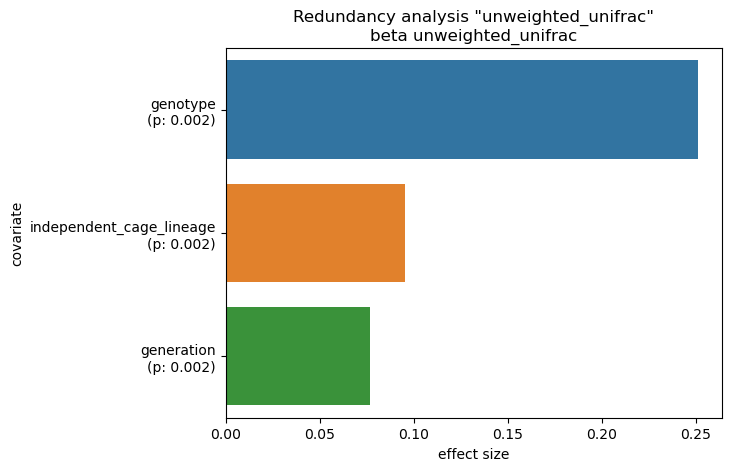

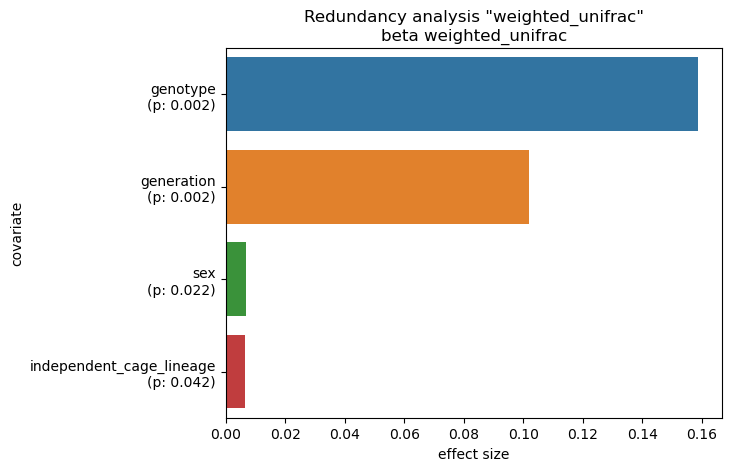

In [283]:
%matplotlib inline
#categorials
categorials = ['genotype', 'independent_cage_lineage', 'sex']

#ordinals
ordinals = {'generation': ['P1', 'F1', 'F2', 'F3', 'F4', 'F5']}

#intervals
intervals = []

#dates
dates = {}

#metrics
metrics_alpha = ['PD_whole_tree', 'shannon', 'observed_features']
metrics_beta = ['bray_curtis', 'unweighted_unifrac', 'weighted_unifrac']

#max_rows = max(len(alpha_div_gut['results'].keys()), len(gut_beta_div['results'].keys()))
#fig, axes = plt.subplots(max_rows, 2, figsize=(5*2, 5*max_rows))
for i, metric in enumerate(metrics_alpha):
    alpha=redundancy_analysis_alpha(meta[meta['comparison'].isin([0])],
                             alpha_div_gut['results'][metric],
                             categorials=categorials,
                             ordinals=ordinals,
                             intervals=intervals,
                             dates=dates,
                             #ax=axes[i][0],
                             title='alpha %s' % metric,
                             dry=False,
                             wait=True,
                             use_grid=True,
                             dirty=True,
                             nocache=True)
    plt.savefig(work_dir + "/gut_redundancies_seperate_all_%s.png" % metric, transparent=False, bbox_inches='tight')
for i, metric in enumerate(metrics_beta):
    beta=redundancy_analysis_beta(meta[meta['comparison'].isin([0])],
                             res_beta_gut_no_comp['results'][metric],
                             metric,
                             categorials=categorials,
                             ordinals=ordinals,
                             intervals=intervals,
                             dates=dates,
                             #ax=axes[i][1],
                             title='beta %s' % metric,
                             dry=False,
                             wait=True,
                             use_grid=True,
                             dirty=True,
                             nocache=True)
    plt.savefig(work_dir + "/gut_redundancies_seperate_all_%s.png" % metric, transparent=False, bbox_inches='tight')

In [28]:
alpha['results']

{'table':                   covariate    R2.adj   Df          AIC          F  Pr(>F)  \
 0                  genotype  0.172904  1.0  1690.976657  64.132785   0.002   
 1  independent_cage_lineage  0.306416  2.0  1639.613934  29.970644   0.002   
 
    effect size                                 label  
 0     0.172904                  genotype\n(p: 0.002)  
 1     0.133512  independent_cage_lineage\n(p: 0.002)  ,
 'figure': <AxesSubplot:title={'center':'Redundancy analysis "observed_features"\nalpha observed_features'}, xlabel='effect size', ylabel='covariate'>}

### Sebum

Working directory is '/homes/arehm/TMP/ana_fRDAalpha_yg0d_xdj', cachefile is '.anacache/9d62df4c14f0436b63b101975c331a56.fRDAalpha'. Ordinal "generation" does not specify label(s) "RM", "not applicable".
/homes/arehm/Documents/Thesis/ggmap/ggmap/correlations.py:319: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  meta_alpha = meta.loc[:, all_columns].merge(
You provided 720 and 274 samples in metadata and alpha respectively. Merging to 258 samples for further analysis.

Waiting for slurm-cluster job 18539777 to complete: . finished. Was removed.
Working directory is '/homes/arehm/TMP/ana_fRDAalpha_or0a9g8_', cachefile is '.anacache/e222566362daf1708854ab724219d012.fRDAalpha'. Ordinal "generation" does not specify label(s) "RM", "not applicable".
/homes/arehm/Documents/Thesis/ggmap/ggmap/correlations.py:319: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
 

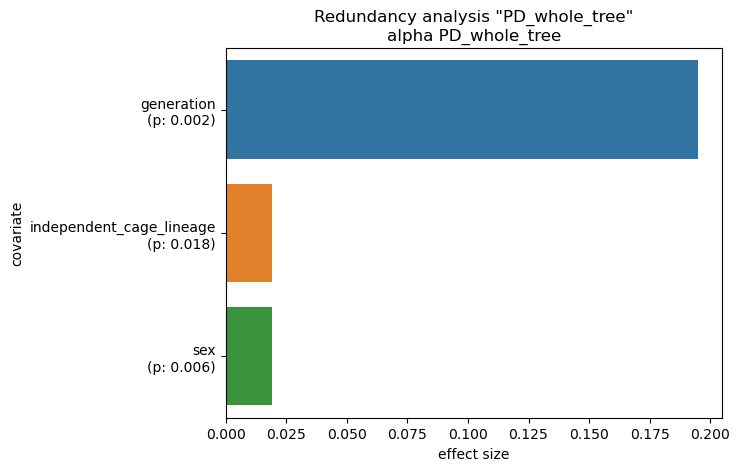

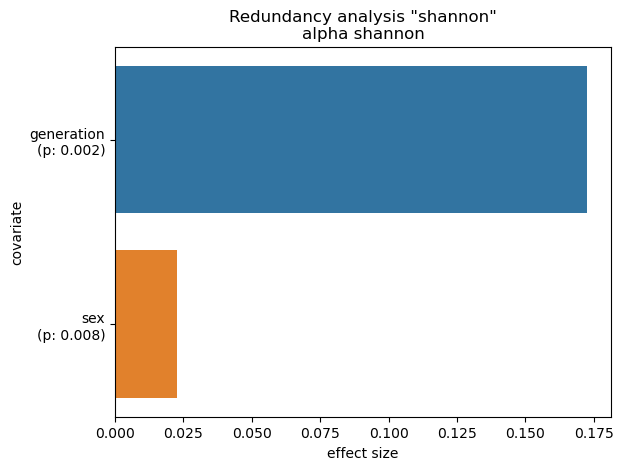

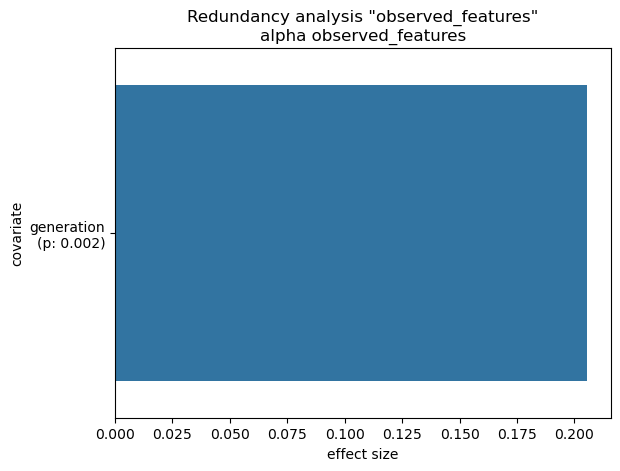

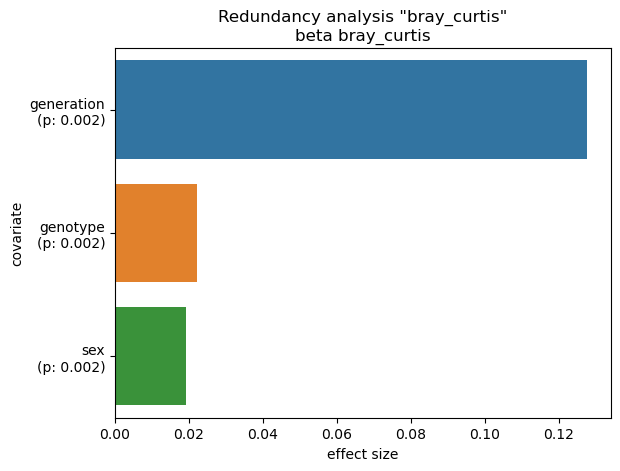

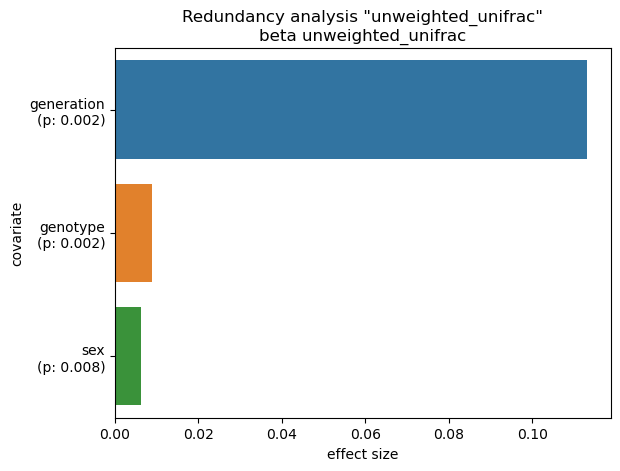

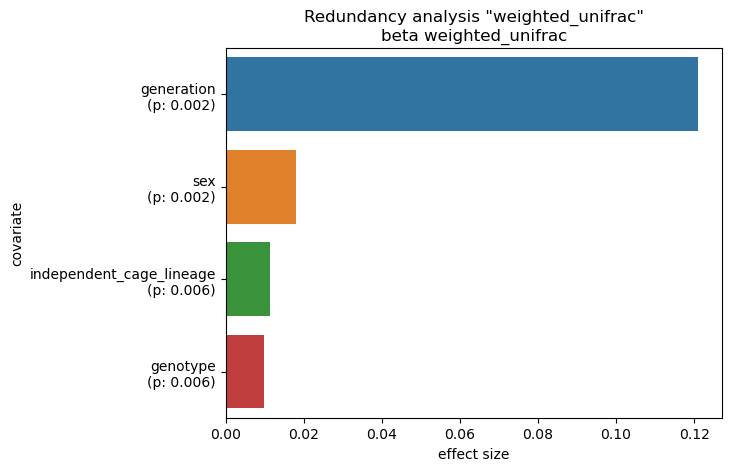

In [144]:
%matplotlib inline
#categorials
categorials = ['genotype', 'independent_cage_lineage', 'sex']

#ordinals
ordinals = {'generation': ['P1', 'F1', 'F2', 'F3', 'F4', 'F5']}

#intervals
intervals = []

#dates
dates = {}

#metrics
metrics_alpha = ['PD_whole_tree', 'shannon', 'observed_features']
metrics_beta = ['bray_curtis', 'unweighted_unifrac', 'weighted_unifrac']

#max_rows = max(len(alpha_div_sebum['results'].keys()), len(sebum_beta_div['results'].keys()))
#fig, axes = plt.subplots(max_rows, 2, figsize=(5*2, 5*max_rows))
for i, metric in enumerate(metrics_alpha):
    redundancy_analysis_alpha(meta[meta['comparison'].isin([0])],
                             alpha_div_sebum['results'][metric],
                             categorials=categorials,
                             ordinals=ordinals,
                             intervals=intervals,
                             dates=dates,
                             #ax=axes[i][0],
                             title='alpha %s' % metric,
                             dry=False,
                             wait=True,
                             use_grid=True)
    plt.savefig(work_dir + "/sebum_redundancies_seperate_all_%s.png" % metric, transparent=False, bbox_inches='tight')
for i, metric in enumerate(metrics_beta):
    redundancy_analysis_beta(meta[meta['comparison'].isin([0])],
                             res_beta_sebum_no_comp['results'][metric],
                             metric,
                             categorials=categorials,
                             ordinals=ordinals,
                             intervals=intervals,
                             dates=dates,
                             #ax=axes[i][1],
                             title='beta %s' % metric,
                             dry=False,
                             wait=True,
                             use_grid=True)
    plt.savefig(work_dir + "/sebum_redundancies_seperate_all_%s.png" % metric, transparent=False, bbox_inches='tight')

Working directory is '/homes/arehm/TMP/ana_fRDAalpha_lu9cov3y', cachefile is '.anacache/c256ed453544b88e4f843b05141c7bf0.fRDAalpha'. Ordinal "generation" does not specify label(s) "not applicable".
/homes/arehm/Documents/Thesis/ggmap/ggmap/correlations.py:319: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  meta_alpha = meta.loc[:, all_columns].merge(
You provided 234 and 274 samples in metadata and alpha respectively. Merging to 89 samples for further analysis.

Waiting for slurm-cluster job 18539823 to complete: . finished.Working directory is '/homes/arehm/TMP/ana_fRDAalpha_b4n147g_', cachefile is '.anacache/4ec1a9a34c9bd27d82baec0322fae6be.fRDAalpha'. Ordinal "generation" does not specify label(s) "not applicable".
/homes/arehm/Documents/Thesis/ggmap/ggmap/correlations.py:319: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  meta_alpha = meta.loc[:, a

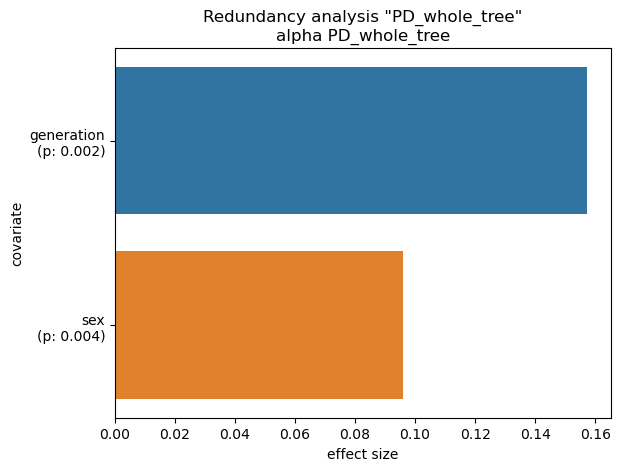

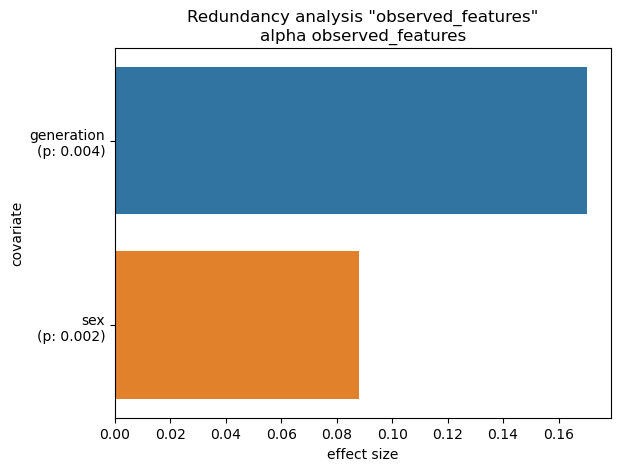

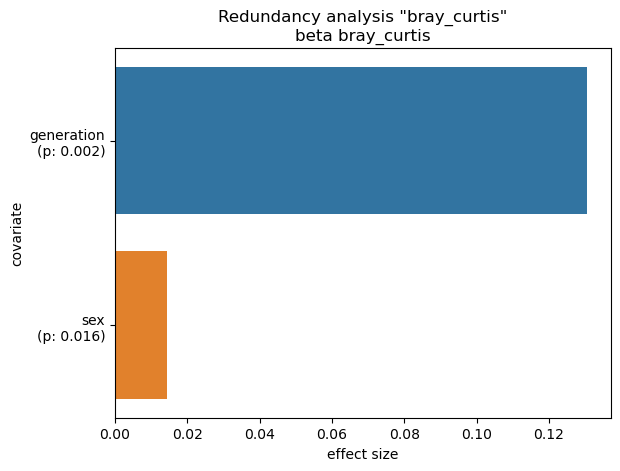

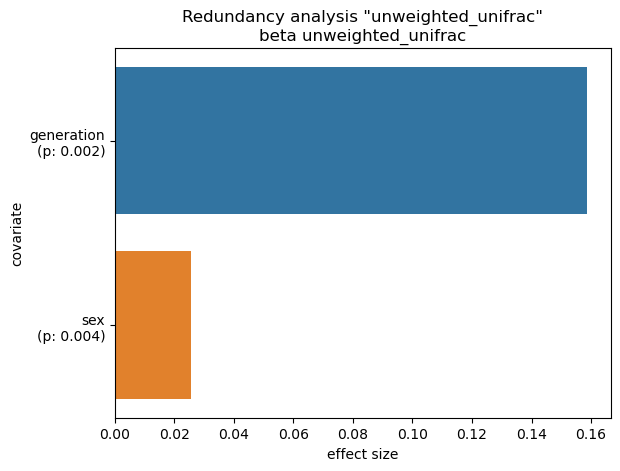

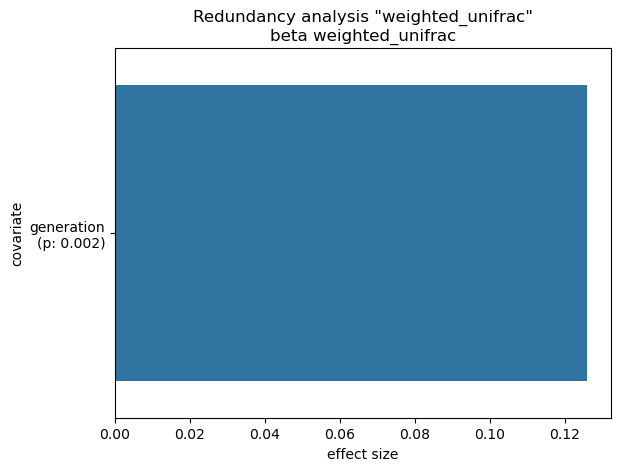

In [145]:
%matplotlib inline
#categorials
categorials = ['independent_cage_lineage', 'sex']

#ordinals
ordinals = {'generation': ['P1', 'F1', 'F2', 'F3', 'F4', 'F5']}

#intervals
intervals = []

#dates
dates = {}

#metrics
metrics_alpha = ['PD_whole_tree', 'shannon', 'observed_features']
metrics_beta = ['bray_curtis', 'unweighted_unifrac', 'weighted_unifrac']

#max_rows = max(len(alpha_div_gut['results'].keys()), len(gut_beta_div['results'].keys()))
#fig, axes = plt.subplots(max_rows, 2, figsize=(5*2, 5*max_rows))
for i, metric in enumerate(metrics_alpha):
    alpha=redundancy_analysis_alpha(meta[meta['genotype'].isin(['BALB/c']) & meta['comparison'].isin([0])],
                             alpha_div_sebum['results'][metric],
                             categorials=categorials,
                             ordinals=ordinals,
                             intervals=intervals,
                             dates=dates,
                             #ax=axes[i][0],
                             title='alpha %s' % metric,
                             dry=False,
                             wait=True,
                             use_grid=True,
                             dirty=True,
                             nocache=True)
    plt.savefig(work_dir + "/gut_redundancies_seperate_BALB_%s.png" % metric, transparent=False, bbox_inches='tight')
for i, metric in enumerate(metrics_beta):
    beta=redundancy_analysis_beta(meta[meta['genotype'].isin(['BALB/c']) & meta['comparison'].isin([0])],
                             res_beta_sebum_no_comp['results'][metric],
                             metric,
                             categorials=categorials,
                             ordinals=ordinals,
                             intervals=intervals,
                             dates=dates,
                             #ax=axes[i][1],
                             title='beta %s' % metric,
                             dry=False,
                             wait=True,
                             use_grid=True,
                             dirty=True,
                             nocache=True)
    plt.savefig(work_dir + "/gut_redundancies_seperate_BALB_%s.png" % metric, transparent=False, bbox_inches='tight')

found matching working dir "/homes/arehm/TMP/ana_fRDAalpha__hw94oly"
found matching working dir "/homes/arehm/TMP/ana_fRDAalpha_7i8n_bbu"
No significant findings.
found matching working dir "/homes/arehm/TMP/ana_fRDAalpha_n0h4lmow"
Working directory is '/homes/arehm/TMP/ana_fRDAbeta_czzkkjht', cachefile is '.anacache/f4d084f5033f2b20b56798a88298a63c.fRDAbeta'. Ordinal "generation" does not specify label(s) "not applicable".
/homes/arehm/miniconda3/envs/ggmap/lib/python3.10/site-packages/skbio/stats/ordination/_principal_coordinate_analysis.py:143: RuntimeWarning: The result contains negative eigenvalues. Please compare their magnitude with the magnitude of some of the largest positive eigenvalues. If the negative ones are smaller, it's probably safe to ignore them, but if they are large in magnitude, the results won't be useful. See the Notes section for more details. The smallest eigenvalue is -0.21305380489301978 and the largest is 19.194921256368172.
  warn(
/homes/arehm/Documents/T

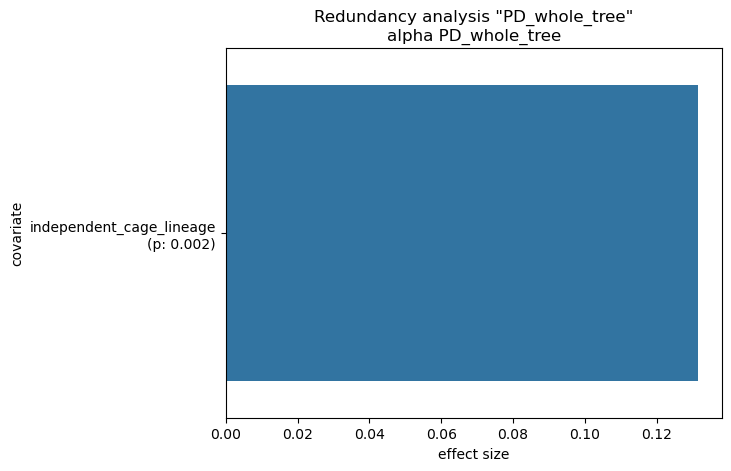

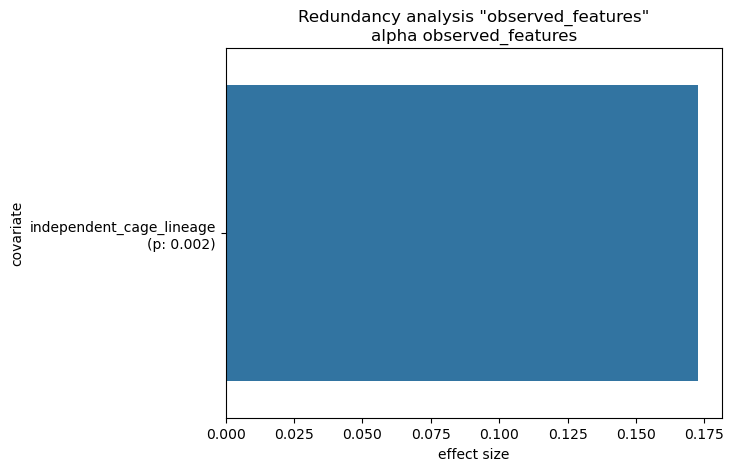

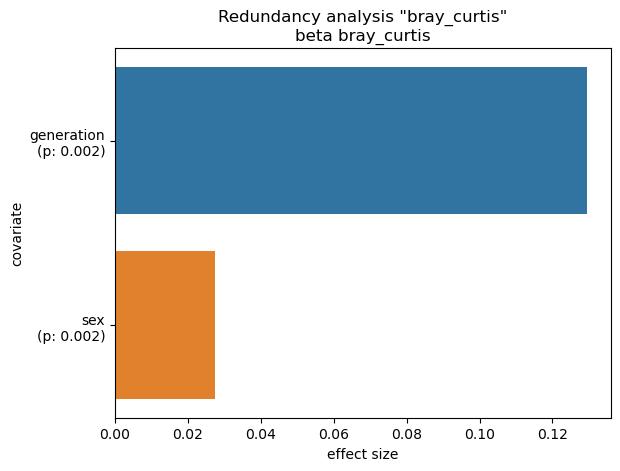

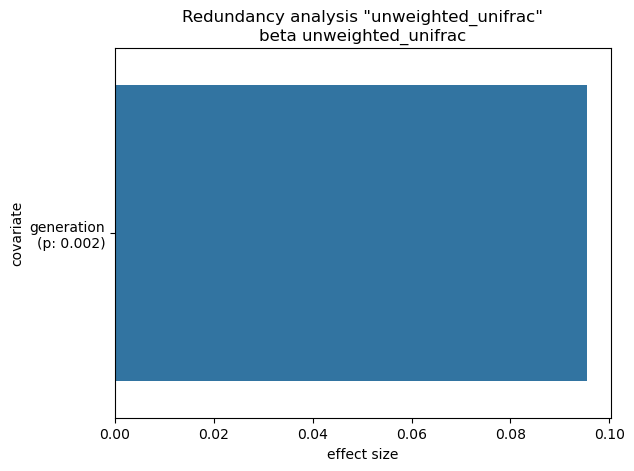

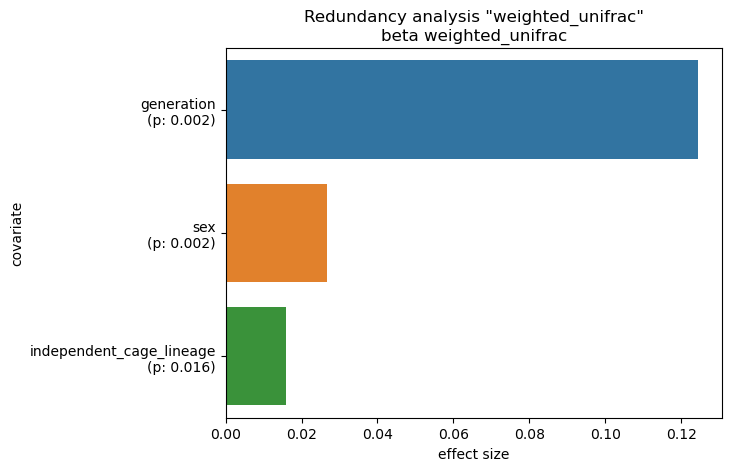

In [146]:
%matplotlib inline
#categorials
categorials = ['independent_cage_lineage', 'sex']

#ordinals
ordinals = {'generation': ['P1', 'F1', 'F2', 'F3', 'F4', 'F5']}

#intervals
intervals = []

#dates
dates = {}

#metrics
metrics_alpha = ['PD_whole_tree', 'shannon', 'observed_features']
metrics_beta = ['bray_curtis', 'unweighted_unifrac', 'weighted_unifrac']

#max_rows = max(len(alpha_div_gut['results'].keys()), len(gut_beta_div['results'].keys()))
#fig, axes = plt.subplots(max_rows, 2, figsize=(5*2, 5*max_rows))
for i, metric in enumerate(metrics_alpha):
    alpha=redundancy_analysis_alpha(meta[meta['genotype'].isin(['C57BL6/J']) & meta['comparison'].isin([0])],
                             alpha_div_gut['results'][metric],
                             categorials=categorials,
                             ordinals=ordinals,
                             intervals=intervals,
                             dates=dates,
                             #ax=axes[i][0],
                             title='alpha %s' % metric,
                             dry=False,
                             wait=True,
                             use_grid=True,
                             dirty=True,
                             nocache=True)
    plt.savefig(work_dir + "/gut_redundancies_seperate_B6_%s.png" % metric, transparent=False, bbox_inches='tight')
for i, metric in enumerate(metrics_beta):
    beta=redundancy_analysis_beta(meta[meta['genotype'].isin(['C57BL6/J']) & meta['comparison'].isin([0])],
                             res_beta_sebum_no_comp['results'][metric],
                             metric,
                             categorials=categorials,
                             ordinals=ordinals,
                             intervals=intervals,
                             dates=dates,
                             #ax=axes[i][1],
                             title='beta %s' % metric,
                             dry=False,
                             wait=True,
                             use_grid=True,
                             dirty=True,
                             nocache=True)
    plt.savefig(work_dir + "/gut_redundancies_seperate_B6_%s.png" % metric, transparent=False, bbox_inches='tight')

## Source Tracking
### Gut

In [276]:
for sink_group in ["RM"]:
    meta[meta['genotype'].isin(["BALB/c"])]
    conditions = (
        (meta["cage_group"] == "PC-1") | (meta["cage_group"] == "PC-2") | (meta["cage_group"] == "PB-1") | (meta["cage_group"] == "PB-2") | (meta["cage_group"] == "PB-3"),
        meta["generation"] == sink_group
    )
    values = ["Source", "Sink"]
    column_name ="source_sink_P1-%s" % str(sink_group)
    meta[column_name] = np.select(conditions, values, "None")

In [277]:
P1_RM_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_P1-RM",
    dry=False,
    wait=True
    )

Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_hr22l1qj', cachefile is '.anacache/64f01cab6ee16752979197e7ce79946f.sourcetracker2'. 
Waiting for slurm-cluster job 19296422 to complete: ...................... finished. Was removed.


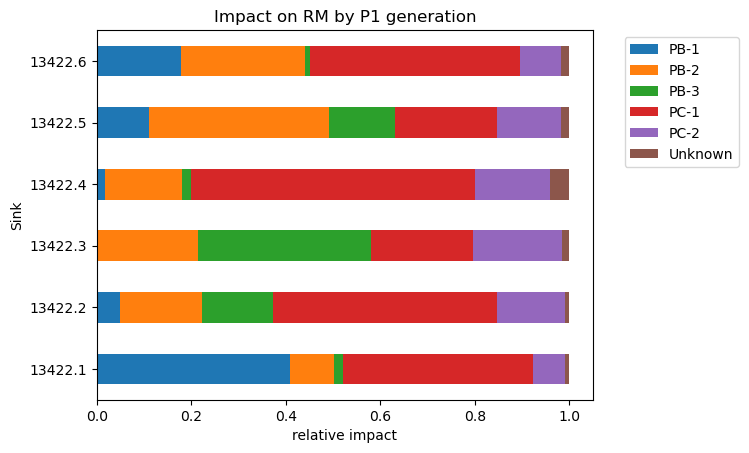

In [278]:
%matplotlib inline
ax= P1_RM_source_tracking["results"].transpose().plot.barh(stacked=True)
plt.xlabel('relative impact')   
plt.title(f'Impact on RM by P1 generation')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2)
plt.savefig(work_dir + "/source_tracker_RM_P1.png", transparent=False, bbox_inches='tight')

#### BALB/c
##### Impact of CF1 cage groups on CF2 cage groups

In [208]:
for sink_group in ["CF2-1", "CF2-2"]:
    meta[meta['genotype'].isin(["BALB/c"])]
    conditions = (
        (meta["cage_group"] == "CF1-1") | (meta["cage_group"] == "CF1-2"),
        meta["cage_group"] == sink_group
    )
    values = ["Source", "Sink"]
    column_name ="source_sink_CF1-%s" % str(sink_group)
    meta[column_name] = np.select(conditions, values, "None")

In [209]:
CF1_2_1_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_CF1-CF2-1",
    dry=False,
    wait=True
    )
CF1_2_2_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_CF1-CF2-2",
    dry=False,
    wait=True
    )

Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_4kyac1x_', cachefile is '.anacache/e53a3b31fcdbe4cf8eb27801e2a16bf3.sourcetracker2'. 
Waiting for slurm-cluster job 19279733 to complete: ....................... finished. Was removed.
Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_7414w59x', cachefile is '.anacache/03f5c0d925e5a4a4a917315ba8de9691.sourcetracker2'. 
Waiting for slurm-cluster job 19279737 to complete: ...................... finished. Was removed.


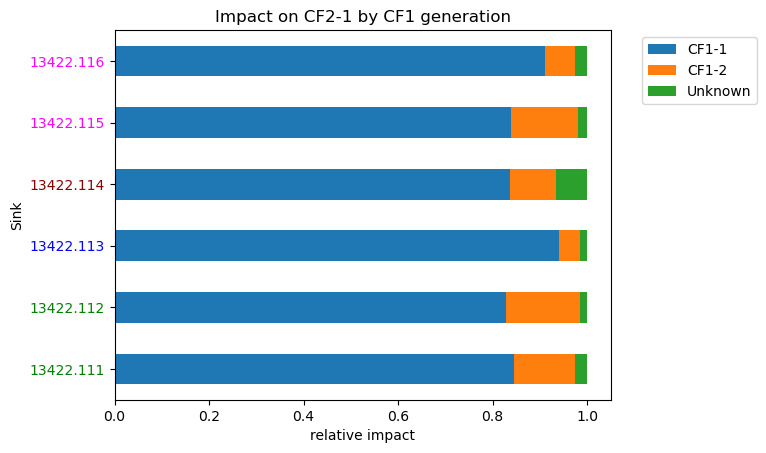

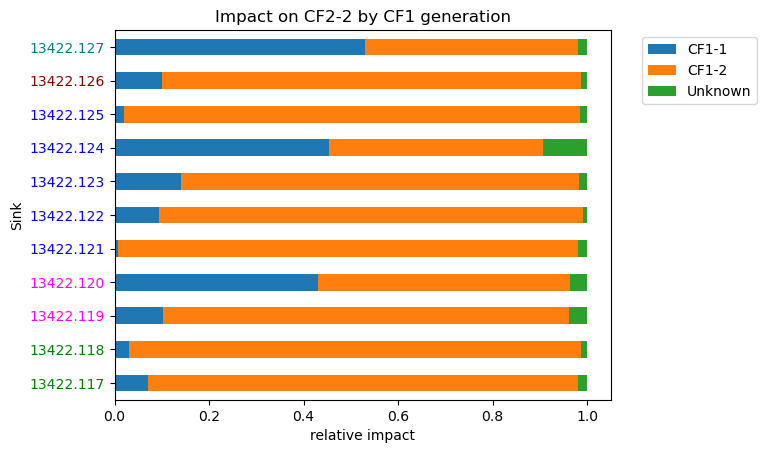

In [210]:
%matplotlib inline
for i,group in enumerate([CF1_2_1_source_tracking, CF1_2_2_source_tracking], 1):
    ax= group["results"].transpose().plot.barh(stacked=True)
    if i == 1:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F2-17"):
                tick.set_color('green')
            elif cage_ID in ("F2-18"):
                tick.set_color('blue')
            elif cage_ID in ("F2-19"):
                tick.set_color('darkred')
            elif cage_ID in ("F2-20"):
                tick.set_color('magenta')
            else:
                tick.set_color('black')
        
    else:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F2-21"):
                tick.set_color('green')
            elif cage_ID in ("F2-22"):
                tick.set_color('blue')
            elif cage_ID in ("F2-23"):
                tick.set_color('darkred')
            elif cage_ID in ("F2-24"):
                tick.set_color('magenta')
            elif cage_ID in ("F2-25"):
                tick.set_color('teal')
            else:
                tick.set_color('black')
    plt.xlabel('relative impact')   
    plt.title(f'Impact on CF2-{i} by CF1 generation')
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2)
    plt.savefig(work_dir + "/source_tracker_%s.png" %i, transparent=False, bbox_inches='tight')

##### Impact of CF2 cage groups on CF3 cage groups

In [211]:
for sink_group in ["CF3-1", "CF3-2", "CF3-3"]:
    meta[meta['genotype'].isin(["BALB/c"])]
    conditions = (
        (meta["cage_group"] == "CF2-1") | (meta["cage_group"] == "CF2-2") | (meta["cage_group"] == "CF2-3"),
        meta["cage_group"] == sink_group
    )
    values = ["Source", "Sink"]
    column_name ="source_sink_CF2-" + str(sink_group)
    meta[column_name] = np.select(conditions, values, "None")

In [212]:
CF2_3_1_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_CF2-CF3-1",
    dry=False,
    wait=True
)

CF2_3_2_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_CF2-CF3-2",
    dry=False,
    wait=True
)

CF2_3_3_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_CF2-CF3-3",
    dry=False,
    wait=True
)

Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_ydrhrldv', cachefile is '.anacache/f3e100ae10444cc36e4eed3bcb817825.sourcetracker2'. 
Waiting for slurm-cluster job 19279759 to complete: .................. finished. Was removed.
Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_66zt8r5t', cachefile is '.anacache/692b4d572fb22fcc40ea8f1479596333.sourcetracker2'. 
Waiting for slurm-cluster job 19279760 to complete: ....................... finished. Was removed.
Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_464dsx72', cachefile is '.anacache/7ad5357faf7083781569d3b5a92edc32.sourcetracker2'. 
Waiting for slurm-cluster job 19279763 to complete: ...................... finished. Was removed.


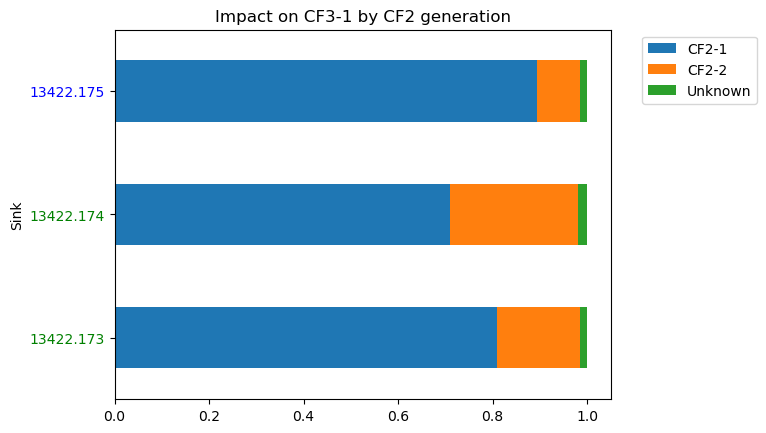

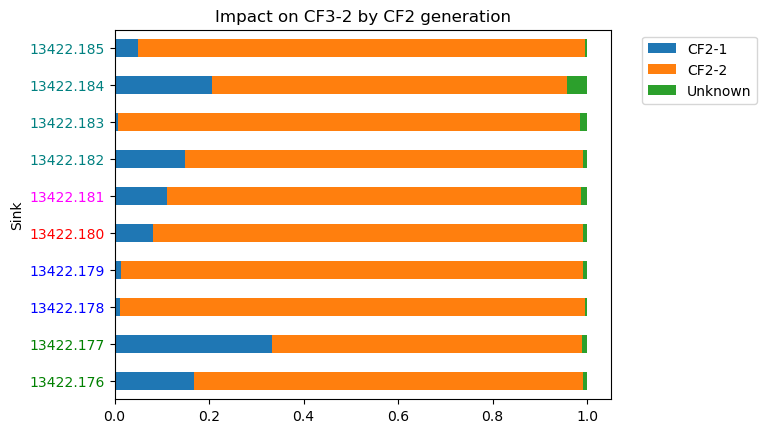

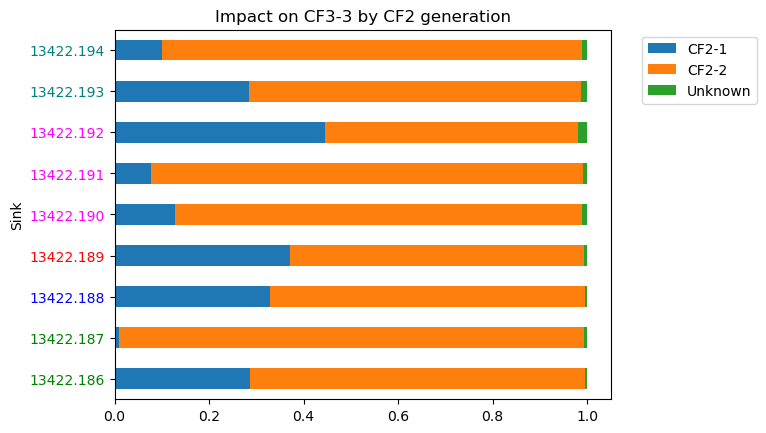

In [213]:
for i,group in enumerate([CF2_3_1_source_tracking, CF2_3_2_source_tracking, CF2_3_3_source_tracking], 1):
    ax= group["results"].transpose().plot.barh(stacked=True)
    if i == 1:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F3-21"):
                tick.set_color('green')
            elif cage_ID in ("F3-22"):
                tick.set_color('blue')
            else:
                tick.set_color('black')
    elif i==2:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F3-23"):
                tick.set_color('green')
            elif cage_ID in ("F3-24"):
                tick.set_color('blue')
            elif cage_ID in ("F3-25"):
                tick.set_color('red')
            elif cage_ID in ("F3-26"):
                tick.set_color('magenta')
            elif cage_ID in ("F3-27"):
                tick.set_color('teal')
            else:
                tick.set_color('black')       
    else:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F3-28"):
                tick.set_color('green')
            elif cage_ID in ("F3-29"):
                tick.set_color('blue')
            elif cage_ID in ("F3-30"):
                tick.set_color('red')
            elif cage_ID in ("F3-31"):
                tick.set_color('magenta')
            elif cage_ID in ("F3-32"):
                tick.set_color('teal')
            else:
                tick.set_color('black')
    plt.title(f'Impact on CF3-{i} by CF2 generation')
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2)
    plt.savefig(work_dir + "/gut_BALB_source_tracker_%s.png" %i, transparent=False, bbox_inches='tight')

##### Impact of CF3 cage groups on CF4 cage groups

In [214]:
for sink_group in ["CF4-1", "CF4-2", "CF4-3"]:
    meta[meta['genotype'].isin(["BALB/c"])]
    conditions = (
        (meta["cage_group"] == "CF3-1") | (meta["cage_group"] == "CF3-2") | (meta["cage_group"] == "CF3-3"),
        meta["cage_group"] == sink_group
    )
    values = ["Source", "Sink"]
    column_name ="source_sink_CF3-" + str(sink_group)
    meta[column_name] = np.select(conditions, values, "None")

In [215]:
CF3_4_1_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_CF3-CF4-1",
    dry=False,
    wait=True
)

CF3_4_2_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_CF3-CF4-2",
    dry=False,
    wait=True
)

CF3_4_3_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_CF3-CF4-3",
    dry=False,
    wait=True
)

Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_vkbhpk8f', cachefile is '.anacache/6531470a01f08ef0323b13d928d40283.sourcetracker2'. 
Waiting for slurm-cluster job 19279785 to complete: ...................... finished. Was removed.
Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_6q3js6pq', cachefile is '.anacache/be818e7998f8b875aef21200c1479bb8.sourcetracker2'. 
Waiting for slurm-cluster job 19279788 to complete: ....................... finished. Was removed.
Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_pv1lc8xf', cachefile is '.anacache/da75cd662dd9a5f1702a9cd2feb7e97a.sourcetracker2'. 
Waiting for slurm-cluster job 19279865 to complete: ........................ finished. Was removed.


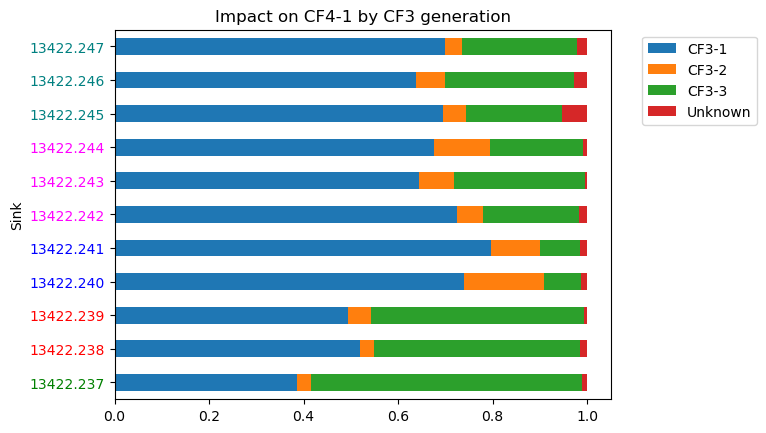

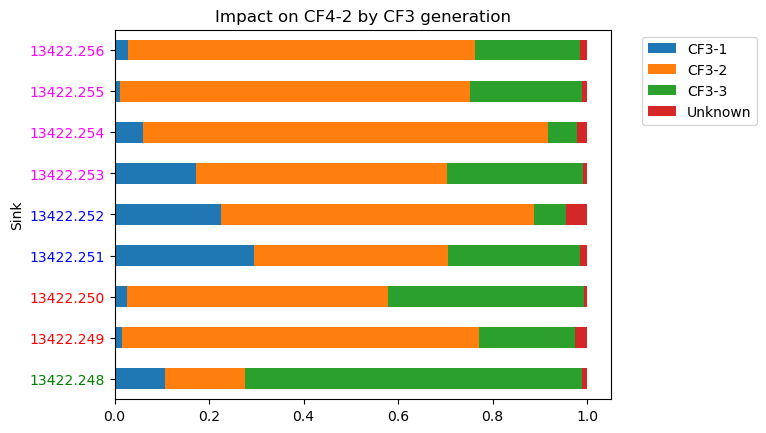

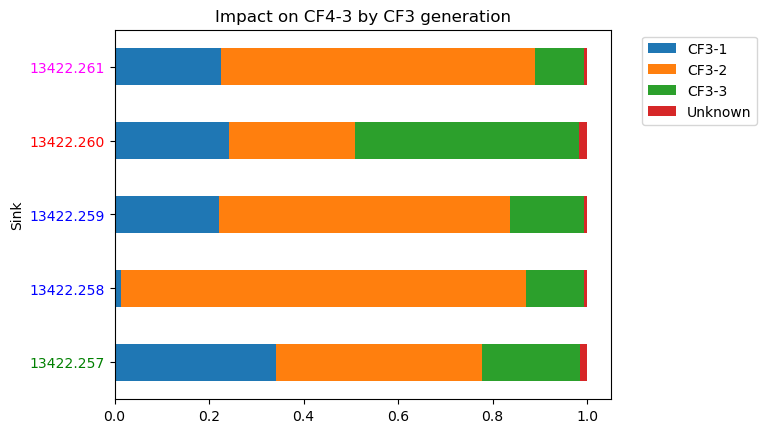

In [216]:
for i,group in enumerate([CF3_4_1_source_tracking, CF3_4_2_source_tracking, CF3_4_3_source_tracking], 1):
    ax= group["results"].transpose().plot.barh(stacked=True)
    if i == 1:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F4-19"):
                tick.set_color('green')
            elif cage_ID in ("F4-20"):
                tick.set_color('blue')
            elif cage_ID in ("F4-21"):
                tick.set_color('red')
            elif cage_ID in ("F4-22"):
                tick.set_color('magenta')
            elif cage_ID in ("F4-23"):
                tick.set_color('teal')
            else:
                tick.set_color('black')
    elif i==2:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F4-24"):
                tick.set_color('green')
            elif cage_ID in ("F4-25"):
                tick.set_color('blue')
            elif cage_ID in ("F4-26"):
                tick.set_color('red')
            elif cage_ID in ("F4-27"):
                tick.set_color('magenta')
            else:
                tick.set_color('black')       
    else:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F4-28"):
                tick.set_color('green')
            elif cage_ID in ("F4-29"):
                tick.set_color('blue')
            elif cage_ID in ("F4-30"):
                tick.set_color('red')
            elif cage_ID in ("F4-31"):
                tick.set_color('magenta')
            else:
                tick.set_color('black')
    plt.title(f'Impact on CF4-{i} by CF3 generation')
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2)

##### Impact of CF4 cage groups on CF5 cage groups

In [217]:
meta["cage_group"]

sample_name
13422.1            other
13422.10            PC-2
13422.100          BF2-3
13422.100skin      BF2-3
13422.101          BF2-3
13422.101skin      BF2-3
13422.102          BF2-3
13422.102skin      BF2-3
13422.103          BF2-3
13422.103skin      BF2-3
13422.104          BF2-3
13422.104skin      BF2-3
13422.105          BF2-3
13422.105skin      BF2-3
13422.106          BF2-3
13422.106skin      BF2-3
13422.107          BF2-3
13422.107skin      BF2-3
13422.108          BF2-3
13422.108skin      BF2-3
13422.109          BF2-3
13422.109skin      BF2-3
13422.10skin        PC-2
13422.11           other
13422.110          BF2-3
13422.110skin      BF2-3
13422.111          CF2-1
13422.111skin      CF2-1
13422.112          CF2-1
13422.112skin      CF2-1
13422.113          CF2-1
13422.113skin      CF2-1
13422.114          CF2-1
13422.114skin      CF2-1
13422.115          CF2-1
13422.115skin      CF2-1
13422.116          CF2-1
13422.116skin      CF2-1
13422.117          CF2-2
13422.117skin

In [218]:
_5_1_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_CF4-CF5-1",
    dry=False,
    wait=True
)

CF4_5_2_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_CF4-CF5-2",
    dry=False,
    wait=True
)

CF4_5_3_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_CF4-CF5-3",
    dry=False,
    wait=True
)

Reduced to 309 samples (feature-table had 309, metadata had 780 samples)


ValueError: The following 1 column(s) are not present in the provided table: source_sink_CF4-CF5-1

In [ ]:
for i,group in enumerate([CF4_5_1_source_tracking, CF4_5_2_source_tracking, CF4_5_3_source_tracking], 1):
    ax= group["results"].transpose().plot.barh(stacked=True)
    if i == 1:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F5-8"):
                tick.set_color('green')
            elif cage_ID in ("F5-9"):
                tick.set_color('blue')
            elif cage_ID in ("F5-10"):
                tick.set_color('red')
            else:
                tick.set_color('black')
    elif i==2:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F5-11"):
                tick.set_color('green')
            elif cage_ID in ("F5-12"):
                tick.set_color('blue')
            elif cage_ID in ("F5-13"):
                tick.set_color('red')
            elif cage_ID in ("F5-14"):
                tick.set_color('magenta')
            else:
                tick.set_color('black')       
    else:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F5-15"):
                tick.set_color('green')
            elif cage_ID in ("F5-16"):
                tick.set_color('blue')
            elif cage_ID in ("F5-17"):
                tick.set_color('red')
            elif cage_ID in ("F5-18"):
                tick.set_color('magenta')
            elif cage_ID in ("F5-19"):
                tick.set_color('teal')
            else:
                tick.set_color('black')
    plt.title(f'Impact on CF5-{i} by CF4 generation')
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2)
    plt.savefig(work_dir + "/gut_BALB_source_tracker_%s.png" %i, transparent=False, bbox_inches='tight')

##### Impact of P1 on F generations

###### F1

In [222]:
for sink_group in ["CF1-1","CF1-2"]:
    meta[meta['genotype'].isin(["BALB/c"])]
    conditions = (
        (meta["cage_group"] == "PC-1") | (meta["cage_group"] == "PC-2"),
        meta["cage_group"] == sink_group
    )
    values = ["Source", "Sink"]
    column_name ="source_sink_PC-%s" % str(sink_group)
    meta[column_name] = np.select(conditions, values, "None")

In [223]:
PC_CF1_1_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_PC-CF1-1",
    dry=False,
    wait=True
    )
PC_CF1_2_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_PC-CF1-2",
    dry=False,
    wait=True
    )

Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_7hv3ssuz', cachefile is '.anacache/6399dd2bc0d18c53cfdc2ff99461f399.sourcetracker2'. 
Waiting for slurm-cluster job 19279879 to complete: ........................ finished. Was removed.
Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_b7a8yk3s', cachefile is '.anacache/f6b1c76ec4ea5d5768c4693616f0471b.sourcetracker2'. 
Waiting for slurm-cluster job 19279910 to complete: ........................ finished. Was removed.


In [ ]:
meta[meta["cage_group"].isin(["CF1-2"])]["cage_id"]

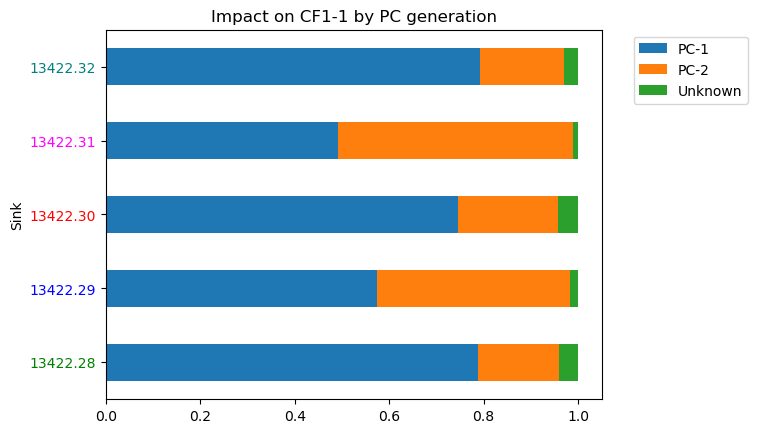

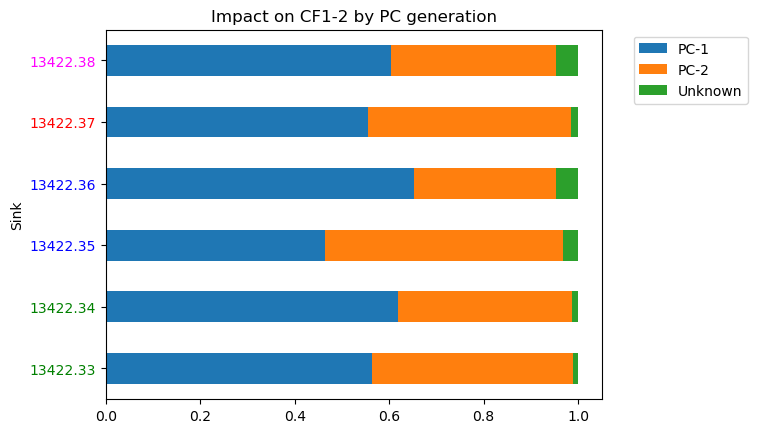

In [224]:
%matplotlib inline
for i,group in enumerate([PC_CF1_1_source_tracking, PC_CF1_2_source_tracking], 1):
    ax= group["results"].transpose().plot.barh(stacked=True)
    if i == 1:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F1-15"):
                tick.set_color('green')
            elif cage_ID in ("F1-16"):
                tick.set_color('blue')
            elif cage_ID in ("F1-17"):
                tick.set_color('red')
            elif cage_ID in ("F1-18"):
                tick.set_color('magenta')
            elif cage_ID in ("F1-19"):
                tick.set_color('teal')
            else:
                tick.set_color('black')
    else:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F1-20"):
                tick.set_color('green')
            elif cage_ID in ("F1-21"):
                tick.set_color('blue')
            elif cage_ID in ("F1-22"):
                tick.set_color('red')
            elif cage_ID in ("F1-23"):
                tick.set_color('magenta')
            else:
                tick.set_color('black')       
    plt.title(f'Impact on CF1-{i} by PC generation')
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2)
    plt.savefig(work_dir + "/gut_BALB_source_tracker_PC-F1%s.png" %i, transparent=False, bbox_inches='tight')

###### F2

In [225]:
for sink_group in ["CF2-1","CF2-2"]:
    meta[meta['genotype'].isin(["BALB/c"])]
    conditions = (
        (meta["cage_group"] == "PC-1") | (meta["cage_group"] == "PC-2"),
        meta["cage_group"] == sink_group
    )
    values = ["Source", "Sink"]
    column_name ="source_sink_PC-%s" % str(sink_group)
    meta[column_name] = np.select(conditions, values, "None")

In [226]:
PC_CF2_1_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_PC-CF2-1",
    dry=False,
    wait=True
    )
PC_CF2_2_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_PC-CF2-2",
    dry=False,
    wait=True
    )

Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
found matching working dir "/homes/arehm/TMP/ana_sourcetracker2_1pj5791x"
 Was removed.
Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_iw19oel2', cachefile is '.anacache/1c7c5de8f80876451661fbe4ba9253bb.sourcetracker2'. 
Waiting for slurm-cluster job 19279912 to complete: ........................ finished. Was removed.


In [227]:
meta[meta["cage_group"].isin(["CF2-2"])]["cage_id"]

sample_name
13422.117        F2-21
13422.117skin    F2-21
13422.118        F2-21
13422.118skin    F2-21
13422.119        F2-24
13422.119skin    F2-24
13422.120        F2-24
13422.120skin    F2-24
13422.121        F2-22
13422.121skin    F2-22
13422.122        F2-22
13422.122skin    F2-22
13422.123        F2-22
13422.123skin    F2-22
13422.124        F2-22
13422.124skin    F2-22
13422.125        F2-22
13422.125skin    F2-22
13422.126        F2-23
13422.126skin    F2-23
13422.127        F2-25
13422.127skin    F2-25
Name: cage_id, dtype: object

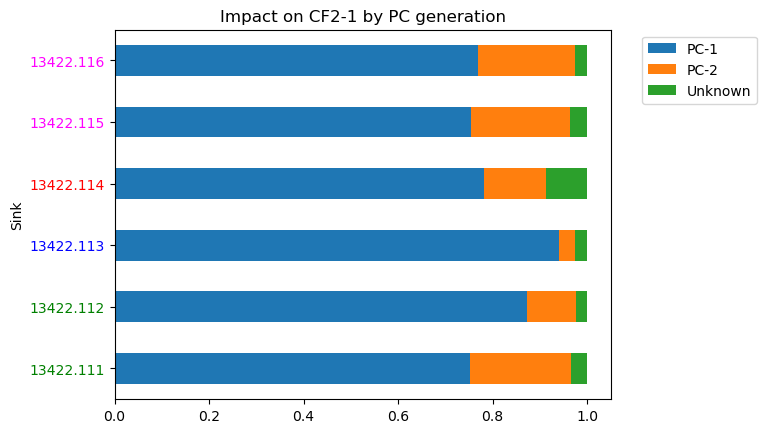

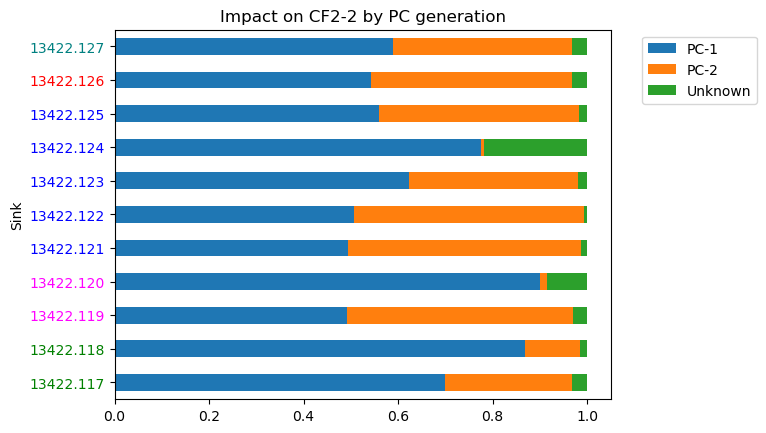

In [228]:
%matplotlib inline
for i,group in enumerate([PC_CF2_1_source_tracking, PC_CF2_2_source_tracking], 1):
    ax= group["results"].transpose().plot.barh(stacked=True)
    if i == 1:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F2-17"):
                tick.set_color('green')
            elif cage_ID in ("F2-18"):
                tick.set_color('blue')
            elif cage_ID in ("F2-19"):
                tick.set_color('red')
            elif cage_ID in ("F2-20"):
                tick.set_color('magenta')
            else:
                tick.set_color('black')
    else:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F2-21"):
                tick.set_color('green')
            elif cage_ID in ("F2-22"):
                tick.set_color('blue')
            elif cage_ID in ("F2-23"):
                tick.set_color('red')
            elif cage_ID in ("F2-24"):
                tick.set_color('magenta')
            elif cage_ID in ("F2-25"):
                tick.set_color('teal')
            else:
                tick.set_color('black')       
    plt.title(f'Impact on CF2-{i} by PC generation')
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2)
    plt.savefig(work_dir + "/gut_BALB_source_tracker_PC-F2%s.png" %i, transparent=False, bbox_inches='tight')

###### F3

In [229]:
for sink_group in ["CF3-1","CF3-2","CF3-3"]:
    meta[meta['genotype'].isin(["BALB/c"])]
    conditions = (
        (meta["cage_group"] == "PC-1") | (meta["cage_group"] == "PC-2"),
        meta["cage_group"] == sink_group
    )
    values = ["Source", "Sink"]
    column_name ="source_sink_PC-%s" % str(sink_group)
    meta[column_name] = np.select(conditions, values, "None")

In [230]:
PC_CF3_1_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_PC-CF3-1",
    dry=False,
    wait=True
    )
PC_CF3_2_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_PC-CF3-2",
    dry=False,
    wait=True
    )
PC_CF3_3_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_PC-CF3-3",
    dry=False,
    wait=True
    )

Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_a026wcqy', cachefile is '.anacache/45d45b7d02b8818d26ab5440090410e3.sourcetracker2'. 
Waiting for slurm-cluster job 19280012 to complete: ......................... finished. Was removed.
Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_xnm14n9v', cachefile is '.anacache/93385ad427e2abe9db7bee058a1dadb6.sourcetracker2'. 
Waiting for slurm-cluster job 19280013 to complete: ......................... finished. Was removed.
Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_f0maq4nn', cachefile is '.anacache/20de4213682661cc1aa6ac56795d110a.sourcetracker2'. 
Waiting for slurm-cluster job 19280016 to complete: ....................... finished. Was removed.


In [231]:
meta[meta["cage_group"].isin(["CF3-1"])]["cage_id"]

sample_name
13422.173        F3-21
13422.173skin    F3-21
13422.174        F3-21
13422.174skin    F3-21
13422.175        F3-22
13422.175skin    F3-22
Name: cage_id, dtype: object

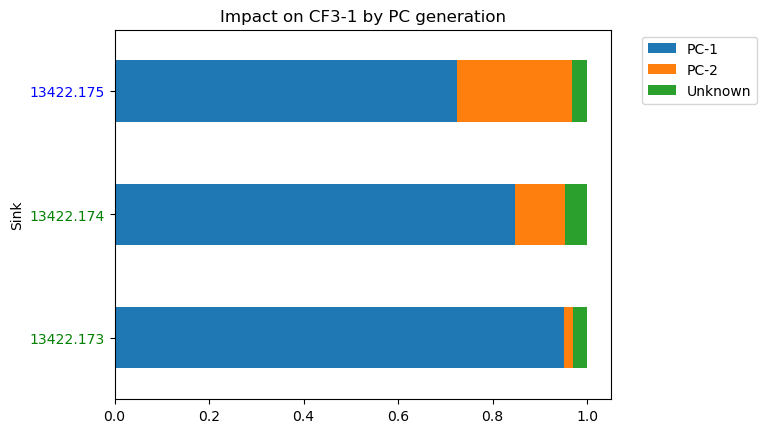

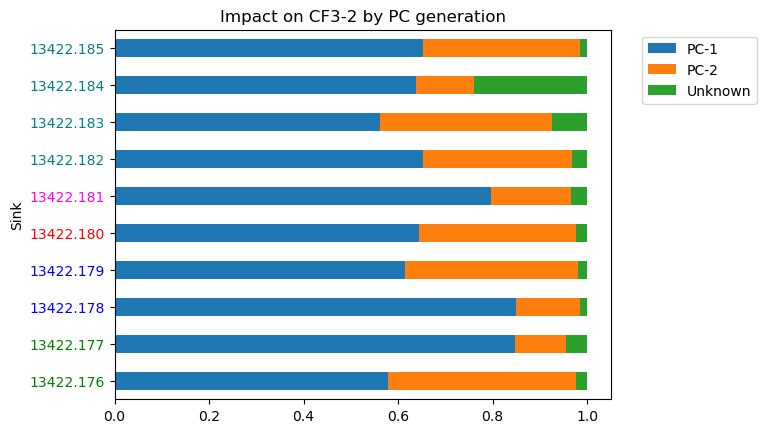

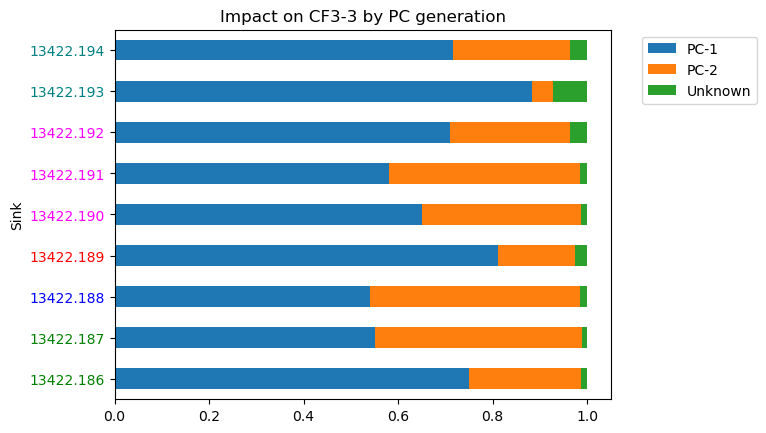

In [232]:
%matplotlib inline
for i,group in enumerate([PC_CF3_1_source_tracking, PC_CF3_2_source_tracking, PC_CF3_3_source_tracking], 1):
    ax= group["results"].transpose().plot.barh(stacked=True)
    if i == 1:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F3-21"):
                tick.set_color('green')
            elif cage_ID in ("F3-22"):
                tick.set_color('blue')
            else:
                tick.set_color('black')
    elif i==2:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F3-23"):
                tick.set_color('green')
            elif cage_ID in ("F3-24"):
                tick.set_color('blue')
            elif cage_ID in ("F3-25"):
                tick.set_color('red')
            elif cage_ID in ("F3-26"):
                tick.set_color('magenta')
            elif cage_ID in ("F3-27"):
                tick.set_color('teal')
            else:
                tick.set_color('black')
    else:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F3-28"):
                tick.set_color('green')
            elif cage_ID in ("F3-29"):
                tick.set_color('blue')
            elif cage_ID in ("F3-30"):
                tick.set_color('red')
            elif cage_ID in ("F3-31"):
                tick.set_color('magenta')
            elif cage_ID in ("F3-32"):
                tick.set_color('teal')
            else:
                tick.set_color('black')
    plt.title(f'Impact on CF3-{i} by PC generation')
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2)
    plt.savefig(work_dir + "/gut_BALB_source_tracker_PC-F3%s.png" %i, transparent=False, bbox_inches='tight')

###### F4

In [233]:
for sink_group in ["CF4-1","CF4-2","CF4-3"]:
    meta[meta['genotype'].isin(["BALB/c"])]
    conditions = (
        (meta["cage_group"] == "PC-1") | (meta["cage_group"] == "PC-2"),
        meta["cage_group"] == sink_group
    )
    values = ["Source", "Sink"]
    column_name ="source_sink_PC-%s" % str(sink_group)
    meta[column_name] = np.select(conditions, values, "None")

In [234]:
PC_CF4_1_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_PC-CF4-1",
    dry=False,
    wait=True
    )
PC_CF4_2_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_PC-CF4-2",
    dry=False,
    wait=True
    )
PC_CF4_3_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_PC-CF4-3",
    dry=False,
    wait=True
    )

Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_8oqztl1z', cachefile is '.anacache/733fac4bdb49ab35433c753634a6fe8d.sourcetracker2'. 
Waiting for slurm-cluster job 19280019 to complete: ...................... finished. Was removed.
Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_jffv8fyg', cachefile is '.anacache/6f7073ce99879cfc761e45b5b31087bb.sourcetracker2'. 
Waiting for slurm-cluster job 19280022 to complete: ...................... finished. Was removed.
Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_aahm08vf', cachefile is '.anacache/0d171c35d699c980700c00834a50ccc5.sourcetracker2'. 
Waiting for slurm-cluster job 19280025 to complete: ...................... finished. Was removed.


In [235]:
meta[meta["cage_group"].isin(["CF4-3"])]["cage_id"]

sample_name
13422.257        F4-28
13422.257skin    F4-28
13422.258        F4-29
13422.258skin    F4-29
13422.259        F4-29
13422.259skin    F4-29
13422.260        F4-30
13422.260skin    F4-30
13422.261        F4-31
13422.261skin    F4-31
Name: cage_id, dtype: object

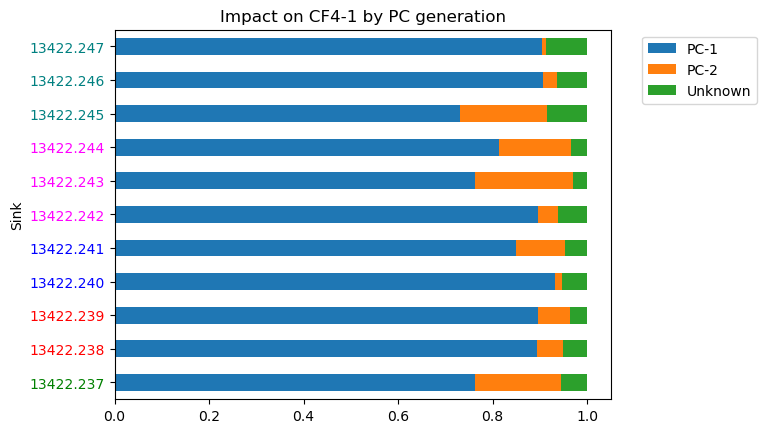

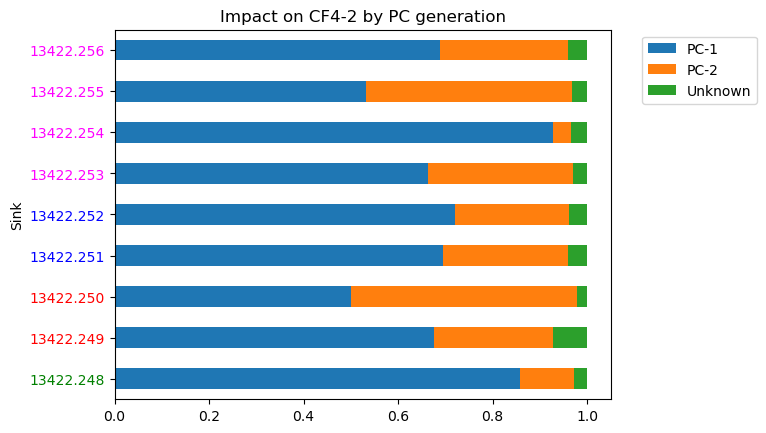

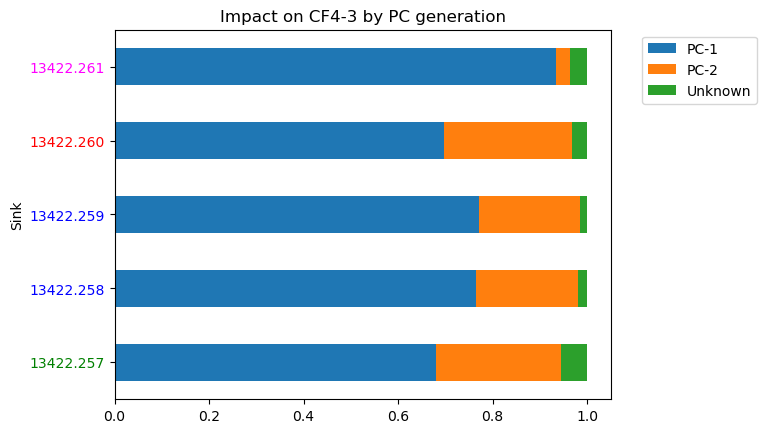

In [236]:
%matplotlib inline
for i,group in enumerate([PC_CF4_1_source_tracking, PC_CF4_2_source_tracking, PC_CF4_3_source_tracking], 1):
    ax= group["results"].transpose().plot.barh(stacked=True)
    if i == 1:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F4-19"):
                tick.set_color('green')
            elif cage_ID in ("F4-20"):
                tick.set_color('blue')
            elif cage_ID in ("F4-21"):
                tick.set_color('red')
            elif cage_ID in ("F4-22"):
                tick.set_color('magenta')
            elif cage_ID in ("F4-23"):
                tick.set_color('teal')
            else:
                tick.set_color('black')
    elif i==2:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F4-24"):
                tick.set_color('green')
            elif cage_ID in ("F4-25"):
                tick.set_color('blue')
            elif cage_ID in ("F4-26"):
                tick.set_color('red')
            elif cage_ID in ("F4-27"):
                tick.set_color('magenta')
            else:
                tick.set_color('black')
    else:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F4-28"):
                tick.set_color('green')
            elif cage_ID in ("F4-29"):
                tick.set_color('blue')
            elif cage_ID in ("F4-30"):
                tick.set_color('red')
            elif cage_ID in ("F4-31"):
                tick.set_color('magenta')
            else:
                tick.set_color('black')
    plt.title(f'Impact on CF4-{i} by PC generation')
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2)
    plt.savefig(work_dir + "/gut_BALB_source_tracker_PC-F4%s.png" %i, transparent=False, bbox_inches='tight')

###### F5

In [237]:
for sink_group in ["CF5-1","CF5-2","CF5-3"]:
    meta[meta['genotype'].isin(["BALB/c"])]
    conditions = (
        (meta["cage_group"] == "PC-1") | (meta["cage_group"] == "PC-2"),
        meta["cage_group"] == sink_group
    )
    values = ["Source", "Sink"]
    column_name ="source_sink_PC-%s" % str(sink_group)
    meta[column_name] = np.select(conditions, values, "None")

In [238]:
PC_CF5_1_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_PC-CF5-1",
    dry=False,
    wait=True
    )
PC_CF5_2_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_PC-CF5-2",
    dry=False,
    wait=True
    )
PC_CF5_3_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_PC-CF5-3",
    dry=False,
    wait=True
    )

Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_fkak1ekj', cachefile is '.anacache/adfb7b6baac8570aaa9970bf95c23633.sourcetracker2'. 
Waiting for slurm-cluster job 19280027 to complete: ...................... finished. Was removed.
Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_31cnhgzy', cachefile is '.anacache/75b50840c032d817ebd75a09aabe6fc3.sourcetracker2'. 
Waiting for slurm-cluster job 19280030 to complete: ....................... finished. Was removed.
Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_xzppjfad', cachefile is '.anacache/21eb842bd551f1c531e7290f13b95d9c.sourcetracker2'. 
Waiting for slurm-cluster job 19280033 to complete: ........................ finished. Was removed.


In [239]:
meta[meta["cage_group"].isin(["CF5-3"])]["cage_id"]

sample_name
13422.297        F5-15
13422.297skin    F5-15
13422.298        F5-15
13422.298skin    F5-15
13422.299        F5-15
13422.299skin    F5-15
13422.300        F5-15
13422.300skin    F5-15
13422.301        F5-16
13422.301skin    F5-16
13422.302        F5-16
13422.302skin    F5-16
13422.303        F5-17
13422.303skin    F5-17
13422.304        F5-17
13422.304skin    F5-17
13422.305        F5-18
13422.305skin    F5-18
13422.306        F5-18
13422.306skin    F5-18
13422.307        F5-18
13422.307skin    F5-18
13422.308        F5-19
13422.308skin    F5-19
13422.309        F5-19
13422.309skin    F5-19
13422.310        F5-19
13422.310skin    F5-19
Name: cage_id, dtype: object

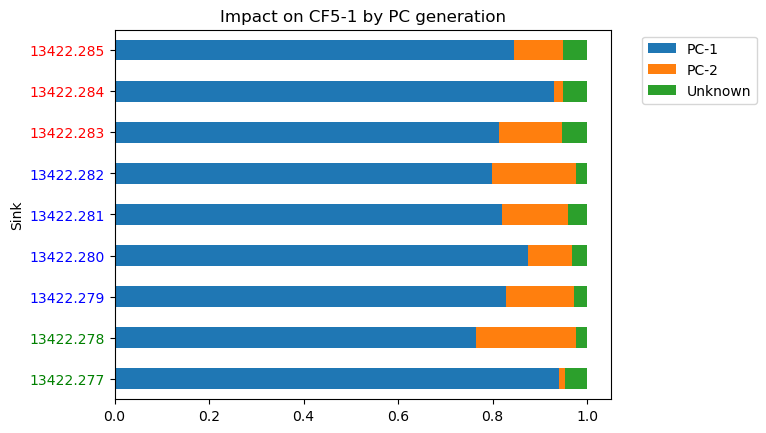

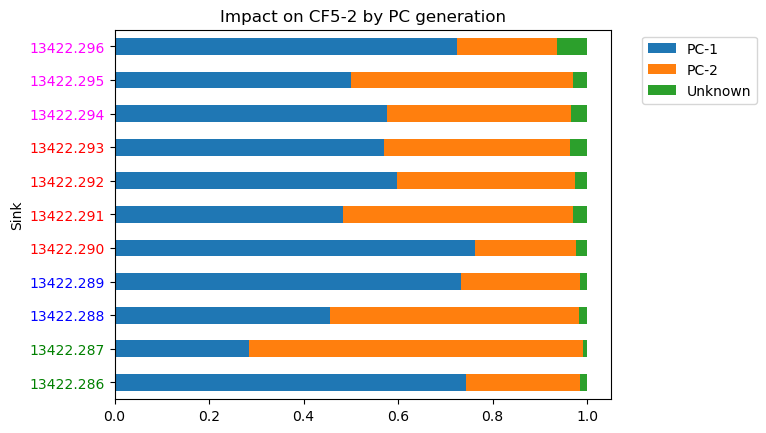

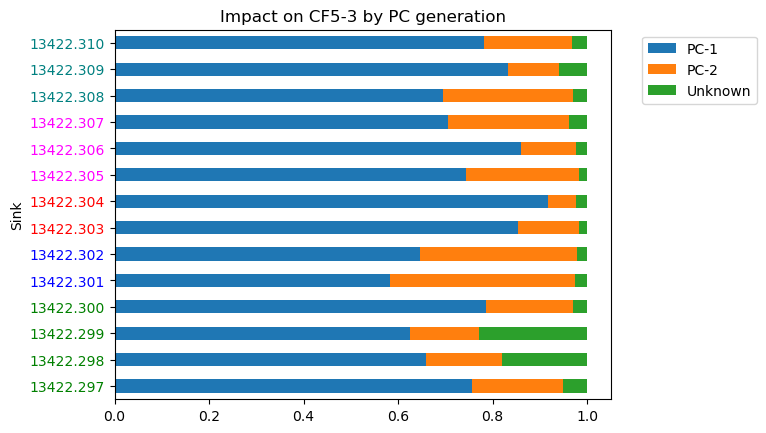

In [240]:
%matplotlib inline
for i,group in enumerate([PC_CF5_1_source_tracking, PC_CF5_2_source_tracking, PC_CF5_3_source_tracking], 1):
    ax= group["results"].transpose().plot.barh(stacked=True)
    if i == 1:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F5-8"):
                tick.set_color('green')
            elif cage_ID in ("F5-9"):
                tick.set_color('blue')
            elif cage_ID in ("F5-10"):
                tick.set_color('red')
            else:
                tick.set_color('black')
    elif i==2:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F5-11"):
                tick.set_color('green')
            elif cage_ID in ("F5-12"):
                tick.set_color('blue')
            elif cage_ID in ("F5-13"):
                tick.set_color('red')
            elif cage_ID in ("F5-14"):
                tick.set_color('magenta')
            else:
                tick.set_color('black')
    else:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F5-15"):
                tick.set_color('green')
            elif cage_ID in ("F5-16"):
                tick.set_color('blue')
            elif cage_ID in ("F5-17"):
                tick.set_color('red')
            elif cage_ID in ("F5-18"):
                tick.set_color('magenta')
            elif cage_ID in ("F5-19"):
                tick.set_color('teal')
            else:
                tick.set_color('black')
    plt.title(f'Impact on CF5-{i} by PC generation')
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2)
    plt.savefig(work_dir + "/gut_BALB_source_tracker_PC-F5%s.png" %i, transparent=False, bbox_inches='tight')

#### C57BL6/J
##### Impact of BF1 cage groups on BF2 cage groups

In [261]:
for sink_group in ["BF2-1", "BF2-2", "BF2-3"]:
    meta[meta['genotype'].isin(["C57BL6/J"])]
    conditions = (
        (meta["cage_group"] == "BF1-1") | (meta["cage_group"] == "BF1-2") | (meta["cage_group"] == "BF1-3"),
        meta["cage_group"] == sink_group
    )
    values = ["Source", "Sink"]
    column_name ="source_sink_BF1-%s" % str(sink_group)
    meta[column_name] = np.select(conditions, values, "None")

In [262]:
BF1_2_1_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTaCle
    meta,
    col_envname="cage_group",
    col_type="source_sink_BF1-BF2-1",
    dry=False,
    wait=True
    )
BF1_2_2_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_BF1-BF2-2",
    dry=False,
    wait=True
    )
BF1_2_3_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_BF1-BF2-3",
    dry=False,
    wait=True
    )

Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_y1odm037', cachefile is '.anacache/520ad0a2611b0137a9cd0206dc58d6d2.sourcetracker2'. 
Waiting for slurm-cluster job 19280834 to complete: ........................... finished. Was removed.
Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_1ymrzxa2', cachefile is '.anacache/fcea72151705a29a6100b819bc89eb0d.sourcetracker2'. 
Waiting for slurm-cluster job 19280838 to complete: ............................ finished. Was removed.
Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_dibxkb63', cachefile is '.anacache/d5ba2c354a1809c452b15f1de717eb74.sourcetracker2'. 
Waiting for slurm-cluster job 19280857 to complete: ........................... finished. Was removed.


In [263]:
meta.groupby(["source_sink_BF1-BF2-1", "cage_group"]).size()

source_sink_BF1-BF2-1  cage_group
None                   BF2-2          22
                       BF2-3          22
                       BF3-1          34
                       BF3-2          32
                       BF3-3          24
                       BF4-1          30
                       BF4-2          28
                       BF4-3          26
                       BF5-1          18
                       BF5-2          12
                       CF1-1          10
                       CF1-2          12
                       CF2-1          12
                       CF2-2          22
                       CF3-1           6
                       CF3-2          20
                       CF3-3          18
                       CF4-1          22
                       CF4-2          18
                       CF4-3          10
                       CF5-1          18
                       CF5-2          22
                       CF5-3          28
                       

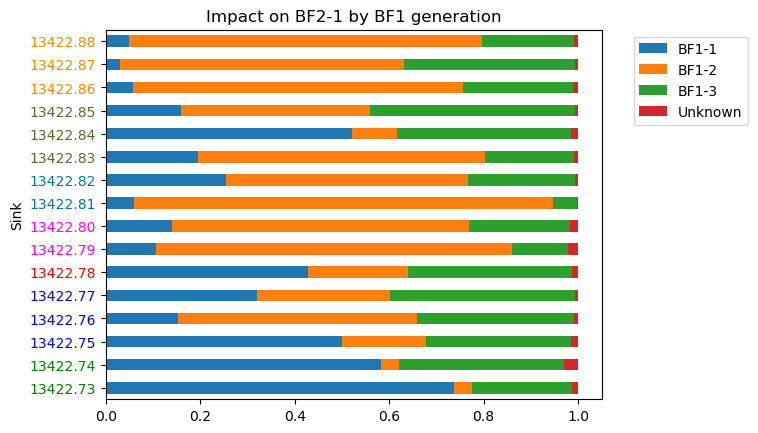

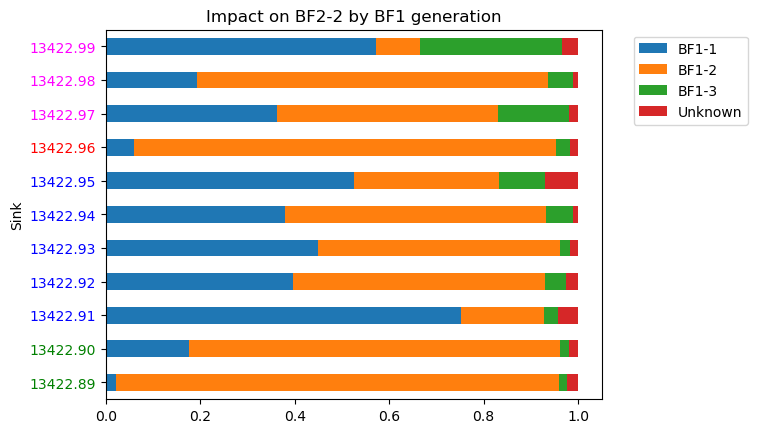

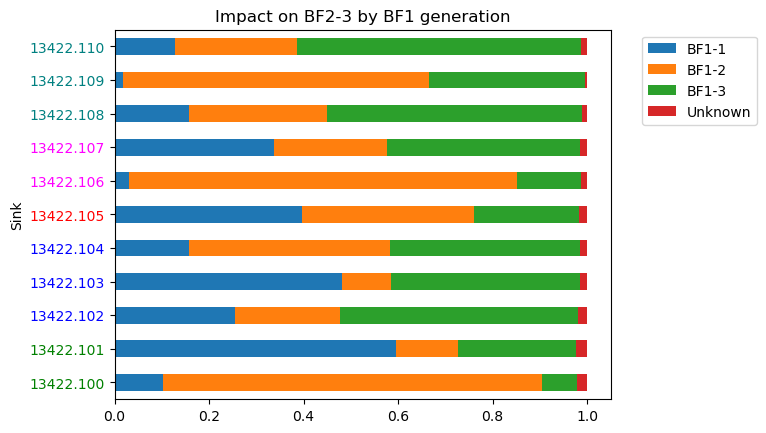

In [264]:
for i,group in enumerate([BF1_2_1_source_tracking, BF1_2_2_source_tracking, BF1_2_3_source_tracking], 1):
    ax= group["results"].transpose().plot.barh(stacked=True)
    if i == 1:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F2-1"):
                tick.set_color('green')
            elif cage_ID in ("F2-2"):
                tick.set_color('blue')
            elif cage_ID in ("F2-3"):
                tick.set_color('red')
            elif cage_ID in ("F2-4"):
                tick.set_color('magenta')
            elif cage_ID in ("F2-5"):
                tick.set_color('teal')
            elif cage_ID in ("F2-6"):
                tick.set_color('darkolivegreen')
            elif cage_ID in ("F2-7"):
                tick.set_color('darkorange')
            else:
                tick.set_color('black')
    elif i==2:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F2-8"):
                tick.set_color('green')
            elif cage_ID in ("F2-9"):
                tick.set_color('blue')
            elif cage_ID in ("F2-10"):
                tick.set_color('red')
            elif cage_ID in ("F2-11"):
                tick.set_color('magenta')
            else:
                tick.set_color('black')       
    else:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F2-12"):
                tick.set_color('green')
            elif cage_ID in ("F2-13"):
                tick.set_color('blue')
            elif cage_ID in ("F2-14"):
                tick.set_color('red')
            elif cage_ID in ("F2-15"):
                tick.set_color('magenta')
            elif cage_ID in ("F2-16"):
                tick.set_color('teal')
            else:
                tick.set_color('black')
    plt.title(f'Impact on BF2-{i} by BF1 generation')
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2)

##### Impact of BF2 cage groups on BF3 cage groups

In [265]:
for sink_group in ["BF3-1", "BF3-2", "BF3-3"]:
    meta[meta['genotype'].isin(["C57BL6/J"])]
    conditions = (
        (meta["cage_group"] == "BF2-1") | (meta["cage_group"] == "BF2-2") | (meta["cage_group"] == "BF2-3"),
        meta["cage_group"] == sink_group
    )
    values = ["Source", "Sink"]
    column_name ="source_sink_BF2-" + str(sink_group)
    meta[column_name] = np.select(conditions, values, "None")

In [266]:
BF2_3_1_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_BF2-BF3-1",
    dry=False,
    wait=True
)

BF2_3_2_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_BF2-BF3-2",
    dry=False,
    wait=True
)

BF2_3_3_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_BF2-BF3-3",
    dry=False,
    wait=True
)

Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_6flhlrlh', cachefile is '.anacache/9d5e44bfe10ed9a168f9d2e9a727b8dc.sourcetracker2'. 
Waiting for slurm-cluster job 19280860 to complete: .............................. finished. Was removed.
Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_pudeglp0', cachefile is '.anacache/8fd142a71f7696792a25e17967505e5a.sourcetracker2'. 
Waiting for slurm-cluster job 19280881 to complete: ............................ finished. Was removed.
Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_6uaoj_za', cachefile is '.anacache/167e7745695115d3f8fb90db4029fd68.sourcetracker2'. 
Waiting for slurm-cluster job 19280885 to complete: ........................ finished. Was removed.


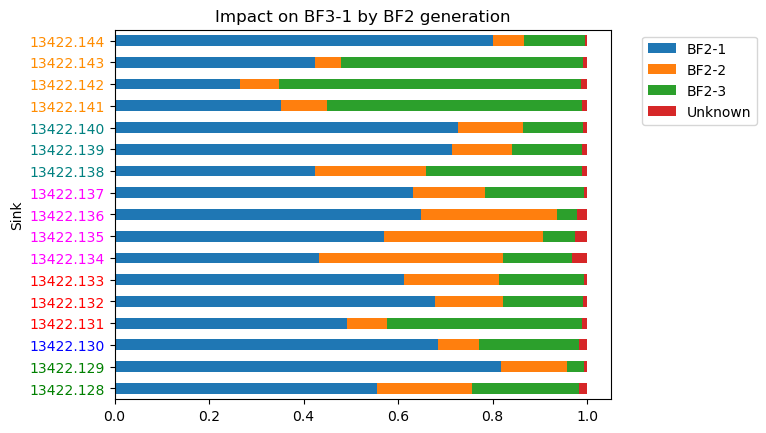

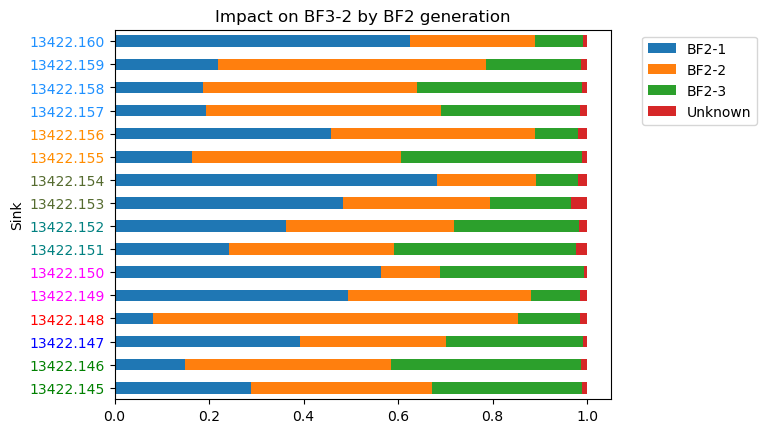

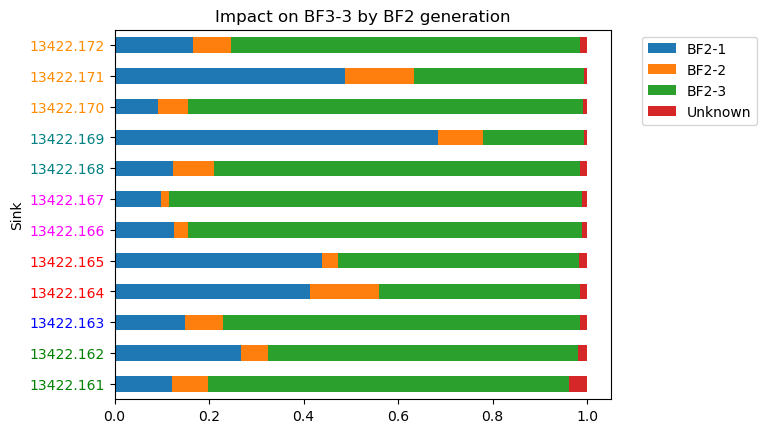

In [267]:
for i,group in enumerate([BF2_3_1_source_tracking, BF2_3_2_source_tracking, BF2_3_3_source_tracking], 1):
    ax= group["results"].transpose().plot.barh(stacked=True)
    if i == 1:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F3-1"):
                tick.set_color('green')
            elif cage_ID in ("F3-2"):
                tick.set_color('blue')
            elif cage_ID in ("F3-3"):
                tick.set_color('red')
            elif cage_ID in ("F3-4"):
                tick.set_color('magenta')
            elif cage_ID in ("F3-5"):
                tick.set_color('teal')
            elif cage_ID in ("F3-6"):
                tick.set_color('darkorange')
            else:
                tick.set_color('black')
    elif i==2:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F3-7"):
                tick.set_color('green')
            elif cage_ID in ("F3-8"):
                tick.set_color('blue')
            elif cage_ID in ("F3-9"):
                tick.set_color('red')
            elif cage_ID in ("F3-10"):
                tick.set_color('magenta')
            elif cage_ID in ("F3-11"):
                tick.set_color('teal')
            elif cage_ID in ("F3-12"):
                tick.set_color('darkolivegreen')
            elif cage_ID in ("F3-13"):
                tick.set_color('darkorange')
            elif cage_ID in ("F3-14"):
                tick.set_color('dodgerblue')
            else:
                tick.set_color('black')       
    else:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F3-15"):
                tick.set_color('green')
            elif cage_ID in ("F3-16"):
                tick.set_color('blue')
            elif cage_ID in ("F3-17"):
                tick.set_color('red')
            elif cage_ID in ("F3-18"):
                tick.set_color('magenta')
            elif cage_ID in ("F3-19"):
                tick.set_color('teal')
            elif cage_ID in ("F3-20"):
                tick.set_color('darkorange')
            else:
                tick.set_color('black')
    plt.title(f'Impact on BF3-{i} by BF2 generation')
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2)

##### Impact of BF3 cage groups on BF4 cage groups

In [268]:
for sink_group in ["BF4-1", "BF4-2", "BF4-3"]:
    meta[meta['genotype'].isin(["C57BL6/J"])]
    conditions = (
        (meta["cage_group"] == "BF3-1") | (meta["cage_group"] == "BF3-2") | (meta["cage_group"] == "BF3-3"),
        meta["cage_group"] == sink_group
    )
    values = ["Source", "Sink"]
    column_name ="source_sink_BF3-" + str(sink_group)
    meta[column_name] = np.select(conditions, values, "None")

In [269]:
BF3_4_1_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_BF3-BF4-1",
    dry=False,
    wait=True
)

BF3_4_2_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_BF3-BF4-2",
    dry=False,
    wait=True
)

BF3_4_3_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_BF3-BF4-3",
    dry=False,
    wait=True
)

Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_fj4gzrms', cachefile is '.anacache/eb8be4f62c1e2b28728b136450091ce0.sourcetracker2'. 
Waiting for slurm-cluster job 19281110 to complete: ........................... finished. Was removed.
Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_upk4zq7h', cachefile is '.anacache/76227f9baa9547e08045498b705be3d1.sourcetracker2'. 
Waiting for slurm-cluster job 19281132 to complete: ......................... finished. Was removed.
Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_qg0zz279', cachefile is '.anacache/f41cf71d40823b4852a949919bffe58d.sourcetracker2'. 
Waiting for slurm-cluster job 19281136 to complete: ....................... finished. Was removed.


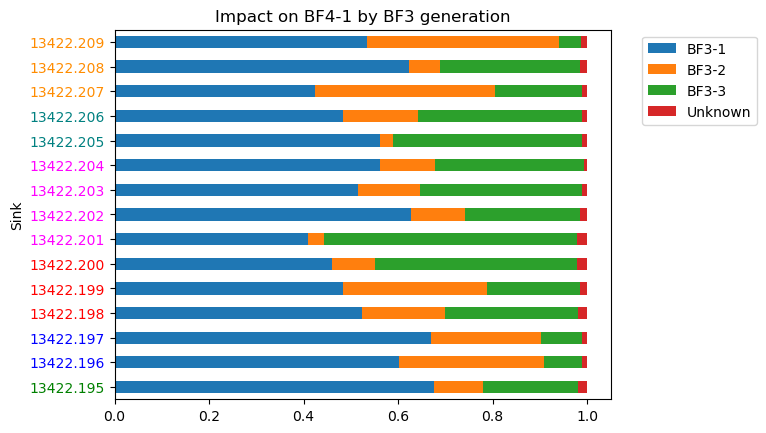

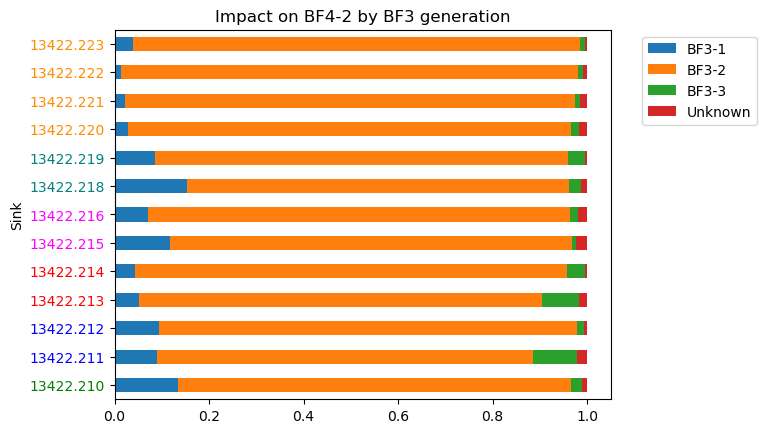

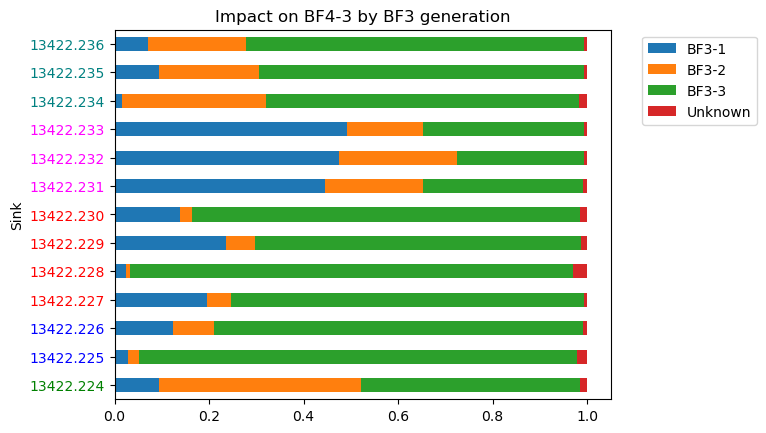

In [270]:
for i,group in enumerate([BF3_4_1_source_tracking, BF3_4_2_source_tracking, BF3_4_3_source_tracking], 1):
    ax= group["results"].transpose().plot.barh(stacked=True)
    if i == 1:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F4-1"):
                tick.set_color('green')
            elif cage_ID in ("F4-2"):
                tick.set_color('blue')
            elif cage_ID in ("F4-3"):
                tick.set_color('red')
            elif cage_ID in ("F4-4"):
                tick.set_color('magenta')
            elif cage_ID in ("F4-5"):
                tick.set_color('teal')
            elif cage_ID in ("F4-6"):
                tick.set_color('darkorange')
            else:
                tick.set_color('black')
    elif i==2:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F4-8"):
                tick.set_color('green')
            elif cage_ID in ("F4-9"):
                tick.set_color('blue')
            elif cage_ID in ("F4-10"):
                tick.set_color('red')
            elif cage_ID in ("F4-11"):
                tick.set_color('magenta')
            elif cage_ID in ("F4-12"):
                tick.set_color('teal')
            elif cage_ID in ("F4-13"):
                tick.set_color('darkorange')
            else:
                tick.set_color('black')       
    else:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F4-14"):
                tick.set_color('green')
            elif cage_ID in ("F4-15"):
                tick.set_color('blue')
            elif cage_ID in ("F4-16"):
                tick.set_color('red')
            elif cage_ID in ("F4-17"):
                tick.set_color('magenta')
            elif cage_ID in ("F4-18"):
                tick.set_color('teal')
            else:
                tick.set_color('black')
    plt.title(f'Impact on BF4-{i} by BF3 generation')
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2)

##### Impact of BF4 cage groups on BF5 cage groups

In [271]:
for sink_group in ["BF5-1", "BF5-2"]:
    meta[meta['genotype'].isin(["C57BL6/J"])]
    conditions = (
        (meta["cage_group"] == "BF4-1") | (meta["cage_group"] == "BF4-2") | (meta["cage_group"] == "BF4-3"),
        meta["cage_group"] == sink_group
    )
    values = ["Source", "Sink"]
    column_name ="source_sink_BF4-" + str(sink_group)
    meta[column_name] = np.select(conditions, values, "None")

In [272]:
BF4_5_1_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_BF4-BF5-1",
    dry=False,
    wait=True
)

BF4_5_2_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_BF4-BF5-2",
    dry=False,
    wait=True
)

Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_l0bpuphh', cachefile is '.anacache/2379f9484b71952bb19b41a3425ac809.sourcetracker2'. 
Waiting for slurm-cluster job 19281140 to complete: ........................ finished. Was removed.
Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_gqioaqjx', cachefile is '.anacache/6dd87dc6f49335722f0bef95ce8dcb7f.sourcetracker2'. 
Waiting for slurm-cluster job 19281147 to complete: ...................... finished. Was removed.


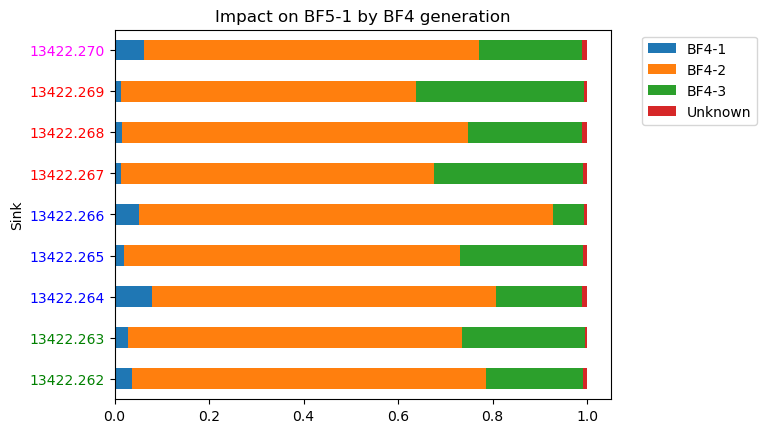

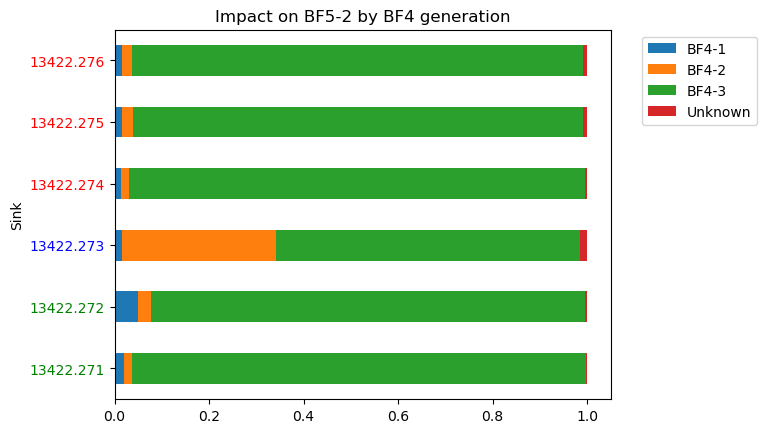

In [273]:
for i,group in enumerate([BF4_5_1_source_tracking, BF4_5_2_source_tracking], 1):
    ax= group["results"].transpose().plot.barh(stacked=True)
    if i == 1:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F5-1"):
                tick.set_color('green')
            elif cage_ID in ("F5-2"):
                tick.set_color('blue')
            elif cage_ID in ("F5-3"):
                tick.set_color('red')
            elif cage_ID in ("F5-4"):
                tick.set_color('magenta')
            else:
                tick.set_color('black')  
    else:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F5-5"):
                tick.set_color('green')
            elif cage_ID in ("F5-6"):
                tick.set_color('blue')
            elif cage_ID in ("F5-7"):
                tick.set_color('red')
            else:
                tick.set_color('black')
    plt.title(f'Impact on BF5-{i} by BF4 generation')
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2)

##### Impact of P1 on F generations

###### F1

In [ ]:
meta["cage_group"].values()

In [241]:
for sink_group in ["BF1-1","BF1-2","BF1-3"]:
    meta[meta['genotype'].isin(["C57BL6/J"])]
    conditions = (
        (meta["cage_group"] == "PB-1") | (meta["cage_group"] == "PB-2") | (meta["cage_group"] == "PB-3"),
        meta["cage_group"] == sink_group
    )
    values = ["Source", "Sink"]
    column_name ="source_sink_PB-%s" % str(sink_group)
    meta[column_name] = np.select(conditions, values, "None")

In [242]:
PB_BF1_1_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTaCle
    meta,
    col_envname="cage_group",
    col_type="source_sink_PB-BF1-1",
    dry=False,
    wait=True
    )
PB_BF1_2_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_PB-BF1-2",
    dry=False,
    wait=True
    )
PB_BF1_3_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_PB-BF1-3",
    dry=False,
    wait=True
    )

Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_fsyo06zu', cachefile is '.anacache/ab5f32b18c8f9b30bbf8ed910a64f1a4.sourcetracker2'. 
Waiting for slurm-cluster job 19280037 to complete: ...................... finished. Was removed.
Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_y0i9tf1n', cachefile is '.anacache/7612d91e833ea23de15878272a4f3102.sourcetracker2'. 
Waiting for slurm-cluster job 19280040 to complete: ....................... finished. Was removed.
Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_pkra40un', cachefile is '.anacache/00df76779d59a5f8d7c7e99f3bf79b52.sourcetracker2'. 
Waiting for slurm-cluster job 19280044 to complete: ...................... finished. Was removed.


In [243]:
meta[meta["cage_group"].isin(["BF1-3"])]["cage_id"]

sample_name
13422.65        F1-11
13422.65skin    F1-11
13422.66        F1-11
13422.66skin    F1-11
13422.67        F1-12
13422.67skin    F1-12
13422.68        F1-12
13422.68skin    F1-12
13422.69        F1-12
13422.69skin    F1-12
13422.70        F1-13
13422.70skin    F1-13
13422.71        F1-14
13422.71skin    F1-14
13422.72        F1-14
13422.72skin    F1-14
Name: cage_id, dtype: object

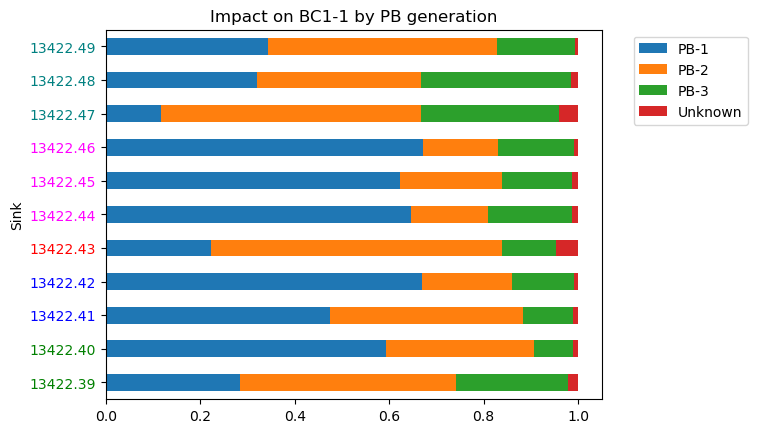

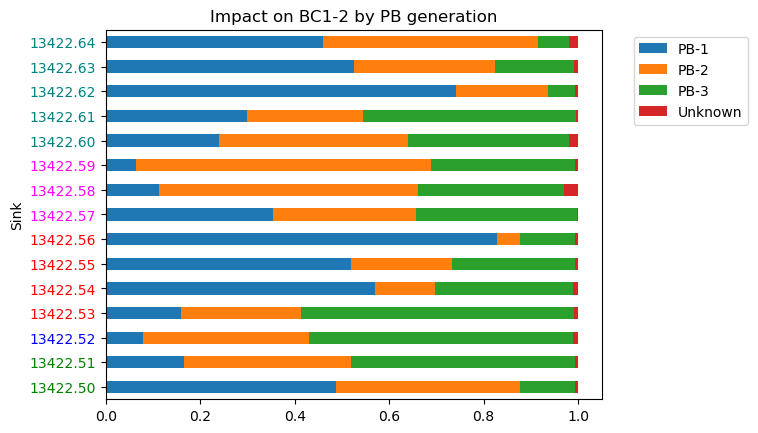

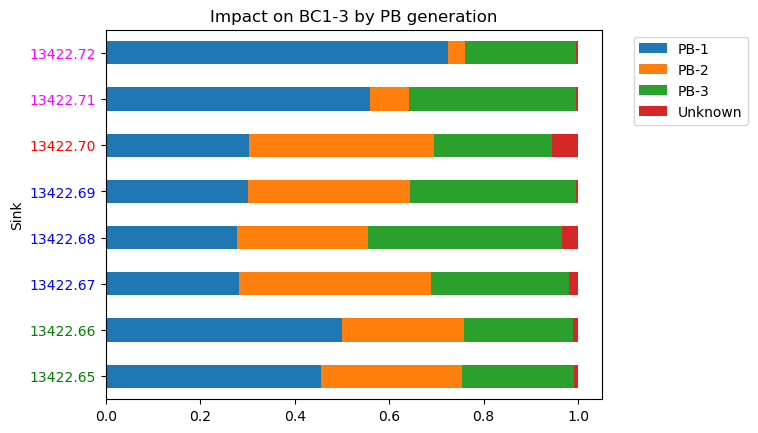

In [244]:
%matplotlib inline
for i,group in enumerate([PB_BF1_1_source_tracking, PB_BF1_2_source_tracking, PB_BF1_3_source_tracking], 1):
    ax= group["results"].transpose().plot.barh(stacked=True)
    if i == 1:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F1-1"):
                tick.set_color('green')
            elif cage_ID in ("F1-2"):
                tick.set_color('blue')
            elif cage_ID in ("F1-3"):
                tick.set_color('red')
            elif cage_ID in ("F1-4"):
                tick.set_color('magenta')
            elif cage_ID in ("F1-5"):
                tick.set_color('teal')
            else:
                tick.set_color('black')
    elif i==2:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F1-6"):
                tick.set_color('green')
            elif cage_ID in ("F1-7"):
                tick.set_color('blue')
            elif cage_ID in ("F1-8"):
                tick.set_color('red')
            elif cage_ID in ("F1-9"):
                tick.set_color('magenta')
            elif cage_ID in ("F1-10"):
                tick.set_color('teal')
            else:
                tick.set_color('black')      
    else:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F1-11"):
                tick.set_color('green')
            elif cage_ID in ("F1-12"):
                tick.set_color('blue')
            elif cage_ID in ("F1-13"):
                tick.set_color('red')
            elif cage_ID in ("F1-14"):
                tick.set_color('magenta')
            else:
                tick.set_color('black') 
    plt.title(f'Impact on BC1-{i} by PB generation')
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2)
    plt.savefig(work_dir + "/gut_C57B_source_tracker_PB-F1%s.png" %i, transparent=False, bbox_inches='tight')

###### F2

In [245]:
for sink_group in ["BF2-1","BF2-2", "BF2-3"]:
    meta[meta['genotype'].isin(["C57BL6/J"])]
    conditions = (
        (meta["cage_group"] == "PB-1") | (meta["cage_group"] == "PB-2") | (meta["cage_group"] == "PB-3"),
        meta["cage_group"] == sink_group
    )
    values = ["Source", "Sink"]
    column_name ="source_sink_PB-%s" % str(sink_group)
    meta[column_name] = np.select(conditions, values, "None")

In [246]:
PB_BF2_1_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_PB-BF2-1",
    dry=False,
    wait=True
    )
PB_BF2_2_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_PB-BF2-2",
    dry=False,
    wait=True
    )
PB_BF2_3_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_PB-BF2-3",
    dry=False,
    wait=True
    )

Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_2p2ditq0', cachefile is '.anacache/ffe2c2fcba140cfd68061b7d3769879a.sourcetracker2'. 
Waiting for slurm-cluster job 19280046 to complete: ....................... finished. Was removed.
Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_gxn0cz05', cachefile is '.anacache/522fb94f38724a885c609d26e8ea86b7.sourcetracker2'. 
Waiting for slurm-cluster job 19280050 to complete: ......................... finished. Was removed.
Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_cju6e1z5', cachefile is '.anacache/8059a5bdc83809b0eee208b051ea4a52.sourcetracker2'. 
Waiting for slurm-cluster job 19280150 to complete: ......................... finished. Was removed.


In [247]:
meta[meta["cage_group"].isin(["BF2-3"])]["cage_id"]

sample_name
13422.100        F2-12
13422.100skin    F2-12
13422.101        F2-12
13422.101skin    F2-12
13422.102        F2-13
13422.102skin    F2-13
13422.103        F2-13
13422.103skin    F2-13
13422.104        F2-13
13422.104skin    F2-13
13422.105        F2-14
13422.105skin    F2-14
13422.106        F2-15
13422.106skin    F2-15
13422.107        F2-15
13422.107skin    F2-15
13422.108        F2-16
13422.108skin    F2-16
13422.109        F2-16
13422.109skin    F2-16
13422.110        F2-16
13422.110skin    F2-16
Name: cage_id, dtype: object

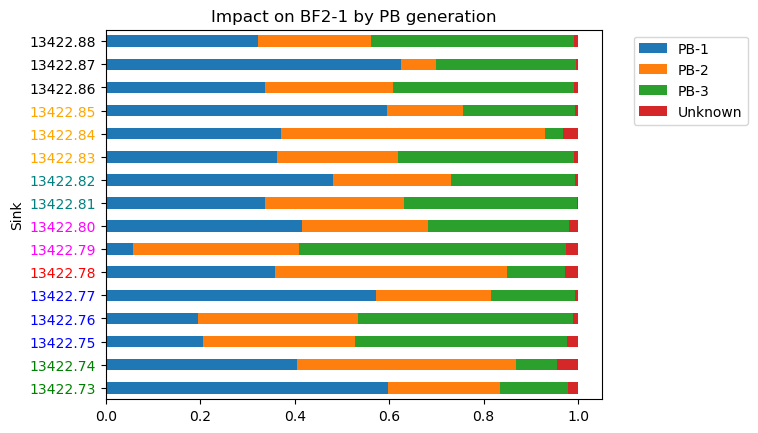

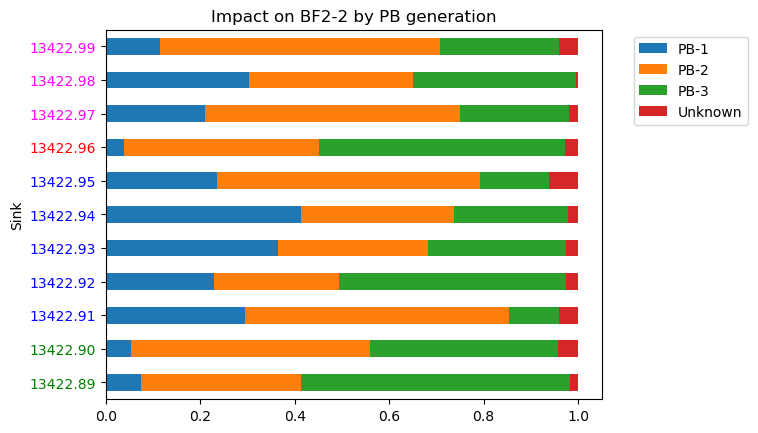

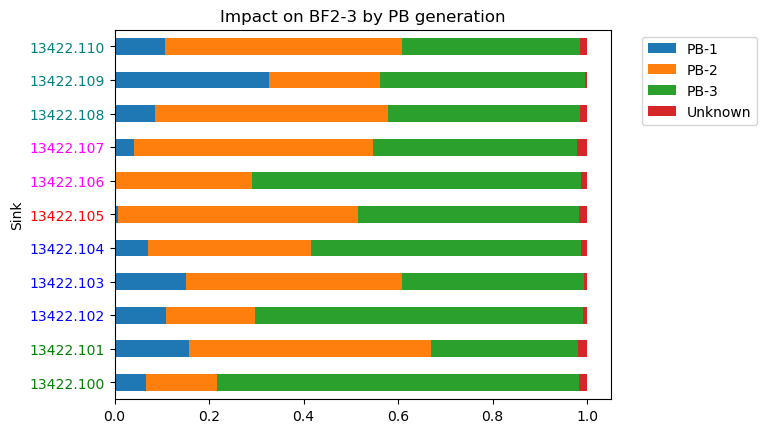

In [248]:
%matplotlib inline
for i,group in enumerate([PB_BF2_1_source_tracking, PB_BF2_2_source_tracking, PB_BF2_3_source_tracking], 1):
    ax= group["results"].transpose().plot.barh(stacked=True)
    if i == 1:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F2-1"):
                tick.set_color('green')
            elif cage_ID in ("F2-2"):
                tick.set_color('blue')
            elif cage_ID in ("F2-3"):
                tick.set_color('red')
            elif cage_ID in ("F2-4"):
                tick.set_color('magenta')
            elif cage_ID in ("F2-5"):
                tick.set_color('teal')
            elif cage_ID in ("F2-6"):
                tick.set_color('orange')
            else:
                tick.set_color('black')
    elif i==2:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F2-8"):
                tick.set_color('green')
            elif cage_ID in ("F2-9"):
                tick.set_color('blue')
            elif cage_ID in ("F2-10"):
                tick.set_color('red')
            elif cage_ID in ("F2-11"):
                tick.set_color('magenta')
            else:
                tick.set_color('black') 
    else:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F2-12"):
                tick.set_color('green')
            elif cage_ID in ("F2-13"):
                tick.set_color('blue')
            elif cage_ID in ("F2-14"):
                tick.set_color('red')
            elif cage_ID in ("F2-15"):
                tick.set_color('magenta')
            elif cage_ID in ("F2-16"):
                tick.set_color('teal')
            else:
                tick.set_color('black')  
    plt.title(f'Impact on BF2-{i} by PB generation')
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2)
    plt.savefig(work_dir + "/gut_C57B_source_tracker_PB-F2%s.png" %i, transparent=False, bbox_inches='tight')

###### F3

In [249]:
for sink_group in ["BF3-1","BF3-2","BF3-3"]:
    meta[meta['genotype'].isin(["C57BL6/J"])]
    conditions = (
        (meta["cage_group"] == "PB-1") | (meta["cage_group"] == "PB-2") | (meta["cage_group"] == "PB-3"),
        meta["cage_group"] == sink_group
    )
    values = ["Source", "Sink"]
    column_name ="source_sink_PB-%s" % str(sink_group)
    meta[column_name] = np.select(conditions, values, "None")

In [250]:
PB_BF3_1_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_PB-BF3-1",
    dry=False,
    wait=True
    )
PB_BF3_2_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_PB-BF3-2",
    dry=False,
    wait=True
    )
PB_BF3_3_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_PB-BF3-3",
    dry=False,
    wait=True
    )

Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_l52dbgta', cachefile is '.anacache/90c64f1478ed69635788a3a2e022c0cc.sourcetracker2'. 
Waiting for slurm-cluster job 19280153 to complete: ...................... finished. Was removed.
Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_xu88vcek', cachefile is '.anacache/5b967507707bf1387c923694df457d1d.sourcetracker2'. 
Waiting for slurm-cluster job 19280158 to complete: ....................... finished. Was removed.
Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_1iv_7u9r', cachefile is '.anacache/ecbf7679d15f2250fd94867bc5f73a6f.sourcetracker2'. 
Waiting for slurm-cluster job 19280162 to complete: ....................... finished. Was removed.


In [251]:
meta[meta["cage_group"].isin(["BF3-3"])]["cage_id"]

sample_name
13422.161        F3-15
13422.161skin    F3-15
13422.162        F3-15
13422.162skin    F3-15
13422.163        F3-16
13422.163skin    F3-16
13422.164        F3-17
13422.164skin    F3-17
13422.165        F3-17
13422.165skin    F3-17
13422.166        F3-18
13422.166skin    F3-18
13422.167        F3-18
13422.167skin    F3-18
13422.168        F3-19
13422.168skin    F3-19
13422.169        F3-19
13422.169skin    F3-19
13422.170        F3-20
13422.170skin    F3-20
13422.171        F3-20
13422.171skin    F3-20
13422.172        F3-20
13422.172skin    F3-20
Name: cage_id, dtype: object

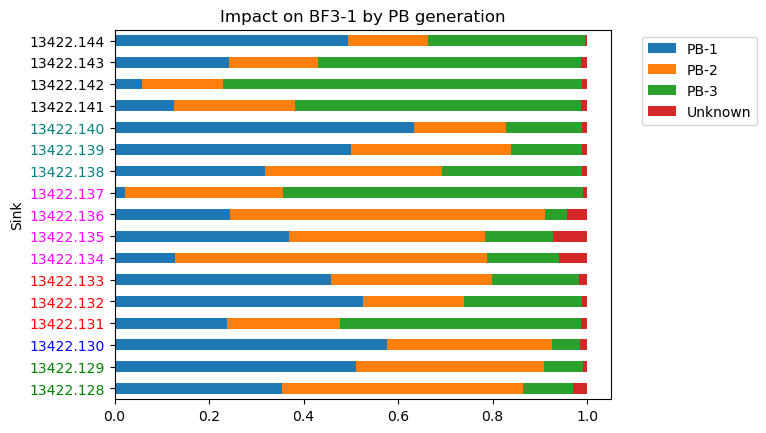

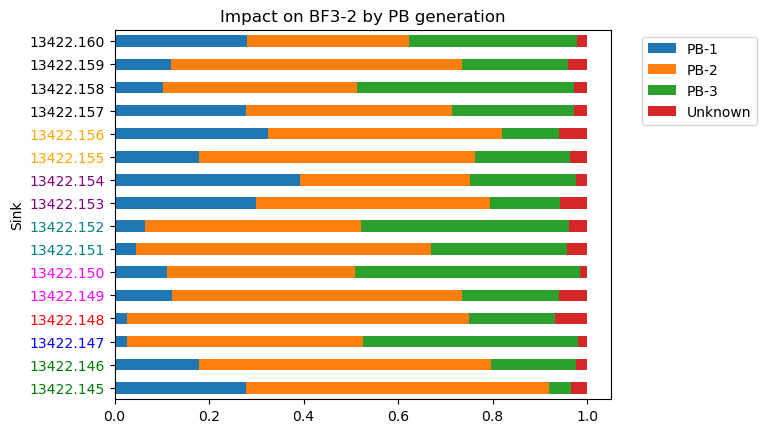

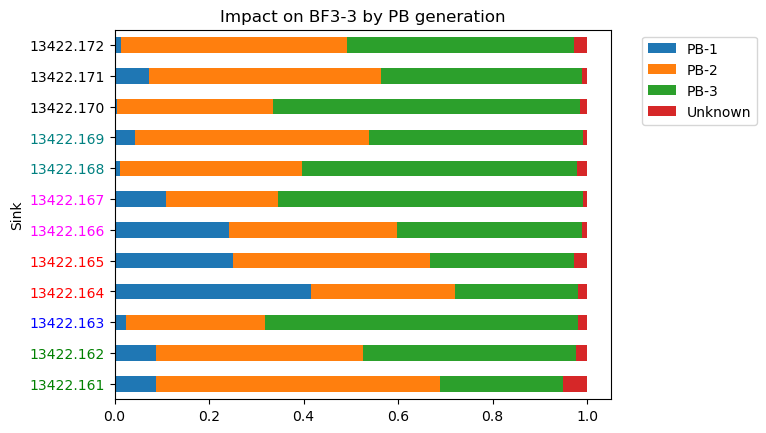

In [252]:
%matplotlib inline
for i,group in enumerate([PB_BF3_1_source_tracking, PB_BF3_2_source_tracking, PB_BF3_3_source_tracking], 1):
    ax= group["results"].transpose().plot.barh(stacked=True)
    if i == 1:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F3-1"):
                tick.set_color('green')
            elif cage_ID in ("F3-2"):
                tick.set_color('blue')
            elif cage_ID in ("F3-3"):
                tick.set_color('red')
            elif cage_ID in ("F3-4"):
                tick.set_color('magenta')
            elif cage_ID in ("F3-5"):
                tick.set_color('teal')
            else:
                tick.set_color('black')
    elif i==2:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F3-7"):
                tick.set_color('green')
            elif cage_ID in ("F3-8"):
                tick.set_color('blue')
            elif cage_ID in ("F3-9"):
                tick.set_color('red')
            elif cage_ID in ("F3-10"):
                tick.set_color('magenta')
            elif cage_ID in ("F3-11"):
                tick.set_color('teal')
            elif cage_ID in ("F3-12"):
                tick.set_color('purple')
            elif cage_ID in ("F3-13"):
                tick.set_color('orange')
            else:
                tick.set_color('black')
    else:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F3-15"):
                tick.set_color('green')
            elif cage_ID in ("F3-16"):
                tick.set_color('blue')
            elif cage_ID in ("F3-17"):
                tick.set_color('red')
            elif cage_ID in ("F3-18"):
                tick.set_color('magenta')
            elif cage_ID in ("F3-19"):
                tick.set_color('teal')
            else:
                tick.set_color('black')
    plt.title(f'Impact on BF3-{i} by PB generation')
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2)
    plt.savefig(work_dir + "/gut_C57B_source_tracker_PB-F3%s.png" %i, transparent=False, bbox_inches='tight')

###### F4

In [253]:
for sink_group in ["BF4-1","BF4-2","BF4-3"]:
    meta[meta['genotype'].isin(["C57BL6/J"])]
    conditions = (
        (meta["cage_group"] == "PB-1") | (meta["cage_group"] == "PB-2") | (meta["cage_group"] == "PB-3"),
        meta["cage_group"] == sink_group
    )
    values = ["Source", "Sink"]
    column_name ="source_sink_PB-%s" % str(sink_group)
    meta[column_name] = np.select(conditions, values, "None")

In [254]:
PB_BF4_1_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_PB-BF4-1",
    dry=False,
    wait=True
    )
PB_BF4_2_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_PB-BF4-2",
    dry=False,
    wait=True
    )
PB_BF4_3_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_PB-BF4-3",
    dry=False,
    wait=True
    )

Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_ig3fzehy', cachefile is '.anacache/2fb8bae2dbc3b17608ad87cbce2b0130.sourcetracker2'. 
Waiting for slurm-cluster job 19280165 to complete: ....................... finished. Was removed.
Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_ep4u2svk', cachefile is '.anacache/eb721fd4148255a319983e59578826fb.sourcetracker2'. 
Waiting for slurm-cluster job 19280372 to complete: ........................... finished. Was removed.
Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_cfv8_x0k', cachefile is '.anacache/bfc805fc56d03d3bc27f028678429d86.sourcetracker2'. 
Waiting for slurm-cluster job 19280822 to complete: ........................... finished. Was removed.


In [255]:
meta[meta["cage_group"].isin(["BF4-3"])]["cage_id"]

sample_name
13422.224        F4-14
13422.224skin    F4-14
13422.225        F4-15
13422.225skin    F4-15
13422.226        F4-15
13422.226skin    F4-15
13422.227        F4-16
13422.227skin    F4-16
13422.228        F4-16
13422.228skin    F4-16
13422.229        F4-16
13422.229skin    F4-16
13422.230        F4-16
13422.230skin    F4-16
13422.231        F4-17
13422.231skin    F4-17
13422.232        F4-17
13422.232skin    F4-17
13422.233        F4-17
13422.233skin    F4-17
13422.234        F4-18
13422.234skin    F4-18
13422.235        F4-18
13422.235skin    F4-18
13422.236        F4-18
13422.236skin    F4-18
Name: cage_id, dtype: object

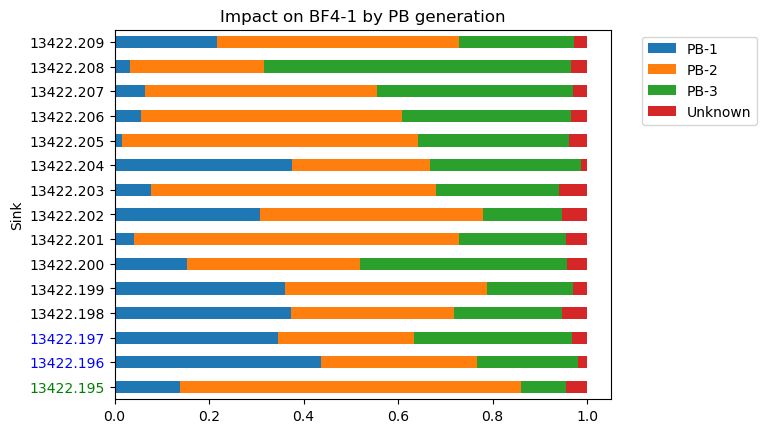

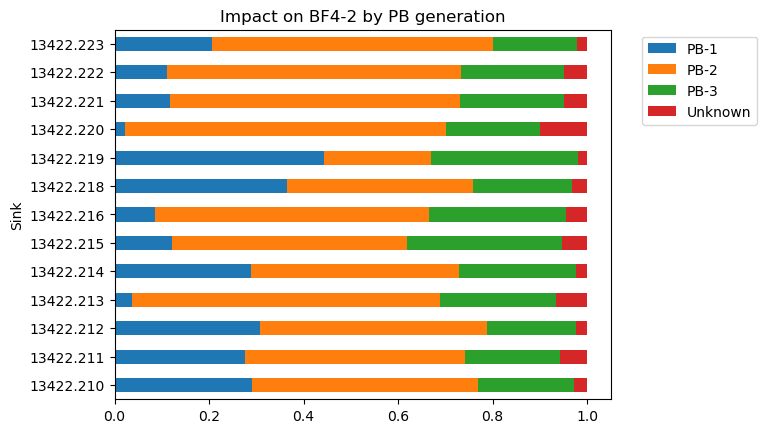

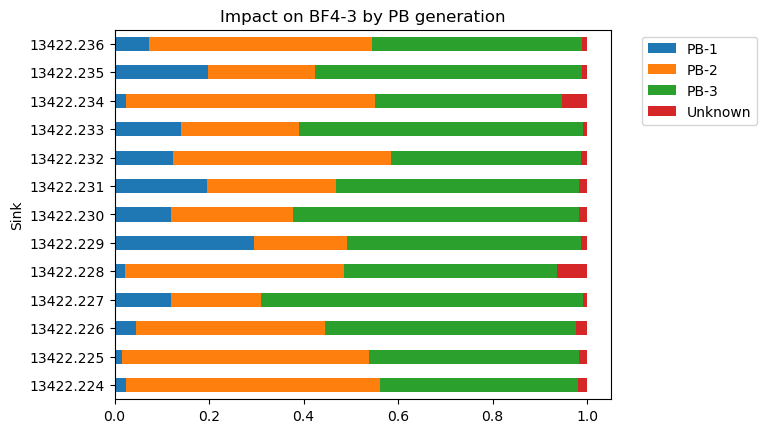

In [256]:
%matplotlib inline
for i,group in enumerate([PB_BF4_1_source_tracking, PB_BF4_2_source_tracking, PB_BF4_3_source_tracking], 1):
    ax= group["results"].transpose().plot.barh(stacked=True)
    if i == 1:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F4-19"):
                tick.set_color('green')
            elif cage_ID in ("F4-20"):
                tick.set_color('blue')
            elif cage_ID in ("F4-21"):
                tick.set_color('red')
            elif cage_ID in ("F4-22"):
                tick.set_color('magenta')
            elif cage_ID in ("F4-23"):
                tick.set_color('teal')
            else:
                tick.set_color('black')
    elif i==2:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F4-24"):
                tick.set_color('green')
            elif cage_ID in ("F4-25"):
                tick.set_color('blue')
            elif cage_ID in ("F4-26"):
                tick.set_color('red')
            elif cage_ID in ("F4-27"):
                tick.set_color('magenta')
            else:
                tick.set_color('black')
    else:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F4-28"):
                tick.set_color('green')
            elif cage_ID in ("F4-29"):
                tick.set_color('blue')
            elif cage_ID in ("F4-30"):
                tick.set_color('red')
            elif cage_ID in ("F4-31"):
                tick.set_color('magenta')
            else:
                tick.set_color('black')
    plt.title(f'Impact on BF4-{i} by PB generation')
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2)
    plt.savefig(work_dir + "/gut_C57B_source_tracker_PB-F4%s.png" %i, transparent=False, bbox_inches='tight')

###### F5

In [257]:
for sink_group in ["BF5-1","BF5-2"]:
    meta[meta['genotype'].isin(["BALB/c"])]
    conditions = (
        (meta["cage_group"] == "PB-1") | (meta["cage_group"] == "PB-2") | (meta["cage_group"] == "PB-3"),
        meta["cage_group"] == sink_group
    )
    values = ["Source", "Sink"]
    column_name ="source_sink_PB-%s" % str(sink_group)
    meta[column_name] = np.select(conditions, values, "None")

In [258]:
PB_BF5_1_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_PB-BF5-1",
    dry=False,
    wait=True
    )
PB_BF5_2_source_tracking = sourcetracker2(
    mice_no_comp_gut, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_PB-BF5-2",
    dry=False,
    wait=True
    )

Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_xz9ap2y6', cachefile is '.anacache/cdded2cc5a70180729f87b2b596dd203.sourcetracker2'. 
Waiting for slurm-cluster job 19280827 to complete: ........................... finished. Was removed.
Reduced to 309 samples (feature-table had 309, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_uf67texr', cachefile is '.anacache/829fb8a1e627c2ac1ad289cee87ef08d.sourcetracker2'. 
Waiting for slurm-cluster job 19280831 to complete: ........................... finished. Was removed.


In [259]:
meta[meta["cage_group"].isin(["BF5-2"])]["cage_id"]

sample_name
13422.271        F5-5
13422.271skin    F5-5
13422.272        F5-5
13422.272skin    F5-5
13422.273        F5-6
13422.273skin    F5-6
13422.274        F5-7
13422.274skin    F5-7
13422.275        F5-7
13422.275skin    F5-7
13422.276        F5-7
13422.276skin    F5-7
Name: cage_id, dtype: object

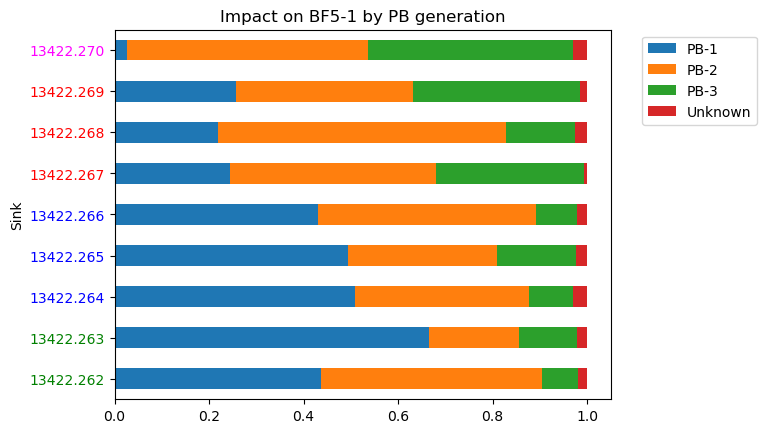

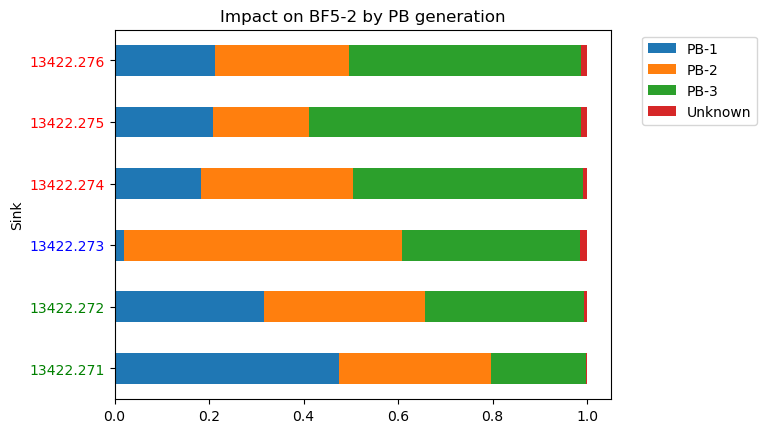

In [260]:
%matplotlib inline
for i,group in enumerate([PB_BF5_1_source_tracking, PB_BF5_2_source_tracking], 1):
    ax= group["results"].transpose().plot.barh(stacked=True)
    if i == 1:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F5-1"):
                tick.set_color('green')
            elif cage_ID in ("F5-2"):
                tick.set_color('blue')
            elif cage_ID in ("F5-3"):
                tick.set_color('red')
            elif cage_ID in ("F5-4"):
                tick.set_color('magenta')
            else:
                tick.set_color('black')
    else:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F5-5"):
                tick.set_color('green')
            elif cage_ID in ("F5-6"):
                tick.set_color('blue')
            elif cage_ID in ("F5-7"):
                tick.set_color('red')
            else:
                tick.set_color('black')
    plt.title(f'Impact on BF5-{i} by PB generation')
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2)
    plt.savefig(work_dir + "/gut_C57B_source_tracker_PB-F5%s.png" %i, transparent=False, bbox_inches='tight')

### Sebum

In [186]:
rarefied_sebum = biom2pandas(work_dir + "/rarefied-filtered-sebum-table_export/feature-table.biom").fillna(0)

#### BALB/c
##### Impact of BF1 cage groups on BF2 cage groups

In [187]:
BF1_2_1_source_tracking_sebum = sourcetracker2(
    rarefied_sebum, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_BF1-BF2-1",
    dry=False,
    wait=True
    )
BF1_2_2_source_tracking_sebum = sourcetracker2(
    rarefied_sebum, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_BF1-BF2-2",
    dry=False,
    wait=True
    )

Reduced to 282 samples (feature-table had 282, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_f_y1v39n', cachefile is '.anacache/d6027c071a142aa37c81c5533d4ab3bc.sourcetracker2'. 
Waiting for slurm-cluster job 3472498 to complete: ....... finished. Was removed.
Reduced to 282 samples (feature-table had 282, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_c5c52uaw', cachefile is '.anacache/6a15a297264ff3ea955f3a4ad767969c.sourcetracker2'. 
Waiting for slurm-cluster job 3472499 to complete: ........ finished. Was removed.


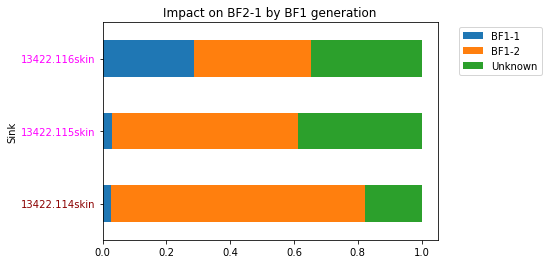

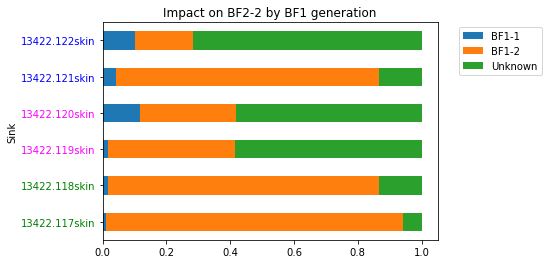

In [188]:
for i,group in enumerate([BF1_2_1_source_tracking_sebum, BF1_2_2_source_tracking_sebum], 1):
    ax= group["results"].transpose().plot.barh(stacked=True)
    if i == 1:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F2-17"):
                tick.set_color('green')
            elif cage_ID in ("F2-18"):
                tick.set_color('blue')
            elif cage_ID in ("F2-19"):
                tick.set_color('darkred')
            elif cage_ID in ("F2-20"):
                tick.set_color('magenta')
            else:
                tick.set_color('black')
        
    else:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F2-21"):
                tick.set_color('green')
            elif cage_ID in ("F2-22"):
                tick.set_color('blue')
            elif cage_ID in ("F2-23"):
                tick.set_color('darkred')
            elif cage_ID in ("F2-24"):
                tick.set_color('magenta')
            elif cage_ID in ("F2-25"):
                tick.set_color('teal')
            else:
                tick.set_color('black')
    plt.title(f'Impact on BF2-{i} by BF1 generation')
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2)

##### Impact of BF2 cage groups on BF3 cage groups

In [189]:
BF2_3_1_source_tracking_sebum = sourcetracker2(
    rarefied_sebum, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_BF2-BF3-1",
    dry=False,
    wait=True
)

BF2_3_2_source_tracking_sebum = sourcetracker2(
    rarefied_sebum, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_BF2-BF3-2",
    dry=False,
    wait=True
)

BF2_3_3_source_tracking_sebum = sourcetracker2(
    rarefied_sebum, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_BF2-BF3-3",
    dry=False,
    wait=True
)

Reduced to 282 samples (feature-table had 282, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_8wmd0yk7', cachefile is '.anacache/efe70c36c11483983c8e163d4bd2ec9b.sourcetracker2'. 
Waiting for slurm-cluster job 3472501 to complete: ...... finished. Was removed.
Reduced to 282 samples (feature-table had 282, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_hfa59kue', cachefile is '.anacache/ffdd4a2af276184e7f9b203f251be198.sourcetracker2'. 
Waiting for slurm-cluster job 3472502 to complete: ....... finished. Was removed.
Reduced to 282 samples (feature-table had 282, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_3byhnn8h', cachefile is '.anacache/f70b213c18053fad13066092e1511230.sourcetracker2'. 
Waiting for slurm-cluster job 3472505 to complete: ........ finished. Was removed.


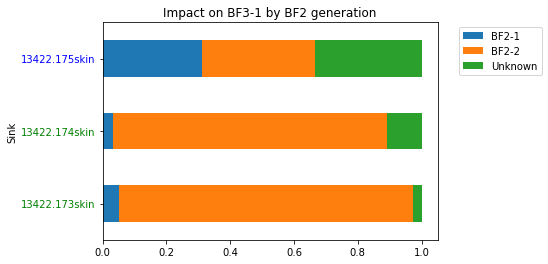

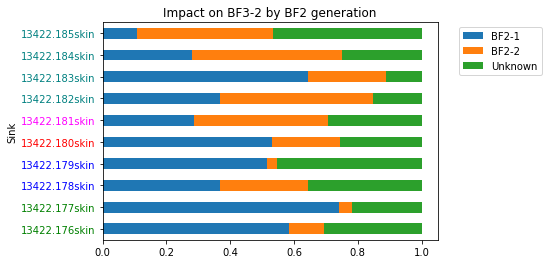

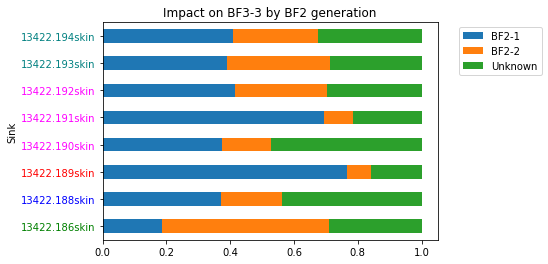

In [190]:
for i,group in enumerate([BF2_3_1_source_tracking_sebum, BF2_3_2_source_tracking_sebum, BF2_3_3_source_tracking_sebum], 1):
    ax= group["results"].transpose().plot.barh(stacked=True)
    if i == 1:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F3-21"):
                tick.set_color('green')
            elif cage_ID in ("F3-22"):
                tick.set_color('blue')
            else:
                tick.set_color('black')
    elif i==2:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F3-23"):
                tick.set_color('green')
            elif cage_ID in ("F3-24"):
                tick.set_color('blue')
            elif cage_ID in ("F3-25"):
                tick.set_color('red')
            elif cage_ID in ("F3-26"):
                tick.set_color('magenta')
            elif cage_ID in ("F3-27"):
                tick.set_color('teal')
            else:
                tick.set_color('black')       
    else:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F3-28"):
                tick.set_color('green')
            elif cage_ID in ("F3-29"):
                tick.set_color('blue')
            elif cage_ID in ("F3-30"):
                tick.set_color('red')
            elif cage_ID in ("F3-31"):
                tick.set_color('magenta')
            elif cage_ID in ("F3-32"):
                tick.set_color('teal')
            else:
                tick.set_color('black')
    plt.title(f'Impact on BF3-{i} by BF2 generation')
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2)

##### Impact of BF3 cage groups on BF4 cage groups

In [191]:
BF3_4_1_source_tracking_sebum = sourcetracker2(
    rarefied_sebum, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_BF3-BF4-1",
    dry=False,
    wait=True
)

BF3_4_2_source_tracking_sebum = sourcetracker2(
    rarefied_sebum, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_BF3-BF4-2",
    dry=False,
    wait=True
)

BF3_4_3_source_tracking_sebum = sourcetracker2(
    rarefied_sebum, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_BF3-BF4-3",
    dry=False,
    wait=True
)

Reduced to 282 samples (feature-table had 282, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_eo2mdim8', cachefile is '.anacache/e506a97ddd0b804866ce26605f766fac.sourcetracker2'. 
Waiting for slurm-cluster job 3472507 to complete: ...... finished. Was removed.
Reduced to 282 samples (feature-table had 282, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2__hctd7b1', cachefile is '.anacache/a6d412e5e9ddaf3efa57a39b0a8572a0.sourcetracker2'. 
Waiting for slurm-cluster job 3472510 to complete: ....... finished. Was removed.
Reduced to 282 samples (feature-table had 282, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_m1emqr_9', cachefile is '.anacache/e49cc7b39ffa8296cac06c6f3743563e.sourcetracker2'. 
Waiting for slurm-cluster job 3472512 to complete: ........ finished. Was removed.


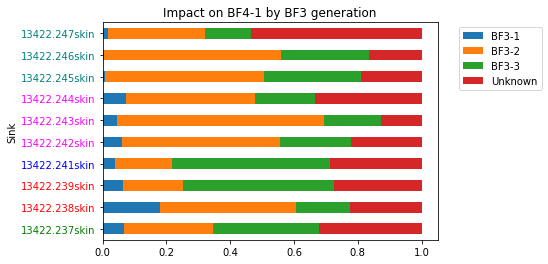

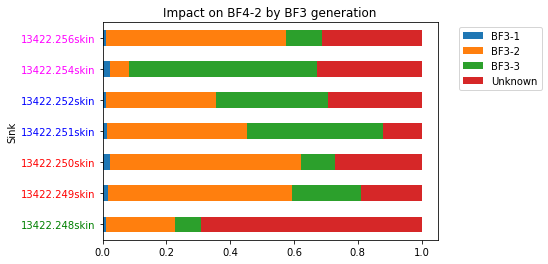

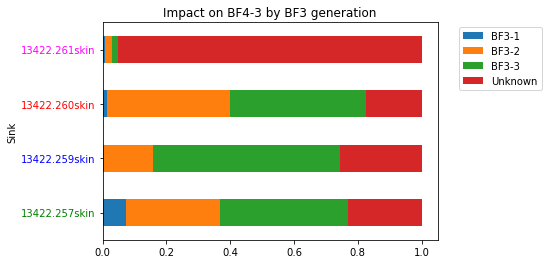

In [192]:
for i,group in enumerate([BF3_4_1_source_tracking_sebum, BF3_4_2_source_tracking_sebum, BF3_4_3_source_tracking_sebum], 1):
    ax= group["results"].transpose().plot.barh(stacked=True)
    if i == 1:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F4-19"):
                tick.set_color('green')
            elif cage_ID in ("F4-20"):
                tick.set_color('blue')
            elif cage_ID in ("F4-21"):
                tick.set_color('red')
            elif cage_ID in ("F4-22"):
                tick.set_color('magenta')
            elif cage_ID in ("F4-23"):
                tick.set_color('teal')
            else:
                tick.set_color('black')
    elif i==2:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F4-24"):
                tick.set_color('green')
            elif cage_ID in ("F4-25"):
                tick.set_color('blue')
            elif cage_ID in ("F4-26"):
                tick.set_color('red')
            elif cage_ID in ("F4-27"):
                tick.set_color('magenta')
            else:
                tick.set_color('black')       
    else:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F4-28"):
                tick.set_color('green')
            elif cage_ID in ("F4-29"):
                tick.set_color('blue')
            elif cage_ID in ("F4-30"):
                tick.set_color('red')
            elif cage_ID in ("F4-31"):
                tick.set_color('magenta')
            else:
                tick.set_color('black')
    plt.title(f'Impact on BF4-{i} by BF3 generation')
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2)

##### Impact of BF4 cage groups on BF5 cage groups

In [193]:
BF4_5_1_source_tracking_sebum = sourcetracker2(
    rarefied_sebum, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_BF4-BF5-1",
    dry=False,
    wait=True
)

BF4_5_2_source_tracking_sebum = sourcetracker2(
    rarefied_sebum, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_BF4-BF5-2",
    dry=False,
    wait=True
)

BF4_5_3_source_tracking_sebum = sourcetracker2(
    rarefied_sebum, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_BF4-BF5-3",
    dry=False,
    wait=True
)

Reduced to 282 samples (feature-table had 282, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_hfq__fs7', cachefile is '.anacache/f71bf7df341d9c529a840b11bb5772fa.sourcetracker2'. 
Waiting for slurm-cluster job 3472513 to complete: ...... finished. Was removed.
Reduced to 282 samples (feature-table had 282, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_xdeylwsd', cachefile is '.anacache/8de25c3717c01ed5b6deff8e637a446b.sourcetracker2'. 
Waiting for slurm-cluster job 3472515 to complete: ....... finished. Was removed.
Reduced to 282 samples (feature-table had 282, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_4ztz7ab9', cachefile is '.anacache/b33f4a6eac0cc3c9cdb0a710e9774d4c.sourcetracker2'. 
Waiting for slurm-cluster job 3472518 to complete: ....... finished. Was removed.


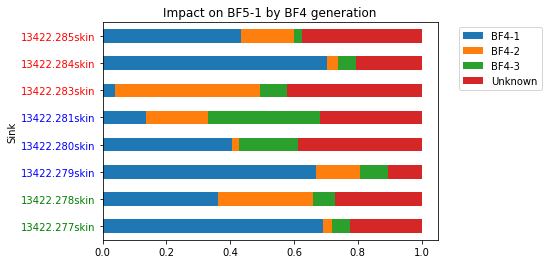

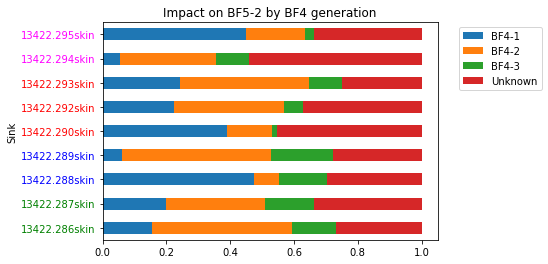

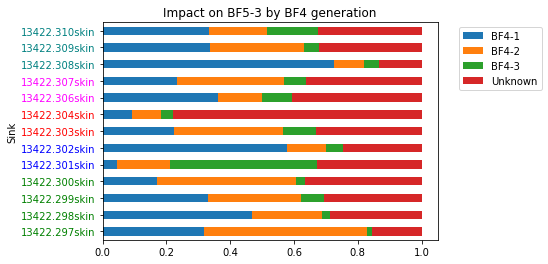

In [194]:
for i,group in enumerate([BF4_5_1_source_tracking_sebum, BF4_5_2_source_tracking_sebum, BF4_5_3_source_tracking_sebum], 1):
    ax= group["results"].transpose().plot.barh(stacked=True)
    if i == 1:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F5-8"):
                tick.set_color('green')
            elif cage_ID in ("F5-9"):
                tick.set_color('blue')
            elif cage_ID in ("F5-10"):
                tick.set_color('red')
            else:
                tick.set_color('black')
    elif i==2:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F5-11"):
                tick.set_color('green')
            elif cage_ID in ("F5-12"):
                tick.set_color('blue')
            elif cage_ID in ("F5-13"):
                tick.set_color('red')
            elif cage_ID in ("F5-14"):
                tick.set_color('magenta')
            else:
                tick.set_color('black')       
    else:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F5-15"):
                tick.set_color('green')
            elif cage_ID in ("F5-16"):
                tick.set_color('blue')
            elif cage_ID in ("F5-17"):
                tick.set_color('red')
            elif cage_ID in ("F5-18"):
                tick.set_color('magenta')
            elif cage_ID in ("F5-19"):
                tick.set_color('teal')
            else:
                tick.set_color('black')
    plt.title(f'Impact on BF5-{i} by BF4 generation')
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2)

#### C57BL6/J
##### Impact of BF1 cage groups on BF2 cage groups

In [195]:
CF1_2_1_source_tracking_sebum = sourcetracker2(
    rarefied_sebum, #FeatureTaCle
    meta,
    col_envname="cage_group",
    col_type="source_sink_CF1-CF2-1",
    dry=False,
    wait=True
    )
CF1_2_2_source_tracking_sebum = sourcetracker2(
    rarefied_sebum, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_CF1-CF2-2",
    dry=False,
    wait=True
    )
CF1_2_3_source_tracking_sebum = sourcetracker2(
    rarefied_sebum, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_CF1-CF2-3",
    dry=False,
    wait=True
    )

Reduced to 282 samples (feature-table had 282, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_rb6gcrpz', cachefile is '.anacache/0710072fb7ae1ca2a261b24e711ea0fe.sourcetracker2'. 
Waiting for slurm-cluster job 3472522 to complete: ....... finished. Was removed.
Reduced to 282 samples (feature-table had 282, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_riq9kpz1', cachefile is '.anacache/42d83ef46367fea5d10dd08c5d5df1f1.sourcetracker2'. 
Waiting for slurm-cluster job 3472525 to complete: ....... finished. Was removed.
Reduced to 282 samples (feature-table had 282, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_1ulhcmcx', cachefile is '.anacache/47543557ed09fe0a4a71c7037d68e8f9.sourcetracker2'. 
Waiting for slurm-cluster job 3472527 to complete: ....... finished. Was removed.


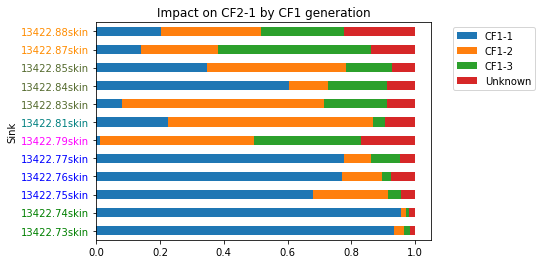

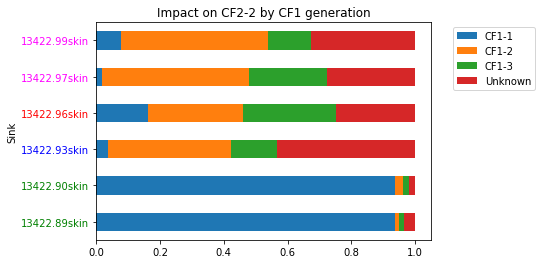

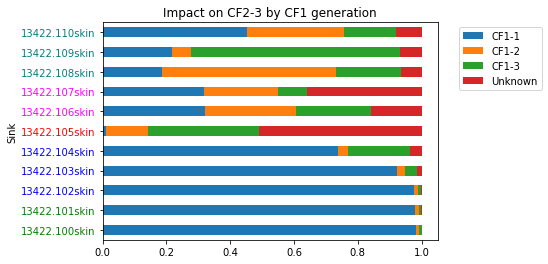

In [196]:
for i,group in enumerate([CF1_2_1_source_tracking_sebum, CF1_2_2_source_tracking_sebum, CF1_2_3_source_tracking_sebum], 1):
    ax= group["results"].transpose().plot.barh(stacked=True)
    if i == 1:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F2-1"):
                tick.set_color('green')
            elif cage_ID in ("F2-2"):
                tick.set_color('blue')
            elif cage_ID in ("F2-3"):
                tick.set_color('red')
            elif cage_ID in ("F2-4"):
                tick.set_color('magenta')
            elif cage_ID in ("F2-5"):
                tick.set_color('teal')
            elif cage_ID in ("F2-6"):
                tick.set_color('darkolivegreen')
            elif cage_ID in ("F2-7"):
                tick.set_color('darkorange')
            else:
                tick.set_color('black')
    elif i==2:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F2-8"):
                tick.set_color('green')
            elif cage_ID in ("F2-9"):
                tick.set_color('blue')
            elif cage_ID in ("F2-10"):
                tick.set_color('red')
            elif cage_ID in ("F2-11"):
                tick.set_color('magenta')
            else:
                tick.set_color('black')       
    else:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F2-12"):
                tick.set_color('green')
            elif cage_ID in ("F2-13"):
                tick.set_color('blue')
            elif cage_ID in ("F2-14"):
                tick.set_color('red')
            elif cage_ID in ("F2-15"):
                tick.set_color('magenta')
            elif cage_ID in ("F2-16"):
                tick.set_color('teal')
            else:
                tick.set_color('black')
    plt.title(f'Impact on CF2-{i} by CF1 generation')
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2)

##### Impact of CF2 cage groups on CF3 cage groups

In [197]:
CF2_3_1_source_tracking_sebum = sourcetracker2(
    rarefied_sebum, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_CF2-CF3-1",
    dry=False,
    wait=True
)

CF2_3_2_source_tracking_sebum = sourcetracker2(
    rarefied_sebum, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_CF2-CF3-2",
    dry=False,
    wait=True
)

CF2_3_3_source_tracking_sebum = sourcetracker2(
    rarefied_sebum, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_CF2-CF3-3",
    dry=False,
    wait=True
)

Reduced to 282 samples (feature-table had 282, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_iub8vafl', cachefile is '.anacache/20f02a79e240e86735efd362040b41f8.sourcetracker2'. 
Waiting for slurm-cluster job 3472531 to complete: ....... finished. Was removed.
Reduced to 282 samples (feature-table had 282, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_vvsifk0g', cachefile is '.anacache/2b239601a2906b8d80dbe079fe17e8ad.sourcetracker2'. 
Waiting for slurm-cluster job 3472535 to complete: ....... finished. Was removed.
Reduced to 282 samples (feature-table had 282, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_27sbq335', cachefile is '.anacache/f588fd4ddd69db5364bb34d858ec8eb1.sourcetracker2'. 
Waiting for slurm-cluster job 3472539 to complete: ....... finished. Was removed.


In [198]:
meta[meta['cage_group'].isin(['CF3-1'])]['cage_id'].value_counts()

F3-6    8
F3-4    8
F3-5    6
F3-3    6
F3-1    4
F3-2    2
Name: cage_id, dtype: int64

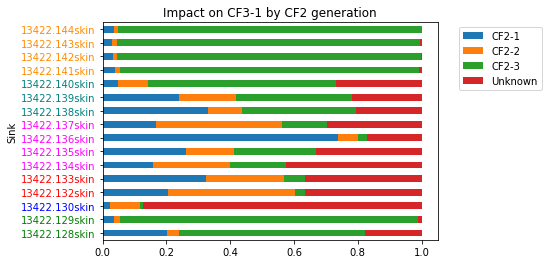

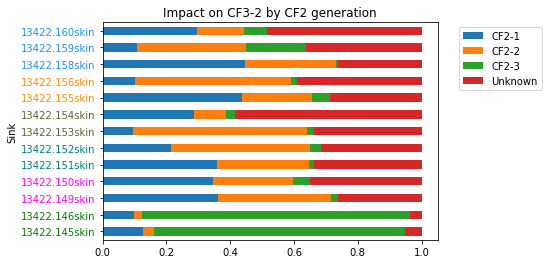

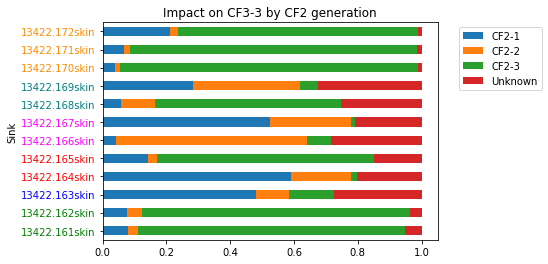

In [199]:
for i,group in enumerate([CF2_3_1_source_tracking_sebum, CF2_3_2_source_tracking_sebum, CF2_3_3_source_tracking_sebum], 1):
    ax= group["results"].transpose().plot.barh(stacked=True)
    if i == 1:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F3-1"):
                tick.set_color('green')
            elif cage_ID in ("F3-2"):
                tick.set_color('blue')
            elif cage_ID in ("F3-3"):
                tick.set_color('red')
            elif cage_ID in ("F3-4"):
                tick.set_color('magenta')
            elif cage_ID in ("F3-5"):
                tick.set_color('teal')
            elif cage_ID in ("F3-6"):
                tick.set_color('darkorange')
            else:
                tick.set_color('black')
    elif i==2:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F3-7"):
                tick.set_color('green')
            elif cage_ID in ("F3-8"):
                tick.set_color('blue')
            elif cage_ID in ("F3-9"):
                tick.set_color('red')
            elif cage_ID in ("F3-10"):
                tick.set_color('magenta')
            elif cage_ID in ("F3-11"):
                tick.set_color('teal')
            elif cage_ID in ("F3-12"):
                tick.set_color('darkolivegreen')
            elif cage_ID in ("F3-13"):
                tick.set_color('darkorange')
            elif cage_ID in ("F3-14"):
                tick.set_color('dodgerblue')
            else:
                tick.set_color('black')       
    else:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F3-15"):
                tick.set_color('green')
            elif cage_ID in ("F3-16"):
                tick.set_color('blue')
            elif cage_ID in ("F3-17"):
                tick.set_color('red')
            elif cage_ID in ("F3-18"):
                tick.set_color('magenta')
            elif cage_ID in ("F3-19"):
                tick.set_color('teal')
            elif cage_ID in ("F3-20"):
                tick.set_color('darkorange')
            else:
                tick.set_color('black')
    plt.title(f'Impact on CF3-{i} by CF2 generation')
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2)

##### Impact of CF3 cage groups on CF4 cage groups

In [200]:
CF3_4_1_source_tracking_sebum = sourcetracker2(
    rarefied_sebum, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_CF3-CF4-1",
    dry=False,
    wait=True
)

CF3_4_2_source_tracking_sebum = sourcetracker2(
    rarefied_sebum, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_CF3-CF4-2",
    dry=False,
    wait=True
)

CF3_4_3_source_tracking_sebum = sourcetracker2(
    rarefied_sebum, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_CF3-CF4-3",
    dry=False,
    wait=True
)

Reduced to 282 samples (feature-table had 282, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_mn74eaom', cachefile is '.anacache/6c9581fbdb9168ce1a75f13adca063d8.sourcetracker2'. 
Waiting for slurm-cluster job 3472542 to complete: ...... finished. Was removed.
Reduced to 282 samples (feature-table had 282, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_lsu7tnzv', cachefile is '.anacache/660e84a37a35b2ccf7806709237705a5.sourcetracker2'. 
Waiting for slurm-cluster job 3472546 to complete: ........ finished. Was removed.
Reduced to 282 samples (feature-table had 282, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_paz_luw0', cachefile is '.anacache/ef8654d7a6765155c37aa59d5a0f40f2.sourcetracker2'. 
Waiting for slurm-cluster job 3472550 to complete: ....... finished. Was removed.


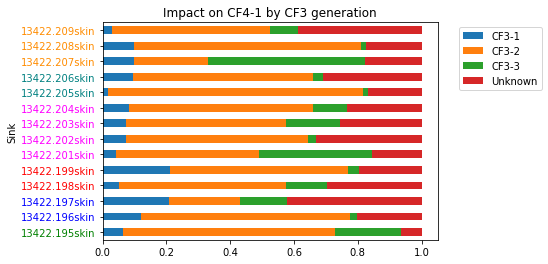

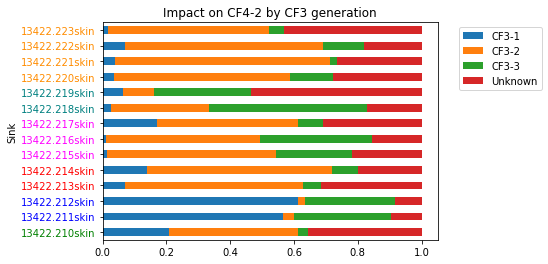

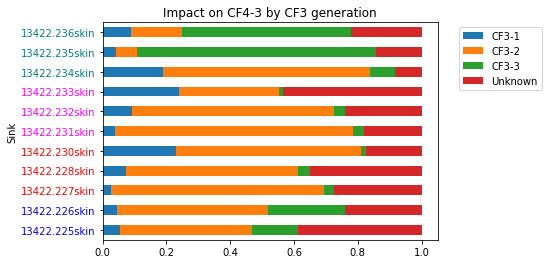

In [201]:
for i,group in enumerate([CF3_4_1_source_tracking_sebum, CF3_4_2_source_tracking_sebum, CF3_4_3_source_tracking_sebum], 1):
    ax= group["results"].transpose().plot.barh(stacked=True)
    if i == 1:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F4-1"):
                tick.set_color('green')
            elif cage_ID in ("F4-2"):
                tick.set_color('blue')
            elif cage_ID in ("F4-3"):
                tick.set_color('red')
            elif cage_ID in ("F4-4"):
                tick.set_color('magenta')
            elif cage_ID in ("F4-5"):
                tick.set_color('teal')
            elif cage_ID in ("F4-6"):
                tick.set_color('darkorange')
            else:
                tick.set_color('black')
    elif i==2:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F4-8"):
                tick.set_color('green')
            elif cage_ID in ("F4-9"):
                tick.set_color('blue')
            elif cage_ID in ("F4-10"):
                tick.set_color('red')
            elif cage_ID in ("F4-11"):
                tick.set_color('magenta')
            elif cage_ID in ("F4-12"):
                tick.set_color('teal')
            elif cage_ID in ("F4-13"):
                tick.set_color('darkorange')
            else:
                tick.set_color('black')       
    else:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F4-14"):
                tick.set_color('green')
            elif cage_ID in ("F4-15"):
                tick.set_color('blue')
            elif cage_ID in ("F4-16"):
                tick.set_color('red')
            elif cage_ID in ("F4-17"):
                tick.set_color('magenta')
            elif cage_ID in ("F4-18"):
                tick.set_color('teal')
            else:
                tick.set_color('black')
    plt.title(f'Impact on CF4-{i} by CF3 generation')
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2)

##### Impact of CF4 cage groups on CF5 cage groups

In [202]:
CF4_5_1_source_tracking_sebum = sourcetracker2(
    rarefied_sebum, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_CF4-CF5-1",
    dry=False,
    wait=True
)

CF4_5_2_source_tracking_sebum = sourcetracker2(
    rarefied_sebum, #FeatureTable
    meta,
    col_envname="cage_group",
    col_type="source_sink_CF4-CF5-2",
    dry=False,
    wait=True
)

Reduced to 282 samples (feature-table had 282, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_mjzhuh10', cachefile is '.anacache/7961d30fa32980b75ab2f7cda34da80d.sourcetracker2'. 
Waiting for slurm-cluster job 3472553 to complete: ...... finished. Was removed.
Reduced to 282 samples (feature-table had 282, metadata had 780 samples)
Working directory is '/homes/arehm/TMP/ana_sourcetracker2_fkk167gs', cachefile is '.anacache/acf96e316522fadf26d8302e931b67f3.sourcetracker2'. 
Waiting for slurm-cluster job 3472555 to complete: ....... finished. Was removed.


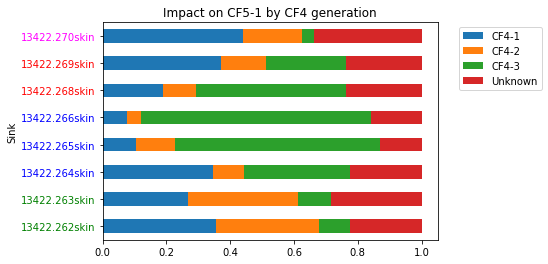

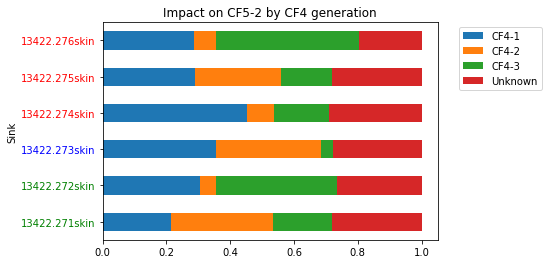

In [203]:
for i,group in enumerate([CF4_5_1_source_tracking_sebum, CF4_5_2_source_tracking_sebum], 1):
    ax= group["results"].transpose().plot.barh(stacked=True)
    if i == 1:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F5-1"):
                tick.set_color('green')
            elif cage_ID in ("F5-2"):
                tick.set_color('blue')
            elif cage_ID in ("F5-3"):
                tick.set_color('red')
            elif cage_ID in ("F5-4"):
                tick.set_color('magenta')
            else:
                tick.set_color('black')  
    else:
        for tick in ax.get_yticklabels():
            cage_ID = meta.loc[tick.get_text()]["cage_id"]
            if cage_ID in ("F5-5"):
                tick.set_color('green')
            elif cage_ID in ("F5-6"):
                tick.set_color('blue')
            elif cage_ID in ("F5-7"):
                tick.set_color('red')
            else:
                tick.set_color('black')
    plt.title(f'Impact on CF5-{i} by CF4 generation')
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2)